# Visualize *in situ* observations and  numerical results over one year

Reference: https://github.com/poplarShift/ice-edge/blob/master/iceedge_analysis.ipynb

# First, load libraries

In [1]:
import datetime
import netcdf_tools
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.colors
import numpy as np
import pandas as pd
import pathlib
import plotly.graph_objects as go
import plotly.express as px
import scipy
import scipy.interpolate
import scipy.signal
import statsmodels
import statsmodels.formula.api as smf
import statsmodels.nonparametric
import statsmodels.nonparametric.smoothers_lowess
import TaylorDiagramMBG
import vstats

plt.close("all")

In [2]:
################################################################################
pd.set_option('display.max_rows', None)

# Select year

In [3]:
years=range(1,11)
nbyears=len(years)
iyeartempo=nbyears
first_year=np.arange(0,365)
last_year=np.arange(365*(nbyears-1)+0,365*(nbyears-1)+365)
array1d_iT1y_iT=last_year
first_year366=np.arange(0,366) # first year for heatmaps

# Grid

drF is the r cell face separation, meaning the thickness of each depth layer (in m)

it corresponds to delR on https://mitgcm.readthedocs.io/en/latest/getting_started/getting_started.html#grid

In [4]:
gridfile='grid.t001.nc';
drF=netcdf_tools.read_netcdf(gridfile,'drF')

RC is the r coordiante of cell center (in m)

In [5]:
RC=netcdf_tools.read_netcdf(gridfile,'RC')

RF is the r coordinate of cell interface (in m)

In [6]:
RF=netcdf_tools.read_netcdf(gridfile,'RF')

In [7]:
RF_above81=RF[RF>-82]

# Observations

Create directory validation if it doesn't exit.

In [8]:
pathlib.Path("validation").mkdir(parents=True, exist_ok=True)

## Ice concentration

Breakup was on 18 July 2016 (Oziel et al., 2019).

In [9]:
obsice=np.empty(365)
obsice[:]=np.NaN
obsice[0:199]=1
obsice[199]=0

Day of *in situ* sea ice breakup:

In [10]:
iT15_start_obs=next(i for i,v in enumerate(obsice) if v < 0.15)

## Observations: sea ice

The start of the period without observed snow cover was defined as the
start of the melt pond period.
It was on 15 June 2016 (Oziel et al., 2019 in *Elem. Sci. Anth.*).

In [11]:
obs_nosnow=166 # 0-based

Sea ice break-up was on 18 July 2016 (Oziel et al., 2019 in *Elem. Sci. Anth.*).

In [12]:
obs_breakup=199 # 0-based

The sea ice freeze-up occurred after the end of the Qikiqtarjuaq sea ice camp.
The date of the freeze-up was thus estimated from the simulated sea ice concentration from NEMO-LIM3.
It was on 24 November 2016.

In [13]:
ice=np.fromfile('../../gud_1d_35+16/input_noradtrans/input/siarea.nemo.2016.365.32bits.bin',dtype='>f')
# 0-based
sim_freezeup=next(i for i,v in reversed(list(enumerate(ice))) if v < 0.50)
sim_freezeup

328

## Observations: snow and ice thickness

The file Ice thickness from https://www.seanoe.org/data/00487/59892/ contains $in\ situ$ snow and ice thickness at the Green Edge sea ice camps 2015 and 2016 ($67.48^\circ N$, $-63.79^\circ E$). Variable 'sample_thickness_cm_average' is the snow or ice thickness ($cm$).

### Observations: snow and ice thickness: load dataset

In [14]:
def load_thickness():
    fname='../../obs/66407.csv'
    df = (
        pd.read_csv(
            fname,
            dtype={
                'mission': 'string',
                'date': str,
                'date_time': str,
                'latitude': np.float32,
                'longitude': np.float32,
                'sample_type': 'category',
                'sample_thickness_cm_average': np.float32,
                'sample_thickness_cm_sd': np.float32,
                'pi': 'category'
            },
            parse_dates=['date','date_time']
        )
    )
    df['doy']=df['date'].apply(lambda x:x.timetuple().tm_yday)
    df['sample_thickness_m_average']=df['sample_thickness_cm_average'] \
    .apply(lambda x:x/100)
    return df

In [15]:
thickness_df=load_thickness()

### Observations: snow and ice thickness: select

We select the observations of snow thickness at the ice camp 2016.

In [16]:
snow_thickness_df=thickness_df[(thickness_df.mission=='ice_camp_2016') \
                               & (thickness_df.sample_type=='snow')]
# snow_thickness_df[['date','sample_thickness_m_average']]

We select the observations of ice thickness at the ice camp 2016.

In [17]:
ice_thickness_df=thickness_df[(thickness_df.mission=='ice_camp_2016') \
                              & (thickness_df.sample_type=='ice')]

## Nitrate

### Load dataset

In [18]:
def load_nutrients():
    fname='../../obs/66412.csv'
    df = (
        pd.read_csv(
            fname,
            dtype={
                'mission': 'string',
                'date': str,
                'date_time': str,
                'latitude': np.float32,
                'longitude': np.float32,
                'sample_type': 'category',
                'sample_source': 'category',
                'snow_thickness': 'category',
                'code_operation': 'category',
                'station': 'category',
                'station_type': 'category',
                'cast': np.float32,
                'bottle': np.float32,
                'bottom_depth_m': np.float32,
                'target_depth_m': 'string',
                'depth_m': np.float32,
                'filter_type': 'category',
                'quality_flag': 'category',
                'dilution_factor': np.float32,
                'no3_um_l': np.float32,
                'no2_um_l': np.float32,
                'no2_and_no3': np.float32,
                'po4_um_l': np.float32,
                'sioh4_um_l': np.float32,
                'n_ice_samples_ice_camp_2016': np.float32,
                'method': 'category',
                'pi': 'category'
            },
            parse_dates=['date','date_time']
        )
        .rename(
            columns=dict(
                depth_m='depth',
                no3_um_l='no3',
                po4_um_l='po4',
                sioh4_um_l='sioh4'
            )
        )
    )
    df['depth']=-df['depth'] # negative depths
    df['doy']=df['date'].apply(lambda x:x.timetuple().tm_yday)
    return df

In [19]:
nutrients_df=load_nutrients()

### Select

We select the observations of nitrate at the ice camp 2016 in the water column made with a GFF filter.

In [20]:
nutrients_df=nutrients_df[(nutrients_df.mission=='ice_camp_2016') \
              & (nutrients_df.sample_type=='water') \
             & (nutrients_df.filter_type=='gff')]

Find duplicates.

In [21]:
g=nutrients_df.groupby('doy')['depth'].value_counts()
g.where(g>1).dropna()

Series([], Name: depth, dtype: float64)

No duplicates.

### Observations of nitrate: Plot on observations grid

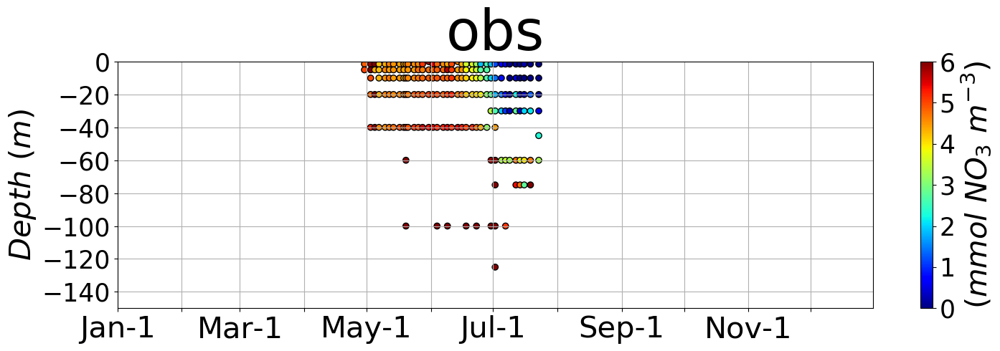

In [22]:
with plt.style.context('noice.mplstyle'):
    locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
    labels=('Jan-1','','Mar-1','','May-1','',
            'Jul-1','','Sep-1','','Nov-1','')

    plt.figure(figsize=(15,5))
    ax = plt.gca()
    hc=ax.scatter(nutrients_df['doy']-1,
                  nutrients_df['depth'],
                  c=nutrients_df['no3'],
                  cmap='jet',
                  vmin=0,
                  vmax=6,
                  s=None,
                  edgecolor='k'
                 )
    ax.set_title('obs')
    ax.set_xticklabels([])
    ax.set_ylabel('$Depth\ (m)$')
    ax.set_xlim(first_year[0],first_year[-1])
    ax.set_ylim(-150,0)
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    cbar=plt.colorbar(hc)
    cbar.set_label('$(mmol\ NO_3\ m^{-3})$')
    plt.tight_layout()
    plt.savefig('validation/GEic2016.m3.NO3.obsgrid.png')

### Observations of nitrate: Mean nitrate (0-40m)

$in\ mmol\ NO_3\ m^{-3}$

In [23]:
depths_case1 =np.array([-0,   -1.5, -5,   -10,  -20,    -40])
weights_case1=np.array([ 0.75, 2.5, 4.25,  7.5,  15,     10])
depths_case2 =np.array([      -1.5, -5,   -10,  -20,    -40])
weights_case2=np.array([       3.75, 4.25, 7.5,  15,     10])
depths_case3 =np.array([-0,   -1.5,       -10,  -20,-30,   -60])
weights_case3=np.array([ 0.75, 5,          9.25, 10, 15])
depths_case4 =np.array([-0.5, -1.5,       -10,  -20,-30,   -60])
weights_case4=np.array([ 1,    5.75,       9.25, 10, 15])
depths_case5 =np.array([      -1.5,       -10,  -20,-30,   -60])
weights_case5=np.array([       5.75,       9.25, 10, 15])

nT=365
array1d_iT_obsmeanno3=np.full(nT,np.NaN)
for iT in np.arange(0,nT):
    obsmeanno3=np.NaN
    no3=[]
    doy=iT+1
    no3_oneday_df=nutrients_df[['depth','no3']][(nutrients_df.doy==doy)]
    depths=no3_oneday_df['depth']
    if set(depths_case1).issubset(set(depths)):
        for depth in depths_case1:
            no3tempo \
            =no3_oneday_df['no3'][(no3_oneday_df.depth==depth)]
            assert no3tempo.size==1
            no3tempo=no3tempo.iat[0]
            no3.append(no3tempo)
        obsmeanno3=np.average(np.array(no3),weights=weights_case1)
    elif set(depths_case2).issubset(set(depths)):
        for depth in depths_case2:
            no3tempo \
            =no3_oneday_df['no3'][(no3_oneday_df.depth==depth)]
            assert no3tempo.size==1
            no3tempo=no3tempo.iat[0]
            no3.append(no3tempo)
        obsmeanno3=np.average(np.array(no3),weights=weights_case2)
    elif set(depths_case3).issubset(set(depths)):
        for depth in depths_case3[0:depths_case3.size-1]:
            no3tempo \
            =no3_oneday_df['no3'][(no3_oneday_df.depth==depth)]
            assert no3tempo.size==1
            no3tempo=no3tempo.iat[0]
            no3.append(no3tempo)
        obsmeanno3=np.average(np.array(no3),weights=weights_case3)
    elif set(depths_case4).issubset(set(depths)):
        for depth in depths_case4[0:depths_case4.size-1]:
            no3tempo \
            =no3_oneday_df['no3'][(no3_oneday_df.depth==depth)]
            assert no3tempo.size==1
            no3tempo=no3tempo.iat[0]
            no3.append(no3tempo)
        obsmeanno3=np.average(np.array(no3),weights=weights_case4)
    elif set(depths_case5).issubset(set(depths)):
        for depth in depths_case5[0:depths_case5.size-1]:
            no3tempo \
            =no3_oneday_df['no3'][(no3_oneday_df.depth==depth)]
            assert no3tempo.size==1
            no3tempo=no3tempo.iat[0]
            no3.append(no3tempo)
        obsmeanno3=np.average(np.array(no3),weights=weights_case5)
    array1d_iT_obsmeanno3[iT]=obsmeanno3

## Silicic acid

### Observations of silicic acid: Plot on observations grid

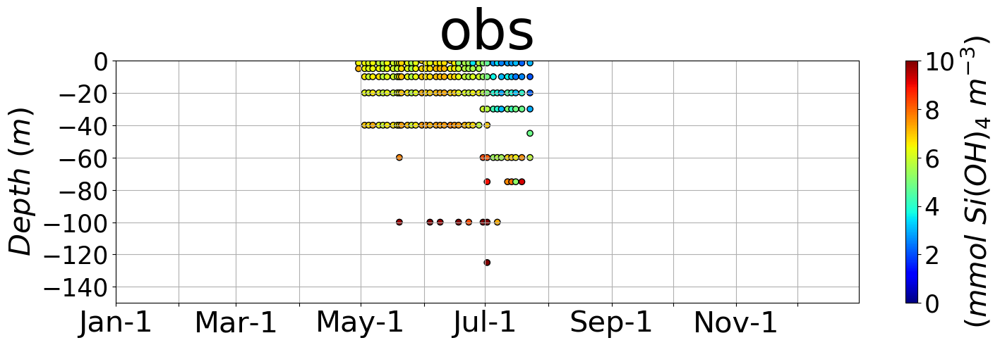

In [24]:
with plt.style.context('noice.mplstyle'):
    locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
    labels=('Jan-1','','Mar-1','','May-1','',
            'Jul-1','','Sep-1','','Nov-1','')

    plt.figure(figsize=(15,5))
    ax = plt.gca()
    hc=ax.scatter(nutrients_df['doy']-1,
                  nutrients_df['depth'],
                  c=nutrients_df['sioh4'],
                  cmap='jet',
                  vmin=0,
                  vmax=10,
                  s=None,
                  edgecolor='k'
                 )
    ax.set_title('obs')
    ax.set_xticklabels([])
    ax.set_ylabel('$Depth\ (m)$')
    ax.set_xlim(first_year[0],first_year[-1])
    ax.set_ylim(-150,0)
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    cbar=plt.colorbar(hc)
    cbar.set_label('$(mmol\ Si{(OH)}_4\ m^{-3})$')
    plt.tight_layout()
    plt.savefig('validation/GEic2016.m3.SiOH4.obsgrid.png')

### Observations of silicic acid: Mean silicic acid (0-40m)

$in\ mmol\ Si{(OH)}_4\ m^{-3}$

In [25]:
depths_case1 =np.array([-0,   -1.5, -5,   -10,  -20,    -40])
weights_case1=np.array([ 0.75, 2.5, 4.25,  7.5,  15,     10])
depths_case2 =np.array([      -1.5, -5,   -10,  -20,    -40])
weights_case2=np.array([       3.75, 4.25, 7.5,  15,     10])
depths_case3 =np.array([-0,   -1.5,       -10,  -20,-30,   -60])
weights_case3=np.array([ 0.75, 5,          9.25, 10, 15])
depths_case4 =np.array([-0.5, -1.5,       -10,  -20,-30,   -60])
weights_case4=np.array([ 1,    5.75,       9.25, 10, 15])
depths_case5 =np.array([      -1.5,       -10,  -20,-30,   -60])
weights_case5=np.array([       5.75,       9.25, 10, 15])

nT=365
array1d_iT_obsmeansioh4=np.full(nT,np.NaN)
for iT in np.arange(0,nT):
    obsmeansioh4=np.NaN
    sioh4=[]
    doy=iT+1
    sioh4_oneday_df=nutrients_df[['depth','sioh4']][(nutrients_df.doy==doy)]
    depths=sioh4_oneday_df['depth']
    if set(depths_case1).issubset(set(depths)):
        for depth in depths_case1:
            sioh4tempo \
            =sioh4_oneday_df['sioh4'][(sioh4_oneday_df.depth==depth)]
            assert sioh4tempo.size==1
            sioh4tempo=sioh4tempo.iat[0]
            sioh4.append(sioh4tempo)
        obsmeansioh4=np.average(np.array(sioh4),weights=weights_case1)
    elif set(depths_case2).issubset(set(depths)):
        for depth in depths_case2:
            sioh4tempo \
            =sioh4_oneday_df['sioh4'][(sioh4_oneday_df.depth==depth)]
            assert sioh4tempo.size==1
            sioh4tempo=sioh4tempo.iat[0]
            sioh4.append(sioh4tempo)
        obsmeansioh4=np.average(np.array(sioh4),weights=weights_case2)
    elif set(depths_case3).issubset(set(depths)):
        for depth in depths_case3[0:depths_case3.size-1]:
            sioh4tempo \
            =sioh4_oneday_df['sioh4'][(sioh4_oneday_df.depth==depth)]
            assert sioh4tempo.size==1
            sioh4tempo=sioh4tempo.iat[0]
            sioh4.append(sioh4tempo)
        obsmeansioh4=np.average(np.array(sioh4),weights=weights_case3)
    elif set(depths_case4).issubset(set(depths)):
        for depth in depths_case4[0:depths_case4.size-1]:
            sioh4tempo \
            =sioh4_oneday_df['sioh4'][(sioh4_oneday_df.depth==depth)]
            assert sioh4tempo.size==1
            sioh4tempo=sioh4tempo.iat[0]
            sioh4.append(sioh4tempo)
        obsmeansioh4=np.average(np.array(sioh4),weights=weights_case4)
    elif set(depths_case5).issubset(set(depths)):
        for depth in depths_case5[0:depths_case5.size-1]:
            sioh4tempo \
            =sioh4_oneday_df['sioh4'][(sioh4_oneday_df.depth==depth)]
            assert sioh4tempo.size==1
            sioh4tempo=sioh4tempo.iat[0]
            sioh4.append(sioh4tempo)
        obsmeansioh4=np.average(np.array(sioh4),weights=weights_case5)
    array1d_iT_obsmeansioh4[iT]=obsmeansioh4

## Phosphate

### Observations of phosphate: Plot on observations grid

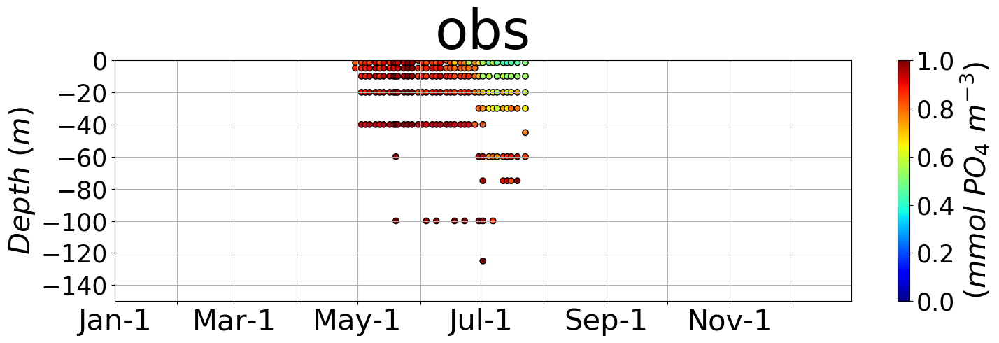

In [26]:
with plt.style.context('noice.mplstyle'):
    locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
    labels=('Jan-1','','Mar-1','','May-1','',
            'Jul-1','','Sep-1','','Nov-1','')

    plt.figure(figsize=(15,5))
    ax = plt.gca()
    hc=ax.scatter(nutrients_df['doy']-1,
                  nutrients_df['depth'],
                  c=nutrients_df['po4'],
                  cmap='jet',
                  vmin=0,
                  vmax=1,
                  s=None,
                  edgecolor='k'
                 )
    ax.set_title('obs')
    ax.set_xticklabels([])
    ax.set_ylabel('$Depth\ (m)$')
    ax.set_xlim(first_year[0],first_year[-1])
    ax.set_ylim(-150,0)
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    cbar=plt.colorbar(hc)
    cbar.set_label('$(mmol\ PO_4\ m^{-3})$')
    plt.tight_layout()
    plt.savefig('validation/GEic2016.m3.PO4.obsgrid.png')

### Observations of phosphate: Mean phosphate (0-40m)

$in\ mmol\ PO_4\ m^{-3}$

In [27]:
depths_case1 =np.array([-0,   -1.5, -5,   -10,  -20,    -40])
weights_case1=np.array([ 0.75, 2.5, 4.25,  7.5,  15,     10])
depths_case2 =np.array([      -1.5, -5,   -10,  -20,    -40])
weights_case2=np.array([       3.75, 4.25, 7.5,  15,     10])
depths_case3 =np.array([-0,   -1.5,       -10,  -20,-30,   -60])
weights_case3=np.array([ 0.75, 5,          9.25, 10, 15])
depths_case4 =np.array([-0.5, -1.5,       -10,  -20,-30,   -60])
weights_case4=np.array([ 1,    5.75,       9.25, 10, 15])
depths_case5 =np.array([      -1.5,       -10,  -20,-30,   -60])
weights_case5=np.array([       5.75,       9.25, 10, 15])

nT=365
array1d_iT_obsmeanpo4=np.full(nT,np.NaN)
for iT in np.arange(0,nT):
    obsmeanpo4=np.NaN
    po4=[]
    doy=iT+1
    po4_oneday_df=nutrients_df[['depth','po4']][(nutrients_df.doy==doy)]
    depths=po4_oneday_df['depth']
    if set(depths_case1).issubset(set(depths)):
        for depth in depths_case1:
            po4tempo \
            =po4_oneday_df['po4'][(po4_oneday_df.depth==depth)]
            assert po4tempo.size==1
            po4tempo=po4tempo.iat[0]
            po4.append(po4tempo)
        obsmeanpo4=np.average(np.array(po4),weights=weights_case1)
    elif set(depths_case2).issubset(set(depths)):
        for depth in depths_case2:
            po4tempo \
            =po4_oneday_df['po4'][(po4_oneday_df.depth==depth)]
            assert po4tempo.size==1
            po4tempo=po4tempo.iat[0]
            po4.append(po4tempo)
        obsmeanpo4=np.average(np.array(po4),weights=weights_case2)
    elif set(depths_case3).issubset(set(depths)):
        for depth in depths_case3[0:depths_case3.size-1]:
            po4tempo \
            =po4_oneday_df['po4'][(po4_oneday_df.depth==depth)]
            assert po4tempo.size==1
            po4tempo=po4tempo.iat[0]
            po4.append(po4tempo)
        obsmeanpo4=np.average(np.array(po4),weights=weights_case3)
    elif set(depths_case4).issubset(set(depths)):
        for depth in depths_case4[0:depths_case4.size-1]:
            po4tempo \
            =po4_oneday_df['po4'][(po4_oneday_df.depth==depth)]
            assert po4tempo.size==1
            po4tempo=po4tempo.iat[0]
            po4.append(po4tempo)
        obsmeanpo4=np.average(np.array(po4),weights=weights_case4)
    elif set(depths_case5).issubset(set(depths)):
        for depth in depths_case5[0:depths_case5.size-1]:
            po4tempo \
            =po4_oneday_df['po4'][(po4_oneday_df.depth==depth)]
            assert po4tempo.size==1
            po4tempo=po4tempo.iat[0]
            po4.append(po4tempo)
        obsmeanpo4=np.average(np.array(po4),weights=weights_case5)
    array1d_iT_obsmeanpo4[iT]=obsmeanpo4

## PAR

### Observations of PAR: Load dataset

In [28]:
def load_par():
    fname='../../obs/66399.csv'
    df = (
        pd.read_csv(
            fname,
            dtype={
                'mission': 'string',
                'station': 'category',
                'date': str,
                'snow_thickness': 'category',
                'depth_m': np.float32,
                'pi': 'category',
                'averaged_par_d_fit_muein_m_2_s_1': np.float32,
                'averaged_par_d_fit_percent_percent': np.float32,
                'averaged_par_d_fit_daily_ein_m_2_day_1': np.float32,
                'averaged_par_d_noon1hloc_ein_m_2_1h_1': np.float32,
                'averaged_par_d_p1h_ein_m_2_1h_1': np.float32,
                'averaged_par_d_p3h_ein_m_2_3h_1': np.float32,
                'averaged_par_d_p24h_ein_m_2_day_1': np.float32,
                'averaged_par_d_p48h_ein_m_2_48h_1': np.float32
            },
            parse_dates=['date']
        )
        .rename(
            columns=dict(
                depth_m='depth',
                averaged_par_d_fit_daily_ein_m_2_day_1='par',
            )
        )
    )
    df['depth']=-df['depth'] # negative depths
    df['doy']=df['date'].apply(lambda x:x.timetuple().tm_yday)
    return df

In [29]:
par_df=load_par()

### Observations of PAR just below surface: Select

In [30]:
par_df=par_df[par_df.mission=='ice_camp_2016']

find negative PAR

In [31]:
par_df['par'][par_df['par']<0]

Series([], Name: par, dtype: float32)

find duplicates

In [32]:
g=par_df.groupby('doy')['depth'].value_counts()
g.where(g>1).dropna()

Series([], Name: depth, dtype: float64)

Observations of PAR just below surface: Plot on observations grid

### Observations of PAR just below surface: calculate

In [33]:
parwater_df=(par_df.dropna(subset=['par'])).copy()
for doy in pd.unique(parwater_df['doy']):
    ice_thickness=-parwater_df.loc[(parwater_df.doy==doy),('depth')].max()
    parwater_df.loc[parwater_df.doy==doy,'depth']\
    =parwater_df.loc[parwater_df.doy==doy,'depth']+ice_thickness

in $\mathrm{ mol\ photons\ m^{-2}\ d^{-1} }$

In [34]:
# parwater_df.loc[parwater_df.depth==0][['date','par']]

in $\mathrm{ \mu mol\ photons\ m^{-2}\ s^{-1} }$

In [35]:
date=parwater_df.loc[parwater_df.depth==0]['date']
par_uEm2s=parwater_df.loc[parwater_df.depth==0]['par']*1E6/86400
# pd.DataFrame({'date':date,
#               'par_uEm2s':par_uEm2s})

The first observation of PAR under sea ice was on 4 May.
The last observation of PAR under sea ice was on 18 July.

In [36]:
first_obs_PAR=124 # 0-based
last_obs_PAR =199 # 0-based

## Chlorophyll a by fluorimetry

### Observations of chlorophyll a by fluorimetry: Load dataset

In [37]:
def load_pigment():
    fname='../../obs/66417.csv'
    df = (
        pd.read_csv(
            fname,
            dtype={
                'mission': 'string',
                'date': str,
                'date_time': str,
                'latitude': np.float32,
                'longitude': np.float32,
                'sample_id': 'string',
                'sample_code': 'string',
                'sample_type': 'category',
                'sample_source': 'category',
                'snow_thickness': 'category',
                'leg': 'category',
                'code_operation': 'category',
                'station': 'category',
                'station_type': 'category',
                'cast': np.float32,
                'bottle': np.float32,
                'target_depth_m': 'string',
                'depth_m': np.float32,
                'pigment': 'category',
                'conc_mg_m2': np.float32,
                'conc_ug_l': np.float32,
                'conc_mg_m3': np.float32,
                'filtered_vol_l': np.float32,
                'vol_after_melt_l': np.float32,
                'ice_added_vol_of_water': np.float32,
                'ice_total_vol_water': np.float32,
                'ice_calculated_vol_ice': np.float32,
                'dilution_factor': np.float32,
                'quality_control_peaks': 'category',
                'nb_core': np.float32,
                'nb_core_9cm_dia': np.float32,
                'core_area_9cm_dia': np.float32,
                'nb_core_14cm_dia': np.float32,
                'core_area_14cm_dia': np.float32,
                'area_m2': np.float32,
                'description_of_sample': 'category',
                'n': np.float32,
                'observations': 'category',
                'method': 'category',
                'pi': 'category'
            },
            parse_dates=['date','date_time']
        )
        .rename(
            columns=dict(
                depth_m='depth',
                conc_ug_l='chlfluo',
                conc_mg_m3='chlHPLC'
            )
        )
    )
    df['depth']=-df['depth'] # negative depths
    df['doy']=df['date'].apply(lambda x:x.timetuple().tm_yday)
    return df

In [38]:
chlfluo_df=load_pigment()

### Observations of chlorophyll a by fluorimetry: Select

We select the observations of chlorophyll a concentrations at the ice camp 2016 measured by fluorimetry.

In [39]:
chlfluo_df=chlfluo_df[(chlfluo_df.mission=='ice_camp_2016') \
              & (chlfluo_df.sample_type=='water') \
             & (chlfluo_df.pigment=='Chlorophyll a') \
             & (chlfluo_df.method=='fluorimetry')]

remove negative chlorophyll a

In [40]:
chlfluo_df['chlfluo'][ chlfluo_df['chlfluo']<0 ]

854   -0.001519
Name: chlfluo, dtype: float32

In [41]:
chlfluo_df=chlfluo_df.drop([854])

find duplicates

In [42]:
g=chlfluo_df.groupby('doy')['depth'].value_counts()
g.where(g>1).dropna()

doy  depth
141  -1.5     2.0
146  -10.0    2.0
Name: depth, dtype: float64

inspect duplicates

In [43]:
doy=141
chlfluo_oneday_df=chlfluo_df[['depth','chlfluo','doy']][(chlfluo_df.doy==doy)]
chlfluo_oneday_df

,depth,chlfluo,doy
530,-1.5,0.091125,141
674,-0.0,0.133650,141
676,-1.5,0.092340,141
678,-5.0,0.091125,141
680,-10.0,0.082620,141
682,-20.0,0.068040,141
684,-40.0,0.057105,141


In [44]:
doy=146
chlfluo_oneday_df=chlfluo_df[['depth','chlfluo','doy']][(chlfluo_df.doy==doy)]
chlfluo_oneday_df

,depth,chlfluo,doy
492,-10.0,0.043862,146
698,-0.0,0.165240,146
700,-1.5,0.153090,146
702,-5.0,0.111780,146
704,-10.0,0.123930,146
706,-20.0,0.106920,146
708,-40.0,0.068040,146


By human judgement, I delete lines 492 and 530

In [45]:
chlfluo_df=chlfluo_df.drop([492,530])

### Observations of chlorophyll a by fluorimetry: Plot on observations grid

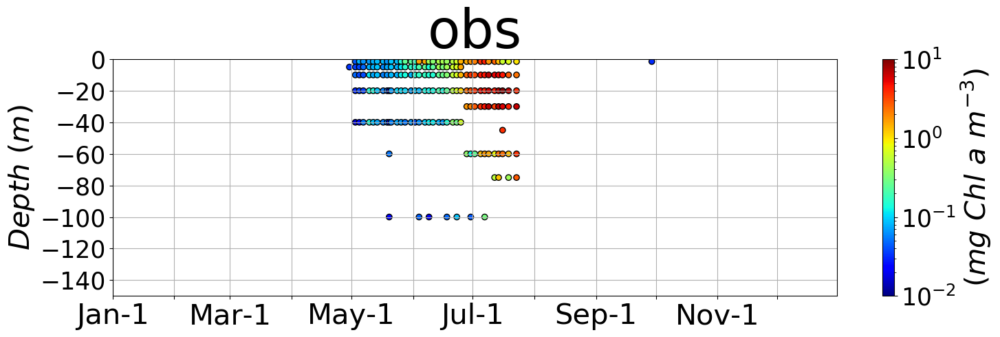

In [46]:
with plt.style.context('noice.mplstyle'):
    locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
    labels=('Jan-1','','Mar-1','','May-1','',
            'Jul-1','','Sep-1','','Nov-1','')

    plt.figure(figsize=(15,5))
    ax = plt.gca()
    hc=ax.scatter(chlfluo_df['doy']-1,
                  chlfluo_df['depth'],
                  c=chlfluo_df['chlfluo'],
                  cmap='jet',
                  norm=mpl.colors.LogNorm(vmin=1E-2,vmax=10),
                  s=None,
                  edgecolor='k'
                 )
    ax.set_title('obs')
    ax.set_xticklabels([])
    ax.set_ylabel('$Depth\ (m)$')
    ax.set_xlim(first_year[0],first_year[-1])
    ax.set_ylim(-150,0)
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    cbar=plt.colorbar(hc)
    cbar.set_label('$(mg\ Chl\ a\ m^{-3})$')
    plt.tight_layout()
    plt.savefig('validation/GEic2016.m3.logchlfluo.noextra.obsgrid.png')

### Observations of chlorophyll a by fluorimetry: Mean chlorophyll a (0-40m)

in $mg\ Chla\ m^{-3}$

In [47]:
# doys: 123,130
depths_case1  =np.array([      -1.5, -5,   -10,   -20,    -40])
weights_case1 =np.array([       3.25, 4.25,  7.5,  15,     10])
# doys: 125,127,132,134,139,141,144,146,148,151,153,158,162,165,167,172,176
depths_case2  =np.array([-0,   -1.5, -5,   -10,   -20,    -40])
weights_case2 =np.array([ 0.75, 2.5,  4.25,  7.5,  15,     10])
#doys: 155,160,169,174
depths_case3  =np.array([-0,   -1.5, -5,   -10,   -20,    -40,               -100])
weights_case3 =np.array([ 0.75, 2.5,  4.25,  7.5,  15,     10,                  0])
#doys: 179,183,186
depths_case4  =np.array([-0,   -1.5,       -10,   -20,-30,     -60])
weights_case4 =np.array([ 0.75, 5,           9.25, 10, 15,      0])
#doys:181,188,190
depths_case5 =np.array([-0,   -1.5,       -10,   -20,-30,     -60,           -100])
weights_case5=np.array([ 0.75, 5,           9.25, 10, 15,      0,               0])
#doys:193,195,200,204
depths_case6 =np.array([      -1.5,       -10,   -20,-30,     -60,  -75])
weights_case6=np.array([       5.75,        9.25, 10, 15,       0,    0])
#doy:197
depths_case7 =np.array([      -1.5,       -10,   -20,-30,  -45,  -60])
weights_case7=np.array([       5.75,        9.25, 10, 12.5,  2.5,  0])

In [48]:
nT=365
array1d_iT_obsmeanchlfluo=np.full(nT,np.NaN)
for iT in np.arange(0,nT):
    obsmeanchlfluo=np.NaN
    chlfluo=[]
    doy=iT+1
    chlfluo_oneday_df=chlfluo_df[['depth','chlfluo']][(chlfluo_df.doy==doy)]
    depths=chlfluo_oneday_df['depth']
    if set(depths_case1).issubset(set(depths)):
        for depth in depths_case1:
            chlfluotempo \
            =chlfluo_oneday_df['chlfluo'][(chlfluo_oneday_df.depth==depth)]
            assert chlfluotempo.size==1
            chlfluotempo=chlfluotempo.iat[0]
            chlfluo.append(chlfluotempo)
        obsmeanchlfluo=np.average(np.array(chlfluo),weights=weights_case1)
    elif set(depths_case2).issubset(set(depths)):
        for depth in depths_case2:
            chlfluotempo \
            =chlfluo_oneday_df['chlfluo'][(chlfluo_oneday_df.depth==depth)]
            assert chlfluotempo.size==1
            chlfluotempo=chlfluotempo.iat[0]
            chlfluo.append(chlfluotempo)
        obsmeanchlfluo=np.average(np.array(chlfluo),weights=weights_case2)
    elif set(depths_case3).issubset(set(depths)):
        for depth in depths_case3:
            chlfluotempo \
            =chlfluo_oneday_df['chlfluo'][(chlfluo_oneday_df.depth==depth)]
            assert chlfluotempo.size==1
            chlfluotempo=chlfluotempo.iat[0]
            chlfluo.append(chlfluotempo)
        obsmeanchlfluo=np.average(np.array(chlfluo),weights=weights_case3)
    elif set(depths_case4).issubset(set(depths)):
        for depth in depths_case4:
            chlfluotempo \
            =chlfluo_oneday_df['chlfluo'][(chlfluo_oneday_df.depth==depth)]
            assert chlfluotempo.size==1
            chlfluotempo=chlfluotempo.iat[0]
            chlfluo.append(chlfluotempo)
        obsmeanchlfluo=np.average(np.array(chlfluo),weights=weights_case4)
    elif set(depths_case5).issubset(set(depths)):
        for depth in depths_case5:
            chlfluotempo \
            =chlfluo_oneday_df['chlfluo'][(chlfluo_oneday_df.depth==depth)]
            assert chlfluotempo.size==1
            chlfluotempo=chlfluotempo.iat[0]
            chlfluo.append(chlfluotempo)
        obsmeanchlfluo=np.average(np.array(chlfluo),weights=weights_case5)
    elif set(depths_case6).issubset(set(depths)):
        for depth in depths_case6:
            chlfluotempo \
            =chlfluo_oneday_df['chlfluo'][(chlfluo_oneday_df.depth==depth)]
            assert chlfluotempo.size==1
            chlfluotempo=chlfluotempo.iat[0]
            chlfluo.append(chlfluotempo)
        obsmeanchlfluo=np.average(np.array(chlfluo),weights=weights_case6)
    elif set(depths_case7).issubset(set(depths)):
        for depth in depths_case7:
            chlfluotempo \
            =chlfluo_oneday_df['chlfluo'][(chlfluo_oneday_df.depth==depth)]
            assert chlfluotempo.size==1
            chlfluotempo=chlfluotempo.iat[0]
            chlfluo.append(chlfluotempo)
        obsmeanchlfluo=np.average(np.array(chlfluo),weights=weights_case7)
    array1d_iT_obsmeanchlfluo[iT]=obsmeanchlfluo

### Observations of chlorophyll a by fluorimetry: Chlorophyll a vertically integrated (0-40m)

in $mg\ Chla\ m^{-2}$

In [49]:
nT=365
array1d_iT_obsvint40mchlfluo=np.full(nT,np.NaN)
for iT in np.arange(0,nT):
    obsvintchlfluo=np.NaN
    chlfluo=[]
    doy=iT+1
    chlfluo_oneday_df=chlfluo_df[['depth','chlfluo']][(chlfluo_df.doy==doy)]
    depths=chlfluo_oneday_df['depth']
    if set(depths_case1).issubset(set(depths)):
        for depth in depths_case1:
            chlfluotempo \
            =chlfluo_oneday_df['chlfluo'][(chlfluo_oneday_df.depth==depth)]
            assert chlfluotempo.size==1
            chlfluotempo=chlfluotempo.iat[0]
            chlfluo.append(chlfluotempo)
        obsvintchlfluo=np.dot(chlfluo,weights_case1)
    elif set(depths_case2).issubset(set(depths)):
        for depth in depths_case2:
            chlfluotempo \
            =chlfluo_oneday_df['chlfluo'][(chlfluo_oneday_df.depth==depth)]
            assert chlfluotempo.size==1
            chlfluotempo=chlfluotempo.iat[0]
            chlfluo.append(chlfluotempo)
        obsvintchlfluo=np.dot(chlfluo,weights_case2)
    elif set(depths_case3).issubset(set(depths)):
        for depth in depths_case3:
            chlfluotempo \
            =chlfluo_oneday_df['chlfluo'][(chlfluo_oneday_df.depth==depth)]
            assert chlfluotempo.size==1
            chlfluotempo=chlfluotempo.iat[0]
            chlfluo.append(chlfluotempo)
        obsvintchlfluo=np.dot(chlfluo,weights_case3)
    elif set(depths_case4).issubset(set(depths)):
        for depth in depths_case4:
            chlfluotempo \
            =chlfluo_oneday_df['chlfluo'][(chlfluo_oneday_df.depth==depth)]
            assert chlfluotempo.size==1
            chlfluotempo=chlfluotempo.iat[0]
            chlfluo.append(chlfluotempo)
        obsvintchlfluo=np.dot(chlfluo,weights_case4)
    elif set(depths_case5).issubset(set(depths)):
        for depth in depths_case5:
            chlfluotempo \
            =chlfluo_oneday_df['chlfluo'][(chlfluo_oneday_df.depth==depth)]
            assert chlfluotempo.size==1
            chlfluotempo=chlfluotempo.iat[0]
            chlfluo.append(chlfluotempo)
        obsvintchlfluo=np.dot(chlfluo,weights_case5)
    elif set(depths_case6).issubset(set(depths)):
        for depth in depths_case6:
            chlfluotempo \
            =chlfluo_oneday_df['chlfluo'][(chlfluo_oneday_df.depth==depth)]
            assert chlfluotempo.size==1
            chlfluotempo=chlfluotempo.iat[0]
            chlfluo.append(chlfluotempo)
        obsvintchlfluo=np.dot(chlfluo,weights_case6)
    elif set(depths_case7).issubset(set(depths)):
        for depth in depths_case7:
            chlfluotempo \
            =chlfluo_oneday_df['chlfluo'][(chlfluo_oneday_df.depth==depth)]
            assert chlfluotempo.size==1
            chlfluotempo=chlfluotempo.iat[0]
            chlfluo.append(chlfluotempo)
        obsvintchlfluo=np.dot(chlfluo,weights_case7)
    array1d_iT_obsvint40mchlfluo[iT]=obsvintchlfluo

### Observations of chlorophyll $a$ by fluorimetry: Chlorophyll a vertically integrated (0-100m)

in $mg\ Chla\ m^{-2}$

In [50]:
# doys: 123,130
depths_case1  =np.array([      -1.5, -5,   -10,   -20,    -40])
weights_case1 =np.array([       3.25, 4.25,  7.5,  15,     70])
# doys: 125,127,132,134,139,141,144,146,148,151,153,158,162,165,167,172,176
depths_case2  =np.array([-0,   -1.5, -5,   -10,   -20,    -40])
weights_case2 =np.array([ 0.75, 2.5,  4.25,  7.5,  15,     70])
#doys: 155,160,169,174
depths_case3  =np.array([-0,   -1.5, -5,   -10,   -20,    -40,               -100])
weights_case3 =np.array([ 0.75, 2.5,  4.25,  7.5,  15,     40,                 30])
#doys: 179,183,186
depths_case4  =np.array([-0,   -1.5,       -10,   -20,-30,     -60])
weights_case4 =np.array([ 0.75, 5,           9.25, 10, 20,      55])
#doys:181,188,190
depths_case5 =np.array([-0,   -1.5,       -10,   -20,-30,     -60,           -100])
weights_case5=np.array([ 0.75, 5,           9.25, 10, 20,      40,             15])
#doys:193,195,200,204
depths_case6 =np.array([      -1.5,       -10,   -20,-30,     -60,  -75])
weights_case6=np.array([       5.75,        9.25, 10, 20,      22.5, 32.5])
#doy:197
depths_case7 =np.array([      -1.5,       -10,   -20,-30,  -45,  -60])
weights_case7=np.array([       5.75,        9.25, 10, 12.5, 15,   47.5])

In [51]:
nT=365
array1d_iT_obsvintchlfluo=np.full(nT,np.NaN)
for iT in np.arange(0,nT):
    obsvintchlfluo=np.NaN
    chlfluo=[]
    doy=iT+1
    chlfluo_oneday_df=chlfluo_df[['depth','chlfluo']][(chlfluo_df.doy==doy)]
    depths=chlfluo_oneday_df['depth']
    if set(depths_case1).issubset(set(depths)):
        for depth in depths_case1:
            chlfluotempo \
            =chlfluo_oneday_df['chlfluo'][(chlfluo_oneday_df.depth==depth)]
            assert chlfluotempo.size==1
            chlfluotempo=chlfluotempo.iat[0]
            chlfluo.append(chlfluotempo)
        obsvintchlfluo=np.dot(chlfluo,weights_case1)
    elif set(depths_case2).issubset(set(depths)):
        for depth in depths_case2:
            chlfluotempo \
            =chlfluo_oneday_df['chlfluo'][(chlfluo_oneday_df.depth==depth)]
            assert chlfluotempo.size==1
            chlfluotempo=chlfluotempo.iat[0]
            chlfluo.append(chlfluotempo)
        obsvintchlfluo=np.dot(chlfluo,weights_case2)
    elif set(depths_case3).issubset(set(depths)):
        for depth in depths_case3:
            chlfluotempo \
            =chlfluo_oneday_df['chlfluo'][(chlfluo_oneday_df.depth==depth)]
            assert chlfluotempo.size==1
            chlfluotempo=chlfluotempo.iat[0]
            chlfluo.append(chlfluotempo)
        obsvintchlfluo=np.dot(chlfluo,weights_case3)
    elif set(depths_case4).issubset(set(depths)):
        for depth in depths_case4:
            chlfluotempo \
            =chlfluo_oneday_df['chlfluo'][(chlfluo_oneday_df.depth==depth)]
            assert chlfluotempo.size==1
            chlfluotempo=chlfluotempo.iat[0]
            chlfluo.append(chlfluotempo)
        obsvintchlfluo=np.dot(chlfluo,weights_case4)
    elif set(depths_case5).issubset(set(depths)):
        for depth in depths_case5:
            chlfluotempo \
            =chlfluo_oneday_df['chlfluo'][(chlfluo_oneday_df.depth==depth)]
            assert chlfluotempo.size==1
            chlfluotempo=chlfluotempo.iat[0]
            chlfluo.append(chlfluotempo)
        obsvintchlfluo=np.dot(chlfluo,weights_case5)
    elif set(depths_case6).issubset(set(depths)):
        for depth in depths_case6:
            chlfluotempo \
            =chlfluo_oneday_df['chlfluo'][(chlfluo_oneday_df.depth==depth)]
            assert chlfluotempo.size==1
            chlfluotempo=chlfluotempo.iat[0]
            chlfluo.append(chlfluotempo)
        obsvintchlfluo=np.dot(chlfluo,weights_case6)
    elif set(depths_case7).issubset(set(depths)):
        for depth in depths_case7:
            chlfluotempo \
            =chlfluo_oneday_df['chlfluo'][(chlfluo_oneday_df.depth==depth)]
            assert chlfluotempo.size==1
            chlfluotempo=chlfluotempo.iat[0]
            chlfluo.append(chlfluotempo)
        obsvintchlfluo=np.dot(chlfluo,weights_case7)
    array1d_iT_obsvintchlfluo[iT]=obsvintchlfluo

### Observations of chlorophyll a by fluorimetry: Plot on model grid

In [52]:
RC_above151=np.array(RC[RC>-151])
RF_above151=np.array(RF[RF>-151])
assert RC_above151.size+1==RF_above151.size

In [53]:
array2d_iRC_iT_obschlfluonoextra=np.empty([RC_above151.size,array1d_iT1y_iT.size])
array2d_iRC_iT_obschlfluonoextra[:,:]=np.NaN
for iT in np.arange(0,array1d_iT1y_iT.size):
    chl_oneday_df=chlfluo_df[['depth','chlfluo','doy']][(chlfluo_df.doy==iT+1)]
    if chl_oneday_df.shape[0]==1:
        depth_target=chl_oneday_df['depth'].iloc[0]
        iRC=vstats.find_idx_nearest(RC_above151, depth_target)
        chl=chl_oneday_df['chlfluo']
        array2d_iRC_iT_obschlfluonoextra[iRC,iT]=chl
    elif chl_oneday_df.shape[0]>1:
        y_interp=scipy.interpolate.interp1d(
            chl_oneday_df['depth'],
            chl_oneday_df['chlfluo'],
            bounds_error=False
        )
        array1d_iRC_chl=y_interp(RC_above151)
        chl_oneday_reproject_df=pd.DataFrame({'RC_above151':RC_above151,
                                              'array1d_iRC_chl':array1d_iRC_chl})
        for iRC in np.arange(0,RC_above151.size):
            chl=chl_oneday_reproject_df['array1d_iRC_chl'].iloc[iRC]
            array2d_iRC_iT_obschlfluonoextra[iRC,iT]=chl

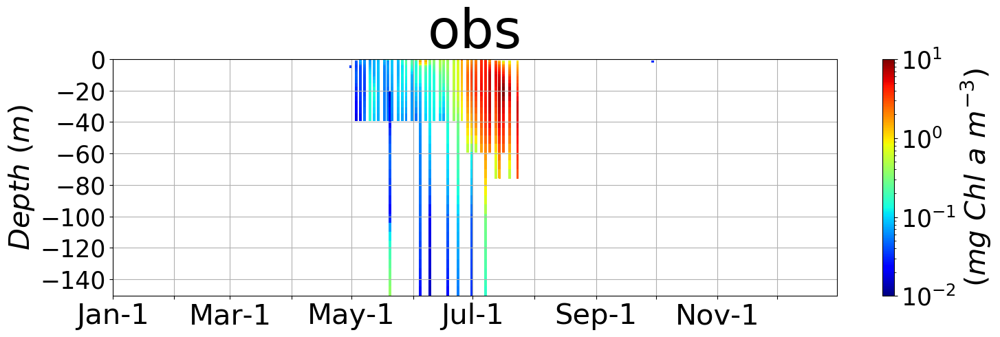

In [54]:
with plt.style.context('noice.mplstyle'):
    locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
    labels=('Jan-1','','Mar-1','','May-1','',
            'Jul-1','','Sep-1','','Nov-1','')

    RF_above151=RF[RF>-151]

    plt.figure(figsize=(15,5))
    ax = plt.gca()
    h=ax.pcolormesh(first_year366,
                    RF_above151,
                    array2d_iRC_iT_obschlfluonoextra,
                    cmap='jet',
                    norm=mpl.colors.LogNorm(vmin=1E-2,vmax=10,clip=True)
                  )
    ax.set_title('obs')
    ax.set_xticklabels([])
    ax.set_ylabel('$Depth\ (m)$')
    ax.set_xlim(first_year366[0],first_year[-1])
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    cbar=plt.colorbar(h)
    cbar.set_label('$(mg\ Chl\ a\ m^{-3})$')
    plt.tight_layout()
    plt.savefig('validation/GEic2016.m3.logchlfluo.noextra.modgrid.png')

## Chlorophyll a by HPLC

### Observations of chlorophyll a by HPLC: Load dataset

In [55]:
chlHPLC_df=load_pigment()

### Observations of chlorophyll a by HPLC: Select

We select the observations of chlorophyll a concentrations at the ice camp 2016 measured by HPLC.

In [56]:
chlHPLC_df=chlHPLC_df[(chlHPLC_df.mission=='ice_camp_2016') \
              & (chlHPLC_df.sample_type=='water') \
             & (chlHPLC_df.pigment=='Total Chlorophyll a') \
             & (chlHPLC_df.method=='HPLC')]

remove negative chlorophyll a

In [57]:
chlHPLC_df['chlHPLC'][ chlHPLC_df['chlHPLC']<0 ]

Series([], Name: chlHPLC, dtype: float32)

find duplicates

In [58]:
g=chlHPLC_df.groupby('doy')['depth'].value_counts()
g.where(g>1).dropna()

doy  depth
146  -10.0    2.0
     -1.5     2.0
Name: depth, dtype: float64

inspect duplicates for doy=146

In [59]:
chlHPLC_oneday_df=chlHPLC_df[['depth','chlHPLC','doy']][(chlHPLC_df.doy==146) | (chlHPLC_df.doy==148)]
chlHPLC_oneday_df

,depth,chlHPLC,doy
20357,-0.5,0.1056,146
20358,-1.5,0.0899,146
20359,-5.0,0.0906,146
20360,-10.0,0.0905,146
20361,-20.0,0.1011,146
20362,-40.0,0.0633,146
20363,-0.5,0.0971,148
20364,-1.5,0.1483,146
20365,-5.0,0.1086,148
20366,-10.0,0.0890,146


By human judgement, I replace the doy of rows 20364 and 20366 with 148.

In [60]:
chlHPLC_df.loc[[20364,20366],'doy']=148

In [61]:
chlHPLC_oneday_df=chlHPLC_df[['depth','chlHPLC','doy']][(chlHPLC_df.doy==146) | (chlHPLC_df.doy==148)]
chlHPLC_oneday_df

,depth,chlHPLC,doy
20357,-0.5,0.1056,146
20358,-1.5,0.0899,146
20359,-5.0,0.0906,146
20360,-10.0,0.0905,146
20361,-20.0,0.1011,146
20362,-40.0,0.0633,146
20363,-0.5,0.0971,148
20364,-1.5,0.1483,148
20365,-5.0,0.1086,148
20366,-10.0,0.0890,148


Identify days of year for which the number of observations is less than or equal to 2. There are not measurements at enough depths to be able to calculate a meaningful vertical integration.

In [62]:
g=chlHPLC_df.groupby('doy')['doy'].value_counts()
g.where(g<=2).dropna()

doy  doy
120  120    2.0
Name: doy, dtype: float64

In [63]:
chlHPLC_oneday_df=chlHPLC_df[['depth','chlHPLC','doy']][(chlHPLC_df.doy==120)]
chlHPLC_oneday_df

,depth,chlHPLC,doy
20299,-1.5,0.0355,120
20300,-5.0,0.0253,120


By human judgement, I drop these observations.

In [64]:
chlHPLC_df=chlHPLC_df.drop(chlHPLC_df[(chlHPLC_df.doy==120)].index)

In [65]:
# chlHPLC_df[['depth','chlHPLC','doy']]

### Observations of chlorophyll a by HPLC: Plot on observations grid

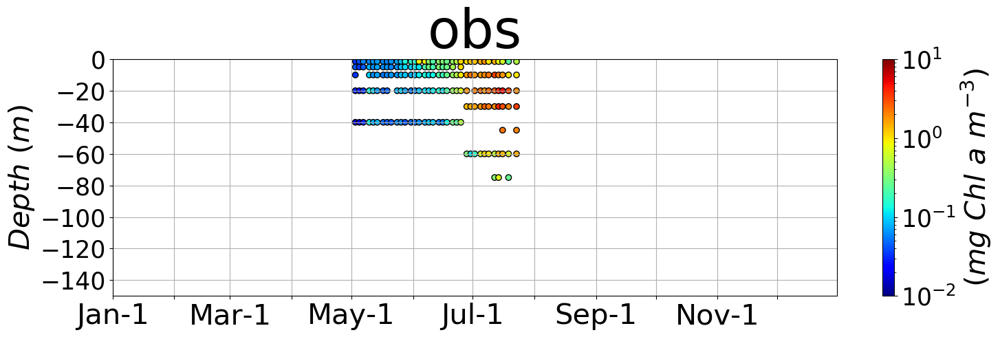

In [66]:
with plt.style.context('noice.mplstyle'):
    locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
    labels=('Jan-1','','Mar-1','','May-1','',
            'Jul-1','','Sep-1','','Nov-1','')

    plt.figure(figsize=(15,5))
    ax = plt.gca()
    hc=ax.scatter(chlHPLC_df['doy']-1,
                  chlHPLC_df['depth'],
                  c=chlHPLC_df['chlHPLC'],
                  cmap='jet',
                  norm=mpl.colors.LogNorm(vmin=1E-2,vmax=10,clip=True),
                  s=None,
                  edgecolor='k'
                 )
    ax.set_title('obs')
    ax.set_xticklabels([])
    ax.set_ylabel('$Depth\ (m)$')
    ax.set_xlim(first_year[0],first_year[-1])
    ax.set_ylim(-150,0)
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    cbar=plt.colorbar(hc)
    cbar.set_label('$(mg\ Chl\ a\ m^{-3})$')
    plt.tight_layout()
    plt.savefig('validation/GEic2016.m3.logchlHPLC.noextra.obsgrid.png')

### Observations of chlorophyll a by HPLC: Mean chlorophyll a (0-40m)

in $mg\ Chla\ m^{-3}$

In [67]:
#doy: 123
depths_case1 =np.array([      -1.5, -5,   -10,   -20,    -40])
weights_case1=np.array([       3.25, 4.25,  7.5,  15,     10])
#doys: 125,127
depths_case2 =np.array([-0.5, -1.5, -5,          -20,    -40])
weights_case2=np.array([ 1,    2.25, 9.25,         17.5,  10])
#doys:130,132,134,137,139,144,146,148,151,153,155,158,160,162,165,167,169,172,176
depths_case3 =np.array([-0.5,-1.5,  -5,   -10,   -20,    -40])
weights_case3=np.array([ 1,   2.25,  4.25,  7.5,  15,     10])
#doy: 141
depths_case4 =np.array([-0.5,-1.5,  -5,   -10,           -40])
weights_case4=np.array([ 1,   2.25,  4.25, 17.5,          15])
#doy: 174
depths_case5 =np.array([-0.5,-1.5,        -10,   -20,    -40])
weights_case5=np.array([ 1,   4.75,         9.25, 15,     10])
#doys: 179,181,183,186,188,190
depths_case6 =np.array([-0.5,-1.5,        -10,   -20,-30,    -60])
weights_case6=np.array([ 1,   4.75,         9.25, 10, 15,      0])
#doys: 193,195,200
depths_case7 =np.array([     -1.5,        -10,   -20,-30,    -60,  -75])
weights_case7=np.array([      5.75,         9.25, 10, 15,      0,    0])
#doys: 197,204
depths_case8 =np.array([     -1.5,        -10,   -20,-30,  -45,-60])
weights_case8=np.array([      5.75,         9.25, 10, 12.5, 2.5,  0])

In [68]:
nT=365
array1d_iT_obsmeanchlHPLC=np.full(nT,np.NaN)
for iT in np.arange(0,nT):
    obsmeanchlHPLC=np.NaN
    chlHPLC=[]
    doy=iT+1
    chlHPLC_oneday_df=chlHPLC_df[['depth','chlHPLC']][(chlHPLC_df.doy==doy)]
    depths=chlHPLC_oneday_df['depth']
    if set(depths_case1).issubset(set(depths)):
        for depth in depths_case1:
            chlHPLCtempo \
            =chlHPLC_oneday_df['chlHPLC'][(chlHPLC_oneday_df.depth==depth)]
            assert chlHPLCtempo.size==1
            chlHPLCtempo=chlHPLCtempo.iat[0]
            chlHPLC.append(chlHPLCtempo)
        obsmeanchlHPLC=np.average(np.array(chlHPLC),weights=weights_case1)
    elif set(depths_case2).issubset(set(depths)):
        for depth in depths_case2:
            chlHPLCtempo \
            =chlHPLC_oneday_df['chlHPLC'][(chlHPLC_oneday_df.depth==depth)]
            assert chlHPLCtempo.size==1
            chlHPLCtempo=chlHPLCtempo.iat[0]
            chlHPLC.append(chlHPLCtempo)
        obsmeanchlHPLC=np.average(np.array(chlHPLC),weights=weights_case2)
    elif set(depths_case3).issubset(set(depths)):
        for depth in depths_case3:
            chlHPLCtempo \
            =chlHPLC_oneday_df['chlHPLC'][(chlHPLC_oneday_df.depth==depth)]
            assert chlHPLCtempo.size==1
            chlHPLCtempo=chlHPLCtempo.iat[0]
            chlHPLC.append(chlHPLCtempo)
        obsmeanchlHPLC=np.average(np.array(chlHPLC),weights=weights_case3)
    elif set(depths_case4).issubset(set(depths)):
        for depth in depths_case4:
            chlHPLCtempo \
            =chlHPLC_oneday_df['chlHPLC'][(chlHPLC_oneday_df.depth==depth)]
            assert chlHPLCtempo.size==1
            chlHPLCtempo=chlHPLCtempo.iat[0]
            chlHPLC.append(chlHPLCtempo)
        obsmeanchlHPLC=np.average(np.array(chlHPLC),weights=weights_case4)
    elif set(depths_case5).issubset(set(depths)):
        for depth in depths_case5:
            chlHPLCtempo \
            =chlHPLC_oneday_df['chlHPLC'][(chlHPLC_oneday_df.depth==depth)]
            assert chlHPLCtempo.size==1
            chlHPLCtempo=chlHPLCtempo.iat[0]
            chlHPLC.append(chlHPLCtempo)
        obsmeanchlHPLC=np.average(np.array(chlHPLC),weights=weights_case5)
    elif set(depths_case6).issubset(set(depths)):
        for depth in depths_case6:
            chlHPLCtempo \
            =chlHPLC_oneday_df['chlHPLC'][(chlHPLC_oneday_df.depth==depth)]
            assert chlHPLCtempo.size==1
            chlHPLCtempo=chlHPLCtempo.iat[0]
            chlHPLC.append(chlHPLCtempo)
        obsmeanchlHPLC=np.average(np.array(chlHPLC),weights=weights_case6)
    elif set(depths_case7).issubset(set(depths)):
        for depth in depths_case7:
            chlHPLCtempo \
            =chlHPLC_oneday_df['chlHPLC'][(chlHPLC_oneday_df.depth==depth)]
            assert chlHPLCtempo.size==1
            chlHPLCtempo=chlHPLCtempo.iat[0]
            chlHPLC.append(chlHPLCtempo)
        obsmeanchlHPLC=np.average(np.array(chlHPLC),weights=weights_case7)
    elif set(depths_case8).issubset(set(depths)):
        for depth in depths_case8:
            chlHPLCtempo \
            =chlHPLC_oneday_df['chlHPLC'][(chlHPLC_oneday_df.depth==depth)]
            assert chlHPLCtempo.size==1
            chlHPLCtempo=chlHPLCtempo.iat[0]
            chlHPLC.append(chlHPLCtempo)
        obsmeanchlHPLC=np.average(np.array(chlHPLC),weights=weights_case8)
    array1d_iT_obsmeanchlHPLC[iT]=obsmeanchlHPLC

### Observations of chlorophyll $a$ by HPLC: Chlorophyll-a vertically integrated (0-40m)

in $mg\ Chla\ m^{-2}$

In [69]:
nT=365
array1d_iT_obsvint40mchlHPLC=np.full(nT,np.NaN)
for iT in np.arange(0,nT):
    obsvintchlHPLC=np.NaN
    chlHPLC=[]
    doy=iT+1
    chlHPLC_oneday_df=chlHPLC_df[['depth','chlHPLC']][(chlHPLC_df.doy==doy)]
    depths=chlHPLC_oneday_df['depth']
    if set(depths_case1).issubset(set(depths)):
        for depth in depths_case1:
            chlHPLCtempo \
            =chlHPLC_oneday_df['chlHPLC'][(chlHPLC_oneday_df.depth==depth)]
            assert chlHPLCtempo.size==1
            chlHPLCtempo=chlHPLCtempo.iat[0]
            chlHPLC.append(chlHPLCtempo)
        obsvintchlHPLC=np.dot(chlHPLC,weights_case1)
    elif set(depths_case2).issubset(set(depths)):
        for depth in depths_case2:
            chlHPLCtempo \
            =chlHPLC_oneday_df['chlHPLC'][(chlHPLC_oneday_df.depth==depth)]
            assert chlHPLCtempo.size==1
            chlHPLCtempo=chlHPLCtempo.iat[0]
            chlHPLC.append(chlHPLCtempo)
        obsvintchlHPLC=np.dot(chlHPLC,weights_case2)
    elif set(depths_case3).issubset(set(depths)):
        for depth in depths_case3:
            chlHPLCtempo \
            =chlHPLC_oneday_df['chlHPLC'][(chlHPLC_oneday_df.depth==depth)]
            assert chlHPLCtempo.size==1
            chlHPLCtempo=chlHPLCtempo.iat[0]
            chlHPLC.append(chlHPLCtempo)
        obsvintchlHPLC=np.dot(chlHPLC,weights_case3)
    elif set(depths_case4).issubset(set(depths)):
        for depth in depths_case4:
            chlHPLCtempo \
            =chlHPLC_oneday_df['chlHPLC'][(chlHPLC_oneday_df.depth==depth)]
            assert chlHPLCtempo.size==1
            chlHPLCtempo=chlHPLCtempo.iat[0]
            chlHPLC.append(chlHPLCtempo)
        obsvintchlHPLC=np.dot(chlHPLC,weights_case4)
    elif set(depths_case5).issubset(set(depths)):
        for depth in depths_case5:
            chlHPLCtempo \
            =chlHPLC_oneday_df['chlHPLC'][(chlHPLC_oneday_df.depth==depth)]
            assert chlHPLCtempo.size==1
            chlHPLCtempo=chlHPLCtempo.iat[0]
            chlHPLC.append(chlHPLCtempo)
        obsvintchlHPLC=np.dot(chlHPLC,weights_case5)
    elif set(depths_case6).issubset(set(depths)):
        for depth in depths_case6:
            chlHPLCtempo \
            =chlHPLC_oneday_df['chlHPLC'][(chlHPLC_oneday_df.depth==depth)]
            assert chlHPLCtempo.size==1
            chlHPLCtempo=chlHPLCtempo.iat[0]
            chlHPLC.append(chlHPLCtempo)
        obsvintchlHPLC=np.dot(chlHPLC,weights_case6)
    elif set(depths_case7).issubset(set(depths)):
        for depth in depths_case7:
            chlHPLCtempo \
            =chlHPLC_oneday_df['chlHPLC'][(chlHPLC_oneday_df.depth==depth)]
            assert chlHPLCtempo.size==1
            chlHPLCtempo=chlHPLCtempo.iat[0]
            chlHPLC.append(chlHPLCtempo)
        obsvintchlHPLC=np.dot(chlHPLC,weights_case7)
    elif set(depths_case8).issubset(set(depths)):
        for depth in depths_case8:
            chlHPLCtempo \
            =chlHPLC_oneday_df['chlHPLC'][(chlHPLC_oneday_df.depth==depth)]
            assert chlHPLCtempo.size==1
            chlHPLCtempo=chlHPLCtempo.iat[0]
            chlHPLC.append(chlHPLCtempo)
        obsvintchlHPLC=np.dot(chlHPLC,weights_case8)
    array1d_iT_obsvint40mchlHPLC[iT]=obsvintchlHPLC

### Observations of chlorophyll a by HPLC: Chlorophyll-a vertically integrated (0-100m)

in $mg\ Chla\ m^{-2}$

In [70]:
#doy: 123
depths_case1 =np.array([      -1.5, -5,   -10,   -20,    -40])
weights_case1=np.array([       3.25, 4.25,  7.5,  15,     70])
#doys: 125,127
depths_case2 =np.array([-0.5, -1.5, -5,          -20,    -40])
weights_case2=np.array([ 1,    2.25, 9.25,         17.5,  70])
#doys:130,132,134,137,139,144,146,148,151,153,155,158,160,162,165,167,169,172,176
depths_case3 =np.array([-0.5,-1.5,  -5,   -10,   -20,    -40])
weights_case3=np.array([ 1,   2.25,  4.25,  7.5,  15,     70])
#doy: 141
depths_case4 =np.array([-0.5,-1.5,  -5,   -10,           -40])
weights_case4=np.array([ 1,   2.25,  4.25, 17.5,          75])
#doy: 174
depths_case5 =np.array([-0.5,-1.5,        -10,   -20,    -40])
weights_case5=np.array([ 1,   4.75,         9.25, 15,     70])
#doys: 179,181,183,186,188,190
depths_case6 =np.array([-0.5,-1.5,        -10,   -20,-30,    -60])
weights_case6=np.array([ 1,   4.75,         9.25, 10, 20,     55])
#doys: 193,195,200
depths_case7 =np.array([     -1.5,        -10,   -20,-30,    -60,  -75])
weights_case7=np.array([      5.75,         9.25, 10, 20,     22.5, 32.5])
#doys: 197,204
depths_case8 =np.array([     -1.5,        -10,   -20,-30,  -45,-60])
weights_case8=np.array([      5.75,         9.25, 10, 12.5, 15, 47.5])

In [71]:
nT=365
array1d_iT_obsvintchlHPLC=np.full(nT,np.NaN)
for iT in np.arange(0,nT):
    obsvintchlHPLC=np.NaN
    chlHPLC=[]
    doy=iT+1
    chlHPLC_oneday_df=chlHPLC_df[['depth','chlHPLC']][(chlHPLC_df.doy==doy)]
    depths=chlHPLC_oneday_df['depth']
    if set(depths_case1).issubset(set(depths)):
        for depth in depths_case1:
            chlHPLCtempo \
            =chlHPLC_oneday_df['chlHPLC'][(chlHPLC_oneday_df.depth==depth)]
            assert chlHPLCtempo.size==1
            chlHPLCtempo=chlHPLCtempo.iat[0]
            chlHPLC.append(chlHPLCtempo)
        obsvintchlHPLC=np.dot(chlHPLC,weights_case1)
    elif set(depths_case2).issubset(set(depths)):
        for depth in depths_case2:
            chlHPLCtempo \
            =chlHPLC_oneday_df['chlHPLC'][(chlHPLC_oneday_df.depth==depth)]
            assert chlHPLCtempo.size==1
            chlHPLCtempo=chlHPLCtempo.iat[0]
            chlHPLC.append(chlHPLCtempo)
        obsvintchlHPLC=np.dot(chlHPLC,weights_case2)
    elif set(depths_case3).issubset(set(depths)):
        for depth in depths_case3:
            chlHPLCtempo \
            =chlHPLC_oneday_df['chlHPLC'][(chlHPLC_oneday_df.depth==depth)]
            assert chlHPLCtempo.size==1
            chlHPLCtempo=chlHPLCtempo.iat[0]
            chlHPLC.append(chlHPLCtempo)
        obsvintchlHPLC=np.dot(chlHPLC,weights_case3)
    elif set(depths_case4).issubset(set(depths)):
        for depth in depths_case4:
            chlHPLCtempo \
            =chlHPLC_oneday_df['chlHPLC'][(chlHPLC_oneday_df.depth==depth)]
            assert chlHPLCtempo.size==1
            chlHPLCtempo=chlHPLCtempo.iat[0]
            chlHPLC.append(chlHPLCtempo)
        obsvintchlHPLC=np.dot(chlHPLC,weights_case4)
    elif set(depths_case5).issubset(set(depths)):
        for depth in depths_case5:
            chlHPLCtempo \
            =chlHPLC_oneday_df['chlHPLC'][(chlHPLC_oneday_df.depth==depth)]
            assert chlHPLCtempo.size==1
            chlHPLCtempo=chlHPLCtempo.iat[0]
            chlHPLC.append(chlHPLCtempo)
        obsvintchlHPLC=np.dot(chlHPLC,weights_case5)
    elif set(depths_case6).issubset(set(depths)):
        for depth in depths_case6:
            chlHPLCtempo \
            =chlHPLC_oneday_df['chlHPLC'][(chlHPLC_oneday_df.depth==depth)]
            assert chlHPLCtempo.size==1
            chlHPLCtempo=chlHPLCtempo.iat[0]
            chlHPLC.append(chlHPLCtempo)
        obsvintchlHPLC=np.dot(chlHPLC,weights_case6)
    elif set(depths_case7).issubset(set(depths)):
        for depth in depths_case7:
            chlHPLCtempo \
            =chlHPLC_oneday_df['chlHPLC'][(chlHPLC_oneday_df.depth==depth)]
            assert chlHPLCtempo.size==1
            chlHPLCtempo=chlHPLCtempo.iat[0]
            chlHPLC.append(chlHPLCtempo)
        obsvintchlHPLC=np.dot(chlHPLC,weights_case7)
    elif set(depths_case8).issubset(set(depths)):
        for depth in depths_case8:
            chlHPLCtempo \
            =chlHPLC_oneday_df['chlHPLC'][(chlHPLC_oneday_df.depth==depth)]
            assert chlHPLCtempo.size==1
            chlHPLCtempo=chlHPLCtempo.iat[0]
            chlHPLC.append(chlHPLCtempo)
        obsvintchlHPLC=np.dot(chlHPLC,weights_case8)
    array1d_iT_obsvintchlHPLC[iT]=obsvintchlHPLC

### Observations of chlorophyll a by HPLC: Plot on model grid

In [72]:
RC_above151=np.array(RC[RC>-151])
RF_above151=np.array(RF[RF>-151])
assert RC_above151.size+1==RF_above151.size

In [73]:
array2d_iRC_iT_obschlHPLCnoextra \
=np.empty([RC_above151.size,array1d_iT1y_iT.size])
array2d_iRC_iT_obschlHPLCnoextra[:,:]=np.NaN
for iT in np.arange(0,array1d_iT1y_iT.size):
    chl_oneday_df \
    =chlHPLC_df[['depth','chlHPLC','doy']][(chlHPLC_df.doy==iT+1)]
    if chl_oneday_df.shape[0]==1:
        depth_target=chl_oneday_df['depth'].iloc[0]
        iRC=vstats.find_idx_nearest(RC_above151, depth_target)
        chl=chl_oneday_df['chlHPLC']
        array2d_iRC_iT_obschlHPLCnoextra[iRC,iT]=chl
    elif chl_oneday_df.shape[0]>1:
        y_interp=scipy.interpolate.interp1d(
            chl_oneday_df['depth'],
            chl_oneday_df['chlHPLC'],
            bounds_error=False
        )
        array1d_iRC_chl=y_interp(RC_above151)
        chl_oneday_reproject_df \
        =pd.DataFrame({'RC_above151':RC_above151,
                       'array1d_iRC_chl':array1d_iRC_chl})
        for iRC in np.arange(0,RC_above151.size):
            chl=chl_oneday_reproject_df['array1d_iRC_chl'].iloc[iRC]
            array2d_iRC_iT_obschlHPLCnoextra[iRC,iT]=chl

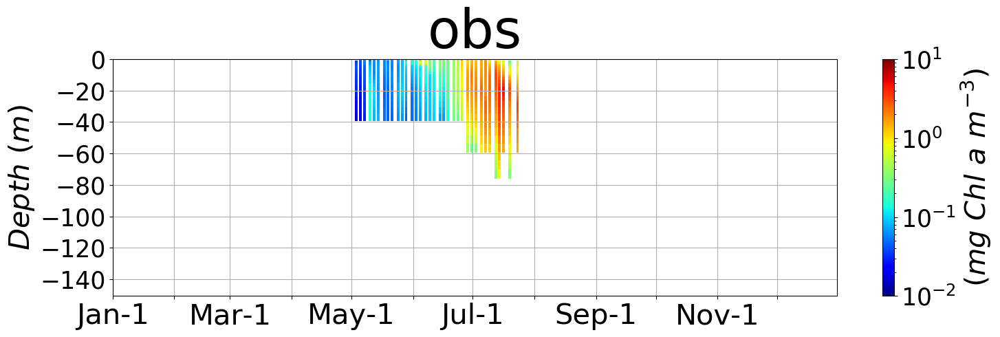

In [74]:
with plt.style.context('noice.mplstyle'):
    locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
    labels=('Jan-1','','Mar-1','','May-1','',
            'Jul-1','','Sep-1','','Nov-1','')

    RF_above151=RF[RF>-151]

    plt.figure(figsize=(15,5))
    ax = plt.gca()
    h=ax.pcolormesh(first_year366,
                    RF_above151,
                    array2d_iRC_iT_obschlHPLCnoextra,
                    cmap='jet',
                    norm=mpl.colors.LogNorm(vmin=1E-2,vmax=10,clip=True)
                  )
    ax.set_title('obs')
    ax.set_xticklabels([])
    ax.set_ylabel('$Depth\ (m)$')
    ax.set_xlim(first_year366[0],first_year[-1])
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    cbar=plt.colorbar(h)
    cbar.set_label('$(mg\ Chl\ a\ m^{-3})$')
    plt.tight_layout()
    plt.savefig('validation/GEic2016.m3.logchlHPLC.noextra.modgrid.png')

# Outputs from model NEMO-LIM3

## Output from model NEMO-LIM3 and input into MITgcm: salinity

In [75]:
tavefile='tave.0000000000.t001.nc'
array2d_idepth_iT_Stavefull=netcdf_tools.read_netcdf(tavefile,'Stave').squeeze().transpose()
array2d_idepth_iT_Stavefull[-1,:]=np.nan

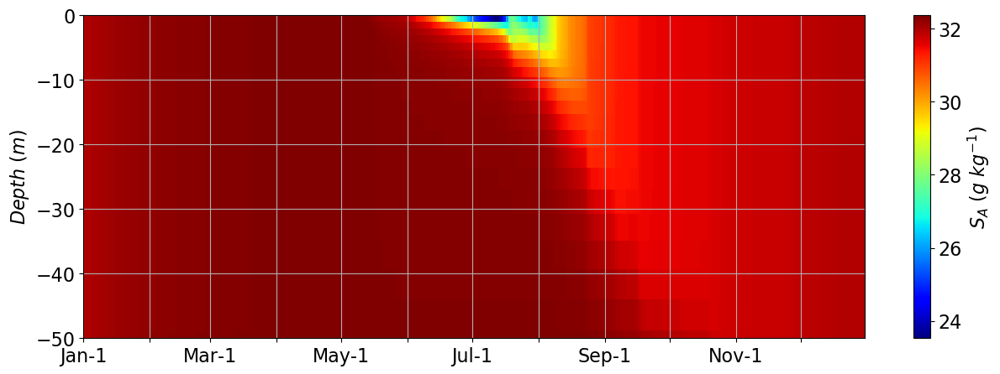

In [76]:
mpl.rc('font', **{'size' : 16})

locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
labels=('Jan-1','','Mar-1','','May-1','',
        'Jul-1','','Sep-1','','Nov-1','')

RF_above55=RF[RF>-55]

plt.figure(figsize=(15,5))
ax = plt.gca()
h=ax.pcolormesh(first_year366,
                RF_above55,
                array2d_idepth_iT_Stavefull[0:(RF_above55.size)-1,array1d_iT1y_iT],
                cmap='jet'
               )
ax.set_xticklabels([])
ax.set_ylabel('$Depth\ (m)$')
ax.set_xlim(first_year366[0],first_year[-1])
ax.grid()
ax.set_xticks(locs)
ax.set_xticklabels(labels)
ax.set_ylim(-50,0)
cbar=plt.colorbar(h)
cbar.set_label('$S_A\ (g\ kg^{-1})$')

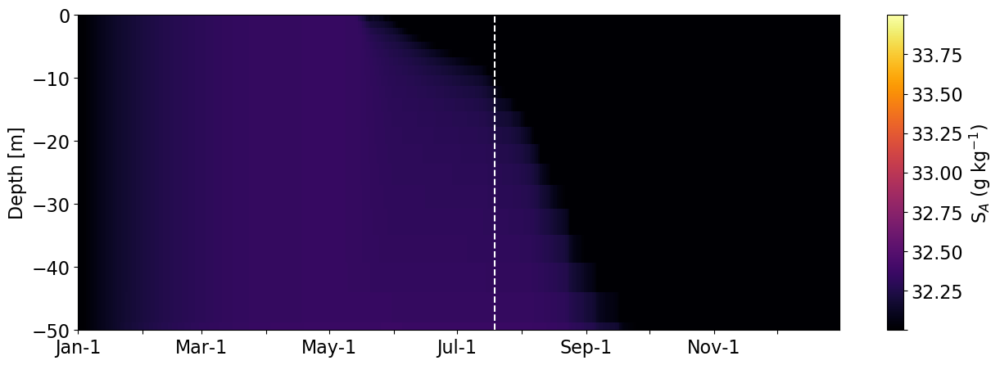

In [77]:
mpl.rc('font', **{'size' : 16})

locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
labels=('Jan-1','','Mar-1','','May-1','',
        'Jul-1','','Sep-1','','Nov-1','')

RF_above55=RF[RF>-55]

plt.figure(figsize=(15,5))
ax = plt.gca()
h=ax.pcolormesh(first_year366,
                RF_above55,
                array2d_idepth_iT_Stavefull[0:(RF_above55.size)-1,array1d_iT1y_iT],
                cmap='inferno',
                vmin=32,
                vmax=34
               )
ax.set_xticklabels([])
ax.set_ylabel('Depth [m]')
ax.set_xlim(first_year366[0],first_year[-1])
ax.set_xticks(locs)
ax.set_xticklabels(labels)
ax.set_ylim(-50,0)
yticklabels=np.arange(32,34.25,0.25)
cbar=plt.colorbar(h,ticks=yticklabels)
cbar.ax.set_yticklabels([
    '','32.25','32.50','32.75','33.00','33.25','33.50','33.75',''])
cbar.set_label('S$_A$ (g kg$^{-1}$)')

ax.axvline(iT15_start_obs,color='w',linestyle='--');

## Output from model NEMO-LIM3 and input into package gud of MITgcm: sea ice concentration

In [78]:
ice=np.fromfile('../../gud_1d_35+16/input_noradtrans/input/siarea.qik.2016.365.32bits.bin',
                dtype='>f')
# for i,v in enumerate(ice):
#     print(i,v)

In [79]:
iT15=np.nonzero(ice<0.15)[0]
iT15_start=iT15[0]
iT15_end=iT15[-1]

In [80]:
iT90=np.nonzero(ice<0.90)[0]
iT90_start=iT90[0]
iT90_end=iT90[-1]

In [81]:
iT15_start

199

In [82]:
iT90_start

199

## Output from model NEMO-LIM3 not used as inputs into MITgcm: snow volume

Snow volume is the weighted average of snow thickness averaged by the sea ice concentration. For example, if there is $50\%$ of sea ice concentration and $2\ m$ of snow on the sea ice-covered part of the pixel, snow volume will be $1\ m$. The expression 'snow thickness' in the labels of the plots corresponds to the variable 'snow volume' in NEMO-LIM3 and the NetCDF file Ice_d.nc.

Variable 'snow volume' is the snow volume ($m$).
It is at indices (1,1) meaning centre of grid point was used.
File 'Ice_d.nc' is the output of NEMO3.6+LIM3.6 configured by Gaetan Olivier (UBO) for the Green Edge ice camp 2016 ($67.48^\circ N$, $-63.79^\circ E$).

### Output from model NEMO-LIM3 not used as inputs into MITgcm: snow volume: from 2013 to 2017

In [83]:
ice_file='../../gud_1d_35+16/input_noradtrans/input/Ice_d.nc'

In [84]:
array1d_iT_snow_volumefull=\
netcdf_tools.read_netcdf(ice_file,'snow volume')
array1d_iT_snow_volumefull=array1d_iT_snow_volumefull[:,1,1]

### Output from model NEMO-LIM3 not used as inputs into MITgcm: snow volume: from 2016

In [85]:
array1d_iT_snow_volume=array1d_iT_snow_volumefull[365*3:365*4]

## Output from model NEMO-LIM3 not used as inputs into MITgcm: ice volume

Ice volume is the weighted average of ice thickness averaged by the sea ice concentration. For example, if there is $50\%$ of sea ice concentration and $2\ m$ of ice on the sea ice-covered part of the pixel, ice volume will be $1\ m$. The expression 'ice thickness' in the labels of the plots corresponds to the variable 'ice volume' in NEMO-LIM3 and the NetCDF file Ice_d.nc.

Variable 'ice volume' is the ice volume ($m$).
It is at indices (1,1) meaning centre of grid point was used.
File 'Ice_d.nc' is the output of NEMO3.6+LIM3.6 configured by Gaetan Olivier (UBO) for the Green Edge ice camp 2016 ($67.48^\circ N$, $-63.79^\circ E$).

### Output from model NEMO-LIM3 not used as inputs into MITgcm: ice volume: from 2013 to 2017

In [86]:
array1d_iT_ice_volumefull=\
netcdf_tools.read_netcdf(ice_file,'ice volume')
array1d_iT_ice_volumefull=array1d_iT_ice_volumefull[:,1,1]

### Output from model NEMO-LIM3 not used as inputs into MITgcm: ice volume: from 2016

In [87]:
array1d_iT_ice_volume=array1d_iT_ice_volumefull[365*3:365*4]

# Model

## Model: chlorophyll $a$ vertically integrated (0-40m)

in $mg\ Chl\ a\ m^{-2}$

In [88]:
chlfile='chl.0000000000.t001.nc';

array2d_idepth_iT_prochlfull\
=netcdf_tools.read_netcdf(chlfile, 'TRAC70').squeeze().transpose()
array2d_idepth_iT_prochlfull[-1,:]=np.nan

array2d_idepth_iT_synchlfull\
=netcdf_tools.read_netcdf(chlfile, 'TRAC71').squeeze().transpose()
array2d_idepth_iT_synchlfull[-1,:]=np.nan

array2d_idepth_iT_smalleuk1umchlfull\
=netcdf_tools.read_netcdf(chlfile, 'TRAC72').squeeze().transpose()
array2d_idepth_iT_smalleuk1umchlfull[-1,:]=np.nan

array2d_idepth_iT_smalleuk2umchlfull\
=netcdf_tools.read_netcdf(chlfile, 'TRAC73').squeeze().transpose()
array2d_idepth_iT_smalleuk2umchlfull[-1,:]=np.nan

array2d_idepth_iT_smalleukchlfull\
=array2d_idepth_iT_smalleuk1umchlfull+array2d_idepth_iT_smalleuk2umchlfull

array2d_idepth_iT_cocco3umchlfull\
=netcdf_tools.read_netcdf(chlfile, 'TRAC74').squeeze().transpose()
array2d_idepth_iT_cocco3umchlfull[-1,:]=np.nan
array2d_idepth_iT_cocco4umchlfull\
=netcdf_tools.read_netcdf(chlfile, 'TRAC75').squeeze().transpose()
array2d_idepth_iT_cocco4umchlfull[-1,:]=np.nan
array2d_idepth_iT_cocco7umchlfull\
=netcdf_tools.read_netcdf(chlfile, 'TRAC76').squeeze().transpose()
array2d_idepth_iT_cocco7umchlfull[-1,:]=np.nan
array2d_idepth_iT_cocco10umchlfull\
=netcdf_tools.read_netcdf(chlfile, 'TRAC77').squeeze().transpose()
array2d_idepth_iT_cocco10umchlfull[-1,:]=np.nan
array2d_idepth_iT_cocco15umchlfull\
=netcdf_tools.read_netcdf(chlfile, 'TRAC78').squeeze().transpose()
array2d_idepth_iT_cocco15umchlfull[-1,:]=np.nan

array2d_idepth_iT_coccochlfull\
=array2d_idepth_iT_cocco3umchlfull+array2d_idepth_iT_cocco4umchlfull\
+array2d_idepth_iT_cocco7umchlfull+array2d_idepth_iT_cocco10umchlfull\
+array2d_idepth_iT_cocco15umchlfull

array2d_idepth_iT_diazo3umchlfull\
=netcdf_tools.read_netcdf(chlfile, 'TRAC79').squeeze().transpose()
array2d_idepth_iT_diazo3umchlfull[-1,:]=np.nan
array2d_idepth_iT_diazo4umchlfull\
=netcdf_tools.read_netcdf(chlfile, 'TRAC80').squeeze().transpose()
array2d_idepth_iT_diazo4umchlfull[-1,:]=np.nan
array2d_idepth_iT_diazo7umchlfull\
=netcdf_tools.read_netcdf(chlfile, 'TRAC81').squeeze().transpose()
array2d_idepth_iT_diazo7umchlfull[-1,:]=np.nan
array2d_idepth_iT_diazo10umchlfull\
=netcdf_tools.read_netcdf(chlfile, 'TRAC82').squeeze().transpose()
array2d_idepth_iT_diazo10umchlfull[-1,:]=np.nan

array2d_idepth_iT_diazochlfull\
=array2d_idepth_iT_diazo3umchlfull+array2d_idepth_iT_diazo4umchlfull\
+array2d_idepth_iT_diazo7umchlfull+array2d_idepth_iT_diazo10umchlfull

array2d_idepth_iT_trichlfull\
=netcdf_tools.read_netcdf(chlfile, 'TRAC83').squeeze().transpose()
array2d_idepth_iT_trichlfull[-1,:]=np.nan

array2d_idepth_iT_diatom7umchlfull\
=netcdf_tools.read_netcdf(chlfile, 'TRAC84').squeeze().transpose()
array2d_idepth_iT_diatom7umchlfull[-1,:]=np.nan
array2d_idepth_iT_diatom10umchlfull\
=netcdf_tools.read_netcdf(chlfile, 'TRAC85').squeeze().transpose()
array2d_idepth_iT_diatom10umchlfull[-1,:]=np.nan
array2d_idepth_iT_diatom15umchlfull\
=netcdf_tools.read_netcdf(chlfile, 'TRAC86').squeeze().transpose()
array2d_idepth_iT_diatom15umchlfull[-1,:]=np.nan
array2d_idepth_iT_diatom22umchlfull\
=netcdf_tools.read_netcdf(chlfile, 'TRAC87').squeeze().transpose()
array2d_idepth_iT_diatom22umchlfull[-1,:]=np.nan
array2d_idepth_iT_diatom32umchlfull\
=netcdf_tools.read_netcdf(chlfile, 'TRAC88').squeeze().transpose()
array2d_idepth_iT_diatom32umchlfull[-1,:]=np.nan
array2d_idepth_iT_diatom47umchlfull\
=netcdf_tools.read_netcdf(chlfile, 'TRAC89').squeeze().transpose()
array2d_idepth_iT_diatom47umchlfull[-1,:]=np.nan
array2d_idepth_iT_diatom70umchlfull\
=netcdf_tools.read_netcdf(chlfile, 'TRAC90').squeeze().transpose()
array2d_idepth_iT_diatom70umchlfull[-1,:]=np.nan
array2d_idepth_iT_diatom104umchlfull\
=netcdf_tools.read_netcdf(chlfile, 'TRAC91').squeeze().transpose()
array2d_idepth_iT_diatom104umchlfull[-1,:]=np.nan
array2d_idepth_iT_diatom154umchlfull\
=netcdf_tools.read_netcdf(chlfile, 'TRAC92').squeeze().transpose()
array2d_idepth_iT_diatom154umchlfull[-1,:]=np.nan

array2d_idepth_iT_diatomchlfull\
=array2d_idepth_iT_diatom7umchlfull+array2d_idepth_iT_diatom10umchlfull\
+array2d_idepth_iT_diatom15umchlfull+array2d_idepth_iT_diatom22umchlfull\
+array2d_idepth_iT_diatom32umchlfull+array2d_idepth_iT_diatom47umchlfull\
+array2d_idepth_iT_diatom70umchlfull+array2d_idepth_iT_diatom104umchlfull\
+array2d_idepth_iT_diatom154umchlfull

array2d_idepth_iT_largeeuk7umchlfull\
=netcdf_tools.read_netcdf(chlfile, 'TRAC93').squeeze().transpose()
array2d_idepth_iT_largeeuk7umchlfull[-1,:]=np.nan
array2d_idepth_iT_largeeuk10umchlfull\
=netcdf_tools.read_netcdf(chlfile, 'TRAC94').squeeze().transpose()
array2d_idepth_iT_largeeuk10umchlfull[-1,:]=np.nan
array2d_idepth_iT_largeeuk15umchlfull\
=netcdf_tools.read_netcdf(chlfile, 'TRAC95').squeeze().transpose()
array2d_idepth_iT_largeeuk15umchlfull[-1,:]=np.nan
array2d_idepth_iT_largeeuk22umchlfull\
=netcdf_tools.read_netcdf(chlfile, 'TRAC96').squeeze().transpose()
array2d_idepth_iT_largeeuk22umchlfull[-1,:]=np.nan
array2d_idepth_iT_largeeuk32umchlfull\
=netcdf_tools.read_netcdf(chlfile, 'TRAC97').squeeze().transpose()
array2d_idepth_iT_largeeuk32umchlfull[-1,:]=np.nan
array2d_idepth_iT_largeeuk47umchlfull\
=netcdf_tools.read_netcdf(chlfile, 'TRAC98').squeeze().transpose()
array2d_idepth_iT_largeeuk47umchlfull[-1,:]=np.nan
array2d_idepth_iT_largeeuk70umchlfull\
=netcdf_tools.read_netcdf(chlfile, 'TRAC99').squeeze().transpose()
array2d_idepth_iT_largeeuk70umchlfull[-1,:]=np.nan
array2d_idepth_iT_largeeuk104umchlfull\
=netcdf_tools.read_netcdf(chlfile, 'TRAC0a').squeeze().transpose()
array2d_idepth_iT_largeeuk104umchlfull[-1,:]=np.nan
array2d_idepth_iT_largeeuk154umchlfull\
=netcdf_tools.read_netcdf(chlfile, 'TRAC0b').squeeze().transpose()
array2d_idepth_iT_largeeuk154umchlfull[-1,:]=np.nan
array2d_idepth_iT_largeeuk228umchlfull\
=netcdf_tools.read_netcdf(chlfile, 'TRAC0c').squeeze().transpose()
array2d_idepth_iT_largeeuk228umchlfull[-1,:]=np.nan

array2d_idepth_iT_largeeukchlfull\
=array2d_idepth_iT_largeeuk7umchlfull+array2d_idepth_iT_largeeuk10umchlfull\
+array2d_idepth_iT_largeeuk15umchlfull+array2d_idepth_iT_largeeuk22umchlfull\
+array2d_idepth_iT_largeeuk32umchlfull+array2d_idepth_iT_largeeuk47umchlfull\
+array2d_idepth_iT_largeeuk70umchlfull+array2d_idepth_iT_largeeuk104umchlfull\
+array2d_idepth_iT_largeeuk154umchlfull+array2d_idepth_iT_largeeuk228umchlfull

array2d_idepth_iT_modchlfull\
=array2d_idepth_iT_prochlfull+array2d_idepth_iT_synchlfull\
+array2d_idepth_iT_smalleukchlfull+array2d_idepth_iT_coccochlfull\
+array2d_idepth_iT_diazochlfull+array2d_idepth_iT_trichlfull\
+array2d_idepth_iT_diatomchlfull+array2d_idepth_iT_largeeukchlfull

array2d_idepth_iT_0_6umchlfull\
=array2d_idepth_iT_prochlfull

array2d_idepth_iT_0_9umchlfull\
=array2d_idepth_iT_synchlfull

array2d_idepth_iT_1umchlfull\
=array2d_idepth_iT_smalleuk1umchlfull

array2d_idepth_iT_2umchlfull\
=array2d_idepth_iT_smalleuk2umchlfull

array2d_idepth_iT_3umchlfull\
=array2d_idepth_iT_cocco3umchlfull+array2d_idepth_iT_diazo3umchlfull

array2d_idepth_iT_4umchlfull\
=array2d_idepth_iT_cocco4umchlfull+array2d_idepth_iT_diazo4umchlfull

array2d_idepth_iT_7umchlfull\
=array2d_idepth_iT_cocco7umchlfull+array2d_idepth_iT_diazo7umchlfull\
+array2d_idepth_iT_diatom7umchlfull+array2d_idepth_iT_largeeuk7umchlfull

array2d_idepth_iT_10umchlfull\
=array2d_idepth_iT_cocco10umchlfull+array2d_idepth_iT_diazo10umchlfull\
+array2d_idepth_iT_diatom10umchlfull+array2d_idepth_iT_largeeuk10umchlfull

array2d_idepth_iT_15umchlfull\
=array2d_idepth_iT_cocco15umchlfull+array2d_idepth_iT_trichlfull\
+array2d_idepth_iT_diatom15umchlfull+array2d_idepth_iT_largeeuk15umchlfull

array2d_idepth_iT_22umchlfull\
=array2d_idepth_iT_diatom22umchlfull+array2d_idepth_iT_largeeuk22umchlfull

array2d_idepth_iT_32umchlfull\
=array2d_idepth_iT_diatom32umchlfull+array2d_idepth_iT_largeeuk32umchlfull

array2d_idepth_iT_47umchlfull\
=array2d_idepth_iT_diatom47umchlfull+array2d_idepth_iT_largeeuk47umchlfull

array2d_idepth_iT_70umchlfull\
=array2d_idepth_iT_diatom70umchlfull+array2d_idepth_iT_largeeuk70umchlfull

array2d_idepth_iT_104umchlfull\
=array2d_idepth_iT_diatom104umchlfull+array2d_idepth_iT_largeeuk104umchlfull

array2d_idepth_iT_154umchlfull\
=array2d_idepth_iT_diatom154umchlfull+array2d_idepth_iT_largeeuk154umchlfull

array2d_idepth_iT_228umchlfull\
=array2d_idepth_iT_largeeuk228umchlfull

In [89]:
# mg Chl-a m^-2
array1d_iT_modvint40mchlfull\
=vstats.vint(
    array2d_idepth_iT_tracer=array2d_idepth_iT_modchlfull,
    array1d_idepth_delR=drF,
    depth_end=-40)

array1d_iT_modvint40mchl=array1d_iT_modvint40mchlfull[array1d_iT1y_iT]

## Model: chlorophyll $a$ vertically integrated (0-100m)

in $mg\ Chl\ a\ m^{-2}$

In [90]:
# mg Chl-a m^-2
array1d_iT_modvintchlfull\
=vstats.vint(
    array2d_idepth_iT_tracer=array2d_idepth_iT_modchlfull,
    array1d_idepth_delR=drF,
    depth_end=-100)

array1d_iT_modvintchl=array1d_iT_modvintchlfull[array1d_iT1y_iT]

## Model: mean chlorophyll a (0-40m)

in $mg\ Chl\ a\ m^{-3}$

In [91]:
array1d_it_modmeanchlfull \
=vstats.mean(array2d_idepth_iT_tracer=array2d_idepth_iT_modchlfull,
             array1d_idepth_delR=drF,
             depth_end=-40
            )
array1d_iT_modmeanchl=array1d_it_modmeanchlfull[array1d_iT1y_iT]

## Model: biomass vertically integrated (0-40m)

in $g\ C\ m^{-2}$

In [92]:
carfile='car.0000000000.t001.nc';

molarmassC=12.0107 # g C (mol C)^-1

array2d_idepth_iT_probiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC21').squeeze().transpose()
array2d_idepth_iT_probiofull[-1,:]=np.nan
# mmol C m^-3 -> g C m^-3
array2d_idepth_iT_probiofull\
=array2d_idepth_iT_probiofull*molarmassC/1e3

array2d_idepth_iT_synbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC22').squeeze().transpose()
array2d_idepth_iT_synbiofull[-1,:]=np.nan
array2d_idepth_iT_synbiofull\
=array2d_idepth_iT_synbiofull*molarmassC/1e3

array2d_idepth_iT_smalleuk1umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC23').squeeze().transpose()
array2d_idepth_iT_smalleuk1umbiofull[-1,:]=np.nan
array2d_idepth_iT_smalleuk1umbiofull\
=array2d_idepth_iT_smalleuk1umbiofull*molarmassC/1e3

array2d_idepth_iT_smalleuk2umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC24').squeeze().transpose()
array2d_idepth_iT_smalleuk2umbiofull[-1,:]=np.nan
array2d_idepth_iT_smalleuk2umbiofull\
=array2d_idepth_iT_smalleuk2umbiofull*molarmassC/1e3

array2d_idepth_iT_smalleukbiofull\
=array2d_idepth_iT_smalleuk1umbiofull+array2d_idepth_iT_smalleuk2umbiofull

array2d_idepth_iT_cocco3umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC25').squeeze().transpose()
array2d_idepth_iT_cocco3umbiofull[-1,:]=np.nan
array2d_idepth_iT_cocco3umbiofull\
=array2d_idepth_iT_cocco3umbiofull*molarmassC/1e3
array2d_idepth_iT_cocco4umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC26').squeeze().transpose()
array2d_idepth_iT_cocco4umbiofull[-1,:]=np.nan
array2d_idepth_iT_cocco4umbiofull\
=array2d_idepth_iT_cocco4umbiofull*molarmassC/1e3
array2d_idepth_iT_cocco7umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC27').squeeze().transpose()
array2d_idepth_iT_cocco7umbiofull[-1,:]=np.nan
array2d_idepth_iT_cocco7umbiofull\
=array2d_idepth_iT_cocco7umbiofull*molarmassC/1e3
array2d_idepth_iT_cocco10umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC28').squeeze().transpose()
array2d_idepth_iT_cocco10umbiofull[-1,:]=np.nan
array2d_idepth_iT_cocco10umbiofull\
=array2d_idepth_iT_cocco10umbiofull*molarmassC/1e3
array2d_idepth_iT_cocco15umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC29').squeeze().transpose()
array2d_idepth_iT_cocco15umbiofull[-1,:]=np.nan
array2d_idepth_iT_cocco15umbiofull\
=array2d_idepth_iT_cocco15umbiofull*molarmassC/1e3

array2d_idepth_iT_modcoccobiofull\
=array2d_idepth_iT_cocco3umbiofull+array2d_idepth_iT_cocco4umbiofull\
+array2d_idepth_iT_cocco7umbiofull+array2d_idepth_iT_cocco10umbiofull\
+array2d_idepth_iT_cocco15umbiofull

array2d_idepth_iT_diazo3umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC30').squeeze().transpose()
array2d_idepth_iT_diazo3umbiofull[-1,:]=np.nan
array2d_idepth_iT_diazo3umbiofull\
=array2d_idepth_iT_diazo3umbiofull*molarmassC/1e3
array2d_idepth_iT_diazo4umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC31').squeeze().transpose()
array2d_idepth_iT_diazo4umbiofull[-1,:]=np.nan
array2d_idepth_iT_diazo4umbiofull\
=array2d_idepth_iT_diazo4umbiofull*molarmassC/1e3
array2d_idepth_iT_diazo7umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC32').squeeze().transpose()
array2d_idepth_iT_diazo7umbiofull[-1,:]=np.nan
array2d_idepth_iT_diazo7umbiofull\
=array2d_idepth_iT_diazo7umbiofull*molarmassC/1e3
array2d_idepth_iT_diazo10umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC33').squeeze().transpose()
array2d_idepth_iT_diazo10umbiofull[-1,:]=np.nan
array2d_idepth_iT_diazo10umbiofull\
=array2d_idepth_iT_diazo10umbiofull*molarmassC/1e3

array2d_idepth_iT_diazobiofull\
=array2d_idepth_iT_diazo3umbiofull+array2d_idepth_iT_diazo4umbiofull\
+array2d_idepth_iT_diazo7umbiofull+array2d_idepth_iT_diazo10umbiofull

array2d_idepth_iT_tribiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC34').squeeze().transpose()
array2d_idepth_iT_tribiofull[-1,:]=np.nan
array2d_idepth_iT_tribiofull\
=array2d_idepth_iT_tribiofull*molarmassC/1e3

array2d_idepth_iT_diatom7umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC35').squeeze().transpose()
array2d_idepth_iT_diatom7umbiofull[-1,:]=np.nan
array2d_idepth_iT_diatom7umbiofull\
=array2d_idepth_iT_diatom7umbiofull*molarmassC/1e3
array2d_idepth_iT_diatom10umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC36').squeeze().transpose()
array2d_idepth_iT_diatom10umbiofull[-1,:]=np.nan
array2d_idepth_iT_diatom10umbiofull\
=array2d_idepth_iT_diatom10umbiofull*molarmassC/1e3
array2d_idepth_iT_diatom15umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC37').squeeze().transpose()
array2d_idepth_iT_diatom15umbiofull[-1,:]=np.nan
array2d_idepth_iT_diatom15umbiofull\
=array2d_idepth_iT_diatom15umbiofull*molarmassC/1e3
array2d_idepth_iT_diatom22umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC38').squeeze().transpose()
array2d_idepth_iT_diatom22umbiofull[-1,:]=np.nan
array2d_idepth_iT_diatom22umbiofull\
=array2d_idepth_iT_diatom22umbiofull*molarmassC/1e3
array2d_idepth_iT_diatom32umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC39').squeeze().transpose()
array2d_idepth_iT_diatom32umbiofull[-1,:]=np.nan
array2d_idepth_iT_diatom32umbiofull\
=array2d_idepth_iT_diatom32umbiofull*molarmassC/1e3
array2d_idepth_iT_diatom47umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC40').squeeze().transpose()
array2d_idepth_iT_diatom47umbiofull[-1,:]=np.nan
array2d_idepth_iT_diatom47umbiofull\
=array2d_idepth_iT_diatom47umbiofull*molarmassC/1e3
array2d_idepth_iT_diatom70umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC41').squeeze().transpose()
array2d_idepth_iT_diatom70umbiofull[-1,:]=np.nan
array2d_idepth_iT_diatom70umbiofull\
=array2d_idepth_iT_diatom70umbiofull*molarmassC/1e3
array2d_idepth_iT_diatom104umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC42').squeeze().transpose()
array2d_idepth_iT_diatom104umbiofull[-1,:]=np.nan
array2d_idepth_iT_diatom104umbiofull\
=array2d_idepth_iT_diatom104umbiofull*molarmassC/1e3
array2d_idepth_iT_diatom154umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC43').squeeze().transpose()
array2d_idepth_iT_diatom154umbiofull[-1,:]=np.nan
array2d_idepth_iT_diatom154umbiofull\
=array2d_idepth_iT_diatom154umbiofull*molarmassC/1e3

array2d_idepth_iT_moddiatombiofull\
=array2d_idepth_iT_diatom7umbiofull+array2d_idepth_iT_diatom10umbiofull\
+array2d_idepth_iT_diatom15umbiofull+array2d_idepth_iT_diatom22umbiofull\
+array2d_idepth_iT_diatom32umbiofull+array2d_idepth_iT_diatom47umbiofull\
+array2d_idepth_iT_diatom70umbiofull+array2d_idepth_iT_diatom104umbiofull\
+array2d_idepth_iT_diatom154umbiofull

array2d_idepth_iT_largeeuk7umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC44').squeeze().transpose()
array2d_idepth_iT_largeeuk7umbiofull[-1,:]=np.nan
array2d_idepth_iT_largeeuk7umbiofull\
=array2d_idepth_iT_largeeuk7umbiofull*molarmassC/1e3
array2d_idepth_iT_largeeuk10umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC45').squeeze().transpose()
array2d_idepth_iT_largeeuk10umbiofull[-1,:]=np.nan
array2d_idepth_iT_largeeuk10umbiofull\
=array2d_idepth_iT_largeeuk10umbiofull*molarmassC/1e3
array2d_idepth_iT_largeeuk15umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC46').squeeze().transpose()
array2d_idepth_iT_largeeuk15umbiofull[-1,:]=np.nan
array2d_idepth_iT_largeeuk15umbiofull\
=array2d_idepth_iT_largeeuk15umbiofull*molarmassC/1e3
array2d_idepth_iT_largeeuk22umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC47').squeeze().transpose()
array2d_idepth_iT_largeeuk22umbiofull[-1,:]=np.nan
array2d_idepth_iT_largeeuk22umbiofull\
=array2d_idepth_iT_largeeuk22umbiofull*molarmassC/1e3
array2d_idepth_iT_largeeuk32umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC48').squeeze().transpose()
array2d_idepth_iT_largeeuk32umbiofull[-1,:]=np.nan
array2d_idepth_iT_largeeuk32umbiofull\
=array2d_idepth_iT_largeeuk32umbiofull*molarmassC/1e3
array2d_idepth_iT_largeeuk47umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC49').squeeze().transpose()
array2d_idepth_iT_largeeuk47umbiofull[-1,:]=np.nan
array2d_idepth_iT_largeeuk47umbiofull\
=array2d_idepth_iT_largeeuk47umbiofull*molarmassC/1e3
array2d_idepth_iT_largeeuk70umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC50').squeeze().transpose()
array2d_idepth_iT_largeeuk70umbiofull[-1,:]=np.nan
array2d_idepth_iT_largeeuk70umbiofull\
=array2d_idepth_iT_largeeuk70umbiofull*molarmassC/1e3
array2d_idepth_iT_largeeuk104umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC51').squeeze().transpose()
array2d_idepth_iT_largeeuk104umbiofull[-1,:]=np.nan
array2d_idepth_iT_largeeuk104umbiofull\
=array2d_idepth_iT_largeeuk104umbiofull*molarmassC/1e3
array2d_idepth_iT_largeeuk154umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC52').squeeze().transpose()
array2d_idepth_iT_largeeuk154umbiofull[-1,:]=np.nan
array2d_idepth_iT_largeeuk154umbiofull\
=array2d_idepth_iT_largeeuk154umbiofull*molarmassC/1e3
array2d_idepth_iT_largeeuk228umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC53').squeeze().transpose()
array2d_idepth_iT_largeeuk228umbiofull[-1,:]=np.nan
array2d_idepth_iT_largeeuk228umbiofull\
=array2d_idepth_iT_largeeuk228umbiofull*molarmassC/1e3

array2d_idepth_iT_moddinobiofull\
=array2d_idepth_iT_largeeuk7umbiofull+array2d_idepth_iT_largeeuk10umbiofull\
+array2d_idepth_iT_largeeuk15umbiofull+array2d_idepth_iT_largeeuk22umbiofull\
+array2d_idepth_iT_largeeuk32umbiofull+array2d_idepth_iT_largeeuk47umbiofull\
+array2d_idepth_iT_largeeuk70umbiofull+array2d_idepth_iT_largeeuk104umbiofull\
+array2d_idepth_iT_largeeuk154umbiofull+array2d_idepth_iT_largeeuk228umbiofull

array2d_idepth_iT_modphytobiofull\
=array2d_idepth_iT_probiofull+array2d_idepth_iT_synbiofull\
+array2d_idepth_iT_smalleukbiofull+array2d_idepth_iT_modcoccobiofull\
+array2d_idepth_iT_diazobiofull+array2d_idepth_iT_tribiofull\
+array2d_idepth_iT_moddiatombiofull+array2d_idepth_iT_moddinobiofull

array2d_idepth_iT_0_6umbiofull\
=array2d_idepth_iT_probiofull

array2d_idepth_iT_0_9umbiofull\
=array2d_idepth_iT_synbiofull

array2d_idepth_iT_1umbiofull\
=array2d_idepth_iT_smalleuk1umbiofull

array2d_idepth_iT_2umbiofull\
=array2d_idepth_iT_smalleuk2umbiofull

array2d_idepth_iT_3umbiofull\
=array2d_idepth_iT_cocco3umbiofull+array2d_idepth_iT_diazo3umbiofull

array2d_idepth_iT_4umbiofull\
=array2d_idepth_iT_cocco4umbiofull+array2d_idepth_iT_diazo4umbiofull

array2d_idepth_iT_7umbiofull\
=array2d_idepth_iT_cocco7umbiofull+array2d_idepth_iT_diazo7umbiofull\
+array2d_idepth_iT_diatom7umbiofull+array2d_idepth_iT_largeeuk7umbiofull

array2d_idepth_iT_10umbiofull\
=array2d_idepth_iT_cocco10umbiofull+array2d_idepth_iT_diazo10umbiofull\
+array2d_idepth_iT_diatom10umbiofull+array2d_idepth_iT_largeeuk10umbiofull

array2d_idepth_iT_15umbiofull\
=array2d_idepth_iT_cocco15umbiofull+array2d_idepth_iT_tribiofull\
+array2d_idepth_iT_diatom15umbiofull+array2d_idepth_iT_largeeuk15umbiofull

array2d_idepth_iT_22umbiofull\
=array2d_idepth_iT_diatom22umbiofull+array2d_idepth_iT_largeeuk22umbiofull

array2d_idepth_iT_32umbiofull\
=array2d_idepth_iT_diatom32umbiofull+array2d_idepth_iT_largeeuk32umbiofull

array2d_idepth_iT_47umbiofull\
=array2d_idepth_iT_diatom47umbiofull+array2d_idepth_iT_largeeuk47umbiofull

array2d_idepth_iT_70umbiofull\
=array2d_idepth_iT_diatom70umbiofull+array2d_idepth_iT_largeeuk70umbiofull

array2d_idepth_iT_104umbiofull\
=array2d_idepth_iT_diatom104umbiofull+array2d_idepth_iT_largeeuk104umbiofull

array2d_idepth_iT_154umbiofull\
=array2d_idepth_iT_diatom154umbiofull+array2d_idepth_iT_largeeuk154umbiofull

array2d_idepth_iT_228umbiofull\
=array2d_idepth_iT_largeeuk228umbiofull

#  g C m^-3 -> g C m^-2
array1d_iT_mod40mphytobiofull\
=vstats.vint(
    array2d_idepth_iT_tracer=array2d_idepth_iT_modphytobiofull,
    array1d_idepth_delR=drF,
    depth_end=-40)

array1d_iT_mod40mphytobio=array1d_iT_mod40mphytobiofull[array1d_iT1y_iT]

array2d_idepth_iT_zoo7umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC54').squeeze().transpose()
array2d_idepth_iT_zoo7umbiofull[-1,:]=np.nan
array2d_idepth_iT_zoo7umbiofull\
=array2d_idepth_iT_zoo7umbiofull*molarmassC/1e3
array2d_idepth_iT_zoo10umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC55').squeeze().transpose()
array2d_idepth_iT_zoo10umbiofull[-1,:]=np.nan
array2d_idepth_iT_zoo10umbiofull\
=array2d_idepth_iT_zoo10umbiofull*molarmassC/1e3
array2d_idepth_iT_zoo15umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC56').squeeze().transpose()
array2d_idepth_iT_zoo15umbiofull[-1,:]=np.nan
array2d_idepth_iT_zoo15umbiofull\
=array2d_idepth_iT_zoo15umbiofull*molarmassC/1e3
array2d_idepth_iT_zoo22umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC57').squeeze().transpose()
array2d_idepth_iT_zoo22umbiofull[-1,:]=np.nan
array2d_idepth_iT_zoo22umbiofull\
=array2d_idepth_iT_zoo22umbiofull*molarmassC/1e3
array2d_idepth_iT_zoo32umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC58').squeeze().transpose()
array2d_idepth_iT_zoo32umbiofull[-1,:]=np.nan
array2d_idepth_iT_zoo32umbiofull\
=array2d_idepth_iT_zoo32umbiofull*molarmassC/1e3
array2d_idepth_iT_zoo47umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC59').squeeze().transpose()
array2d_idepth_iT_zoo47umbiofull[-1,:]=np.nan
array2d_idepth_iT_zoo47umbiofull\
=array2d_idepth_iT_zoo47umbiofull*molarmassC/1e3
array2d_idepth_iT_zoo70umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC60').squeeze().transpose()
array2d_idepth_iT_zoo70umbiofull[-1,:]=np.nan
array2d_idepth_iT_zoo70umbiofull\
=array2d_idepth_iT_zoo70umbiofull*molarmassC/1e3
array2d_idepth_iT_zoo104umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC61').squeeze().transpose()
array2d_idepth_iT_zoo104umbiofull[-1,:]=np.nan
array2d_idepth_iT_zoo104umbiofull\
=array2d_idepth_iT_zoo104umbiofull*molarmassC/1e3
array2d_idepth_iT_zoo154umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC62').squeeze().transpose()
array2d_idepth_iT_zoo154umbiofull[-1,:]=np.nan
array2d_idepth_iT_zoo154umbiofull\
=array2d_idepth_iT_zoo154umbiofull*molarmassC/1e3
array2d_idepth_iT_zoo228umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC63').squeeze().transpose()
array2d_idepth_iT_zoo228umbiofull[-1,:]=np.nan
array2d_idepth_iT_zoo228umbiofull\
=array2d_idepth_iT_zoo228umbiofull*molarmassC/1e3
array2d_idepth_iT_zoo339umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC64').squeeze().transpose()
array2d_idepth_iT_zoo339umbiofull[-1,:]=np.nan
array2d_idepth_iT_zoo339umbiofull\
=array2d_idepth_iT_zoo339umbiofull*molarmassC/1e3
array2d_idepth_iT_zoo502umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC65').squeeze().transpose()
array2d_idepth_iT_zoo502umbiofull[-1,:]=np.nan
array2d_idepth_iT_zoo502umbiofull\
=array2d_idepth_iT_zoo502umbiofull*molarmassC/1e3
array2d_idepth_iT_zoo744umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC66').squeeze().transpose()
array2d_idepth_iT_zoo744umbiofull[-1,:]=np.nan
array2d_idepth_iT_zoo744umbiofull\
=array2d_idepth_iT_zoo744umbiofull*molarmassC/1e3
array2d_idepth_iT_zoo1103umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC67').squeeze().transpose()
array2d_idepth_iT_zoo1103umbiofull[-1,:]=np.nan
array2d_idepth_iT_zoo1103umbiofull\
=array2d_idepth_iT_zoo1103umbiofull*molarmassC/1e3
array2d_idepth_iT_zoo1636umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC68').squeeze().transpose()
array2d_idepth_iT_zoo1636umbiofull[-1,:]=np.nan
array2d_idepth_iT_zoo1636umbiofull\
=array2d_idepth_iT_zoo1636umbiofull*molarmassC/1e3
array2d_idepth_iT_zoo2425umbiofull\
=netcdf_tools.read_netcdf(carfile, 'TRAC69').squeeze().transpose()
array2d_idepth_iT_zoo2425umbiofull[-1,:]=np.nan
array2d_idepth_iT_zoo2425umbiofull\
=array2d_idepth_iT_zoo2425umbiofull*molarmassC/1e3

array2d_idepth_iT_modzoobiofull\
=array2d_idepth_iT_zoo7umbiofull+array2d_idepth_iT_zoo10umbiofull\
+array2d_idepth_iT_zoo15umbiofull+array2d_idepth_iT_zoo22umbiofull\
+array2d_idepth_iT_zoo32umbiofull+array2d_idepth_iT_zoo47umbiofull\
+array2d_idepth_iT_zoo70umbiofull+array2d_idepth_iT_zoo104umbiofull\
+array2d_idepth_iT_zoo154umbiofull+array2d_idepth_iT_zoo228umbiofull\
+array2d_idepth_iT_zoo339umbiofull+array2d_idepth_iT_zoo502umbiofull\
+array2d_idepth_iT_zoo744umbiofull+array2d_idepth_iT_zoo1103umbiofull\
+array2d_idepth_iT_zoo1636umbiofull+array2d_idepth_iT_zoo2425umbiofull

#  g C m^-3 -> g C m^-2
array1d_iT_mod40mzoobiofull\
=vstats.vint(
    array2d_idepth_iT_tracer=array2d_idepth_iT_modzoobiofull,
    array1d_idepth_delR=drF,
    depth_end=-40)

array1d_iT_mod40mzoobio=array1d_iT_mod40mzoobiofull[array1d_iT1y_iT]

## Model: biomass vertically integrated (0-100m)

in $g\ C\ m^{-2}$

In [93]:
#  g C m^-3 -> g C m^-2
array1d_iT_modphytobiofull\
=vstats.vint(
    array2d_idepth_iT_tracer=array2d_idepth_iT_modphytobiofull,
    array1d_idepth_delR=drF,
    depth_end=-100)

array1d_iT_modphytobio=array1d_iT_modphytobiofull[array1d_iT1y_iT]

#  g C m^-3 -> g C m^-2
array1d_iT_modzoobiofull\
=vstats.vint(
    array2d_idepth_iT_tracer=array2d_idepth_iT_modzoobiofull,
    array1d_idepth_delR=drF,
    depth_end=-100)

array1d_iT_modzoobio=array1d_iT_modzoobiofull[array1d_iT1y_iT]

# Model: mean biomass (0-40m)

in $g\ C\ m^{-3}$

In [94]:
array1d_iT_modmeanphytobiofull \
=vstats.mean(array2d_idepth_iT_tracer=array2d_idepth_iT_modphytobiofull,
             array1d_idepth_delR=drF,
             depth_end=-40
            )
array1d_iT_modmeanphytobio=array1d_iT_modmeanphytobiofull[array1d_iT1y_iT]

## Model: phytoplankton biomass vertically integrated (0-100m) for each group

in $g\ C\ m^{-2}$

In [95]:
array2d_idepth_iT_prokbiofull\
=array2d_idepth_iT_probiofull+array2d_idepth_iT_synbiofull\
+array2d_idepth_iT_diazobiofull+array2d_idepth_iT_tribiofull

# g C m^-3 -> g C m^-2
array1d_iT_prokbiofull\
=vstats.vint(
    array2d_idepth_iT_tracer=array2d_idepth_iT_prokbiofull,
    array1d_idepth_delR=drF,
    depth_end=-100)

array1d_iT_prokbio=array1d_iT_prokbiofull[array1d_iT1y_iT]

# g C m^-3 -> g C m^-2
array1d_iT_smalleukbiofull\
=vstats.vint(
    array2d_idepth_iT_tracer=array2d_idepth_iT_smalleukbiofull,
    array1d_idepth_delR=drF,
    depth_end=-100)

array1d_iT_smalleukbio=array1d_iT_smalleukbiofull[array1d_iT1y_iT]

array2d_idepth_iT_modpicobiofull\
=array2d_idepth_iT_probiofull+array2d_idepth_iT_synbiofull\
+array2d_idepth_iT_smalleukbiofull

# g C m^-3 -> g C m^-2
array1d_iT_modpicobiofull\
=vstats.vint(
    array2d_idepth_iT_tracer=array2d_idepth_iT_modpicobiofull,
    array1d_idepth_delR=drF,
    depth_end=-100)

array1d_iT_modpicobio=array1d_iT_modpicobiofull[array1d_iT1y_iT]

# g C m^-3 -> g C m^-2
array1d_iT_modcoccobiofull\
=vstats.vint(
    array2d_idepth_iT_tracer=array2d_idepth_iT_modcoccobiofull,
    array1d_idepth_delR=drF,
    depth_end=-100)

array1d_iT_modcoccobio=array1d_iT_modcoccobiofull[array1d_iT1y_iT]

array2d_idepth_iT_moddiazbiofull\
=array2d_idepth_iT_diazobiofull+array2d_idepth_iT_tribiofull

# g C m^-3 -> g C m^-2
array1d_iT_moddiazbiofull\
=vstats.vint(
    array2d_idepth_iT_tracer=array2d_idepth_iT_moddiazbiofull,
    array1d_idepth_delR=drF,
    depth_end=-100)

array1d_iT_moddiazbio=array1d_iT_moddiazbiofull[array1d_iT1y_iT]

# g C m^-3 -> g C m^-2
array1d_iT_moddiatombiofull\
=vstats.vint(
    array2d_idepth_iT_tracer=array2d_idepth_iT_moddiatombiofull,
    array1d_idepth_delR=drF,
    depth_end=-100)

array1d_iT_moddiatombio=array1d_iT_moddiatombiofull[array1d_iT1y_iT]

#  g C m^-3 -> g C m^-2
array1d_iT_moddinobiofull\
=vstats.vint(
    array2d_idepth_iT_tracer=array2d_idepth_iT_moddinobiofull,
    array1d_idepth_delR=drF,
    depth_end=-100)

array1d_iT_moddinobio=array1d_iT_moddinobiofull[array1d_iT1y_iT]

## Model: phytoplankton biomass vertically integrated (0-100m) for each size

in $g\ C\ m^{-2}$

In [96]:
# g C m^-3 -> g C m^-2
array1d_iT_0_6umbiofull\
=vstats.vint(
    array2d_idepth_iT_tracer=array2d_idepth_iT_0_6umbiofull,
    array1d_idepth_delR=drF,
    depth_end=-100)
array1d_iT_0_6umbio=array1d_iT_0_6umbiofull[array1d_iT1y_iT]

# g C m^-3 -> g C m^-2
array1d_iT_0_9umbiofull\
=vstats.vint(
    array2d_idepth_iT_tracer=array2d_idepth_iT_0_9umbiofull,
    array1d_idepth_delR=drF,
    depth_end=-100)
array1d_iT_0_9umbio=array1d_iT_0_9umbiofull[array1d_iT1y_iT]

array2d_idepth_iT_lt1umbiofull\
=array2d_idepth_iT_0_6umbiofull+array2d_idepth_iT_0_9umbiofull

# g C m^-3 -> g C m^-2
array1d_iT_lt1umbiofull\
=vstats.vint(
    array2d_idepth_iT_tracer=array2d_idepth_iT_lt1umbiofull,
    array1d_idepth_delR=drF,
    depth_end=-100)

array1d_iT_lt1umbio=array1d_iT_lt1umbiofull[array1d_iT1y_iT]

# g C m^-3 -> g C m^-2
array1d_iT_1umbiofull\
=vstats.vint(
    array2d_idepth_iT_tracer=array2d_idepth_iT_1umbiofull,
    array1d_idepth_delR=drF,
    depth_end=-100)

array1d_iT_1umbio=array1d_iT_1umbiofull[array1d_iT1y_iT]

# g C m^-3 -> g C m^-2
array1d_iT_2umbiofull\
=vstats.vint(
    array2d_idepth_iT_tracer=array2d_idepth_iT_2umbiofull,
    array1d_idepth_delR=drF,
    depth_end=-100)

array1d_iT_2umbio=array1d_iT_2umbiofull[array1d_iT1y_iT]

array2d_idepth_iT_lt3umbiofull\
=array2d_idepth_iT_0_6umbiofull+array2d_idepth_iT_0_9umbiofull\
+array2d_idepth_iT_1umbiofull+array2d_idepth_iT_2umbiofull

# g C m^-3 -> g C m^-2
array1d_iT_lt3umbiofull\
=vstats.vint(
    array2d_idepth_iT_tracer=array2d_idepth_iT_lt3umbiofull,
    array1d_idepth_delR=drF,
    depth_end=-100)

array1d_iT_lt3umbio=array1d_iT_lt3umbiofull[array1d_iT1y_iT]

# g C m^-3 -> g C m^-2
array1d_iT_3umbiofull\
=vstats.vint(
    array2d_idepth_iT_tracer=array2d_idepth_iT_3umbiofull,
    array1d_idepth_delR=drF,
    depth_end=-100)

array1d_iT_3umbio=array1d_iT_3umbiofull[array1d_iT1y_iT]

# g C m^-3 -> g C m^-2
array1d_iT_4umbiofull\
=vstats.vint(
    array2d_idepth_iT_tracer=array2d_idepth_iT_4umbiofull,
    array1d_idepth_delR=drF,
    depth_end=-100)

array1d_iT_4umbio=array1d_iT_4umbiofull[array1d_iT1y_iT]

# g C m^-3 -> g C m^-2
array1d_iT_7umbiofull\
=vstats.vint(
    array2d_idepth_iT_tracer=array2d_idepth_iT_7umbiofull,
    array1d_idepth_delR=drF,
    depth_end=-100)

array1d_iT_7umbio=array1d_iT_7umbiofull[array1d_iT1y_iT]

# g C m^-3 -> g C m^-2
array1d_iT_10umbiofull\
=vstats.vint(
    array2d_idepth_iT_tracer=array2d_idepth_iT_10umbiofull,
    array1d_idepth_delR=drF,
    depth_end=-100)
array1d_iT_10umbio=array1d_iT_10umbiofull[array1d_iT1y_iT]

# g C m^-3 -> g C m^-2
array1d_iT_15umbiofull\
=vstats.vint(
    array2d_idepth_iT_tracer=array2d_idepth_iT_15umbiofull,
    array1d_idepth_delR=drF,
    depth_end=-100)
array1d_iT_15umbio=array1d_iT_15umbiofull[array1d_iT1y_iT]

array2d_idepth_iT_gt10umbiofull\
=array2d_idepth_iT_15umbiofull+array2d_idepth_iT_22umbiofull\
+array2d_idepth_iT_32umbiofull+array2d_idepth_iT_47umbiofull\
+array2d_idepth_iT_70umbiofull+array2d_idepth_iT_104umbiofull\
+array2d_idepth_iT_154umbiofull+array2d_idepth_iT_228umbiofull

# g C m^-3 -> g C m^-2
array1d_iT_gt10umbiofull\
=vstats.vint(
    array2d_idepth_iT_tracer=array2d_idepth_iT_gt10umbiofull,
    array1d_idepth_delR=drF,
    depth_end=-100)

array1d_iT_gt10umbio=array1d_iT_gt10umbiofull[array1d_iT1y_iT]

array2d_idepth_iT_gt20umbiofull\
=array2d_idepth_iT_22umbiofull\
+array2d_idepth_iT_32umbiofull+array2d_idepth_iT_47umbiofull\
+array2d_idepth_iT_70umbiofull+array2d_idepth_iT_104umbiofull\
+array2d_idepth_iT_154umbiofull+array2d_idepth_iT_228umbiofull

# g C m^-3 -> g C m^-2
array1d_iT_gt20umbiofull\
=vstats.vint(
    array2d_idepth_iT_tracer=array2d_idepth_iT_gt20umbiofull,
    array1d_idepth_delR=drF,
    depth_end=-100)

array1d_iT_gt20umbio=array1d_iT_gt20umbiofull[array1d_iT1y_iT]

## Model: daily primary productivity vertically integrated (0-100m)

in $mg\ C\ m^{-2}\ d^{-1}$

In [97]:
ratesfile='rates.0000000000.t001.nc';

# mmol C m^-3 s^-1
array2d_idepth_iT_PPfullmmolConm3s\
=netcdf_tools.read_netcdf(ratesfile, 'PP').squeeze().transpose()
molarmassC=12.0107 # g C (mol C)^-1
stod=86400 # 3600*24 s per d
array2d_idepth_iT_modPPfull=array2d_idepth_iT_PPfullmmolConm3s*molarmassC*stod # mg C m^-3 d^-1
array1d_iT_moddppfull\
=vstats.vint(
    array2d_idepth_iT_tracer=array2d_idepth_iT_modPPfull,
    array1d_idepth_delR=drF,
    depth_end=-100)
array1d_iT_moddpp=array1d_iT_moddppfull[array1d_iT1y_iT]

# Relations between many variables

## Observations: chlorophyll a similar to Randelhoff et al. 2019 Fig. 9

In [98]:
array1d_idepth_iT_obsStave=np.empty((RF_above55.size-1,array1d_iT1y_iT.size))
array1d_idepth_iT_obsStave[:,:]=np.NaN
array1d_iT_obssilica3m=np.empty(365)
array1d_iT_obssilica3m[:]=np.NaN
array1d_iT_obsnitrate3m=np.empty(365)
array1d_iT_obsnitrate3m[:]=np.NaN
array1d_iT_obsPAR3m=np.empty(365)
array1d_iT_obsPAR3m[:]=np.NaN
array1d_iT_obsisolume=np.empty(365)
array1d_iT_obsisolume[:]=np.NaN

In [99]:
for doy in pd.unique(nutrients_df['doy']):
    y_interp=scipy.interpolate.interp1d(
        nutrients_df[nutrients_df.doy==doy]['depth'],
        nutrients_df[nutrients_df.doy==doy]['no3'])
    array1d_iT_obsnitrate3m[doy-1]=y_interp(-3)

In [100]:
for doy in pd.unique(nutrients_df['doy']):
    y_interp=scipy.interpolate.interp1d(
        nutrients_df[nutrients_df.doy==doy]['depth'],
        nutrients_df[nutrients_df.doy==doy]['sioh4'])
    array1d_iT_obssilica3m[doy-1]=y_interp(-3)

In [101]:
for doy in pd.unique(parwater_df['doy']):
    y_interp=scipy.interpolate.interp1d(
        parwater_df[parwater_df.doy==doy]['depth'],
        parwater_df[parwater_df.doy==doy]['par'])
    array1d_iT_obsPAR3m[doy-1]=y_interp(-3)

In [102]:
c_isolume=0.415 # mol photons m^-2 d^-1
for doy in pd.unique(parwater_df['doy']):
    parwater_onedoy_df=parwater_df[parwater_df.doy==doy]
    if parwater_onedoy_df.iloc[0,:]['par'] > c_isolume:
        idx_isolume=vstats.find_idx_nearest \
        (array=parwater_onedoy_df['par'],
         value=c_isolume)
        isolume=parwater_onedoy_df['depth'].iloc[idx_isolume]
        array1d_iT_obsisolume[doy-1]=isolume

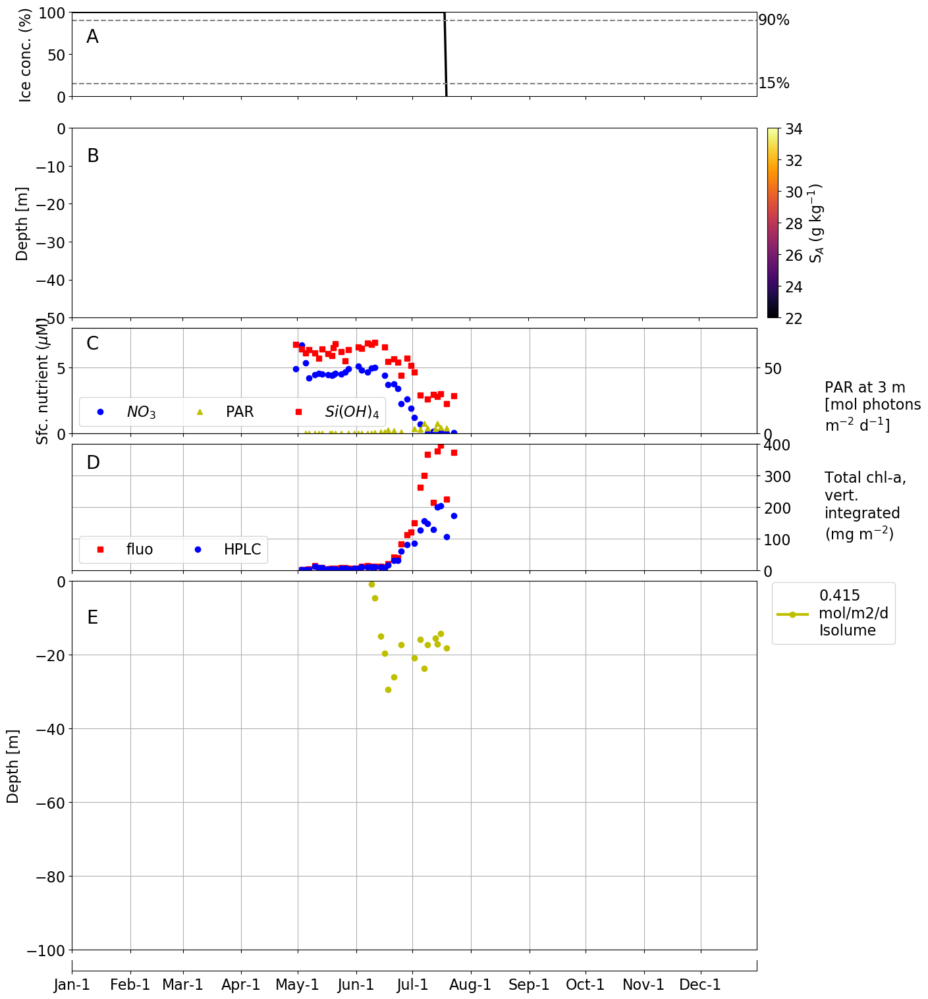

In [103]:
mpl.rc('font', **{'size' : 16})

locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
        'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')

fig,axs=plt.subplots(6,1,sharex=False,figsize=(16, 16))

# --- ICE CONCENTRATIONS
ax=axs[0]
ax.plot(first_year,obsice*100,'k-',lw=2.5)
ax.set_xlim(first_year[0],first_year[-1])
xlims=ax.get_xlim()
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Ice conc. (%)')
ax.set_ylim(0,100)
ax.plot(xlims,[15,15],'k--',color='gray')
ax.plot(xlims,[90,90],'k--',color='gray')
ax.text(xlims[1]+.5,15,'15%',verticalalignment='center')
ax.text(xlims[1]+.5,90,'90%',verticalalignment='center')
plt.text(0.03,0.7,'A',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# --- PANEL B: HYDROGRAPHY
ax=axs[1]
RF_above55=RF[RF>-55]
h=ax.pcolormesh(first_year366,
                RF_above55,
                array1d_idepth_iT_obsStave,
                cmap='inferno',
                vmin=22,
                vmax=34
               )
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Depth [m]')
ax.set_ylim(-50,0)
yticks=np.arange(22,35,2)

# adding the colorbar
cbaxes = fig.add_axes([0.78, 0.67, 0.01, 0.18])
cb = plt.colorbar(h,
                  cax = cbaxes,
                  ticks=yticks
                 )
cb.ax.set_yticklabels([
    '22','24','26','28','30','32','34'])
cb.set_label('S$_A$ (g kg$^{-1}$)')

plt.text(0.03,0.85,'B',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# --- sfc NO3 + sfc PAR + sfc SiO2
ax=axs[2]
h1=ax.plot(first_year,array1d_iT_obsnitrate3m,'o',color='blue',lw=3)
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylim(0,8)
ax.set_ylabel('Sfc. nutrient ($\mu$M)')
ax.grid()
plt.text(0.03,0.85,'C',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)
axt = ax.twinx()
h2=axt.plot(first_year,array1d_iT_obsPAR3m,'^',color='y',lw=3)
h3=ax.plot(first_year,array1d_iT_obssilica3m ,'s',color='red', lw=3)
axt.set_ylim(*[10*l for l in ax.get_ylim()])
axt.text(400,20,'PAR at 3 m\n[mol photons\nm$^{-2}$ d$^{-1}$]',
         horizontalalignment = 'left',
         verticalalignment = 'center')
ax.legend([h1[0],h2[0],h3[0]],['$NO_3$','PAR','$Si{(OH)}_4$'],loc=3, ncol=3)

# --- TOTAL CHLOROPHYLL
ax=axs[3]
h1=ax.plot(first_year,array1d_iT_obsvintchlfluo,'s',color='r',lw=3)
h2=ax.plot(first_year,array1d_iT_obsvintchlHPLC,'o',color='b',lw=3)
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.yaxis.tick_right()
ax.set_ylim(0,400)
ax.grid()
ax.text(400,200,'Total chl-a,\nvert. \nintegrated\n(mg m$^{-2}$)',
        horizontalalignment = 'left',
        verticalalignment = 'center')
plt.text(0.03,0.85,'D',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)
ax.legend([h1[0],h2[0]],['fluo','HPLC'],loc=3, ncol=2)

# --- ISOLUME
ax=axs[4]
h1=ax.plot(first_year,array1d_iT_obsisolume,'o-',color='y',lw=3)
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylim(-100,0)
ax.set_ylabel('Depth [m]')
ax.grid()
ax.legend(h1,
          ['0.415\nmol/m2/d\nIsolume'],
          loc='upper left',
          bbox_to_anchor=(1.02,1),
          borderaxespad=0.1
         )
plt.text(0.03,0.90,'E',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)


# --- ADDITIONAL X-AXIS
ax=axs[5]
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels(labels)
ax.axes.get_yaxis().set_visible(False)
ax.spines['top'].set_visible(False)

# --- POSITION
axs[0].set_position( [0.12,0.88  ,0.65,0.08])
axs[1].set_position( [0.12,0.67  ,0.65,0.18])
axs[2].set_position( [0.12,0.56  ,0.65,0.10])
axs[3].set_position( [0.12,0.43  ,0.65,0.12])
axs[4].set_position( [0.12,0.07  ,0.65,0.35])
axs[5].set_position( [0.12,0.05  ,0.65,0.01])

# --- SAVE
plt.savefig('validation/GEic2016.one.year.chl.randelhoff19.png')

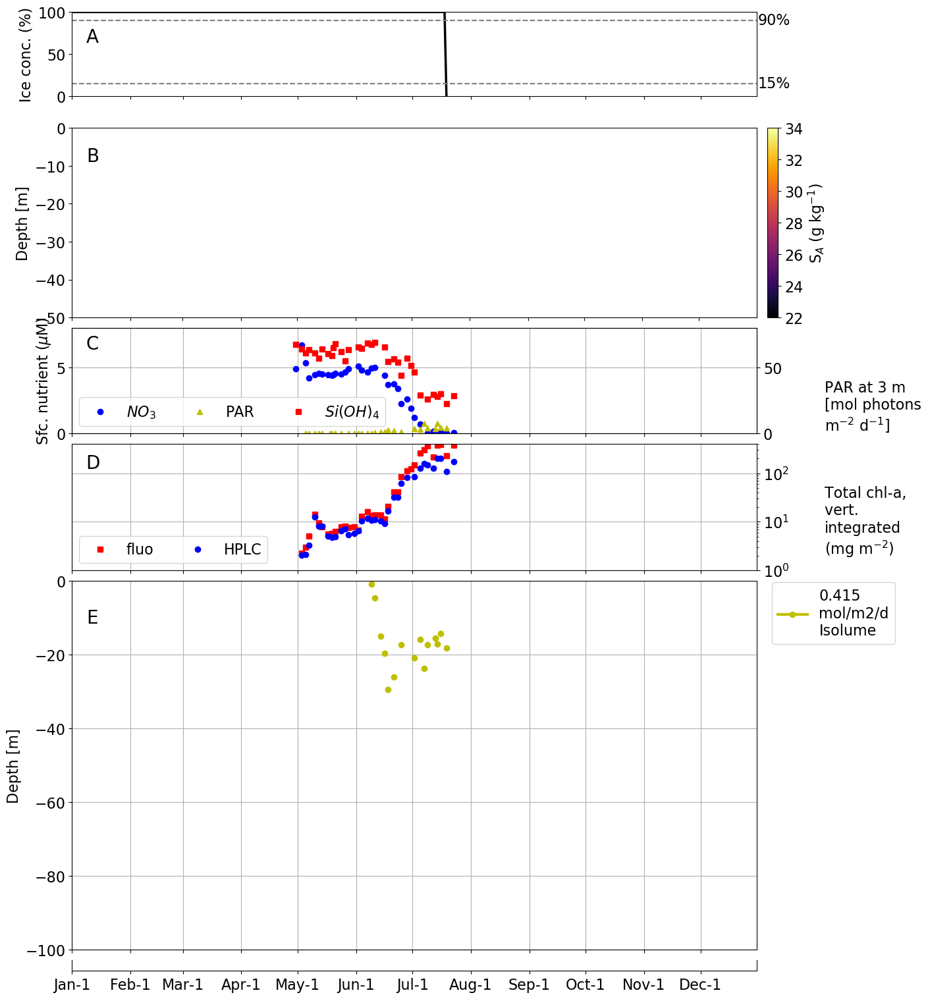

In [104]:
mpl.rc('font', **{'size' : 16})

locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
        'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')

fig,axs=plt.subplots(6,1,sharex=False,figsize=(16, 16))

# --- ICE CONCENTRATIONS
ax=axs[0]
ax.plot(first_year,obsice*100,'k-',lw=2.5)
ax.set_xlim(first_year[0],first_year[-1])
xlims=ax.get_xlim()
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Ice conc. (%)')
ax.set_ylim(0,100)
ax.plot(xlims,[15,15],'k--',color='gray')
ax.plot(xlims,[90,90],'k--',color='gray')
ax.text(xlims[1]+.5,15,'15%',verticalalignment='center')
ax.text(xlims[1]+.5,90,'90%',verticalalignment='center')
plt.text(0.03,0.7,'A',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# --- PANEL B: HYDROGRAPHY
ax=axs[1]
RF_above55=RF[RF>-55]
h=ax.pcolormesh(first_year366,
                RF_above55,
                array1d_idepth_iT_obsStave,
                cmap='inferno',
                vmin=22,
                vmax=34
               )
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Depth [m]')
ax.set_ylim(-50,0)
yticks=np.arange(22,35,2)

# adding the colorbar
cbaxes = fig.add_axes([0.78, 0.67, 0.01, 0.18])
cb = plt.colorbar(h,
                  cax = cbaxes,
                  ticks=yticks
                 )
cb.ax.set_yticklabels([
    '22','24','26','28','30','32','34'])
cb.set_label('S$_A$ (g kg$^{-1}$)')

plt.text(0.03,0.85,'B',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# --- sfc NO3 + sfc PAR + sfc SiO2
ax=axs[2]
h1=ax.plot(first_year,array1d_iT_obsnitrate3m,'o',color='blue',lw=3)
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylim(0,8)
ax.set_ylabel('Sfc. nutrient ($\mu$M)')
ax.grid()
plt.text(0.03,0.85,'C',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)
axt = ax.twinx()
h2=axt.plot(first_year,array1d_iT_obsPAR3m,'^',color='y',lw=3)
h3=ax.plot(first_year,array1d_iT_obssilica3m ,'s',color='red', lw=3)
axt.set_ylim(*[10*l for l in ax.get_ylim()])
axt.text(400,20,'PAR at 3 m\n[mol photons\nm$^{-2}$ d$^{-1}$]',
         horizontalalignment = 'left',
         verticalalignment = 'center')
ax.legend([h1[0],h2[0],h3[0]],['$NO_3$','PAR','$Si{(OH)}_4$'],loc=3, ncol=3)

# --- TOTAL CHLOROPHYLL
ax=axs[3]
h1=ax.plot(first_year,array1d_iT_obsvintchlfluo,'s',color='r',lw=3)
h2=ax.plot(first_year,array1d_iT_obsvintchlHPLC,'o',color='b',lw=3)
ax.set_yscale('log')
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.yaxis.tick_right()
ax.set_ylim(1,400)
ax.grid()
ax.text(400,10,'Total chl-a,\nvert. \nintegrated\n(mg m$^{-2}$)',
        horizontalalignment = 'left',
        verticalalignment = 'center')
plt.text(0.03,0.85,'D',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)
ax.legend([h1[0],h2[0]],['fluo','HPLC'],loc=3, ncol=2)

# --- ISOLUME
ax=axs[4]
h1=ax.plot(first_year,array1d_iT_obsisolume,'o-',color='y',lw=3)
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylim(-100,0)
ax.set_ylabel('Depth [m]')
ax.grid()
ax.legend(h1,
          ['0.415\nmol/m2/d\nIsolume'],
          loc='upper left',
          bbox_to_anchor=(1.02,1),
          borderaxespad=0.1
         )
plt.text(0.03,0.90,'E',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# --- ADDITIONAL X-AXIS
ax=axs[5]
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels(labels)
ax.axes.get_yaxis().set_visible(False)
ax.spines['top'].set_visible(False)

# --- POSITION
axs[0].set_position( [0.12,0.88  ,0.65,0.08])
axs[1].set_position( [0.12,0.67  ,0.65,0.18])
axs[2].set_position( [0.12,0.56  ,0.65,0.10])
axs[3].set_position( [0.12,0.43  ,0.65,0.12])
axs[4].set_position( [0.12,0.07  ,0.65,0.35])
axs[5].set_position( [0.12,0.05  ,0.65,0.01])

# --- SAVE
plt.savefig('validation/GEic2016.one.year.logchl.randelhoff19.png')

## Observations: mean chlorophyll a

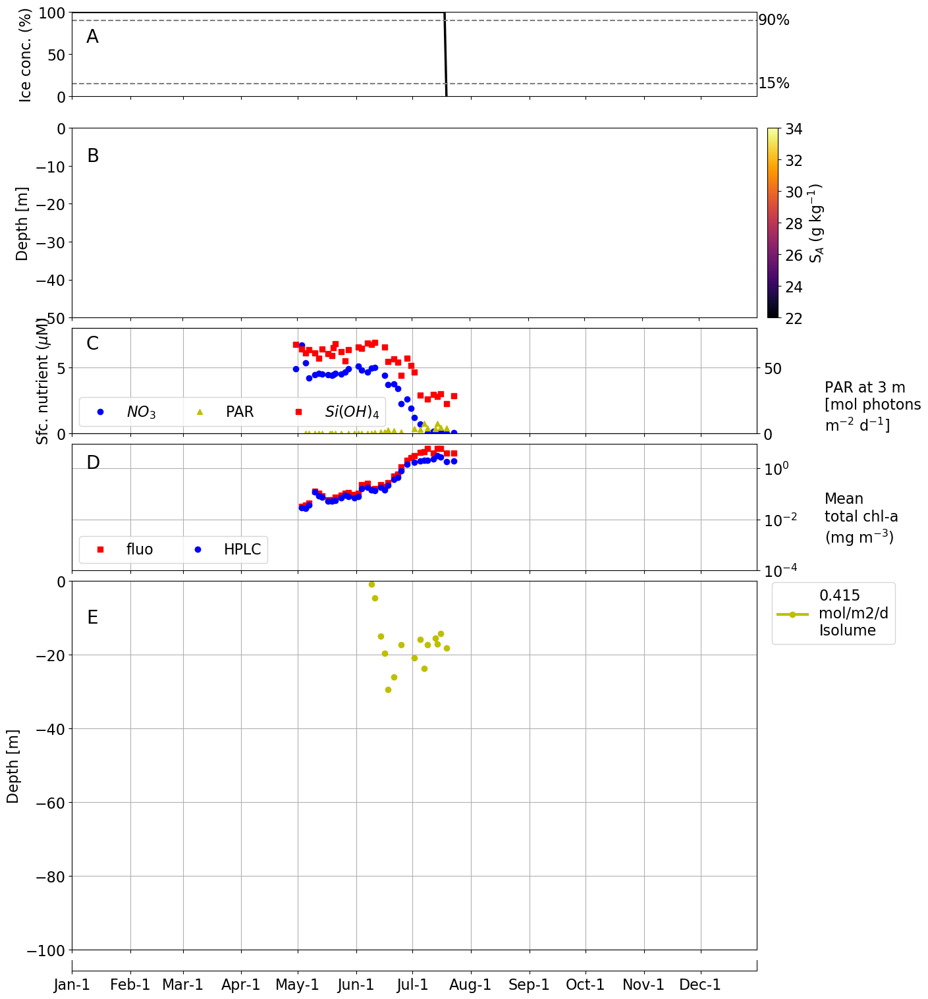

In [105]:
mpl.rc('font', **{'size' : 16})

locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
        'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')

fig,axs=plt.subplots(6,1,sharex=False,figsize=(16, 16))

# --- ICE CONCENTRATIONS
ax=axs[0]
ax.plot(first_year,obsice*100,'k-',lw=2.5)
ax.set_xlim(first_year[0],first_year[-1])
xlims=ax.get_xlim()
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Ice conc. (%)')
ax.set_ylim(0,100)
ax.plot(xlims,[15,15],'k--',color='gray')
ax.plot(xlims,[90,90],'k--',color='gray')
ax.text(xlims[1]+.5,15,'15%',verticalalignment='center')
ax.text(xlims[1]+.5,90,'90%',verticalalignment='center')
plt.text(0.03,0.7,'A',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# --- PANEL B: HYDROGRAPHY
ax=axs[1]
RF_above55=RF[RF>-55]
h=ax.pcolormesh(first_year366,
                RF_above55,
                array1d_idepth_iT_obsStave,
                cmap='inferno',
                vmin=22,
                vmax=34
               )
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Depth [m]')
ax.set_ylim(-50,0)
yticks=np.arange(22,35,2)

# adding the colorbar
cbaxes = fig.add_axes([0.78, 0.67, 0.01, 0.18])
cb = plt.colorbar(h,
                  cax = cbaxes,
                  ticks=yticks
                 )
cb.ax.set_yticklabels([
    '22','24','26','28','30','32','34'])
cb.set_label('S$_A$ (g kg$^{-1}$)')

plt.text(0.03,0.85,'B',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# --- sfc NO3 + sfc PAR + sfc SiO2
ax=axs[2]
h1=ax.plot(first_year,array1d_iT_obsnitrate3m,'o',color='blue',lw=3)
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylim(0,8)
ax.set_ylabel('Sfc. nutrient ($\mu$M)')
ax.grid()
plt.text(0.03,0.85,'C',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)
axt = ax.twinx()
h2=axt.plot(first_year,array1d_iT_obsPAR3m,'^',color='y',lw=3)
h3=ax.plot(first_year,array1d_iT_obssilica3m ,'s',color='red', lw=3)
axt.set_ylim(*[10*l for l in ax.get_ylim()])
axt.text(400,20,'PAR at 3 m\n[mol photons\nm$^{-2}$ d$^{-1}$]',
         horizontalalignment = 'left',
         verticalalignment = 'center')
ax.legend([h1[0],h2[0],h3[0]],['$NO_3$','PAR','$Si{(OH)}_4$'],loc=3, ncol=3)

# --- TOTAL CHLOROPHYLL
ax=axs[3]
h1=ax.plot(first_year,array1d_iT_obsmeanchlfluo,'s',color='r',lw=3)
h2=ax.plot(first_year,array1d_iT_obsmeanchlHPLC,'o',color='b',lw=3)
ax.set_yscale('log')
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.yaxis.tick_right()
ax.set_ylim(1E-4,9)
ax.grid()
ax.text(400,1E-2,'Mean\ntotal chl-a\n(mg m$^{-3}$)',
        horizontalalignment = 'left',
        verticalalignment = 'center')
plt.text(0.03,0.85,'D',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)
ax.legend([h1[0],h2[0]],['fluo','HPLC'],loc=3, ncol=2)

# --- ISOLUME
ax=axs[4]
h1=ax.plot(first_year,array1d_iT_obsisolume,'o-',color='y',lw=3)
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylim(-100,0)
ax.set_ylabel('Depth [m]')
ax.grid()
ax.legend(h1,
          ['0.415\nmol/m2/d\nIsolume'],
          loc='upper left',
          bbox_to_anchor=(1.02,1),
          borderaxespad=0.1
         )
plt.text(0.03,0.90,'E',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# --- ADDITIONAL X-AXIS
ax=axs[5]
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels(labels)
ax.axes.get_yaxis().set_visible(False)
ax.spines['top'].set_visible(False)

# --- POSITION
axs[0].set_position( [0.12,0.88  ,0.65,0.08])
axs[1].set_position( [0.12,0.67  ,0.65,0.18])
axs[2].set_position( [0.12,0.56  ,0.65,0.10])
axs[3].set_position( [0.12,0.43  ,0.65,0.12])
axs[4].set_position( [0.12,0.07  ,0.65,0.35])
axs[5].set_position( [0.12,0.05  ,0.65,0.01])

# --- SAVE
plt.savefig('validation/GEic2016.one.year.logchl.mean.png')

## Model: chlorophyll a similar to Randelhoff et al. 2019 Fig. 9

### Model: silicic acid (3m)

in $\mu M$

In [106]:
carfile='car.0000000000.t001.nc'
array2d_idepth_iT_modsioh4full=netcdf_tools.read_netcdf(carfile, 'TRAC06').squeeze().transpose()
array2d_idepth_iT_modsioh4=array2d_idepth_iT_modsioh4full[:,array1d_iT1y_iT]
(ndepths,ndays)=array2d_idepth_iT_modsioh4.shape
array1d_iT_silicicacid3m=np.zeros(ndays)
x=3
xp=[RC[3],RC[2]]
assert np.all(np.diff(xp)>0), "xp is in decreasing order: %r %r" % (xp[0],xp[1])
for iT in first_year:
    fp =[array2d_idepth_iT_modsioh4[3,iT],array2d_idepth_iT_modsioh4[2,iT]]
    silica3m=np.interp(x,xp,fp)
    array1d_iT_silicicacid3m[iT]=silica3m

### Model: nitrate (3m)

in $\mu M$

In [107]:
carfile='car.0000000000.t001.nc'
array2d_idepth_iT_modno3full=netcdf_tools.read_netcdf(carfile, 'TRAC04').squeeze().transpose()
array2d_idepth_iT_modno3=array2d_idepth_iT_modno3full[:,array1d_iT1y_iT]
(ndepths,ndays)=array2d_idepth_iT_modno3.shape
array1d_iT_modnitrate3m=np.zeros(ndays)
x=3
xp=[RC[3],RC[2]]
assert np.all(np.diff(xp)>0), "xp is in decreasing order: %r %r" % (xp[0],xp[1])
for iT in first_year:
    fp =[array2d_idepth_iT_modno3[3,iT],array2d_idepth_iT_modno3[2,iT]]
    nitrate3m=np.interp(x,xp,fp)
    array1d_iT_modnitrate3m[iT]=nitrate3m

### Model: mean PAR (3m)

In [108]:
stod=86400 # 3600*24 s per d
array2d_idepth_iT_PARfullumolEonm2s=netcdf_tools.read_netcdf(carfile, 'PAR').squeeze().transpose()
if np.all(array2d_idepth_iT_PARfullumolEonm2s==0):
    #define GUD_PARUICE
    array2d_idepth_iT_PAR_icefullumolEonm2s=netcdf_tools.read_netcdf(carfile, 'PAR_ice').squeeze().transpose()
    array2d_idepth_iT_PAR_icefull=array2d_idepth_iT_PAR_icefullumolEonm2s*1e-6*stod
    array2d_idepth_iT_PAR_owfullumolEonm2s=netcdf_tools.read_netcdf(carfile, 'PAR_ow').squeeze().transpose()
    array2d_idepth_iT_PAR_owfull=array2d_idepth_iT_PAR_owfullumolEonm2s*1e-6*stod
    (ndepths,ndays)=array2d_idepth_iT_PAR_icefull.shape
    array2d_idepth_iT_icefull=np.tile(ice,(ndepths,ndays//365))
    array2d_idepth_iT_meanPARfull=array2d_idepth_iT_PAR_owfull*(1-array2d_idepth_iT_icefull)\
    +array2d_idepth_iT_PAR_icefull*array2d_idepth_iT_icefull
else:
    #undef GUD_PARUICE
    array2d_idepth_iT_meanPARfull=array2d_idepth_iT_PARfullumolEonm2s*1e-6*stod
array2d_idepth_iT_meanPAR=array2d_idepth_iT_meanPARfull[:,array1d_iT1y_iT]
(ndepths,ndays)=array2d_idepth_iT_meanPAR.shape
array1d_iT_modPAR3m=np.zeros(ndays)
x=3
xp=[RC[3],RC[2]]
assert np.all(np.diff(xp)>0), "xp is in decreasing order: %r %r" % (xp[0],xp[1])
for iT in first_year:
    fp =[array2d_idepth_iT_meanPAR[3,iT],array2d_idepth_iT_meanPAR[2,iT]]
    PAR3m=np.interp(x,xp,fp)
    array1d_iT_modPAR3m[iT]=PAR3m

## Model: isolume $0.415\ mol\ photons\ m^{-2} d^{-1}$

In [109]:
c_isolume=0.415 # mol photons m^-2 d^-1
(ndepths,ndays)=array2d_idepth_iT_meanPAR.shape
array1d_iT_modisolume=np.empty(ndays)
array1d_iT_modisolume[:]=np.NaN
for iT in first_year:
    array1d_idepth_meanPAR=array2d_idepth_iT_meanPAR[:,iT]
    if array1d_idepth_meanPAR[0]>c_isolume:
        idx_isolume=vstats.find_idx_nearest(array=array1d_idepth_meanPAR,
                                           value=c_isolume)
        isolume=RC[idx_isolume]
        array1d_iT_modisolume[iT]=isolume

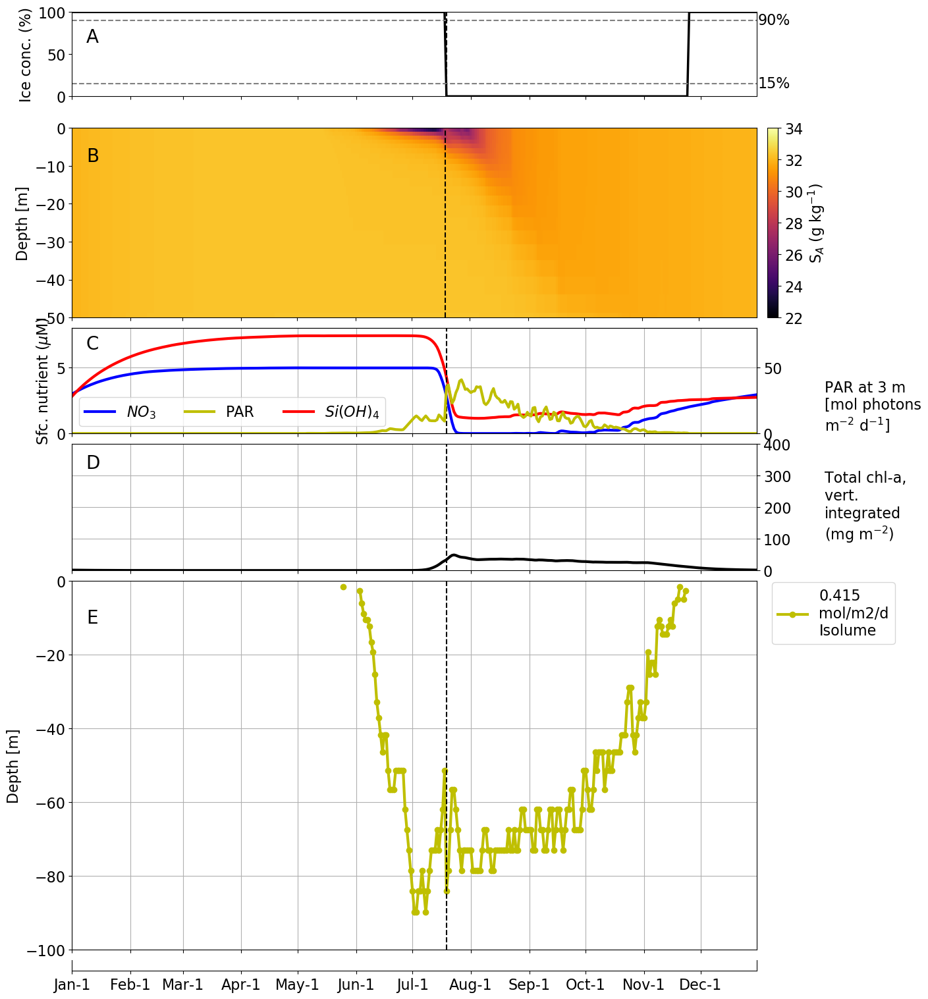

In [110]:
mpl.rc('font', **{'size' : 16})

locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
        'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')

fig,axs=plt.subplots(6,1,sharex=False,figsize=(16, 16))

# --- ICE CONCENTRATIONS
ax=axs[0]
ax.plot(first_year,ice*100,'k-',lw=2.5)
ax.set_xlim(first_year[0],first_year[-1])
xlims=ax.get_xlim()
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Ice conc. (%)')
ax.set_ylim(0,100)
ax.plot(xlims,[15,15],'k--',color='gray')
ax.plot(xlims,[90,90],'k--',color='gray')
ax.text(xlims[1]+.5,15,'15%',verticalalignment='center')
ax.text(xlims[1]+.5,90,'90%',verticalalignment='center')
plt.text(0.03,0.7,'A',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# adding the vertical line at 15% of ice
ax.axvline(iT15_start_obs,color='k',linestyle='--')

# --- PANEL B: HYDROGRAPHY
ax=axs[1]
RF_above55=RF[RF>-55]
h=ax.pcolormesh(first_year366,
                RF_above55,
                array2d_idepth_iT_Stavefull[0:(RF_above55.size)-1,array1d_iT1y_iT],
                cmap='inferno',
                vmin=22,
                vmax=34
               )
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Depth [m]')
ax.set_ylim(-50,0)
yticks=np.arange(22,35,2)

# adding the colorbar
cbaxes = fig.add_axes([0.78, 0.67, 0.01, 0.18])
cb = plt.colorbar(h,
                  cax = cbaxes,
                  ticks=yticks
                 )
cb.ax.set_yticklabels([
    '22','24','26','28','30','32','34'])
cb.set_label('S$_A$ (g kg$^{-1}$)')

# adding the vertical line at 15% of ice
ax.axvline(iT15_start_obs,color='k',linestyle='--')

plt.text(0.03,0.85,'B',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# --- sfc NO3 + sfc PAR + sfc SiO2
ax=axs[2]
h1=ax.plot(first_year,array1d_iT_modnitrate3m,'-',color='blue',lw=3)
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylim(0,8)
ax.set_ylabel('Sfc. nutrient ($\mu$M)')
ax.grid()
plt.text(0.03,0.85,'C',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)
axt = ax.twinx()
h2=axt.plot(first_year,array1d_iT_modPAR3m,'-',color='y',lw=3)
h3=ax.plot(first_year,array1d_iT_silicicacid3m ,'-',color='red', lw=3)
axt.set_ylim(*[10*l for l in ax.get_ylim()])
axt.text(400,20,'PAR at 3 m\n[mol photons\nm$^{-2}$ d$^{-1}$]',
         horizontalalignment = 'left',
         verticalalignment = 'center')
ax.legend([h1[0],h2[0],h3[0]],['$NO_3$','PAR','$Si{(OH)}_4$'],loc=3, ncol=3)

# adding the vertical line at 15% of ice
ax.axvline(iT15_start_obs,color='k',linestyle='--')

# --- TOTAL CHLOROPHYLL
ax=axs[3]
ax.plot(first_year,array1d_iT_modvintchl,'-',color='k',lw=3)
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.yaxis.tick_right()
ax.set_ylim(0,400)
ax.grid()
ax.text(400,200,'Total chl-a,\nvert. \nintegrated\n(mg m$^{-2}$)',
        horizontalalignment = 'left',
        verticalalignment = 'center')
plt.text(0.03,0.85,'D',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# adding the vertical line at 15% of ice
ax.axvline(iT15_start_obs,color='k',linestyle='--')

# --- ISOLUME
ax=axs[4]
h1=ax.plot(first_year,array1d_iT_modisolume,'o-',color='y',lw=3)
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylim(-100,0)
ax.set_ylabel('Depth [m]')
ax.grid()
ax.legend(h1,
          ['0.415\nmol/m2/d\nIsolume'],
          loc='upper left',
          bbox_to_anchor=(1.02,1),
          borderaxespad=0.1
         )
plt.text(0.03,0.90,'E',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# adding the vertical line at 15% of ice
ax.axvline(iT15_start_obs,color='k',linestyle='--')

# --- ADDITIONAL X-AXIS
ax=axs[5]
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels(labels)
ax.axes.get_yaxis().set_visible(False)
ax.spines['top'].set_visible(False)

# --- POSITION
axs[0].set_position( [0.12,0.88  ,0.65,0.08])
axs[1].set_position( [0.12,0.67  ,0.65,0.18])
axs[2].set_position( [0.12,0.56  ,0.65,0.10])
axs[3].set_position( [0.12,0.43  ,0.65,0.12])
axs[4].set_position( [0.12,0.07  ,0.65,0.35])
axs[5].set_position( [0.12,0.05  ,0.65,0.01])

# --- SAVE
plt.savefig('model.one.year.chl.randelhoff19.png')

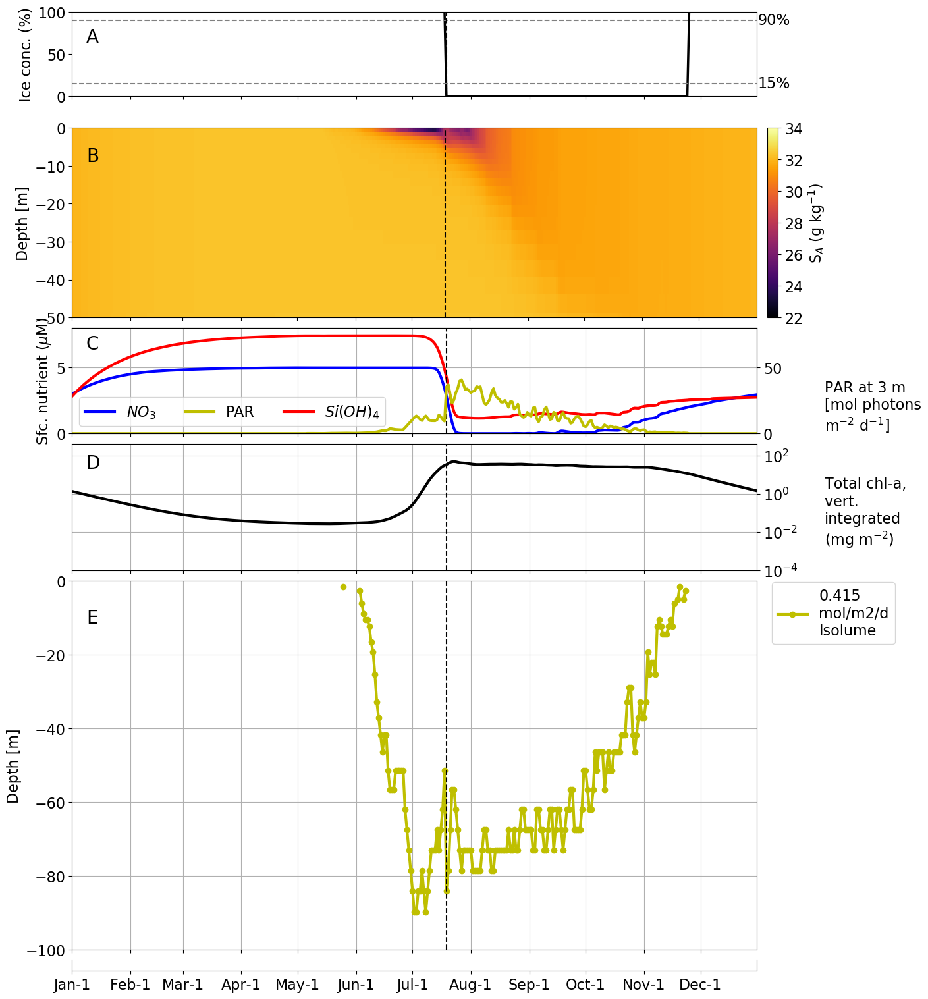

In [111]:
mpl.rc('font', **{'size' : 16})

locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
        'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')

fig,axs=plt.subplots(6,1,sharex=False,figsize=(16, 16))

# --- ICE CONCENTRATIONS
ax=axs[0]
ax.plot(first_year,ice*100,'k-',lw=2.5)
ax.set_xlim(first_year[0],first_year[-1])
xlims=ax.get_xlim()
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Ice conc. (%)')
ax.set_ylim(0,100)
ax.plot(xlims,[15,15],'k--',color='gray')
ax.plot(xlims,[90,90],'k--',color='gray')
ax.text(xlims[1]+.5,15,'15%',verticalalignment='center')
ax.text(xlims[1]+.5,90,'90%',verticalalignment='center')
plt.text(0.03,0.7,'A',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# adding the vertical line at 15% of ice
ax.axvline(iT15_start_obs,color='k',linestyle='--')

# --- PANEL B: HYDROGRAPHY
ax=axs[1]
RF_above55=RF[RF>-55]
h=ax.pcolormesh(first_year366,
                RF_above55,
                array2d_idepth_iT_Stavefull[0:(RF_above55.size)-1,array1d_iT1y_iT],
                cmap='inferno',
                vmin=22,
                vmax=34
               )
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Depth [m]')
ax.set_ylim(-50,0)
yticks=np.arange(22,35,2)

# adding the colorbar
cbaxes = fig.add_axes([0.78, 0.67, 0.01, 0.18])
cb = plt.colorbar(h,
                  cax = cbaxes,
                  ticks=yticks
                 )
cb.ax.set_yticklabels([
    '22','24','26','28','30','32','34'])
cb.set_label('S$_A$ (g kg$^{-1}$)')

# adding the vertical line at 15% of ice
ax.axvline(iT15_start_obs,color='k',linestyle='--')

plt.text(0.03,0.85,'B',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# --- sfc NO3 + sfc PAR + sfc SiO2
ax=axs[2]
h1=ax.plot(first_year,array1d_iT_modnitrate3m,'-',color='blue',lw=3)
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylim(0,8)
ax.set_ylabel('Sfc. nutrient ($\mu$M)')
ax.grid()
plt.text(0.03,0.85,'C',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)
axt = ax.twinx()
h2=axt.plot(first_year,array1d_iT_modPAR3m,'-',color='y',lw=3)
h3=ax.plot(first_year,array1d_iT_silicicacid3m ,'-',color='red', lw=3)
axt.set_ylim(*[10*l for l in ax.get_ylim()])
axt.text(400,20,'PAR at 3 m\n[mol photons\nm$^{-2}$ d$^{-1}$]',
         horizontalalignment = 'left',
         verticalalignment = 'center')
ax.legend([h1[0],h2[0],h3[0]],['$NO_3$','PAR','$Si{(OH)}_4$'],loc=3, ncol=3)

# adding the vertical line at 15% of ice
ax.axvline(iT15_start_obs,color='k',linestyle='--')

# --- TOTAL CHLOROPHYLL
ax=axs[3]
ax.plot(first_year,array1d_iT_modvintchl,'-',color='k',lw=3)
ax.set_yscale('log')
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.yaxis.tick_right()
ax.set_ylim(1E-4,400)
ax.grid()
ax.text(400,1E-1,'Total chl-a,\nvert. \nintegrated\n(mg m$^{-2}$)',
        horizontalalignment = 'left',
        verticalalignment = 'center')
plt.text(0.03,0.85,'D',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# adding the vertical line at 15% of ice
ax.axvline(iT15_start_obs,color='k',linestyle='--')

# --- ISOLUME
ax=axs[4]
h1=ax.plot(first_year,array1d_iT_modisolume,'o-',color='y',lw=3)
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylim(-100,0)
ax.set_ylabel('Depth [m]')
ax.grid()
ax.legend(h1,
          ['0.415\nmol/m2/d\nIsolume'],
          loc='upper left',
          bbox_to_anchor=(1.02,1),
          borderaxespad=0.1
         )
plt.text(0.03,0.90,'E',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# adding the vertical line at 15% of ice
ax.axvline(iT15_start_obs,color='k',linestyle='--')

# --- ADDITIONAL X-AXIS
ax=axs[5]
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels(labels)
ax.axes.get_yaxis().set_visible(False)
ax.spines['top'].set_visible(False)

# --- POSITION
axs[0].set_position( [0.12,0.88  ,0.65,0.08])
axs[1].set_position( [0.12,0.67  ,0.65,0.18])
axs[2].set_position( [0.12,0.56  ,0.65,0.10])
axs[3].set_position( [0.12,0.43  ,0.65,0.12])
axs[4].set_position( [0.12,0.07  ,0.65,0.35])
axs[5].set_position( [0.12,0.05  ,0.65,0.01])

# --- SAVE
plt.savefig('model.one.year.logchl.randelhoff19.png')

## Model: mean chloropyll a

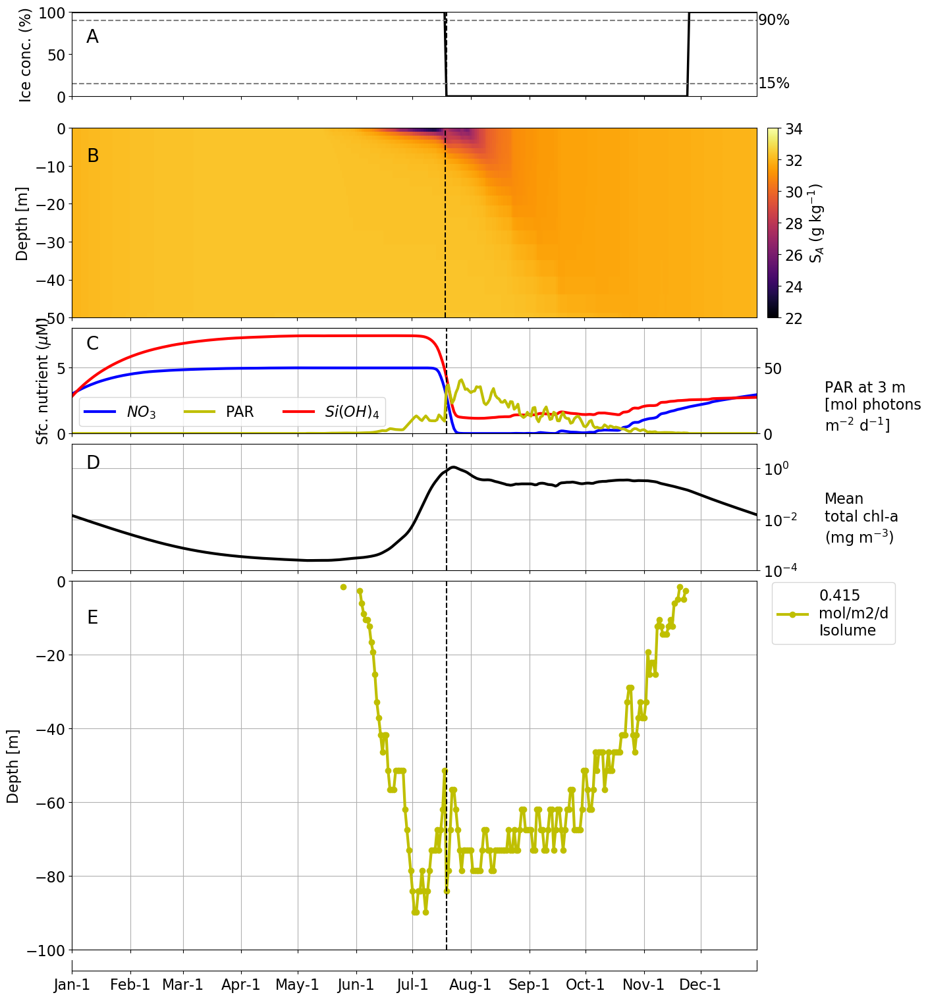

In [112]:
mpl.rc('font', **{'size' : 16})

locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
        'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')

fig,axs=plt.subplots(6,1,sharex=False,figsize=(16, 16))

# --- ICE CONCENTRATIONS
ax=axs[0]
ax.plot(first_year,ice*100,'k-',lw=2.5)
ax.set_xlim(first_year[0],first_year[-1])
xlims=ax.get_xlim()
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Ice conc. (%)')
ax.set_ylim(0,100)
ax.plot(xlims,[15,15],'k--',color='gray')
ax.plot(xlims,[90,90],'k--',color='gray')
ax.text(xlims[1]+.5,15,'15%',verticalalignment='center')
ax.text(xlims[1]+.5,90,'90%',verticalalignment='center')
plt.text(0.03,0.7,'A',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# adding the vertical line at 15% of ice
ax.axvline(iT15_start_obs,color='k',linestyle='--')

# --- PANEL B: HYDROGRAPHY
ax=axs[1]
RF_above55=RF[RF>-55]
h=ax.pcolormesh(first_year366,
                RF_above55,
                array2d_idepth_iT_Stavefull[0:(RF_above55.size)-1,array1d_iT1y_iT],
                cmap='inferno',
                vmin=22,
                vmax=34
               )
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Depth [m]')
ax.set_ylim(-50,0)
yticks=np.arange(22,35,2)

# adding the colorbar
cbaxes = fig.add_axes([0.78, 0.67, 0.01, 0.18])
cb = plt.colorbar(h,
                  cax = cbaxes,
                  ticks=yticks
                 )
cb.ax.set_yticklabels([
    '22','24','26','28','30','32','34'])
cb.set_label('S$_A$ (g kg$^{-1}$)')

# adding the vertical line at 15% of ice
ax.axvline(iT15_start_obs,color='k',linestyle='--')

plt.text(0.03,0.85,'B',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# --- sfc NO3 + sfc PAR + sfc SiO2
ax=axs[2]
h1=ax.plot(first_year,array1d_iT_modnitrate3m,'-',color='blue',lw=3)
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylim(0,8)
ax.set_ylabel('Sfc. nutrient ($\mu$M)')
ax.grid()
plt.text(0.03,0.85,'C',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)
axt = ax.twinx()
h2=axt.plot(first_year,array1d_iT_modPAR3m,'-',color='y',lw=3)
h3=ax.plot(first_year,array1d_iT_silicicacid3m ,'-',color='red', lw=3)
axt.set_ylim(*[10*l for l in ax.get_ylim()])
axt.text(400,20,'PAR at 3 m\n[mol photons\nm$^{-2}$ d$^{-1}$]',
         horizontalalignment = 'left',
         verticalalignment = 'center')
ax.legend([h1[0],h2[0],h3[0]],['$NO_3$','PAR','$Si{(OH)}_4$'],loc=3, ncol=3)

# adding the vertical line at 15% of ice
ax.axvline(iT15_start_obs,color='k',linestyle='--')

# --- TOTAL CHLOROPHYLL
ax=axs[3]
ax.plot(first_year,array1d_iT_modmeanchl,'-',color='k',lw=3)
ax.set_yscale('log')
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.yaxis.tick_right()
ax.set_ylim(1E-4,9)
ax.grid()
ax.text(400,1E-2,'Mean\ntotal chl-a\n(mg m$^{-3}$)',
        horizontalalignment = 'left',
        verticalalignment = 'center')
plt.text(0.03,0.85,'D',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# adding the vertical line at 15% of ice
ax.axvline(iT15_start_obs,color='k',linestyle='--')

# --- ISOLUME
ax=axs[4]
h1=ax.plot(first_year,array1d_iT_modisolume,'o-',color='y',lw=3)
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylim(-100,0)
ax.set_ylabel('Depth [m]')
ax.grid()
ax.legend(h1,
          ['0.415\nmol/m2/d\nIsolume'],
          loc='upper left',
          bbox_to_anchor=(1.02,1),
          borderaxespad=0.1
         )
plt.text(0.03,0.90,'E',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# adding the vertical line at 15% of ice
ax.axvline(iT15_start_obs,color='k',linestyle='--')

# --- ADDITIONAL X-AXIS
ax=axs[5]
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels(labels)
ax.axes.get_yaxis().set_visible(False)
ax.spines['top'].set_visible(False)

# --- POSITION
axs[0].set_position( [0.12,0.88  ,0.65,0.08])
axs[1].set_position( [0.12,0.67  ,0.65,0.18])
axs[2].set_position( [0.12,0.56  ,0.65,0.10])
axs[3].set_position( [0.12,0.43  ,0.65,0.12])
axs[4].set_position( [0.12,0.07  ,0.65,0.35])
axs[5].set_position( [0.12,0.05  ,0.65,0.01])

# --- SAVE
plt.savefig('model.one.year.logchl.mean.png')

## Model: phytoplankton biomass similar to Randelhoff et al. 2019 Fig. 9

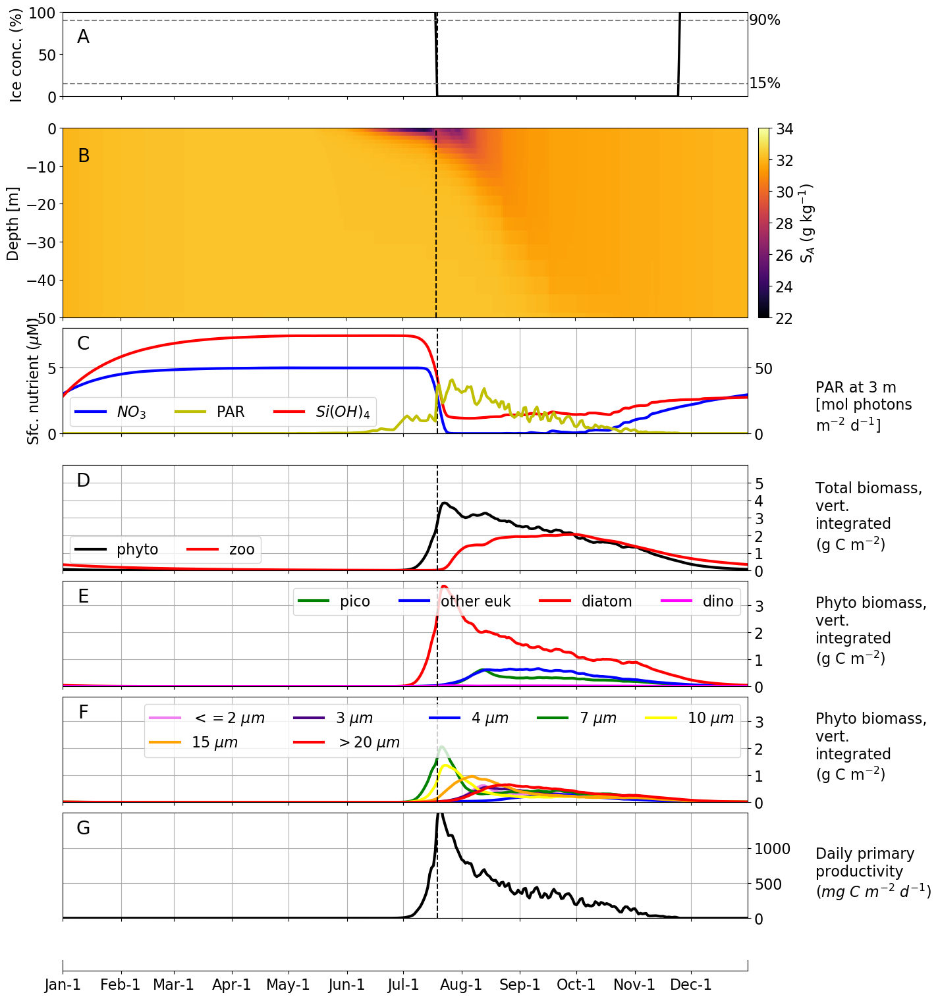

In [113]:
mpl.rc('font', **{'size' : 16})

locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
        'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')

fig,axs=plt.subplots(8,1,sharex=False,figsize=(16, 16))

# --- ICE CONCENTRATIONS
ax=axs[0]
ax.plot(first_year,ice*100,'k-',lw=2.5)
ax.set_xlim(first_year[0],first_year[-1])
xlims=ax.get_xlim()
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Ice conc. (%)')
ax.set_ylim(0,100)
ax.plot(xlims,[15,15],'k--',color='gray')
ax.plot(xlims,[90,90],'k--',color='gray')
ax.text(xlims[1]+.5,15,'15%',verticalalignment='center')
ax.text(xlims[1]+.5,90,'90%',verticalalignment='center')

# adding the vertical line at 15% of ice
ax.axvline(iT15_start_obs,color='k',linestyle='--')
plt.text(0.03,0.7,'A',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# --- PANEL B: HYDROGRAPHY
ax=axs[1]
RF_above55=RF[RF>-55]
h=ax.pcolormesh(first_year366,
                RF_above55,
                array2d_idepth_iT_Stavefull[0:(RF_above55.size)-1,array1d_iT1y_iT],
                cmap='inferno',
                vmin=22,
                vmax=34
               )
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Depth [m]')
ax.set_ylim(-50,0)
yticks=np.arange(22,35,2)

# adding the colorbar
cbaxes = fig.add_axes([0.78, 0.67, 0.01, 0.18])
cb = plt.colorbar(h,
                  cax = cbaxes,
                  ticks=yticks
                 )
cb.ax.set_yticklabels([
    '22','24','26','28','30','32','34'])
cb.set_label('S$_A$ (g kg$^{-1}$)')

# adding the vertical line at 15% of ice
ax.axvline(iT15_start_obs,color='k',linestyle='--')

plt.text(0.03,0.85,'B',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# --- sfc NO3 + sfc PAR + sfc SiO2
ax=axs[2]
h1=ax.plot(first_year,array1d_iT_modnitrate3m,'-',color='blue',lw=3)
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylim(0,8)
ax.set_ylabel('Sfc. nutrient ($\mu$M)')
ax.grid()
plt.text(0.03,0.85,'C',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)
axt = ax.twinx()
h2=axt.plot(first_year,array1d_iT_modPAR3m,'-',color='y',lw=3)
h3=ax.plot(first_year,array1d_iT_silicicacid3m ,'-',color='red', lw=3)
axt.set_ylim(*[10*l for l in ax.get_ylim()])
axt.text(400,20,'PAR at 3 m\n[mol photons\nm$^{-2}$ d$^{-1}$]',
         horizontalalignment = 'left',
         verticalalignment = 'center')
ax.legend([h1[0],h2[0],h3[0]],['$NO_3$','PAR','$Si{(OH)}_4$'],loc=3, ncol=3)
# adding the vertical line at 15% of ice
ax.axvline(iT15_start_obs,color='k',linestyle='--')

# --- TOTAL PHYTO AND ZOO BIOMASSES
ax=axs[3]
ax.set_xticklabels([])
ax.set_xticks(locs)
h1=ax.plot(first_year,array1d_iT_modphytobio,'-',color='k',lw=3)
ax.yaxis.tick_right()
ax.grid()
ax.set_xlim(xlims)
ax.set_yticks(range(0,6,1))
ax.set_ylim(0,6)
ax.text(400,3,'Total biomass,\nvert. \nintegrated\n(g C m$^{-2}$)',
        horizontalalignment = 'left',
        verticalalignment = 'center')
plt.text(0.03,0.85,'D',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)
h2=ax.plot(first_year+1,array1d_iT_modzoobio,'-',color='r',lw=3)
ax.legend([h1[0],h2[0]],['phyto','zoo'],loc=3, ncol=2)
# adding the vertical line at 15% of ice
ax.axvline(iT15_start_obs,color='k',linestyle='--')

# --- PHYTO GROUPS
ax=axs[4]
ax.set_xticklabels([])
ax.set_xticks(locs)
h1=ax.plot(first_year,array1d_iT_modpicobio,'-',color='green',lw=3)
ax.yaxis.tick_right()
ax.grid()
ax.set_xlim(xlims)
ax.set_yticks(range(0,6,1))
ax.set_ylim(0,3.9)
ax.text(400,2,'Phyto biomass,\nvert. \nintegrated\n(g C m$^{-2}$)',
        horizontalalignment = 'left',
        verticalalignment = 'center')
plt.text(0.03,0.85,'E',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)
h2=ax.plot(first_year,array1d_iT_modcoccobio,'-',color='blue',lw=3)
h4=ax.plot(first_year,array1d_iT_moddiatombio,'-',color='red',lw=3)
h5=ax.plot(first_year,array1d_iT_moddinobio,'-',color='magenta',lw=3)
ax.legend([h1[0],h2[0],h4[0],h5[0]],
          ['pico',
           'other euk',
           'diatom',
           'dino'
          ],
          loc=0,
          ncol=4
         )
# adding the vertical line at 15% of ice
ax.axvline(iT15_start_obs,color='k',linestyle='--')

# --- PHYTO SIZES
ax=axs[5]
ax.set_xticklabels([])
ax.set_xticks(locs)
h1=ax.plot(first_year,array1d_iT_lt3umbio,'-',color='violet',lw=3)
ax.yaxis.tick_right()
ax.grid()
ax.set_xlim(xlims)
ax.set_yticks(range(0,6,1))
ax.set_ylim(0,3.9)
ax.text(400,2,'Phyto biomass,\nvert. \nintegrated\n(g C m$^{-2}$)',
        horizontalalignment = 'left',
        verticalalignment = 'center')
plt.text(0.03,0.85,'F',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)
h2=ax.plot(first_year,array1d_iT_3umbio,'-',color='indigo',lw=3)
h3=ax.plot(first_year,array1d_iT_4umbio,'-',color='blue',lw=3)
h4=ax.plot(first_year,array1d_iT_7umbio,'-',color='green',lw=3)
h5=ax.plot(first_year,array1d_iT_10umbio,'-',color='yellow',lw=3)
h6=ax.plot(first_year,array1d_iT_15umbio,'-',color='orange',lw=3)
h7=ax.plot(first_year,array1d_iT_gt20umbio,'-',color='red',lw=3)
ax.legend([h1[0],h6[0],h2[0],h7[0],h3[0],h4[0],h5[0]],
          ['$<= 2\ \mu m$',
           '$ 15\ \mu m$',
           '$  3\ \mu m$',
           '$>20\ \mu m$',
           '$  4\ \mu m$',
           '$  7\ \mu m$',
           '$ 10\ \mu m$'
          ],
          loc=0,
          ncol=5)
# adding the vertical line at 15% of ice
ax.axvline(iT15_start_obs,color='k',linestyle='--')

# --- DAILY PRIMARY PRODUCTIVITY
ax=axs[6]
ax.set_xticklabels([])
ax.set_xticks(locs)
ax.plot(first_year,array1d_iT_moddpp,'-',color='k',lw=3)
ax.yaxis.tick_right()
ax.grid()
ax.set_xlim(xlims)
ax.set_yticks(range(0,2250,500))
ax.set_ylim(0,1499)
ax.text(400,625,'Daily primary\nproductivity\n($mg\ C\ m^{-2}\ d^{-1}$)',
        horizontalalignment = 'left',
        verticalalignment = 'center')
plt.text(0.03,0.85,'G',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)
# adding the vertical line at 15% of ice
ax.axvline(iT15_start_obs,color='k',linestyle='--')

# --- ADDITIONAL X-AXIS
ax=axs[7]
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels(labels)
ax.axes.get_yaxis().set_visible(False)
ax.spines['top'].set_visible(False)

# --- POSITION
axs[0].set_position( [0.12,0.88  ,0.65,.08])
axs[1].set_position( [0.12,0.67  ,0.65,.18])
axs[2].set_position( [0.12,0.56  ,0.65,.1])
axs[3].set_position( [0.12,0.43  ,0.65,.1])
axs[4].set_position( [0.12,0.32  ,0.65,.1])
axs[5].set_position( [0.12,0.21  ,0.65,.1])
axs[6].set_position( [0.12,0.10  ,0.65,.1])
axs[7].set_position( [0.12,0.05  ,0.65,.01])

# --- SAVE
plt.savefig('model.one.year.phyto.randelhoff19.png')

# Model: semi-log plot of phytoplankton biomass vertically integrated (0-100m) for each group

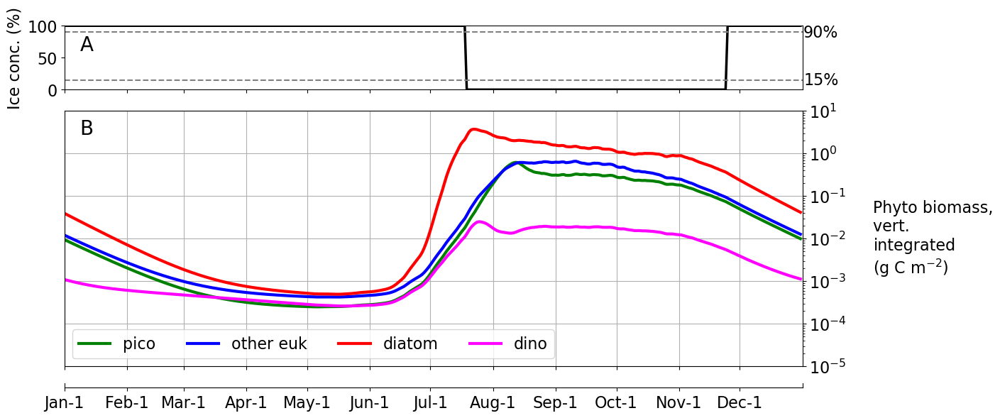

In [114]:
mpl.rc('font', **{'size' : 16})

locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
        'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')

fig,axs=plt.subplots(3,1,sharex=False,figsize=(16, 6))

# --- ICE CONCENTRATIONS
ax=axs[0]
ax.plot(first_year,ice*100,'k-',lw=2.5)
ax.set_xlim(first_year[0],first_year[-1]+1)
xlims=ax.get_xlim()
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Ice conc. (%)')
ax.set_ylim(0,100)
ax.plot(xlims,[15,15],'k--',color='gray')
ax.plot(xlims,[90,90],'k--',color='gray')
ax.text(xlims[1]+.5,15,'15%',verticalalignment='center')
ax.text(xlims[1]+.5,90,'90%',verticalalignment='center')
plt.text(0.03,0.7,'A',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# --- PHYTO GROUPS
ax=axs[1]
ax.set_xticklabels([])
ax.set_xticks(locs)
h1=ax.plot(first_year,array1d_iT_modpicobio,'-',color='green',lw=3)
ax.set_yscale('log')
ax.yaxis.tick_right()
ax.grid()
ax.set_xlim(xlims)
# ax.set_yticks(range(0,6,1))
ax.set_ylim(1E-5,1E1)
ax.text(400,1E-2,'Phyto biomass,\nvert. \nintegrated\n(g C m$^{-2}$)',
        horizontalalignment = 'left',
        verticalalignment = 'center')
plt.text(0.03,0.93,'B',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)
h2=ax.plot(first_year,array1d_iT_modcoccobio,'-',color='blue',lw=3)
h4=ax.plot(first_year,array1d_iT_moddiatombio,'-',color='red',lw=3)
h5=ax.plot(first_year,array1d_iT_moddinobio,'-',color='magenta',lw=3)
ax.legend([h1[0],h2[0],h4[0],h5[0]],
          ['pico',
           'other euk',
           'diatom',
           'dino'
          ],
          loc=3,
          ncol=4)

# --- ADDITIONAL X-AXIS
ax=axs[2]
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels(labels)
ax.axes.get_yaxis().set_visible(False)
ax.spines['top'].set_visible(False)

# --- POSITION
axs[0].set_position( [0.12,0.80  ,0.65,.15])
axs[1].set_position( [0.12,0.15  ,0.65,.60])
axs[2].set_position( [0.12,0.10  ,0.65,.01])

# --- SAVE
plt.savefig('car.0000000000.t001.lastyear.groups_log_plot.png')

# Biomass vertically and temporally integrated over the whole year

in $g\ C$

## Model: functional groups

Let $B_{jt}$ be the biomass of functional group $j$ vertically integrated at day $t$ <br> &emsp; &nbsp; $B_j$ be the biomass of function group $j$ temporally integrated over the whole year

$B_j=\sum_{t=1}^{365}B_{jt}$

In [115]:
picobio=array1d_iT_modpicobio.sum()
coccobio=array1d_iT_modcoccobio.sum()
diazbio=array1d_iT_moddiazbio.sum()
diatombio=array1d_iT_moddiatombio.sum()
largeeukbio=array1d_iT_moddinobio.sum()
bio=[picobio,coccobio,diazbio,diatombio,largeeukbio]

In [116]:
totalbio=np.sum(bio)
biop=[b/totalbio*100 for b in bio] # percentages

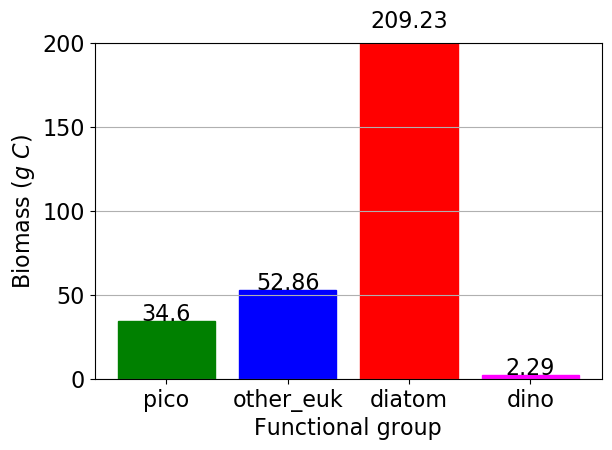

In [117]:
names=['pico','other_euk','diatom','dino']
bio_nodiaz=list(bio)
del bio_nodiaz[2]
my_colors=['green','blue','red','magenta']
fig, ax = plt.subplots()
barlist=ax.bar(names,bio_nodiaz)
ax.set_xlabel('Functional group')
ax.set_ylabel('Biomass ($g\ C$)')
ax.grid(axis='y')
ax.set_ylim(0,200)
for i,rect in enumerate(barlist):
    rect.set_color(my_colors[i])
for index, b in enumerate(bio_nodiaz):
    plt.text(index,b,str(round(b,2)),ha='center')
plt.tight_layout()
# plt.show()
plt.savefig('car.0000000000.t001.lastyear.bar_grp_biom.png')

Figure. Model phytoplankton functional groups biomass (g C). The biomass was temporally integrated over a whole year.

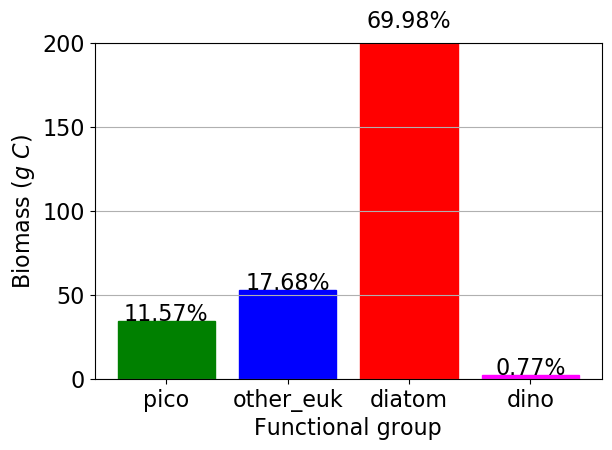

In [118]:
biop_nodiaz=list(biop)
del biop_nodiaz[2]

names=['pico','other_euk','diatom','dino']
my_colors=['green','blue','red','magenta']
fig, ax = plt.subplots()
barlist=ax.bar(names,bio_nodiaz)
ax.set_xlabel('Functional group')
ax.set_ylabel('Biomass ($g\ C$)')
ax.grid(axis='y')
ax.set_ylim(0,200)
for i,rect in enumerate(barlist):
    rect.set_color(my_colors[i])
for i, b in enumerate(bio_nodiaz):
    p=biop_nodiaz[i]
    plt.text(i,b,str(round(p,2))+'%',ha='center')
plt.tight_layout()
# plt.show()
plt.savefig('car.0000000000.t001.lastyear.bar_grp_perc.png')

Figure. Model phytoplankton functional groups biomass (g C). The biomass was temporally integrated over a whole year. The percentage of total biomass is indicated above each bar.

## Model: size classes

Let $B_{jt}$ be the biomass of functional group $j$ vertically integrated at day $t$ <br> &emsp; &nbsp; $B_j$ be the biomass of function group $j$ temporally integrated over the whole year

$B_j=\sum_{t=1}^{365}B_{jt}$

In [119]:
zero_6umbio=array1d_iT_0_6umbio.sum()
zero_9umbio=array1d_iT_0_9umbio.sum()
oneumbio=array1d_iT_1umbio.sum()
twoumbio=array1d_iT_2umbio.sum()
threeumbio=array1d_iT_3umbio.sum()
fourumbio=array1d_iT_4umbio.sum()
sevenumbio=array1d_iT_7umbio.sum()
tenumbio=array1d_iT_10umbio.sum()
fifteenumbio=array1d_iT_15umbio.sum()
gt20umbio=array1d_iT_gt20umbio.sum()
bio_size=[zero_6umbio,zero_9umbio,oneumbio,twoumbio,threeumbio,\
          fourumbio,sevenumbio,tenumbio,fifteenumbio,gt20umbio]

In [120]:
bio_sizep=[b/totalbio*100 for b in bio_size] # percentages

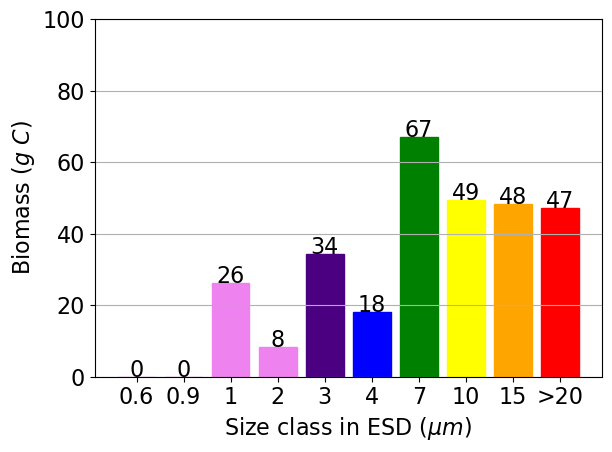

In [121]:
names=['0.6','0.9','1','2','3','4','7','10','15','>20']
my_colors=['violet','violet','violet','violet','indigo','blue','green',\
        'yellow','orange','red']
fig, ax = plt.subplots()
barlist=ax.bar(names,bio_size)
ax.set_xlabel('Size class in ESD ($\mu m$)')
ax.set_ylabel('Biomass ($g\ C$)')
ax.grid(axis='y')
ax.set_ylim(0,100)
for i,rect in enumerate(barlist):
    rect.set_color(my_colors[i])
for index, b in enumerate(bio_size):
    plt.text(index,b,r'{0:.0f}'.format(b),ha='center')
plt.tight_layout()
# plt.show()
plt.savefig('car.0000000000.t001.lastyear.bar_siz_biom.png')

Figure. Model phytoplankton size classes biomass (g C). The biomass was temporally integrated over a whole year.

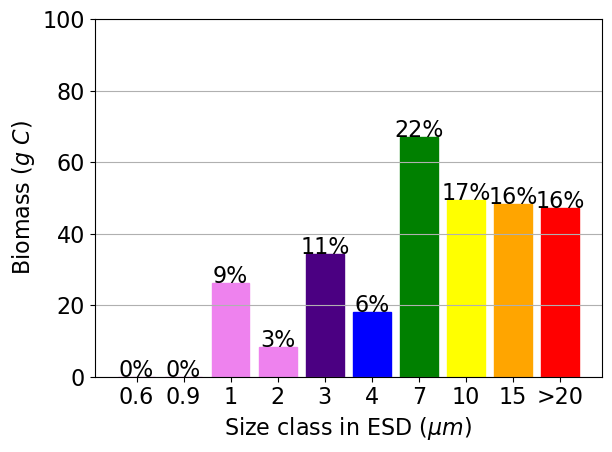

In [122]:
names=['0.6','0.9','1','2','3','4','7','10','15','>20']
my_colors=['violet','violet','violet','violet','indigo','blue','green',\
        'yellow','orange','red']
fig, ax = plt.subplots()
barlist=ax.bar(names,bio_size)
ax.set_xlabel('Size class in ESD ($\mu m$)')
ax.set_ylabel('Biomass ($g\ C$)')
ax.grid(axis='y')
ax.set_ylim(0,100)
for i,rect in enumerate(barlist):
    rect.set_color(my_colors[i])
for i, b in enumerate(bio_size):
    p=bio_sizep[i]
    plt.text(i,b,r'{0:.0f}%'.format(p),ha='center')
plt.tight_layout()
# plt.show()
plt.savefig('car.0000000000.t001.lastyear.bar_siz_perc.png')

Figure. Model phytoplankton size classes biomass (g C). The biomass was temporally integrated over a whole year. The percentage of total biomass is indicated above each bar.

# Timing

## Date of bloom initiation

The bloom initiation was identified when the accumulation rates ($d^{-1}$) were positive for one week (Boss and Behrenfeld, 2010):

accumulation_rate=$\frac{chl_{iT}-chl_{iT-1}}{chl_{iT-1}}$

$In\ situ$ data was smoothed with LOWESS (locally weighted scatterplot smoothing) and interpolated before calculating the accumulation rates.

For $in\ situ$ data, by applying the definition of Boss & Behrenfeld (2010) of 7 days with a positive accumulation rate ($d^{-1}$), the date of bloom initiation would have been May 9.
This date was questionable because light was low on May 9, there was no continuous decrease of nutrients and there was no continuous increase of Chl $a$.
Also, changing the number of days with a positive accumulation rate from 7 days to 8 days changed the date of bloom initiation from May 9 to May 30 indicating a high sensitivity on the number of days with a positive accumulation rate.
This was an indication that human judgment was needed to identify the date of the bloom initiation.
We supposed that the small peak observable on May 9 may not be due to local phytoplankton but instead to the flushing of sea ice algae or to the horizontal advection of phytoplankton.
The algorithm was applied after May 9 and found a date of bloom initiation on May 30.
Note that Oziel et al. (2019) in $Elem.\ Sci\ Anth.$ also found a date of bloom initiation at the end of May from the same observations.

### Observations of chlorophyll $a$ by fluorimetry (0-40m): date of bloom initiation

In [123]:
x=first_year
y=array1d_iT_obsvint40mchlfluo
df=pd.DataFrame({'Day of year':x,'Observed Chl a vert. integrated (0-40m)':y})
# df

In [124]:
# Create a scatter plot
fig = px.scatter(df, x=df['Day of year'], y=df['Observed Chl a vert. integrated (0-40m)'],
                 opacity=0.8, color_discrete_sequence=['black'])

# Change chart background color
fig.update_layout(dict(plot_bgcolor = 'white'))

# Update axes lines
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey', 
                 zeroline=True, zerolinewidth=1, zerolinecolor='lightgrey', 
                 showline=True, linewidth=1, linecolor='black')

fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey', 
                 zeroline=True, zerolinewidth=1, zerolinecolor='lightgrey', 
                 showline=True, linewidth=1, linecolor='black')

# Set figure title
fig.update_layout(title=dict(text="Observed Chl a vert. integrated (0-40m)", 
                             font=dict(color='black')))

# Update marker size
fig.update_traces(marker=dict(size=3))

fig.show()

Figure. Scatterplot of day of year and observed Chl a vert. integrated (0-40m).

In [125]:
y_hat=statsmodels.nonparametric.smoothers_lowess.lowess(y,x,frac=1/4) #2/3 is the default

In [126]:
# Create a scatter plot
fig = px.scatter(df, x=df['Day of year'], y=df['Observed Chl a vert. integrated (0-40m)'],
                 opacity=0.8, color_discrete_sequence=['black'])

# Add the prediction line
fig.add_traces(go.Scatter(x=y_hat[:,0], y=y_hat[:,1], name='LOWESS, frac=1/4', line=dict(color='red')))

# Change chart background color
fig.update_layout(dict(plot_bgcolor = 'white'))

# Update axes lines
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey', 
                 zeroline=True, zerolinewidth=1, zerolinecolor='lightgrey', 
                 showline=True, linewidth=1, linecolor='black')

fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey', 
                 zeroline=True, zerolinewidth=1, zerolinecolor='lightgrey', 
                 showline=True, linewidth=1, linecolor='black')

# Set figure title
fig.update_layout(title=dict(text="Observed Chl a vert. integrated (0-40m)", 
                             font=dict(color='black')))

# Update marker size
fig.update_traces(marker=dict(size=3))

fig.show()

Figure. LOWESS of Observed Chl a vert. integrated (0-40m).

In [127]:
# ------- Define interploation functions -------
# Linear - draws a line between the two nearest points and calculates y value based on the slope of that line
f_linear = scipy.interpolate.interp1d(y_hat[:,0],
                                      y=y_hat[:,1],
                                      bounds_error=False) 

# Create a new set of points with x values
indices_not_nan=np.argwhere(~np.isnan(y)).flatten()
start=indices_not_nan[0]
end  =indices_not_nan[-1]
xnew=np.empty(end-start+1)
for iT in range(start,end+1):
    xnew[iT-start]=iT
    
# Find y values based on the interpolation method
array1d_iT_obsvintchlfluolowess=f_linear(xnew)

start_edge=np.empty(start)
start_edge[:]=np.NaN
end_edge=np.empty(365-1-end)
end_edge[:]=np.NaN
array1d_iT_obsvintchlfluolowess=np.concatenate((start_edge,
                                                array1d_iT_obsvintchlfluolowess,
                                                end_edge))

In [128]:
x=first_year
y=array1d_iT_obsvintchlfluolowess
df=pd.DataFrame({'Day of year':x,'Smoothed and interpolated observed Chl a vert. integrated (0-40m)':y})
# df

In [129]:
indices_not_nan=np.argwhere(~np.isnan(array1d_iT_obsvintchlfluolowess)).flatten()
start=indices_not_nan[0]
end  =indices_not_nan[-1]
# no NaN between first and last smoothed observed value
assert np.array_equal(indices_not_nan,np.arange(start,end+1)), (
    'There is at least one NaN in array1d_iT_obsvintchlHPLCsmooth before '
    'its first and last valid values.')
array1d_iT_accfluo=np.empty(365)
array1d_iT_accfluo[:]=np.NaN
for iT in range(start+1,end):
    chliT=array1d_iT_obsvintchlfluolowess[iT]
    chljT=array1d_iT_obsvintchlfluolowess[iT-1]
    acc=(chliT-chljT)/chljT
    array1d_iT_accfluo[iT]=acc

In [130]:
x=first_year
y=array1d_iT_accfluo
df=pd.DataFrame({'Day of year':x,'Accumulation rates':y})
# df

In [131]:
found=False
iT=136 # starting after the small peak of 129 (May 9) + 7
while not found and iT<=364:
    array1d_iT_accweekbefore=array1d_iT_accfluo[np.arange(iT-6,iT+1)]
    if(np.all(~np.isnan(array1d_iT_accweekbefore)) \
       and \
       np.all(array1d_iT_accweekbefore>0)):
        found=True
    else:
        iT=iT+1
dev=iT
year=2016 # any non-leap year
# transform day of year into date
# https://stackoverflow.com/questions/2427555/python-question-year-and-day-of-year-to-date
# see answer of Ignacio Vazquez-Abrams
devs=datetime.datetime(year,1,1) + datetime.timedelta(dev)

Day of year

In [132]:
dev+1

146

In [133]:
devs.strftime("%B %d")

'May 25'

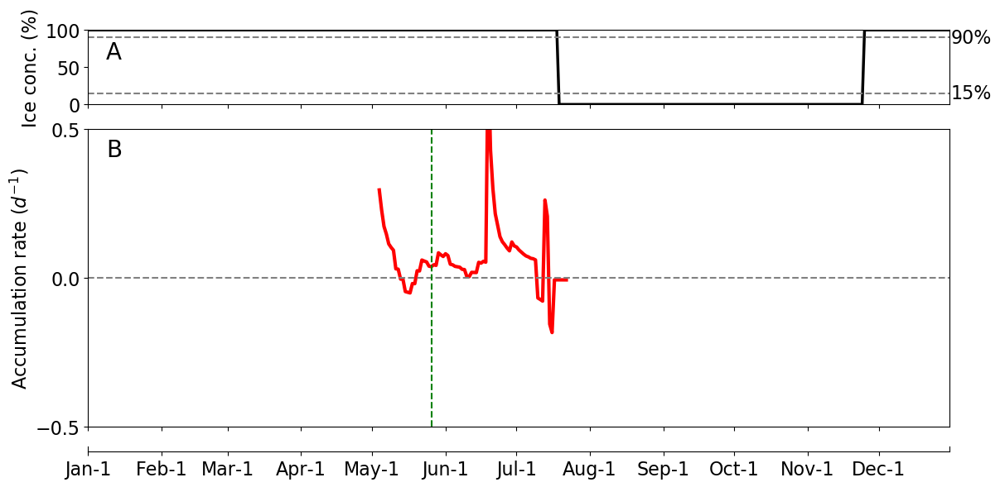

In [134]:
mpl.rc('font', **{'size' : 16})

locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
        'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')

fig,axs=plt.subplots(3,1,sharex=False,figsize=(16, 6))

# --- ICE CONCENTRATIONS
ax=axs[0]
ax.plot(first_year,ice*100,'k-',lw=2.5)
ax.set_xlim(first_year[0],first_year[-1])
xlims=ax.get_xlim()
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Ice conc. (%)')
ax.set_ylim(0,100)
ax.plot(xlims,[15,15],'k--',color='gray')
ax.plot(xlims,[90,90],'k--',color='gray')
ax.text(xlims[1]+.5,15,'15%',verticalalignment='center')
ax.text(xlims[1]+.5,90,'90%',verticalalignment='center')
plt.text(0.03,0.7,'A',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# --- ACCUMULATION RATE
ax=axs[1]
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Accumulation rate ($d^{-1}$)')
h1=ax.plot(first_year,array1d_iT_accfluo,'-',color='red',lw=3)
ax.set_xlim(xlims)
ax.set_yticks(np.arange(-0.5,1.0,0.5))
ax.set_ylim(-0.5,0.5)
ax.plot(xlims,[0,0],'k--',color='gray')
plt.text(0.03,0.93,'B',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)
# adding the vertical line at start of bloom development
ax.axvline(dev,color='green',linestyle='--')

# --- ADDITIONAL X-AXIS
ax=axs[2]
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels(labels)
ax.axes.get_yaxis().set_visible(False)
ax.spines['top'].set_visible(False)

# --- POSITION
axs[0].set_position( [0.12,0.80  ,0.65,.15])
axs[1].set_position( [0.12,0.15  ,0.65,.60])
axs[2].set_position( [0.12,0.10  ,0.65,.01])

# --- SAVE
plt.savefig('validation/GEic2016.acc.chlfluolowess.40m.png')

### Observations of chlorophyll $a$ by HPLC (0-40m): date of bloom initiation

In [135]:
x=first_year
y=array1d_iT_obsvint40mchlHPLC
df=pd.DataFrame({'Day of year':x,'Observed Chl a vert. integrated (0-40m)':y})
# df

In [136]:
# Create a scatter plot
fig = px.scatter(df, x=df['Day of year'], y=df['Observed Chl a vert. integrated (0-40m)'],
                 opacity=0.8, color_discrete_sequence=['black'])

# Change chart background color
fig.update_layout(dict(plot_bgcolor = 'white'))

# Update axes lines
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey', 
                 zeroline=True, zerolinewidth=1, zerolinecolor='lightgrey', 
                 showline=True, linewidth=1, linecolor='black')

fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey', 
                 zeroline=True, zerolinewidth=1, zerolinecolor='lightgrey', 
                 showline=True, linewidth=1, linecolor='black')

# Set figure title
fig.update_layout(title=dict(text="Observed Chl a vert. integrated (0-40m)", 
                             font=dict(color='black')))

# Update marker size
fig.update_traces(marker=dict(size=3))

fig.show()

Figure. Scatterplot of day of year and observed Chl a vert. integrated (0-40m).

In [137]:
y_hat=statsmodels.nonparametric.smoothers_lowess.lowess(y,x,frac=1/4) #2/3 is the default

In [138]:
# Create a scatter plot
fig = px.scatter(df, x=df['Day of year'], y=df['Observed Chl a vert. integrated (0-40m)'],
                 opacity=0.8, color_discrete_sequence=['black'])

# Add the prediction line
fig.add_traces(go.Scatter(x=y_hat[:,0], y=y_hat[:,1], name='LOWESS, frac=1/4', line=dict(color='red')))

# Change chart background color
fig.update_layout(dict(plot_bgcolor = 'white'))

# Update axes lines
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey', 
                 zeroline=True, zerolinewidth=1, zerolinecolor='lightgrey', 
                 showline=True, linewidth=1, linecolor='black')

fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey', 
                 zeroline=True, zerolinewidth=1, zerolinecolor='lightgrey', 
                 showline=True, linewidth=1, linecolor='black')

# Set figure title
fig.update_layout(title=dict(text="Observed Chl a vert. integrated (0-40m)", 
                             font=dict(color='black')))

# Update marker size
fig.update_traces(marker=dict(size=3))

fig.show()

Figure. LOWESS of Observed Chl a vert. integrated (0-40m).

In [139]:
# ------- Define interploation functions -------
# Linear - draws a line between the two nearest points and calculates y value based on the slope of that line
f_linear = scipy.interpolate.interp1d(y_hat[:,0],
                                      y=y_hat[:,1],
                                      bounds_error=False) 

# Create a new set of points with x values
indices_not_nan=np.argwhere(~np.isnan(y)).flatten()
start=indices_not_nan[0]
end  =indices_not_nan[-1]
xnew=np.empty(end-start+1)
for iT in range(start,end+1):
    xnew[iT-start]=iT
    
# Find y values based on the interpolation method
array1d_iT_obsvintchlHPLClowess=f_linear(xnew)

start_edge=np.empty(start)
start_edge[:]=np.NaN
end_edge=np.empty(365-1-end)
end_edge[:]=np.NaN
array1d_iT_obsvintchlHPLClowess=np.concatenate((start_edge,
                                                array1d_iT_obsvintchlHPLClowess,
                                                end_edge))

In [140]:
x=first_year
y=array1d_iT_obsvintchlHPLClowess
df=pd.DataFrame({'Day of year':x,'Smoothed and interpolated observed Chl a vert. integrated (0-40m)':y})
# df

In [141]:
indices_not_nan=np.argwhere(~np.isnan(array1d_iT_obsvintchlHPLClowess)).flatten()
start=indices_not_nan[0]
end  =indices_not_nan[-1]
# no NaN between first and last smoothed observed value
assert np.array_equal(indices_not_nan,np.arange(start,end+1)), (
    'There is at least one NaN in array1d_iT_obsvintchlHPLCsmooth before '
    'its first and last valid values.')
array1d_iT_accHPLC=np.empty(365)
array1d_iT_accHPLC[:]=np.NaN
for iT in range(start+1,end):
    chliT=array1d_iT_obsvintchlHPLClowess[iT]
    chljT=array1d_iT_obsvintchlHPLClowess[iT-1]
    acc=(chliT-chljT)/chljT
    array1d_iT_accHPLC[iT]=acc

In [142]:
x=first_year
y=array1d_iT_accHPLC
df=pd.DataFrame({'Day of year':x,'Accumulation rates':y})
# df

In [143]:
found=False
iT=136 # starting after the small peak of 129 (May 9) + 7
while not found and iT<=364:
    array1d_iT_accweekbefore=array1d_iT_accHPLC[np.arange(iT-6,iT+1)]
    if(np.all(~np.isnan(array1d_iT_accweekbefore)) \
       and \
       np.all(array1d_iT_accweekbefore>0)):
        found=True
    else:
        iT=iT+1
dev=iT
year=2016 # any non-leap year
# transform day of year into date
# https://stackoverflow.com/questions/2427555/python-question-year-and-day-of-year-to-date
# see answer of Ignacio Vazquez-Abrams
devs=datetime.datetime(year,1,1) + datetime.timedelta(dev)

Day of year

In [144]:
dev+1

146

In [145]:
devs.strftime("%B %d")

'May 25'

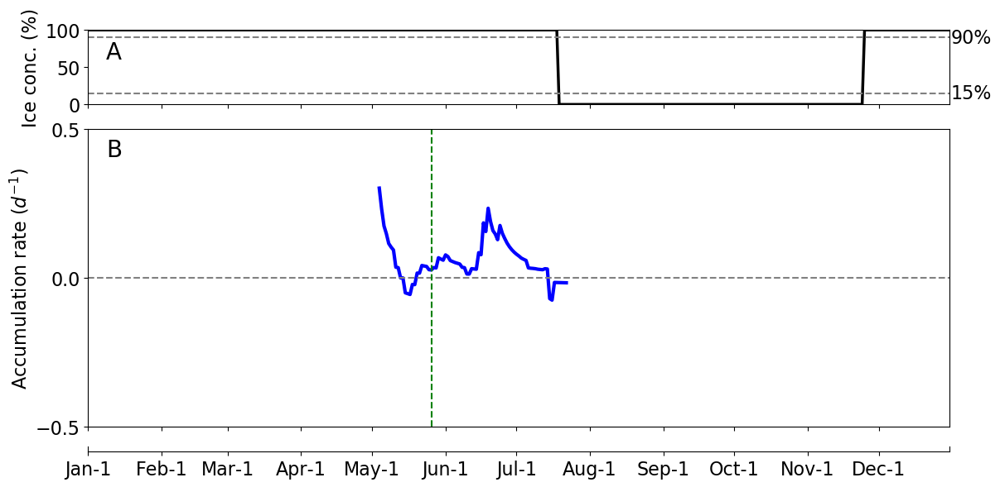

In [146]:
mpl.rc('font', **{'size' : 16})

locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
        'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')

fig,axs=plt.subplots(3,1,sharex=False,figsize=(16, 6))

# --- ICE CONCENTRATIONS
ax=axs[0]
ax.plot(first_year,ice*100,'k-',lw=2.5)
ax.set_xlim(first_year[0],first_year[-1])
xlims=ax.get_xlim()
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Ice conc. (%)')
ax.set_ylim(0,100)
ax.plot(xlims,[15,15],'k--',color='gray')
ax.plot(xlims,[90,90],'k--',color='gray')
ax.text(xlims[1]+.5,15,'15%',verticalalignment='center')
ax.text(xlims[1]+.5,90,'90%',verticalalignment='center')
plt.text(0.03,0.7,'A',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# --- ACCUMULATION RATE
ax=axs[1]
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Accumulation rate ($d^{-1}$)')
h1=ax.plot(first_year,array1d_iT_accHPLC,'-',color='blue',lw=3)
ax.set_xlim(xlims)
ax.set_yticks(np.arange(-0.5,1.0,0.5))
ax.set_ylim(-0.5,0.5)
ax.plot(xlims,[0,0],'k--',color='gray')
plt.text(0.03,0.93,'B',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)
# adding the vertical line at start of bloom development
ax.axvline(dev,color='green',linestyle='--')

# --- ADDITIONAL X-AXIS
ax=axs[2]
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels(labels)
ax.axes.get_yaxis().set_visible(False)
ax.spines['top'].set_visible(False)

# --- POSITION
axs[0].set_position( [0.12,0.80  ,0.65,.15])
axs[1].set_position( [0.12,0.15  ,0.65,.60])
axs[2].set_position( [0.12,0.10  ,0.65,.01])

# --- SAVE
plt.savefig('validation/GEic2016.acc.chlHPLClowesswithfirst.40m.png')

### Model chlorophyll $a$ (0-40m): date of bloom initiation

In [147]:
array1d_iT_acc=np.empty(365)
array1d_iT_acc[:]=np.NaN
for iT in np.arange(1,365):
    chl_iT=array1d_iT_modvint40mchl[iT]
    chl_iTm1=array1d_iT_modvint40mchl[iT-1]
    acc=(chl_iT-chl_iTm1)/chl_iTm1
    array1d_iT_acc[iT]=acc

In [148]:
found=False
iT=6
while not found and iT<=364:
    array1d_iT_accweekbefore=array1d_iT_acc[np.arange(iT-6,iT+1)]
    if(np.all(~np.isnan(array1d_iT_accweekbefore)) \
       and \
       np.all(array1d_iT_accweekbefore>0)):
        found=True
    else:
        iT=iT+1
dev=iT
year=2016 # any non-leap year
# transform day of year into date
# https://stackoverflow.com/questions/2427555/python-question-year-and-day-of-year-to-date
# see answer of Ignacio Vazquez-Abrams
devs=datetime.datetime(year,1,1) + datetime.timedelta(dev)

Day of year

In [149]:
dev+1

134

In [150]:
devs.strftime("%B %d")

'May 13'

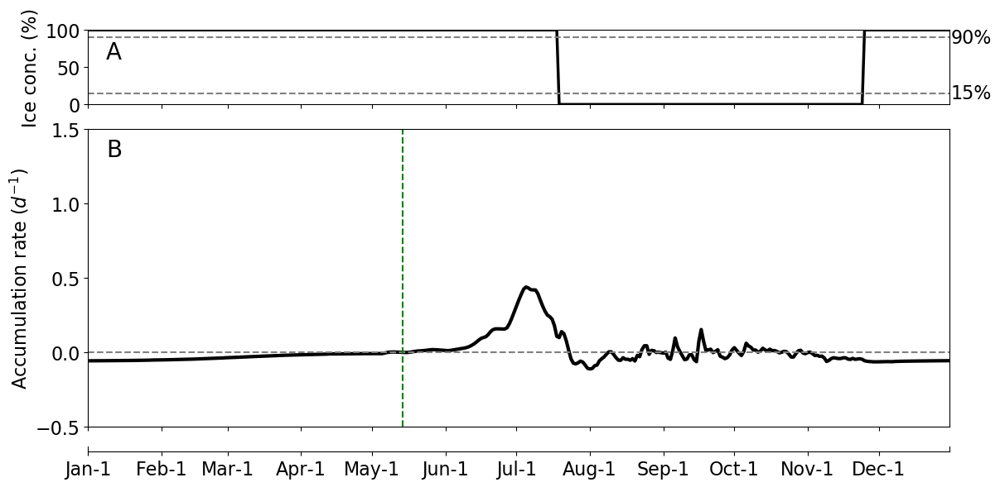

In [151]:
mpl.rc('font', **{'size' : 16})

locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
        'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')

fig,axs=plt.subplots(3,1,sharex=False,figsize=(16, 6))

# --- ICE CONCENTRATIONS
ax=axs[0]
ax.plot(first_year,ice*100,'k-',lw=2.5)
ax.set_xlim(first_year[0],first_year[-1])
xlims=ax.get_xlim()
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Ice conc. (%)')
ax.set_ylim(0,100)
ax.plot(xlims,[15,15],'k--',color='gray')
ax.plot(xlims,[90,90],'k--',color='gray')
ax.text(xlims[1]+.5,15,'15%',verticalalignment='center')
ax.text(xlims[1]+.5,90,'90%',verticalalignment='center')
plt.text(0.03,0.7,'A',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# --- ACCUMULATION RATE
ax=axs[1]
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Accumulation rate ($d^{-1}$)')
h1=ax.plot(first_year,array1d_iT_acc,'-',color='black',lw=3)
ax.set_xlim(xlims)
ax.set_yticks(np.arange(-0.5,2.5,0.5))
ax.set_ylim(-0.5,1.5)
ax.plot(xlims,[0,0],'k--',color='gray')
plt.text(0.03,0.93,'B',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)
# adding the vertical line at start of bloom development
ax.axvline(dev,color='green',linestyle='--')

# --- ADDITIONAL X-AXIS
ax=axs[2]
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels(labels)
ax.axes.get_yaxis().set_visible(False)
ax.spines['top'].set_visible(False)

# --- POSITION
axs[0].set_position( [0.12,0.80  ,0.65,.15])
axs[1].set_position( [0.12,0.15  ,0.65,.60])
axs[2].set_position( [0.12,0.10  ,0.65,.01])

# --- SAVE
plt.savefig('chl.0000000000.t001.acc.chl.40m.png')

### Model biomass (0-40m): date of bloom initiation

In [152]:
array1d_iT_acc=np.empty(365)
array1d_iT_acc[:]=np.NaN
for iT in np.arange(1,365):
    mod_iT=array1d_iT_mod40mphytobio[iT]
    mod_iTm1=array1d_iT_mod40mphytobio[iT-1]
    acc=(mod_iT-mod_iTm1)/mod_iTm1
    array1d_iT_acc[iT]=acc

In [153]:
found=False
iT=6
while not found and iT<=364:
    array1d_iT_accweekbefore=array1d_iT_acc[np.arange(iT-6,iT+1)]
    if(np.all(~np.isnan(array1d_iT_accweekbefore)) \
       and \
       np.all(array1d_iT_accweekbefore>0)):
        found=True
    else:
        iT=iT+1
dev=iT
year=2016 # any non-leap year
# transform day of year into date
# https://stackoverflow.com/questions/2427555/python-question-year-and-day-of-year-to-date
# see answer of Ignacio Vazquez-Abrams
devs=datetime.datetime(year,1,1) + datetime.timedelta(dev)

Day of year

In [154]:
dev+1

142

In [155]:
devs.strftime("%B %d")

'May 21'

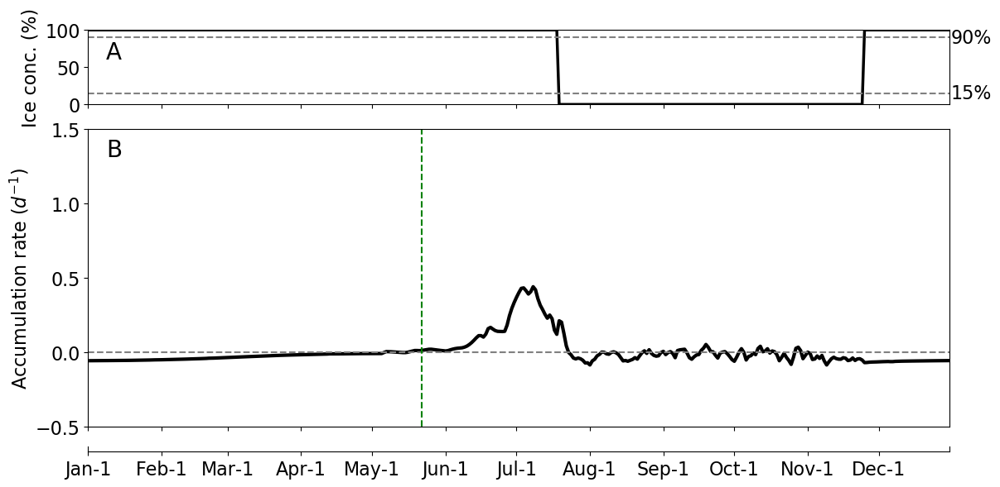

In [156]:
mpl.rc('font', **{'size' : 16})

locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
        'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')

fig,axs=plt.subplots(3,1,sharex=False,figsize=(16, 6))

# --- ICE CONCENTRATIONS
ax=axs[0]
ax.plot(first_year,ice*100,'k-',lw=2.5)
ax.set_xlim(first_year[0],first_year[-1])
xlims=ax.get_xlim()
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Ice conc. (%)')
ax.set_ylim(0,100)
ax.plot(xlims,[15,15],'k--',color='gray')
ax.plot(xlims,[90,90],'k--',color='gray')
ax.text(xlims[1]+.5,15,'15%',verticalalignment='center')
ax.text(xlims[1]+.5,90,'90%',verticalalignment='center')
plt.text(0.03,0.7,'A',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# --- ACCUMULATION RATE
ax=axs[1]
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Accumulation rate ($d^{-1}$)')
h1=ax.plot(first_year,array1d_iT_acc,'-',color='black',lw=3)
ax.set_xlim(xlims)
ax.set_yticks(np.arange(-0.5,2.5,0.5))
ax.set_ylim(-0.5,1.5)
ax.plot(xlims,[0,0],'k--',color='gray')
plt.text(0.03,0.93,'B',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)
# adding the vertical line at start of bloom development
ax.axvline(dev,color='green',linestyle='--')

# --- ADDITIONAL X-AXIS
ax=axs[2]
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels(labels)
ax.axes.get_yaxis().set_visible(False)
ax.spines['top'].set_visible(False)

# --- POSITION
axs[0].set_position( [0.12,0.80  ,0.65,.15])
axs[1].set_position( [0.12,0.15  ,0.65,.60])
axs[2].set_position( [0.12,0.10  ,0.65,.01])

# --- SAVE
plt.savefig('car.0000000000.t001.acc.phytobio.40m.png')

### Observations of chlorophyll $a$ by fluorimetry (0-100m): date of bloom initiation

In [157]:
x=first_year
y=array1d_iT_obsvintchlfluo
df=pd.DataFrame({'Day of year':x,'Observed Chl a vert. integrated (0-100m)':y})
# df

In [158]:
# Create a scatter plot
fig = px.scatter(df, x=df['Day of year'], y=df['Observed Chl a vert. integrated (0-100m)'],
                 opacity=0.8, color_discrete_sequence=['black'])

# Change chart background color
fig.update_layout(dict(plot_bgcolor = 'white'))

# Update axes lines
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey', 
                 zeroline=True, zerolinewidth=1, zerolinecolor='lightgrey', 
                 showline=True, linewidth=1, linecolor='black')

fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey', 
                 zeroline=True, zerolinewidth=1, zerolinecolor='lightgrey', 
                 showline=True, linewidth=1, linecolor='black')

# Set figure title
fig.update_layout(title=dict(text="Observed Chl a vert. integrated (0-100m)", 
                             font=dict(color='black')))

# Update marker size
fig.update_traces(marker=dict(size=3))

fig.show()

Figure. Scatterplot of day of year and observed Chl a vert. integrated (0-100m).

In [159]:
y_hat=statsmodels.nonparametric.smoothers_lowess.lowess(y,x,frac=1/4) #2/3 is the default

In [160]:
# Create a scatter plot
fig = px.scatter(df, x=df['Day of year'], y=df['Observed Chl a vert. integrated (0-100m)'],
                 opacity=0.8, color_discrete_sequence=['black'])

# Add the prediction line
fig.add_traces(go.Scatter(x=y_hat[:,0], y=y_hat[:,1], name='LOWESS, frac=1/4', line=dict(color='red')))

# Change chart background color
fig.update_layout(dict(plot_bgcolor = 'white'))

# Update axes lines
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey', 
                 zeroline=True, zerolinewidth=1, zerolinecolor='lightgrey', 
                 showline=True, linewidth=1, linecolor='black')

fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey', 
                 zeroline=True, zerolinewidth=1, zerolinecolor='lightgrey', 
                 showline=True, linewidth=1, linecolor='black')

# Set figure title
fig.update_layout(title=dict(text="Observed Chl a vert. integrated (0-100m)", 
                             font=dict(color='black')))

# Update marker size
fig.update_traces(marker=dict(size=3))

fig.show()

Figure. LOWESS of Observed Chl a vert. integrated (0-100m).

In [161]:
# ------- Define interploation functions -------
# Linear - draws a line between the two nearest points and calculates y value based on the slope of that line
f_linear = scipy.interpolate.interp1d(y_hat[:,0],
                                      y=y_hat[:,1],
                                      bounds_error=False) 

# Create a new set of points with x values
indices_not_nan=np.argwhere(~np.isnan(y)).flatten()
start=indices_not_nan[0]
end  =indices_not_nan[-1]
xnew=np.empty(end-start+1)
for iT in range(start,end+1):
    xnew[iT-start]=iT
    
# Find y values based on the interpolation method
array1d_iT_obsvintchlfluolowess=f_linear(xnew)

start_edge=np.empty(start)
start_edge[:]=np.NaN
end_edge=np.empty(365-1-end)
end_edge[:]=np.NaN
array1d_iT_obsvintchlfluolowess=np.concatenate((start_edge,
                                                array1d_iT_obsvintchlfluolowess,
                                                end_edge))

In [162]:
x=first_year
y=array1d_iT_obsvintchlfluolowess
df=pd.DataFrame({'Day of year':x,'Smoothed and interpolated observed Chl a vert. integrated (0-100m)':y})
# df

In [163]:
indices_not_nan=np.argwhere(~np.isnan(array1d_iT_obsvintchlfluolowess)).flatten()
start=indices_not_nan[0]
end  =indices_not_nan[-1]
# no NaN between first and last smoothed observed value
assert np.array_equal(indices_not_nan,np.arange(start,end+1)), (
    'There is at least one NaN in array1d_iT_obsvintchlfluolowess before '
    'its first and last valid values.')
array1d_iT_accfluo=np.empty(365)
array1d_iT_accfluo[:]=np.NaN
for iT in range(start+1,end):
    chliT=array1d_iT_obsvintchlfluolowess[iT]
    chljT=array1d_iT_obsvintchlfluolowess[iT-1]
    acc=(chliT-chljT)/chljT
    array1d_iT_accfluo[iT]=acc

In [164]:
x=first_year
y=array1d_iT_accfluo
df=pd.DataFrame({'Day of year':x,'Accumulation rates':y})
# df

In [165]:
found=False
iT=136 # starting after the small peak of 129 (May 9) + 7
while not found and iT<=364:
    array1d_iT_accweekbefore=array1d_iT_accfluo[np.arange(iT-6,iT+1)]
    if(np.all(~np.isnan(array1d_iT_accweekbefore)) \
       and \
       np.all(array1d_iT_accweekbefore>0)):
        found=True
    else:
        iT=iT+1
dev=iT
year=2016 # any non-leap year
# transform day of year into date
# https://stackoverflow.com/questions/2427555/python-question-year-and-day-of-year-to-date
# see answer of Ignacio Vazquez-Abrams
devs=datetime.datetime(year,1,1) + datetime.timedelta(dev)

Day of year

In [166]:
dev+1

146

In [167]:
devs.strftime("%B %d")

'May 25'

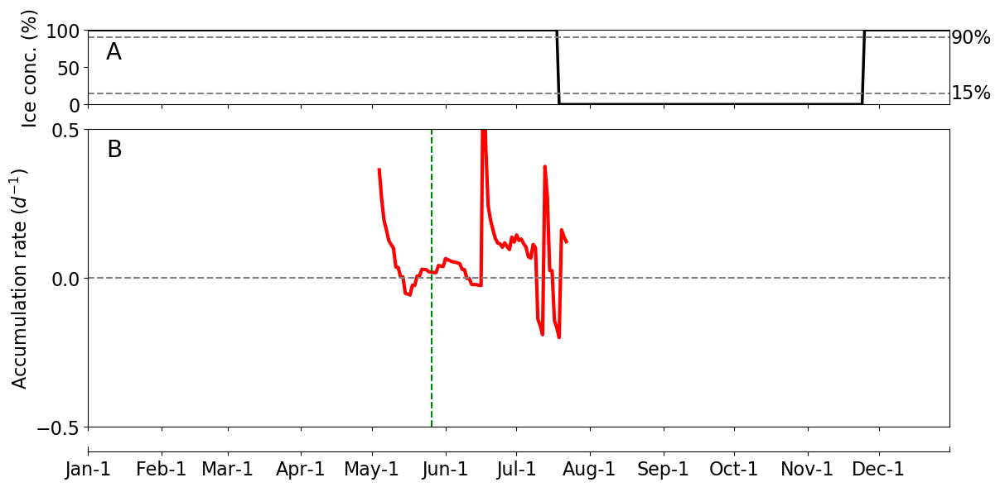

In [168]:
mpl.rc('font', **{'size' : 16})

locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
        'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')

fig,axs=plt.subplots(3,1,sharex=False,figsize=(16, 6))

# --- ICE CONCENTRATIONS
ax=axs[0]
ax.plot(first_year,ice*100,'k-',lw=2.5)
ax.set_xlim(first_year[0],first_year[-1])
xlims=ax.get_xlim()
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Ice conc. (%)')
ax.set_ylim(0,100)
ax.plot(xlims,[15,15],'k--',color='gray')
ax.plot(xlims,[90,90],'k--',color='gray')
ax.text(xlims[1]+.5,15,'15%',verticalalignment='center')
ax.text(xlims[1]+.5,90,'90%',verticalalignment='center')
plt.text(0.03,0.7,'A',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# --- ACCUMULATION RATE
ax=axs[1]
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Accumulation rate ($d^{-1}$)')
h1=ax.plot(first_year,array1d_iT_accfluo,'-',color='red',lw=3)
ax.set_xlim(xlims)
ax.set_yticks(np.arange(-0.5,1.0,0.5))
ax.set_ylim(-0.5,0.5)
ax.plot(xlims,[0,0],'k--',color='gray')
plt.text(0.03,0.93,'B',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)
# adding the vertical line at start of bloom development
ax.axvline(dev,color='green',linestyle='--')

# --- ADDITIONAL X-AXIS
ax=axs[2]
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels(labels)
ax.axes.get_yaxis().set_visible(False)
ax.spines['top'].set_visible(False)

# --- POSITION
axs[0].set_position( [0.12,0.80  ,0.65,.15])
axs[1].set_position( [0.12,0.15  ,0.65,.60])
axs[2].set_position( [0.12,0.10  ,0.65,.01])

# --- SAVE
plt.savefig('validation/GEic2016.acc.chlfluolowess.100m.png')

### Observations of chlorophyll $a$ by HPLC (0-100m): date of bloom initiation

In [169]:
blooms_df=pd.DataFrame(index=[2016],
                       columns=['tI','cI','tP','cP','m_from2points'],
                      dtype=np.float32)

In [170]:
blooms_df

,tI,cI,tP,cP,m_from2points
2016,NaN,NaN,NaN,NaN,NaN


In [171]:
x=first_year
y=array1d_iT_obsvintchlHPLC
df=pd.DataFrame({'Day of year':x,'Observed Chl a vert. integrated (0-100m)':y})
# df

In [172]:
# Create a scatter plot
fig = px.scatter(df, x=df['Day of year'], y=df['Observed Chl a vert. integrated (0-100m)'],
                 opacity=0.8, color_discrete_sequence=['black'])

# Change chart background color
fig.update_layout(dict(plot_bgcolor = 'white'))

# Update axes lines
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey', 
                 zeroline=True, zerolinewidth=1, zerolinecolor='lightgrey', 
                 showline=True, linewidth=1, linecolor='black')

fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey', 
                 zeroline=True, zerolinewidth=1, zerolinecolor='lightgrey', 
                 showline=True, linewidth=1, linecolor='black',
                range=[0,251])

# Set figure title
fig.update_layout(title=dict(text="Observed Chl a vert. integrated (0-100m)", 
                             font=dict(color='black')))

# Update marker size
fig.update_traces(marker=dict(size=3))

fig.show()

Figure. Scatterplot of day of year and observed Chl a vert. integrated (0-100m).

In [173]:
y_hat=statsmodels.nonparametric.smoothers_lowess.lowess(y,x,frac=1/4) #2/3 is the default

In [174]:
# Create a scatter plot
fig = px.scatter(df, x=df['Day of year'], y=df['Observed Chl a vert. integrated (0-100m)'],
                 opacity=0.8, color_discrete_sequence=['black'])

# Add the prediction line
fig.add_traces(go.Scatter(x=y_hat[:,0], y=y_hat[:,1], name='LOWESS, frac=1/4', line=dict(color='red')))

# Change chart background color
fig.update_layout(dict(plot_bgcolor = 'white'))

# Update axes lines
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey', 
                 zeroline=True, zerolinewidth=1, zerolinecolor='lightgrey', 
                 showline=True, linewidth=1, linecolor='black')

fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey', 
                 zeroline=True, zerolinewidth=1, zerolinecolor='lightgrey', 
                 showline=True, linewidth=1, linecolor='black',
                range=[0,251])

# Set figure title
fig.update_layout(title=dict(text="Observed Chl a vert. integrated (0-100m)", 
                             font=dict(color='black')))

# Update marker size
fig.update_traces(marker=dict(size=3))

fig.show()

In [175]:
# ------- Define interploation functions -------
# Linear - draws a line between the two nearest points and calculates y value based on the slope of that line
f_linear = scipy.interpolate.interp1d(y_hat[:,0],
                                      y=y_hat[:,1],
                                      bounds_error=False) 

# Create a new set of points with x values
indices_not_nan=np.argwhere(~np.isnan(y)).flatten()
start=indices_not_nan[0]
end  =indices_not_nan[-1]
xnew=np.empty(end-start+1)
for iT in range(start,end+1):
    xnew[iT-start]=iT
    
# Find y values based on the interpolation method
array1d_iT_obsvintchlHPLClowess=f_linear(xnew)

start_edge=np.empty(start)
start_edge[:]=np.NaN
end_edge=np.empty(365-1-end)
end_edge[:]=np.NaN
array1d_iT_obsvintchlHPLClowess=np.concatenate((start_edge,
                                                array1d_iT_obsvintchlHPLClowess,
                                                end_edge))

In [176]:
x=first_year
y=array1d_iT_obsvintchlHPLClowess
df=pd.DataFrame({'Day of year':x,'Smoothed and interpolated observed Chl a vert. integrated (0-100m)':y})
# df

In [177]:
indices_not_nan=np.argwhere(~np.isnan(array1d_iT_obsvintchlHPLClowess)).flatten()
start=indices_not_nan[0]
end  =indices_not_nan[-1]
# no NaN between first and last smoothed observed value
assert np.array_equal(indices_not_nan,np.arange(start,end+1)), (
    'There is at least one NaN in array1d_iT_obsvintchlHPLCsmooth before '
    'its first and last valid values.')
array1d_iT_accHPLC=np.empty(365)
array1d_iT_accHPLC[:]=np.NaN
for iT in range(start+1,end):
    chliT=array1d_iT_obsvintchlHPLClowess[iT]
    chljT=array1d_iT_obsvintchlHPLClowess[iT-1]
    acc=(chliT-chljT)/chljT
    array1d_iT_accHPLC[iT]=acc

In [178]:
x=first_year
y=array1d_iT_accHPLC
df=pd.DataFrame({'Day of year':x,'Accumulation rates':y})
# df

In [179]:
found=False
iT=136 # starting after the small peak of 129 (May 9) + 7
while not found and iT<=364:
    array1d_iT_accweekbefore=array1d_iT_accHPLC[np.arange(iT-6,iT+1)]
    if(np.all(~np.isnan(array1d_iT_accweekbefore)) \
       and \
       np.all(array1d_iT_accweekbefore>0)):
        found=True
    else:
        iT=iT+1
dev=iT
year=2016 # any non-leap year
# transform day of year into date
# https://stackoverflow.com/questions/2427555/python-question-year-and-day-of-year-to-date
# see answer of Ignacio Vazquez-Abrams
devs=datetime.datetime(year,1,1) + datetime.timedelta(dev)

Day of year

In [180]:
tI=dev+1

In [181]:
devs.strftime("%B %d")

'May 27'

In [182]:
cI=array1d_iT_obsvintchlHPLClowess[dev]

(in $mg\ Chl\ m^{-2}$)

In [183]:
cI

6.412508830445615

In [184]:
blooms_df.loc[2016,['tI']]=tI
blooms_df.loc[2016,['cI']]=cI

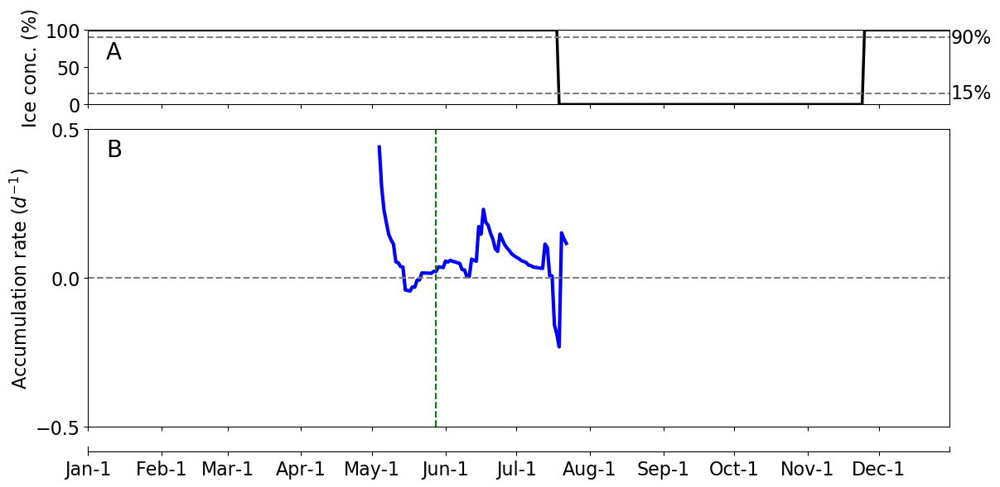

In [185]:
mpl.rc('font', **{'size' : 16})

locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
        'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')

fig,axs=plt.subplots(3,1,sharex=False,figsize=(16, 6))

# --- ICE CONCENTRATIONS
ax=axs[0]
ax.plot(first_year,ice*100,'k-',lw=2.5)
ax.set_xlim(first_year[0],first_year[-1])
xlims=ax.get_xlim()
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Ice conc. (%)')
ax.set_ylim(0,100)
ax.plot(xlims,[15,15],'k--',color='gray')
ax.plot(xlims,[90,90],'k--',color='gray')
ax.text(xlims[1]+.5,15,'15%',verticalalignment='center')
ax.text(xlims[1]+.5,90,'90%',verticalalignment='center')
plt.text(0.03,0.7,'A',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# --- ACCUMULATION RATE
ax=axs[1]
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Accumulation rate ($d^{-1}$)')
h1=ax.plot(first_year,array1d_iT_accHPLC,'-',color='blue',lw=3)
ax.set_xlim(xlims)
ax.set_yticks(np.arange(-0.5,1.0,0.5))
ax.set_ylim(-0.5,0.5)
ax.plot(xlims,[0,0],'k--',color='gray')
plt.text(0.03,0.93,'B',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)
# adding the vertical line at start of bloom development
ax.axvline(dev,color='green',linestyle='--')

# --- ADDITIONAL X-AXIS
ax=axs[2]
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels(labels)
ax.axes.get_yaxis().set_visible(False)
ax.spines['top'].set_visible(False)

# --- POSITION
axs[0].set_position( [0.12,0.80  ,0.65,.15])
axs[1].set_position( [0.12,0.15  ,0.65,.60])
axs[2].set_position( [0.12,0.10  ,0.65,.01])

# --- SAVE
plt.savefig('validation/GEic2016.acc.chlHPLClowess.100mwithfirst.png')

### Model chlorophyll $a$ (0-100m): date of bloom initiation

In [186]:
array1d_iT_acc=np.empty(365)
array1d_iT_acc[:]=np.NaN
for iT in np.arange(1,365):
    chl_iT=array1d_iT_modvintchl[iT]
    chl_iTm1=array1d_iT_modvintchl[iT-1]
    acc=(chl_iT-chl_iTm1)/chl_iTm1
    array1d_iT_acc[iT]=acc

In [187]:
found=False
iT=6
while not found and iT<=364:
    array1d_iT_accweekbefore=array1d_iT_acc[np.arange(iT-6,iT+1)]
    if(np.all(~np.isnan(array1d_iT_accweekbefore)) \
       and \
       np.all(array1d_iT_accweekbefore>0)):
        found=True
    else:
        iT=iT+1
dev=iT
year=2016 # any non-leap year
# transform day of year into date
# https://stackoverflow.com/questions/2427555/python-question-year-and-day-of-year-to-date
# see answer of Ignacio Vazquez-Abrams
devs=datetime.datetime(year,1,1) + datetime.timedelta(dev)

Day of year

In [188]:
dev+1

144

In [189]:
devs.strftime("%B %d")

'May 23'

In [190]:
c_I=array1d_iT_modvintchl[dev]

(in $mg\ Chl\ m^{-2}$)

In [191]:
c_I

0.028467301378676

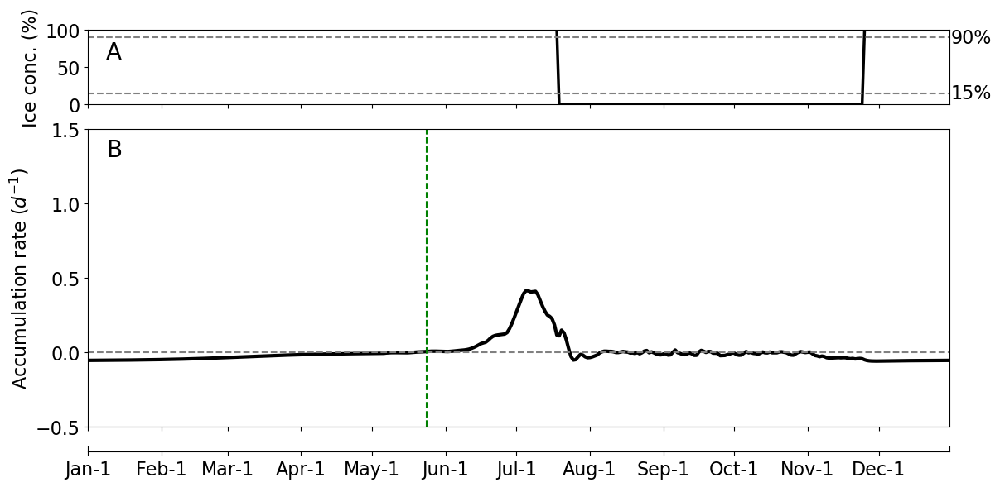

In [192]:
mpl.rc('font', **{'size' : 16})

locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
        'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')

fig,axs=plt.subplots(3,1,sharex=False,figsize=(16, 6))

# --- ICE CONCENTRATIONS
ax=axs[0]
ax.plot(first_year,ice*100,'k-',lw=2.5)
ax.set_xlim(first_year[0],first_year[-1])
xlims=ax.get_xlim()
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Ice conc. (%)')
ax.set_ylim(0,100)
ax.plot(xlims,[15,15],'k--',color='gray')
ax.plot(xlims,[90,90],'k--',color='gray')
ax.text(xlims[1]+.5,15,'15%',verticalalignment='center')
ax.text(xlims[1]+.5,90,'90%',verticalalignment='center')
plt.text(0.03,0.7,'A',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# --- ACCUMULATION RATE
ax=axs[1]
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Accumulation rate ($d^{-1}$)')
h1=ax.plot(first_year,array1d_iT_acc,'-',color='black',lw=3)
ax.set_xlim(xlims)
ax.set_yticks(np.arange(-0.5,2.5,0.5))
ax.set_ylim(-0.5,1.5)
ax.plot(xlims,[0,0],'k--',color='gray')
plt.text(0.03,0.93,'B',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)
# adding the vertical line at start of bloom development
ax.axvline(dev,color='green',linestyle='--')

# --- ADDITIONAL X-AXIS
ax=axs[2]
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels(labels)
ax.axes.get_yaxis().set_visible(False)
ax.spines['top'].set_visible(False)

# --- POSITION
axs[0].set_position( [0.12,0.80  ,0.65,.15])
axs[1].set_position( [0.12,0.15  ,0.65,.60])
axs[2].set_position( [0.12,0.10  ,0.65,.01])

# --- SAVE
plt.savefig('chl.0000000000.t001.acc.chl.100m.png')

### Model biomass (0-100m): date of bloom initiation

In [193]:
array1d_iT_acc=np.empty(365)
array1d_iT_acc[:]=np.NaN
for iT in np.arange(1,365):
    mod_iT=array1d_iT_modphytobio[iT]
    mod_iTm1=array1d_iT_modphytobio[iT-1]
    acc=(mod_iT-mod_iTm1)/mod_iTm1
    array1d_iT_acc[iT]=acc

In [194]:
found=False
iT=6
while not found and iT<=364:
    array1d_iT_accweekbefore=array1d_iT_acc[np.arange(iT-6,iT+1)]
    if(np.all(~np.isnan(array1d_iT_accweekbefore)) \
       and \
       np.all(array1d_iT_accweekbefore>0)):
        found=True
    else:
        iT=iT+1
dev=iT
year=2016 # any non-leap year
# transform day of year into date
# https://stackoverflow.com/questions/2427555/python-question-year-and-day-of-year-to-date
# see answer of Ignacio Vazquez-Abrams
devs=datetime.datetime(year,1,1) + datetime.timedelta(dev)

Day of year

In [195]:
dev+1

143

In [196]:
devs.strftime("%B %d")

'May 22'

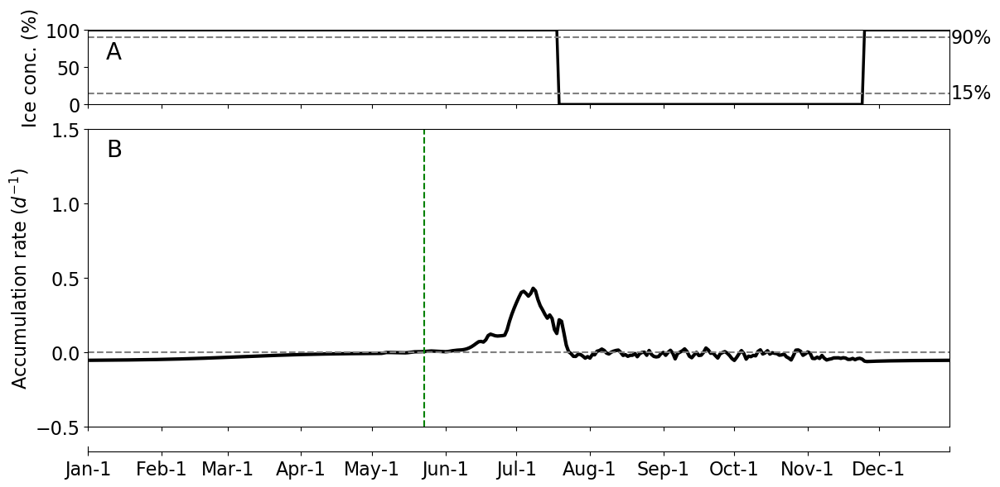

In [197]:
mpl.rc('font', **{'size' : 16})

locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
        'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')

fig,axs=plt.subplots(3,1,sharex=False,figsize=(16, 6))

# --- ICE CONCENTRATIONS
ax=axs[0]
ax.plot(first_year,ice*100,'k-',lw=2.5)
ax.set_xlim(first_year[0],first_year[-1])
xlims=ax.get_xlim()
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Ice conc. (%)')
ax.set_ylim(0,100)
ax.plot(xlims,[15,15],'k--',color='gray')
ax.plot(xlims,[90,90],'k--',color='gray')
ax.text(xlims[1]+.5,15,'15%',verticalalignment='center')
ax.text(xlims[1]+.5,90,'90%',verticalalignment='center')
plt.text(0.03,0.7,'A',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# --- ACCUMULATION RATE
ax=axs[1]
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Accumulation rate ($d^{-1}$)')
h1=ax.plot(first_year,array1d_iT_acc,'-',color='black',lw=3)
ax.set_xlim(xlims)
ax.set_yticks(np.arange(-0.5,2.5,0.5))
ax.set_ylim(-0.5,1.5)
ax.plot(xlims,[0,0],'k--',color='gray')
plt.text(0.03,0.93,'B',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)
# adding the vertical line at start of bloom development
ax.axvline(dev,color='green',linestyle='--')

# --- ADDITIONAL X-AXIS
ax=axs[2]
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels(labels)
ax.axes.get_yaxis().set_visible(False)
ax.spines['top'].set_visible(False)

# --- POSITION
axs[0].set_position( [0.12,0.80  ,0.65,.15])
axs[1].set_position( [0.12,0.15  ,0.65,.60])
axs[2].set_position( [0.12,0.10  ,0.65,.01])

# --- SAVE
plt.savefig('car.0000000000.t001.acc.phytobio.100m.png')

## Date of bloom peak

The date of the bloom peak was the date of the maximum (vertically integrated) chlorophyll $a$.

The case of model chlorophyll $a$ (0-100m) was an exception with two local maxima at similar magnitude.
In that case, a bloom peak period made more sense than a bloom peak date.
The bloom peak period was defined as the period between the two highest values that were also local maxima.

Vertically integrated (0-40m):

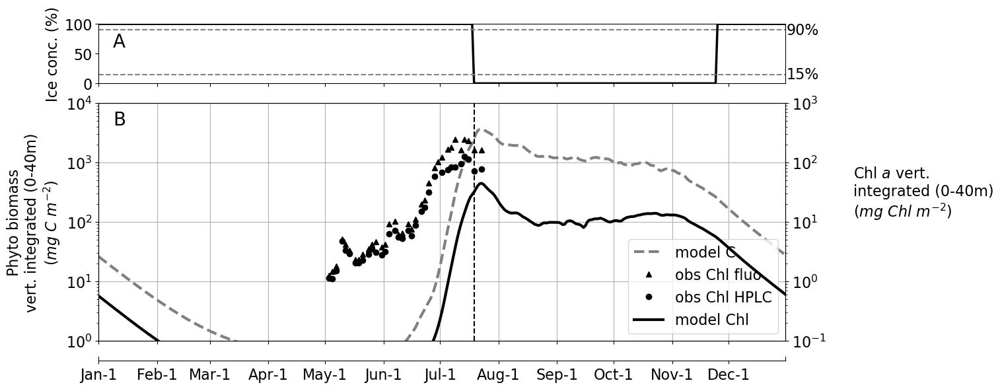

In [198]:
locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
        'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')

fig,axs=plt.subplots(3,1,sharex=False,figsize=(16, 6))

# --- ICE CONCENTRATIONS
ax=axs[0]
ax.plot(first_year,ice*100,'k-',lw=2.5)
ax.set_xlim(first_year[0],first_year[-1])
xlims=ax.get_xlim()
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Ice conc. (%)')
ax.set_ylim(0,100)
ax.plot(xlims,[15,15],'k--',color='gray')
ax.plot(xlims,[90,90],'k--',color='gray')
ax.text(xlims[1]+.5,15,'15%',verticalalignment='center')
ax.text(xlims[1]+.5,90,'90%',verticalalignment='center')
plt.text(0.03,0.7,'A',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# --- CHLOROPHYLL A AND BIOMASS
ax=axs[1]
# g C m^-3 -> mg C m^-3
h1=ax.plot(first_year,array1d_iT_mod40mphytobio*1E3,
           '--',color='grey',lw=3,label='model C')
ax.set_yscale('log')
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylim(1E0,1E4)
ax.set_ylabel('Phyto biomass\nvert. integrated (0-40m)\n($mg\ C\ m^{-2}$)')
ax.grid()
axt = ax.twinx()
h2=axt.plot(first_year,array1d_iT_obsvint40mchlfluo,
            '^',color='black',label='obs Chl fluo')
h3=axt.plot(first_year,array1d_iT_obsvint40mchlHPLC,
            'o',color='black',label='obs Chl HPLC')
h4=axt.plot(first_year,array1d_iT_modvint40mchl,
            '-',lw=3,color='black',label='model Chl')
axt.set_yscale('log')
axt.set_ylim(*[0.1*l for l in ax.get_ylim()])
axt.text(400,30,'Chl $a$ vert.\nintegrated (0-40m)\n($mg\ Chl\ m^{-2}$)',
        horizontalalignment = 'left',
        verticalalignment = 'center')
# ref: https://stackoverflow.com/questions/5484922/secondary-axis-with-twinx-how-to-add-to-legend
# answer by Paul
lns=h1+h2+h3+h4
labs = [l.get_label() for l in lns]
ax.legend(lns,labs,loc='lower right')
plt.text(0.03,0.93,'B',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)
# adding the vertical line at 15% of observed ice
ax.axvline(iT15_start_obs,color='k',linestyle='--')

# --- ADDITIONAL X-AXIS
ax=axs[2]
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels(labels)
ax.axes.get_yaxis().set_visible(False)
ax.spines['top'].set_visible(False)

# --- POSITION
axs[0].set_position( [0.12,0.80  ,0.65,.15])
axs[1].set_position( [0.12,0.15  ,0.65,.60])
axs[2].set_position( [0.12,0.10  ,0.65,.01])

# --- SAVE
plt.savefig('validation/GEic2016.comp.vint40m.logchlfluoHPLC.logphytobio.png')

Vertically integrated (0-100m):

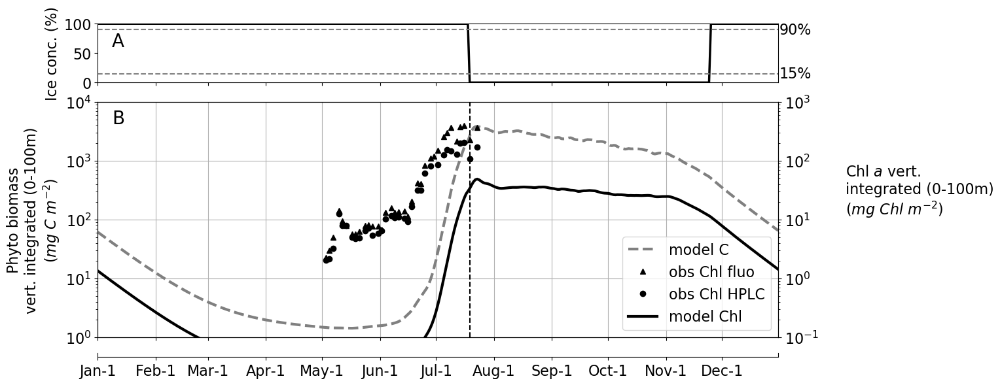

In [199]:
locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
        'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')

fig,axs=plt.subplots(3,1,sharex=False,figsize=(16, 6))

# --- ICE CONCENTRATIONS
ax=axs[0]
ax.plot(first_year,ice*100,'k-',lw=2.5)
ax.set_xlim(first_year[0],first_year[-1])
xlims=ax.get_xlim()
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Ice conc. (%)')
ax.set_ylim(0,100)
ax.plot(xlims,[15,15],'k--',color='gray')
ax.plot(xlims,[90,90],'k--',color='gray')
ax.text(xlims[1]+.5,15,'15%',verticalalignment='center')
ax.text(xlims[1]+.5,90,'90%',verticalalignment='center')
plt.text(0.03,0.7,'A',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# --- CHLOROPHYLL A AND BIOMASS
ax=axs[1]
# g C m^-3 -> mg C m^-3
h1=ax.plot(first_year,array1d_iT_modphytobio*1E3,
           '--',color='grey',lw=3,label='model C')
ax.set_yscale('log')
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylim(1E0,1E4)
ax.set_ylabel('Phyto biomass\nvert. integrated (0-100m)\n($mg\ C\ m^{-2}$)')
ax.grid()
axt = ax.twinx()
h2=axt.plot(first_year,array1d_iT_obsvintchlfluo,
            '^',color='black',label='obs Chl fluo')
h3=axt.plot(first_year,array1d_iT_obsvintchlHPLC,
            'o',color='black',label='obs Chl HPLC')
h4=axt.plot(first_year,array1d_iT_modvintchl,
            '-',lw=3,color='black',label='model Chl')
axt.set_yscale('log')
axt.set_ylim(*[0.1*l for l in ax.get_ylim()])
axt.text(400,30,'Chl $a$ vert.\nintegrated (0-100m)\n($mg\ Chl\ m^{-2}$)',
        horizontalalignment = 'left',
        verticalalignment = 'center')
# ref: https://stackoverflow.com/questions/5484922/secondary-axis-with-twinx-how-to-add-to-legend
# answer by Paul
lns=h1+h2+h3+h4
labs = [l.get_label() for l in lns]
ax.legend(lns,labs,loc='lower right')
plt.text(0.03,0.93,'B',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)
# adding the vertical line at 15% of observed ice
ax.axvline(iT15_start_obs,color='k',linestyle='--')

# --- ADDITIONAL X-AXIS
ax=axs[2]
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels(labels)
ax.axes.get_yaxis().set_visible(False)
ax.spines['top'].set_visible(False)

# --- POSITION
axs[0].set_position( [0.12,0.80  ,0.65,.15])
axs[1].set_position( [0.12,0.15  ,0.65,.60])
axs[2].set_position( [0.12,0.10  ,0.65,.01])

# --- SAVE
plt.savefig('validation/GEic2016.comp.vint100m.logchlfluoHPLC.logphytobio.png')

### Observations of chlorophyll $a$ by fluorimetry (0-40m): bloom peak

In [200]:
peak=np.nanargmax(array1d_iT_obsvint40mchlfluo)
peak=peak.item()
year=2016
# transform day of year into date
# https://stackoverflow.com/questions/2427555/python-question-year-and-day-of-year-to-date
# see answer of Ignacio Vazquez-Abrams
peaks=datetime.datetime(year,1,1) + datetime.timedelta(peak)

Day of year

In [201]:
peak+1

190

In [202]:
peaks.strftime("%B %d")

'July 08'

### Observations of chlorophyll $a$ by HPLC (0-40m): bloom peak

In [203]:
peak=np.nanargmax(array1d_iT_obsvint40mchlHPLC)
peak=peak.item()
year=2016
# transform day of year into date
# https://stackoverflow.com/questions/2427555/python-question-year-and-day-of-year-to-date
# see answer of Ignacio Vazquez-Abrams
peaks=datetime.datetime(year,1,1) + datetime.timedelta(peak)

Day of year

In [204]:
peak+1

195

In [205]:
peaks.strftime("%B %d")

'July 13'

### Model chlorophyll $a$ (0-40m): bloom peak

In [206]:
peak=np.nanargmax(array1d_iT_modvint40mchl)
peak=peak.item()
year=2016
# transform day of year into date
# https://stackoverflow.com/questions/2427555/python-question-year-and-day-of-year-to-date
# see answer of Ignacio Vazquez-Abrams
peaks=datetime.datetime(year,1,1) + datetime.timedelta(peak)

Day of year

In [207]:
peak+1

204

In [208]:
peaks.strftime("%B %d")

'July 22'

### Model biomass (0-40m): bloom peak

In [209]:
peak=np.nanargmax(array1d_iT_modvint40mchl)
peak=peak.item()
year=2016
# transform day of year into date
# https://stackoverflow.com/questions/2427555/python-question-year-and-day-of-year-to-date
# see answer of Ignacio Vazquez-Abrams
peaks=datetime.datetime(year,1,1) + datetime.timedelta(peak)

Day of year

In [210]:
peak+1

204

In [211]:
peaks.strftime("%B %d")

'July 22'

### Observations of chlorophyll $a$ by fluorimetry (0-100m): bloom peak

In [212]:
peak=np.nanargmax(array1d_iT_obsvintchlfluo)
peak=peak.item()
year=2016
# transform day of year into date
# https://stackoverflow.com/questions/2427555/python-question-year-and-day-of-year-to-date
# see answer of Ignacio Vazquez-Abrams
peaks=datetime.datetime(year,1,1) + datetime.timedelta(peak)

Day of year

In [213]:
peak+1

197

In [214]:
peaks.strftime("%B %d")

'July 15'

### Observations of chlorophyll $a$ by HPLC (0-100m): bloom peak

In [215]:
peak=np.nanargmax(array1d_iT_obsvintchlHPLC)
peak=peak.item()
year=2016
# transform day of year into date
# https://stackoverflow.com/questions/2427555/python-question-year-and-day-of-year-to-date
# see answer of Ignacio Vazquez-Abrams
peaks=datetime.datetime(year,1,1) + datetime.timedelta(peak)

(in $mg\ Chl\ m^{-2}$)

In [216]:
cP=np.nanmax(array1d_iT_obsvintchlHPLC)

In [217]:
cP

204.44257855415344

Day of year

In [218]:
tP=peak+1
tP

197

In [219]:
peaks.strftime("%B %d")

'July 15'

In [220]:
blooms_df.loc[2016,['tP']]=tP
blooms_df.loc[2016,['cP']]=cP

## m

$m$ is the slope between the bloom initiation (I) and the bloom peak (P) in the log scale.

Two methods were used to calculate it.

1. Slope between points I and P.
2. Slope of the linear regression of the points between I and P.

### m: Slope between points I and P

What follows is a function to calculate the slope $m$ as the slope between points I and P (in the log scale).

$m=\frac{log\ c_P-log\ c_I}{t_P-t_I}$

In [221]:
def get_m_from2points(bloom):
    ''' bloom: Panda Series containing tI, cI, tP and cP
    returns: slope m from 2 points
    '''
    assert type(bloom)==pd.core.series.Series,\
    'bloom is not a Panda Series'
    tI=bloom['tI']
    cI=bloom['cI']
    tP=bloom['tP']
    cP=bloom['cP']
    m=(np.log10(cP)-np.log10(cI))/(tP-tI)
    return m

In [222]:
blooms_df

,tI,cI,tP,cP,m_from2points
2016,148.0,6.412509,197.0,204.442581,NaN


In [223]:
bloom=blooms_df.loc[2016]
m_from2points=get_m_from2points(bloom)
blooms_df.loc[2016,['m_from2points']]=m_from2points

In [224]:
outfile='../../obs/GEic2016_ti_ci_tp_cp_m.csv'
blooms_df.to_csv(outfile,index=False)

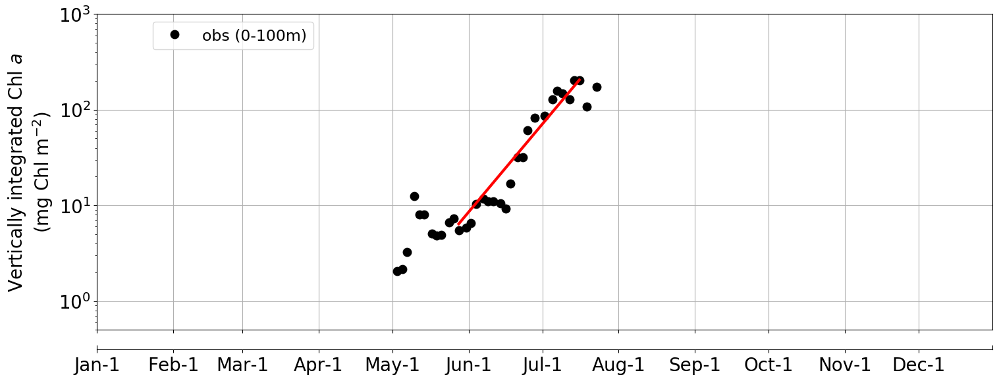

In [225]:
with plt.style.context('validation.mplstyle'):
    locs=np.array([0, 31, 59, 90, 120, 151,
                   181, 212, 243, 273, 304, 334])
    labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
            'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')

    fig,axs=plt.subplots(2,1,sharex=False,figsize=(16, 6))

    # --- CHLOROPHYLL A
    ax=axs[0]
    h1=ax.plot(first_year,array1d_iT_obsvintchlHPLC,
               'o',color='black',label='obs (0-100m)')
    ax.set_yscale('log')
    ax.set_xlim(first_year[0],first_year[-1])
    xlims=ax.get_xlim()
    ax.set_xticks(locs)
    ax.set_xticklabels([])
    ax.set_ylabel('Vertically integrated Chl $a$\n(mg Chl $\mathrm{ m^{-2} }$)')
    ax.set_ylim(0.5,1E3)
    ax.grid()
    ax.legend(bbox_to_anchor=(0.25,1.00))
    # add slope between initiation and peak
    y=2016
    tI=blooms_df.loc[y,['tI']]
    cI=blooms_df.loc[y,['cI']]
    tP=blooms_df.loc[y,['tP']]
    cP=blooms_df.loc[y,['cP']]
    x=[tI-1,tP-1] # doy (1-based) -> doy (0-based)
    y=[cI,cP]
    h2=ax.plot(x,y,color='red',lw=3)

    # --- ADDITIONAL X-AXIS
    ax=axs[1]
    ax.set_xlim(xlims)
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    ax.axes.get_yaxis().set_visible(False)
    ax.spines['top'].set_visible(False)

    # --- POSITION
    axs[0].set_position( [0.10,0.15  ,0.85,.80])
    axs[1].set_position( [0.10,0.10  ,0.85,.01])

    # --- SAVE
    plt.savefig('validation/GEic2016.vint100m.logchl.m_from2points.png')

### m: Slope of the linear regression of the points between I and P

In [226]:
obsvintchl_df=pd.DataFrame(data={'iT':first_year,
                                'obsvintchl':array1d_iT_obsvintchlHPLC})
# obsvintchl_df

In [227]:
obsvintchl_df=obsvintchl_df[obsvintchl_df.obsvintchl.notna()]
# obsvintchl_df

In [228]:
y=2016
tI=blooms_df.loc[y,['tI']].item()-1 # doy (1-based) -> doy (0-based)
tP=blooms_df.loc[y,['tP']].item()-1 # doy (1-based) -> doy (0-based)

Points after bloom initiation and before bloom peak

In [229]:
initiation_df=obsvintchl_df[(obsvintchl_df.iT>=tI)&(obsvintchl_df.iT<=tP)]
# initiation_df

Points before bloom initiation and after bloom peak.
Those points were note used for the linear regression.

In [230]:
out_df=obsvintchl_df[(obsvintchl_df.iT<tI)|(obsvintchl_df.iT>tP)]
# out_df

In [231]:
loginitiation_df=pd.DataFrame(data={'iT':
                                    initiation_df.iT,
                                    'obsvintlogchl':
                                    np.log10(initiation_df.obsvintchl)})
# loginitiation_df

In [232]:
olsres=smf.ols('obsvintlogchl~iT',data=loginitiation_df).fit()
# olsres.params

In [233]:
# olsres.summary()

In [234]:
m_fromlm=olsres.params.iT
# m_fromlm

In [235]:
blooms_df.loc[2016,['m_fromlm']]=m_fromlm
blooms_df

,tI,cI,tP,cP,m_from2points,m_fromlm
2016,148.0,6.412509,197.0,204.442581,0.030685,0.035786


In [236]:
outfile='../../obs/GEic2016_ti_ci_tp_cp_m.csv'
blooms_df.to_csv(outfile,index=False)

To draw the line representing $m$.

In [237]:
xnew=[tI,tP]
ynew=olsres.predict(pd.DataFrame({'iT':xnew}))
ynew=np.power(10,ynew)
# ynew

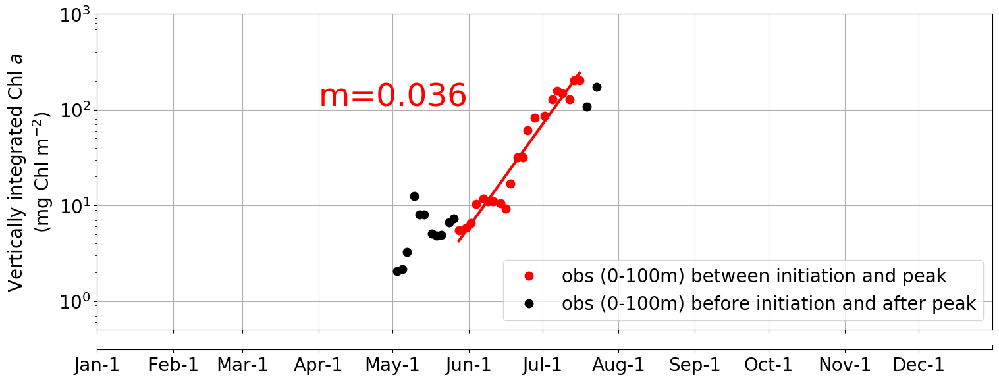

In [238]:
def make_plots(ax):
    locs=np.array([0, 31, 59, 90, 120, 151,
                   181, 212, 243, 273, 304, 334])
    labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
            'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')

    # --- CHLOROPHYLL A
    ax=axs[0]
    h1=ax.plot(np.array(initiation_df.iT),
               np.array(initiation_df.obsvintchl),
               'o',color='red',
               label='obs (0-100m) between initiation and peak')
    ax.set_yscale('log')
    ax.set_xlim(first_year[0],first_year[-1])
    xlims=ax.get_xlim()
    ax.set_xticks(locs)
    ax.set_xticklabels([])
    ax.set_ylabel('Vertically integrated Chl $a$\n(mg Chl $\mathrm{ m^{-2} }$)')
    ax.set_ylim(0.5,1E3)
    ax.grid()
    # add slope between initiation and peak
    h2=ax.plot(xnew,np.array(ynew),'-',color='red',lw=3)
    h3=ax.plot(np.array(out_df.iT),
              np.array(out_df.obsvintchl),
              'o',color='black',
              label='obs (0-100m) before initiation and after peak')
    ax.legend(loc='lower right',fontsize=20)
    ax.text(90,110,'m={0:.3f}'.format(m_fromlm),color='red',
           fontsize=35)

    # --- ADDITIONAL X-AXIS
    ax=axs[1]
    ax.set_xlim(xlims)
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    ax.axes.get_yaxis().set_visible(False)
    ax.spines['top'].set_visible(False)
    
    # --- POSITION
    axs[0].set_position( [0.10,0.15  ,0.85,.80])
    axs[1].set_position( [0.10,0.10  ,0.85,.01])

with plt.style.context('validation.mplstyle'):  
    # Plot
    fig,axs=plt.subplots(2,1,figsize=(16, 6))
    make_plots(axs)

    # --- SAVE
    plt.savefig('validation/GEic2016.vint100m.logchl.m_fromlm.png')

### Model chlorophyll $a$ (0-100m): bloom peak

The bloom peak period is the period starting at the first local maximum and ending at the general maximum.
It can be one day if the first local maximum is also the general maximum or an interval of days.

In [239]:
first_local_maximum_date=scipy.signal.argrelextrema(array1d_iT_modvintchl,
                                                    np.greater)[0][0]
year=2016
first_local_maximum_dates=datetime.datetime(year,1,1)\
+ datetime.timedelta(first_local_maximum_date.item())
print('The date of the first local maximum is '\
      + first_local_maximum_dates.strftime("%B %d"))

The date of the first local maximum is July 22


In [240]:
first_local_maximum_value=array1d_iT_modvintchl[first_local_maximum_date]

In [241]:
general_maximum_date=np.nanargmax(array1d_iT_modvintchl)
year=2016
general_maximum_dates=datetime.datetime(year,1,1)\
+ datetime.timedelta(general_maximum_date.item())
print('The date of the general maximum is '\
      + general_maximum_dates.strftime("%B %d"))

The date of the general maximum is July 22


In [242]:
general_maximum_value=array1d_iT_modvintchl[general_maximum_date]

In [243]:
print('The bloom peak period is from: ' \
      + first_local_maximum_dates.strftime("%B %d") \
      + ' to '\
      + general_maximum_dates.strftime("%B %d"))
    

The bloom peak period is from: July 22 to July 22


(in $mg\ Chl\ m^{-2}$)

In [244]:
first_local_maximum_value

49.27669118758196

In [245]:
general_maximum_value

49.27669118758196

### Model biomass (0-100m): bloom peak

In [246]:
peak=np.nanargmax(array1d_iT_modphytobio)
peak=peak.item()
year=2016
# transform day of year into date
# https://stackoverflow.com/questions/2427555/python-question-year-and-day-of-year-to-date
# see answer of Ignacio Vazquez-Abrams
peaks=datetime.datetime(year,1,1) + datetime.timedelta(peak)

Day of year

In [247]:
peak+1

204

In [248]:
peaks.strftime("%B %d")

'July 22'

# Model: quickly visualize any variable over all years

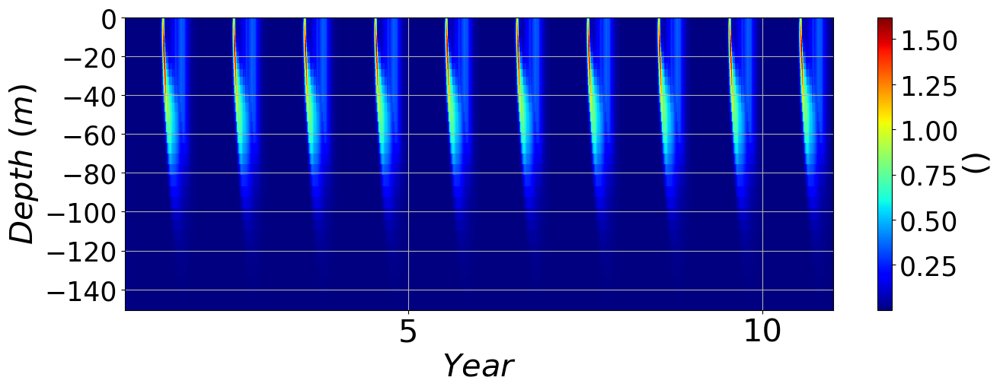

In [249]:
with plt.style.context('noice.mplstyle'):
    nbyr=len(years)
    array1d_iT_iTforplot=np.arange(1,365*nbyr+1)
    array1d_iT_iTforpcolormesh=np.arange(1,365*nbyr+2)
    locs=list()
    labels=range(5,nbyr+1,5)
    for year in labels:
        loc=1+365*(year-1)
        locs.append(loc)

    RF_above151=RF[RF>-151]

    plt.figure(figsize=(15,5))

    plt.pcolormesh(array1d_iT_iTforpcolormesh,
                   RF_above151,
                   array2d_idepth_iT_modchlfull[0:(RF_above151.size)-1,
                                                0:(365*nbyr)],
                   cmap='jet'
                  )
    plt.xlabel('$Year$')
    plt.xticks(locs,labels)
    plt.ylabel('$Depth\ (m)$')
    plt.grid(True)
    cbar=plt.colorbar()
    cbar.set_label('$()$')

# Model: quickly visualize any variable over one year

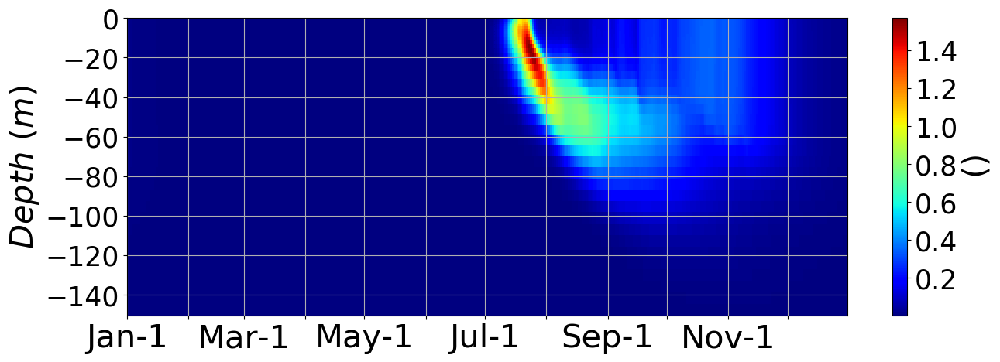

In [250]:
with plt.style.context('noice.mplstyle'):
    locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
    labels=('Jan-1','','Mar-1','','May-1','',
            'Jul-1','','Sep-1','','Nov-1','')

    RF_above151=RF[RF>-151]

    plt.figure(figsize=(15,5))
    ax = plt.gca()
    h=ax.pcolormesh(first_year366,
                  RF_above151,
                  array2d_idepth_iT_modchlfull[0:(RF_above151.size)-1,array1d_iT1y_iT],
                  cmap='jet'
                  )
    ax.set_xticklabels([])
    ax.set_ylabel('$Depth\ (m)$')
    ax.set_xlim(first_year366[0],first_year[-1])
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    cbar=plt.colorbar(h)
    cbar.set_label('$()$')

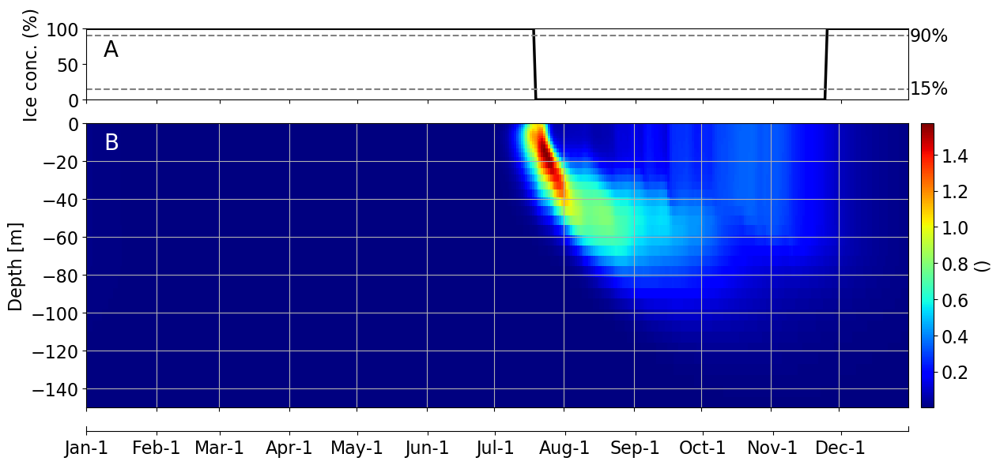

In [251]:
locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
        'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')
RF_above151=RF[RF>-151]

fig,axs=plt.subplots(3,1,sharex=False,figsize=(16, 6))

# --- ICE CONCENTRATIONS
ax=axs[0]
ax.plot(first_year,ice*100,'k-',lw=2.5)
ax.set_xlim(first_year[0],first_year[-1])
xlims=ax.get_xlim()
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Ice conc. (%)')
ax.set_ylim(0,100)
ax.plot(xlims,[15,15],'k--',color='gray')
ax.plot(xlims,[90,90],'k--',color='gray')
ax.text(xlims[1]+.5,15,'15%',verticalalignment='center')
ax.text(xlims[1]+.5,90,'90%',verticalalignment='center')
plt.text(0.03,0.7,'A',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# --- CHLOROPHYLL A
ax=axs[1]
h=ax.pcolormesh(first_year366,
                RF_above151,
                array2d_idepth_iT_modchlfull[0:(RF_above151.size)-1,array1d_iT1y_iT],
                cmap='jet')
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Depth [m]')
ax.set_ylim(-150,0)
# adding the colorbar
cbaxes = fig.add_axes([0.78, 0.15, 0.01, 0.60])
cb = plt.colorbar(h,
                  cax = cbaxes)
cb.set_label('$()$')
ax.grid()
plt.text(0.03,0.93,'B',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20, color='white')

# --- ADDITIONAL X-AXIS
ax=axs[2]
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels(labels)
ax.axes.get_yaxis().set_visible(False)
ax.spines['top'].set_visible(False)

# --- POSITION
axs[0].set_position( [0.12,0.80  ,0.65,.15])
axs[1].set_position( [0.12,0.15  ,0.65,.60])
axs[2].set_position( [0.12,0.10  ,0.65,.01])

# Nitrate

## Model nitrate

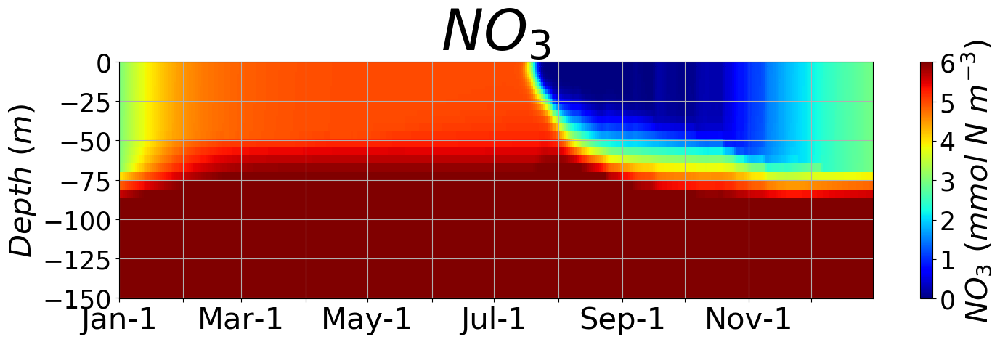

In [252]:
with plt.style.context('noice.mplstyle'):
    first_year366=np.arange(0,366) # first year for heatmaps
    locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
    labels=('Jan-1','','Mar-1','','May-1','',
            'Jul-1','','Sep-1','','Nov-1','')
    RF_above151=RF[RF>-151]

    plt.figure(figsize=(15,5))
    ax = plt.gca()
    h=ax.pcolormesh(first_year366,
                    RF_above151,
                    array2d_idepth_iT_modno3full[0:(RF_above151.size)-1,array1d_iT1y_iT],
                    cmap='jet',
                    vmin=0,
                    vmax=6
                  )
    ax.set_title('$NO_3$')
    ax.set_xticklabels([])
    ax.set_ylabel('$Depth\ (m)$')
    ax.set_xlim(first_year366[0],first_year[-1])
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    cbar=plt.colorbar(h)
    cbar.set_label('$NO_3\ (mmol\ N\ m^{-3})$')
    plt.tight_layout()
    plt.savefig('car.0000000000.t001.lastyear.n.NO3.png')

## Model nitrate: on grid for the observations

The nitrate values at -0.51 m on the model grid are extrapolated to 0 m. It is the only extrapolation.

In [253]:
array2d_iRC_iT_no3mod=array2d_idepth_iT_modno3full[:,array1d_iT1y_iT]
array1d_iobs_no3mod=list()
for iobs,row in nutrients_df.iterrows():
    doy=row['doy']
    depthobs=row['depth']
    assert depthobs<=0, \
    "depthobs is positive: %r" %(depthobs)
    assert depthobs>RC[-1], \
    "depthobs %r is below maximal depth of model grid %r" %(depthobs,RC[-1])
    y_interp=scipy.interpolate.interp1d(
        RC,
        array2d_iRC_iT_no3mod[:,doy-1].flatten(),
        bounds_error=False,
        fill_value="extrapolate"
    )
    no3mod=y_interp(depthobs).item()
    array1d_iobs_no3mod.append(no3mod)
no3mod_df=pd.DataFrame({
    'depth':nutrients_df['depth'],
    'no3mod':array1d_iobs_no3mod,
    'doy':nutrients_df['doy']
})

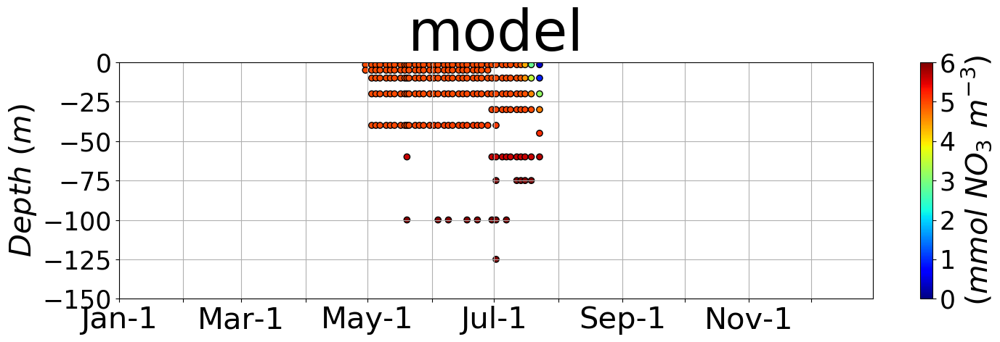

In [254]:
with plt.style.context('noice.mplstyle'):
    locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
    labels=('Jan-1','','Mar-1','','May-1','',
            'Jul-1','','Sep-1','','Nov-1','')

    plt.figure(figsize=(15,5))
    ax = plt.gca()
    hc=ax.scatter(no3mod_df['doy']-1,
                  no3mod_df['depth'],
                  c=no3mod_df['no3mod'],
                  cmap='jet',
                  vmin=0,
                  vmax=6,
                  s=None,
                  edgecolor='k'
                 )
    ax.set_title('model')
    ax.set_xticklabels([])
    ax.set_ylabel('$Depth\ (m)$')
    ax.set_xlim(first_year[0],first_year[-1])
    ax.set_ylim(-150,0)
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    cbar=plt.colorbar(hc)
    cbar.set_label('$(mmol\ NO_3\ m^{-3})$')
    plt.tight_layout()
    plt.savefig('car.0000000000.t001.lastyear.n.NO3.obsgrid.png')

## Comparison between observations and model: nitrate

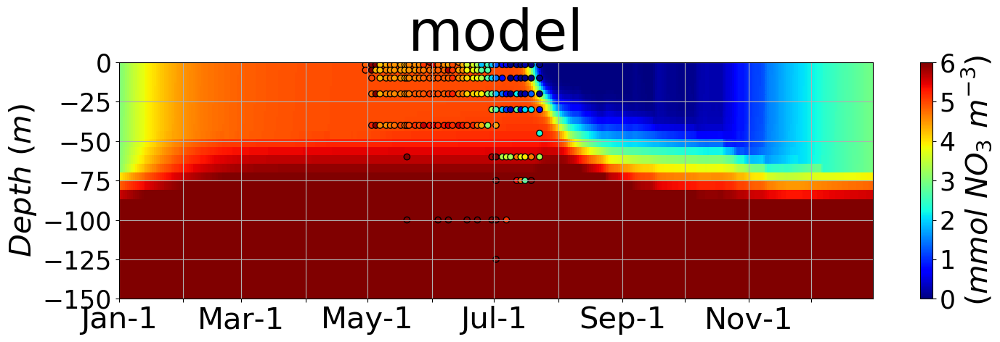

In [255]:
with plt.style.context('noice.mplstyle'):
    locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
    labels=('Jan-1','','Mar-1','','May-1','',
            'Jul-1','','Sep-1','','Nov-1','')

    RF_above151=RF[RF>-151]

    plt.figure(figsize=(15,5))
    ax = plt.gca()
    h=ax.pcolormesh(first_year366,
                  RF_above151,
                  array2d_idepth_iT_modno3full[0:(RF_above151.size)-1,array1d_iT1y_iT],
                  cmap='jet',
                    vmin=0,
                    vmax=6
                  )
    hc=ax.scatter(nutrients_df['doy']-1,
                  nutrients_df['depth'],
                  c=nutrients_df['no3'],
                  cmap='jet',
                  vmin=0,
                  vmax=6,
                  s=None,
                  edgecolor='k'
                 )
    ax.set_title('model')
    ax.set_xticklabels([])
    ax.set_ylabel('$Depth\ (m)$')
    ax.set_xlim(first_year366[0],first_year[-1])
    ax.set_ylim(-150,0)
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    cbar=plt.colorbar(h)
    cbar.set_label('$(mmol\ NO_3\ m^{-3})$')
    plt.tight_layout()
    plt.savefig('validation/GEic2016.comp.m3.NO3.png')

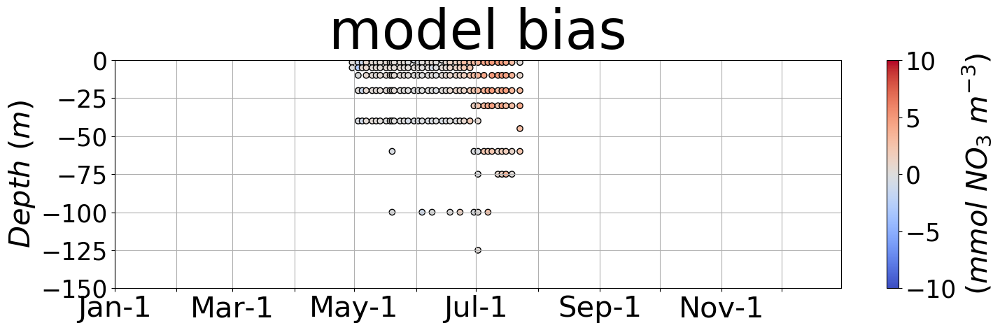

In [256]:
assert no3mod_df['doy'].equals(nutrients_df['doy']), \
"column doy in no3mod_df is different from column doy in nutrients_df"
assert no3mod_df['depth'].equals(nutrients_df['depth']), \
"column depth in no3mod_df is different from column depth in nutrients_df"
with plt.style.context('noice.mplstyle'):
    locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
    labels=('Jan-1','','Mar-1','','May-1','',
            'Jul-1','','Sep-1','','Nov-1','')

    plt.figure(figsize=(15,5))
    ax = plt.gca()
    hc=ax.scatter(no3mod_df['doy']-1,
                  no3mod_df['depth'],
                  c=no3mod_df['no3mod']-nutrients_df['no3'],
                  cmap='coolwarm',
                  vmin=-10,
                  vmax=10,
                  s=None,
                  edgecolor='k'
                 )
    ax.set_title('model bias')
    ax.set_xticklabels([])
    ax.set_ylabel('$Depth\ (m)$')
    ax.set_xlim(first_year[0],first_year[-1])
    ax.set_ylim(-150,0)
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    cbar=plt.colorbar(hc)
    cbar.set_label('$(mmol\ NO_3\ m^{-3})$')
    plt.tight_layout()
    plt.savefig('validation/GEic2016.bias.m3.NO3.png')

## Comparison between observations and model: mean nitrate (0-40m)

In [257]:
array1d_it_modmeanno3full \
=vstats.mean(array2d_idepth_iT_tracer=array2d_idepth_iT_modno3full,
             array1d_idepth_delR=drF,
             depth_end=-40
            )
array1d_iT_modmeanno3=array1d_it_modmeanno3full[array1d_iT1y_iT]

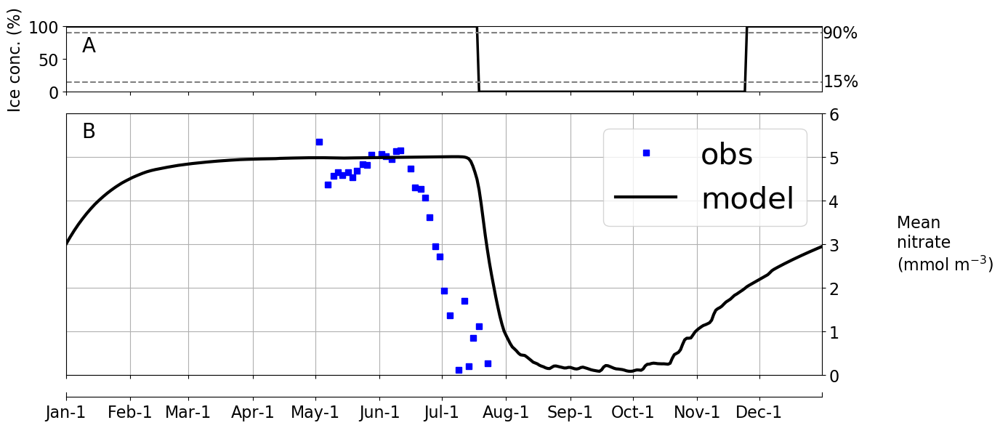

In [258]:
locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
        'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')

fig,axs=plt.subplots(3,1,sharex=False,figsize=(16, 6))

# --- ICE CONCENTRATIONS
ax=axs[0]
ax.plot(first_year,ice*100,'k-',lw=2.5)
ax.set_xlim(first_year[0],first_year[-1])
xlims=ax.get_xlim()
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Ice conc. (%)')
ax.set_ylim(0,100)
ax.plot(xlims,[15,15],'k--',color='gray')
ax.plot(xlims,[90,90],'k--',color='gray')
ax.text(xlims[1]+.5,15,'15%',verticalalignment='center')
ax.text(xlims[1]+.5,90,'90%',verticalalignment='center')
plt.text(0.03,0.7,'A',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# --- NITRATE
ax=axs[1]
h1=ax.plot(first_year,
           array1d_iT_obsmeanno3,
           's',
           color='blue',
           label='obs')
h2=ax.plot(first_year,
           array1d_iT_modmeanno3,
           '-',
           lw=3,
           color='black',
           label='model')
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.yaxis.tick_right()
ax.set_ylim(0,6)
ax.legend(fontsize=30)
ax.grid()

ax.text(400,3,'Mean \nnitrate\n(mmol m$^{-3}$)',
        horizontalalignment = 'left',
        verticalalignment = 'center')
plt.text(0.03,0.93,'B',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# --- ADDITIONAL X-AXIS
ax=axs[2]
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels(labels)
ax.axes.get_yaxis().set_visible(False)
ax.spines['top'].set_visible(False)

# --- POSITION
axs[0].set_position( [0.12,0.80  ,0.65,.15])
axs[1].set_position( [0.12,0.15  ,0.65,.60])
axs[2].set_position( [0.12,0.10  ,0.65,.01])

# --- SAVE
plt.savefig('validation/GEic2016.comp.mean.NO3.png')

# Silicic acid

## Model silicic acid

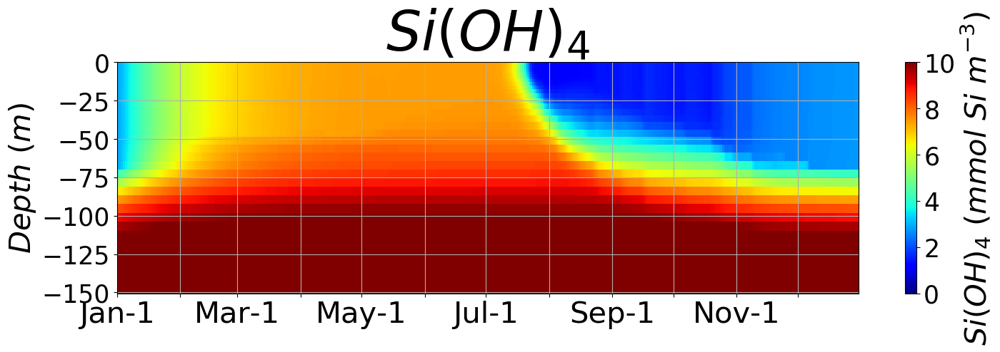

In [259]:
with plt.style.context('noice.mplstyle'):
    first_year366=np.arange(0,366) # first year for heatmaps
    locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
    labels=('Jan-1','','Mar-1','','May-1','',
            'Jul-1','','Sep-1','','Nov-1','')
    RF_above151=RF[RF>-151]

    plt.figure(figsize=(15,5))
    ax = plt.gca()
    h=ax.pcolormesh(first_year366,
                    RF_above151,
                    array2d_idepth_iT_modsioh4full[0:(RF_above151.size)-1,array1d_iT1y_iT],
                    cmap='jet',
                    vmin=0,
                    vmax=10
                  )
    ax.set_title('$Si{(OH)}_4$')
    ax.set_xticklabels([])
    ax.set_ylabel('$Depth\ (m)$')
    ax.set_xlim(first_year366[0],first_year[-1])
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    cbar=plt.colorbar(h)
    cbar.set_label('$Si{(OH)}_4\ (mmol\ Si\ m^{-3})$')
    plt.tight_layout()
    plt.savefig('car.0000000000.t001.lastyear.si.SiOH4.png')

## Model silicic acid: on grid for the observations

The silicic acid values at -0.51 m on the model grid are extrapolated to 0 m. It is the only extrapolation.

In [260]:
array2d_iRC_iT_sioh4mod=array2d_idepth_iT_modsioh4full[:,array1d_iT1y_iT]
array1d_iobs_sioh4mod=list()
for iobs,row in nutrients_df.iterrows():
    doy=row['doy']
    depthobs=row['depth']
    assert depthobs<=0, \
    "depthobs is positive: %r" %(depthobs)
    assert depthobs>RC[-1], \
    "depthobs %r is below maximal depth of model grid %r" %(depthobs,RC[-1])
    y_interp=scipy.interpolate.interp1d(
        RC,
        array2d_iRC_iT_sioh4mod[:,doy-1].flatten(),
        bounds_error=False,
        fill_value="extrapolate"
    )
    sioh4mod=y_interp(depthobs).item()
    array1d_iobs_sioh4mod.append(sioh4mod)
sioh4mod_df=pd.DataFrame({
    'depth':nutrients_df['depth'],
    'sioh4mod':array1d_iobs_sioh4mod,
    'doy':nutrients_df['doy']
})

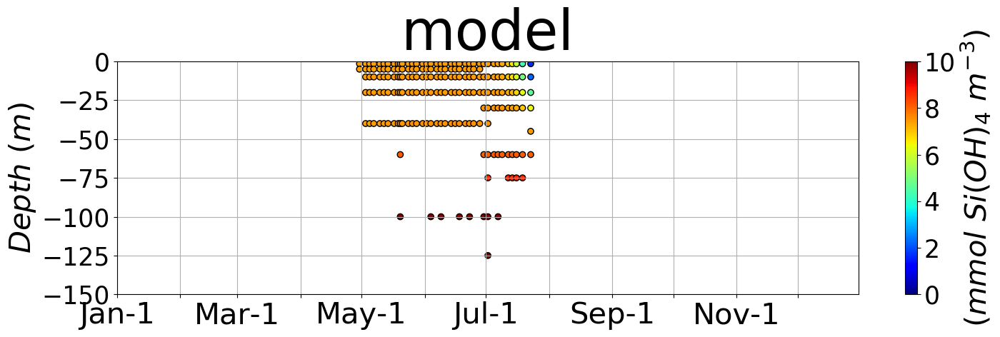

In [261]:
with plt.style.context('noice.mplstyle'):
    locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
    labels=('Jan-1','','Mar-1','','May-1','',
            'Jul-1','','Sep-1','','Nov-1','')

    plt.figure(figsize=(15,5))
    ax = plt.gca()
    hc=ax.scatter(sioh4mod_df['doy']-1,
                  sioh4mod_df['depth'],
                  c=sioh4mod_df['sioh4mod'],
                  cmap='jet',
                  vmin=0,
                  vmax=10,
                  s=None,
                  edgecolor='k'
                 )
    ax.set_title('model')
    ax.set_xticklabels([])
    ax.set_ylabel('$Depth\ (m)$')
    ax.set_xlim(first_year[0],first_year[-1])
    ax.set_ylim(-150,0)
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    cbar=plt.colorbar(hc)
    cbar.set_label('$(mmol\ Si{(OH)}_4\ m^{-3})$')
    plt.tight_layout()
    plt.savefig('car.0000000000.t001.lastyear.n.SiOH4.obsgrid.png')

## Comparison between observations and model: silicic acid

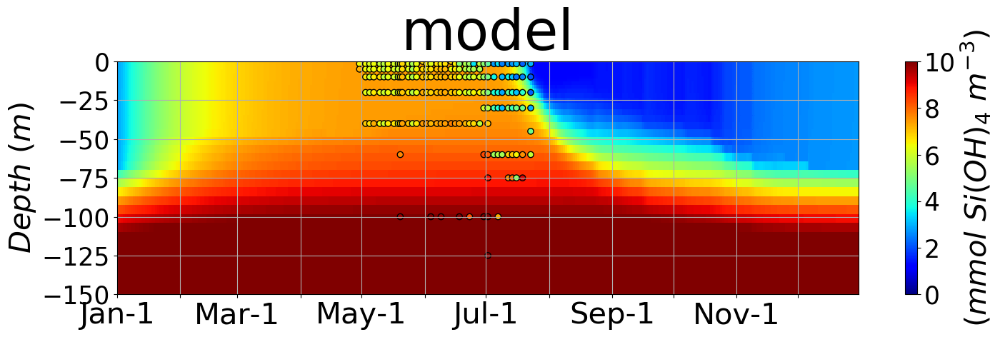

In [262]:
with plt.style.context('noice.mplstyle'):
    locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
    labels=('Jan-1','','Mar-1','','May-1','',
            'Jul-1','','Sep-1','','Nov-1','')

    RF_above151=RF[RF>-151]

    plt.figure(figsize=(15,5))
    ax = plt.gca()
    h=ax.pcolormesh(first_year366,
                  RF_above151,
                  array2d_idepth_iT_modsioh4full[0:(RF_above151.size)-1,array1d_iT1y_iT],
                  cmap='jet',
                    vmin=0,
                    vmax=10
                  )
    hc=ax.scatter(nutrients_df['doy']-1,
                  nutrients_df['depth'],
                  c=nutrients_df['sioh4'],
                  cmap='jet',
                  vmin=0,
                  vmax=10,
                  s=None,
                  edgecolor='k'
                 )
    ax.set_title('model')
    ax.set_xticklabels([])
    ax.set_ylabel('$Depth\ (m)$')
    ax.set_xlim(first_year366[0],first_year[-1])
    ax.set_ylim(-150,0)
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    cbar=plt.colorbar(h)
    cbar.set_label('$(mmol\ Si{(OH)}_4\ m^{-3})$')
    plt.tight_layout()
    plt.savefig('validation/GEic2016.comp.m3.SiOH4.png')

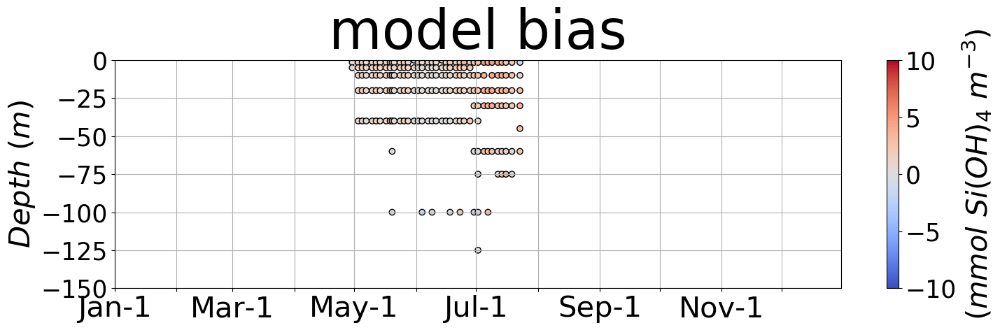

In [263]:
assert sioh4mod_df['doy'].equals(nutrients_df['doy']), \
"column doy in sioh4mod_df is different from column doy in nutrients_df"
assert sioh4mod_df['depth'].equals(nutrients_df['depth']), \
"column depth in sioh4mod_df is different from column depth in nutrients_df"
with plt.style.context('noice.mplstyle'):
    locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
    labels=('Jan-1','','Mar-1','','May-1','',
            'Jul-1','','Sep-1','','Nov-1','')

    plt.figure(figsize=(15,5))
    ax = plt.gca()
    hc=ax.scatter(sioh4mod_df['doy']-1,
                  sioh4mod_df['depth'],
                  c=sioh4mod_df['sioh4mod']-nutrients_df['sioh4'],
                  cmap='coolwarm',
                  vmin=-10,
                  vmax=10,
                  s=None,
                  edgecolor='k'
                 )
    ax.set_title('model bias')
    ax.set_xticklabels([])
    ax.set_ylabel('$Depth\ (m)$')
    ax.set_xlim(first_year[0],first_year[-1])
    ax.set_ylim(-150,0)
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    cbar=plt.colorbar(hc)
    cbar.set_label('$(mmol\ Si{(OH)}_4\ m^{-3})$')
    plt.tight_layout()
    plt.savefig('validation/GEic2016.bias.m3.SiOH4.png')

## Comparison between observations and model: mean silicic acid (0-40m)

In [264]:
array1d_it_modmeansioh4full \
=vstats.mean(array2d_idepth_iT_tracer=array2d_idepth_iT_modsioh4full,
             array1d_idepth_delR=drF,
             depth_end=-40
            )
array1d_iT_modmeansioh4=array1d_it_modmeansioh4full[array1d_iT1y_iT]

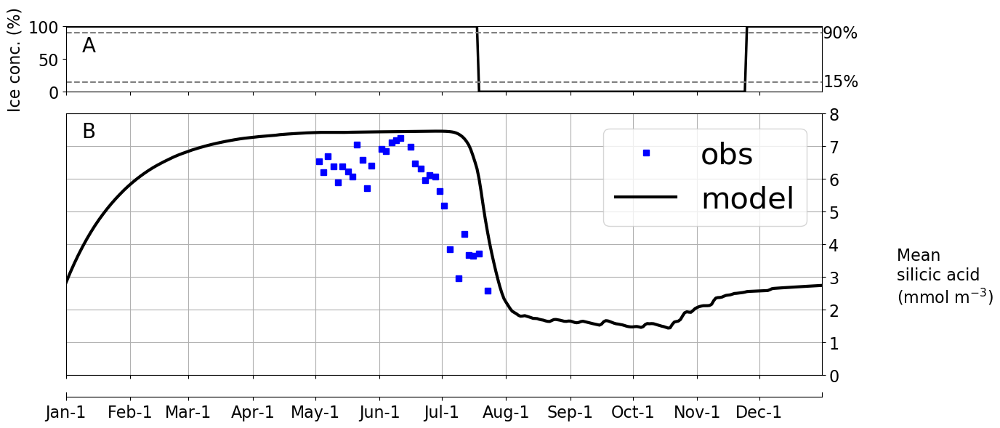

In [265]:
locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
        'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')

fig,axs=plt.subplots(3,1,sharex=False,figsize=(16, 6))

# --- ICE CONCENTRATIONS
ax=axs[0]
ax.plot(first_year,ice*100,'k-',lw=2.5)
ax.set_xlim(first_year[0],first_year[-1])
xlims=ax.get_xlim()
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Ice conc. (%)')
ax.set_ylim(0,100)
ax.plot(xlims,[15,15],'k--',color='gray')
ax.plot(xlims,[90,90],'k--',color='gray')
ax.text(xlims[1]+.5,15,'15%',verticalalignment='center')
ax.text(xlims[1]+.5,90,'90%',verticalalignment='center')
plt.text(0.03,0.7,'A',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# --- SILICIC ACID
ax=axs[1]
h1=ax.plot(first_year,
           array1d_iT_obsmeansioh4,
           's',
           color='blue',
           label='obs')
h2=ax.plot(first_year,
           array1d_iT_modmeansioh4,
           '-',
           lw=3,
           color='black',
           label='model')
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.yaxis.tick_right()
ax.set_ylim(0,8)
ax.legend(fontsize=30)
ax.grid()

ax.text(400,3,'Mean \nsilicic acid\n(mmol m$^{-3}$)',
        horizontalalignment = 'left',
        verticalalignment = 'center')
plt.text(0.03,0.93,'B',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# --- ADDITIONAL X-AXIS
ax=axs[2]
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels(labels)
ax.axes.get_yaxis().set_visible(False)
ax.spines['top'].set_visible(False)

# --- POSITION
axs[0].set_position( [0.12,0.80  ,0.65,.15])
axs[1].set_position( [0.12,0.15  ,0.65,.60])
axs[2].set_position( [0.12,0.10  ,0.65,.01])

# --- SAVE
plt.savefig('validation/GEic2016.comp.mean.SiOH4.png')

# Phosphate

## Model phosphate

In [266]:
carfile='car.0000000000.t001.nc'
array2d_idepth_iT_modpo4full=netcdf_tools.read_netcdf(carfile, 'TRAC05').squeeze().transpose()

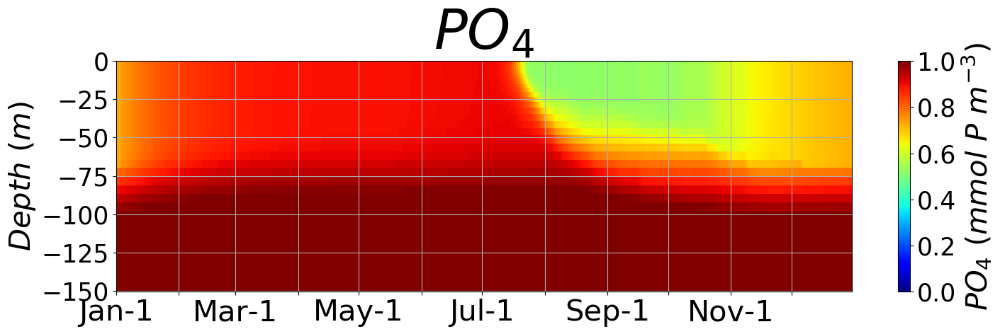

In [267]:
with plt.style.context('noice.mplstyle'):
    first_year366=np.arange(0,366) # first year for heatmaps
    locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
    labels=('Jan-1','','Mar-1','','May-1','',
            'Jul-1','','Sep-1','','Nov-1','')
    RF_above151=RF[RF>-151]

    plt.figure(figsize=(15,5))
    ax = plt.gca()
    h=ax.pcolormesh(first_year366,
                    RF_above151,
                    array2d_idepth_iT_modpo4full[0:(RF_above151.size)-1,array1d_iT1y_iT],
                    cmap='jet',
                    vmin=0,
                    vmax=1
                  )
    ax.set_title('$PO_4$')
    ax.set_xticklabels([])
    ax.set_ylabel('$Depth\ (m)$')
    ax.set_xlim(first_year366[0],first_year[-1])
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    cbar=plt.colorbar(h)
    cbar.set_label('$PO_4\ (mmol\ P\ m^{-3})$')
    plt.tight_layout()
    plt.savefig('car.0000000000.t001.lastyear.p.PO4.png')

## Model phosphate: on grid for the observations

The phosphate values at -0.51 m on the model grid are extrapolated to 0 m. It is the only extrapolation.

In [268]:
array2d_iRC_iT_po4mod=array2d_idepth_iT_modpo4full[:,array1d_iT1y_iT]
array1d_iobs_po4mod=list()
for iobs,row in nutrients_df.iterrows():
    doy=row['doy']
    depthobs=row['depth']
    assert depthobs<=0, \
    "depthobs is positive: %r" %(depthobs)
    assert depthobs>RC[-1], \
    "depthobs %r is below maximal depth of model grid %r" %(depthobs,RC[-1])
    y_interp=scipy.interpolate.interp1d(
        RC,
        array2d_iRC_iT_po4mod[:,doy-1].flatten(),
        bounds_error=False,
        fill_value="extrapolate"
    )
    po4mod=y_interp(depthobs).item()
    array1d_iobs_po4mod.append(po4mod)
po4mod_df=pd.DataFrame({
    'depth':nutrients_df['depth'],
    'po4mod':array1d_iobs_po4mod,
    'doy':nutrients_df['doy']
})

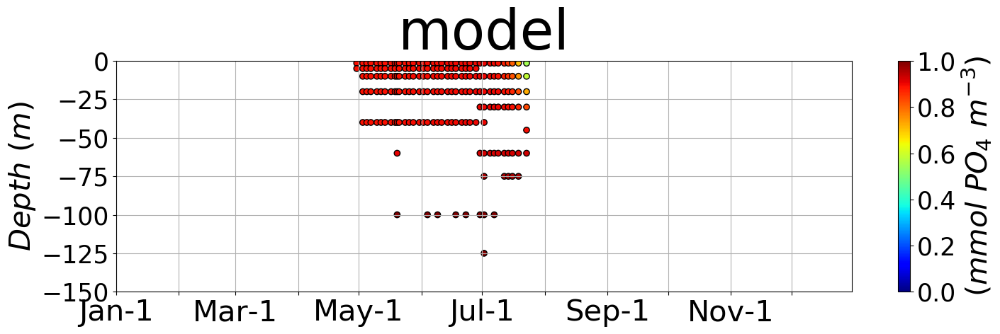

In [269]:
with plt.style.context('noice.mplstyle'):
    locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
    labels=('Jan-1','','Mar-1','','May-1','',
            'Jul-1','','Sep-1','','Nov-1','')

    plt.figure(figsize=(15,5))
    ax = plt.gca()
    hc=ax.scatter(po4mod_df['doy']-1,
                  po4mod_df['depth'],
                  c=po4mod_df['po4mod'],
                  cmap='jet',
                  vmin=0,
                  vmax=1,
                  s=None,
                  edgecolor='k'
                 )
    ax.set_title('model')
    ax.set_xticklabels([])
    ax.set_ylabel('$Depth\ (m)$')
    ax.set_xlim(first_year[0],first_year[-1])
    ax.set_ylim(-150,0)
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    cbar=plt.colorbar(hc)
    cbar.set_label('$(mmol\ PO_4\ m^{-3})$')
    plt.tight_layout()
    plt.savefig('car.0000000000.t001.lastyear.n.PO4.obsgrid.png')

## Comparison between observations and model: phosphate

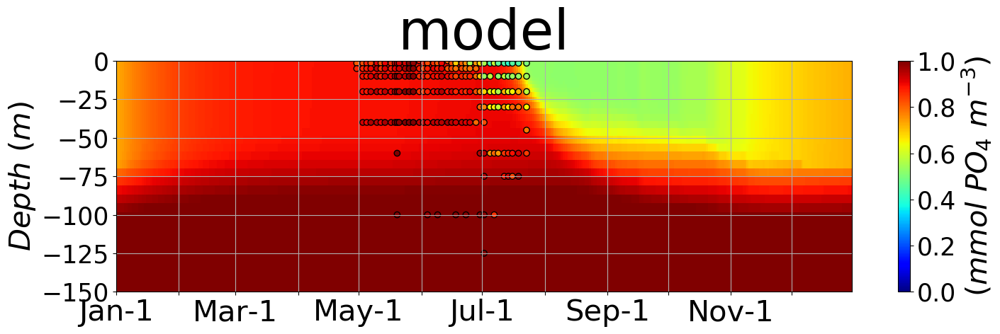

In [270]:
with plt.style.context('noice.mplstyle'):
    locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
    labels=('Jan-1','','Mar-1','','May-1','',
            'Jul-1','','Sep-1','','Nov-1','')

    RF_above151=RF[RF>-151]

    plt.figure(figsize=(15,5))
    ax = plt.gca()
    h=ax.pcolormesh(first_year366,
                  RF_above151,
                  array2d_idepth_iT_modpo4full[0:(RF_above151.size)-1,array1d_iT1y_iT],
                  cmap='jet',
                    vmin=0,
                    vmax=1
                  )
    hc=ax.scatter(nutrients_df['doy']-1,
                  nutrients_df['depth'],
                  c=nutrients_df['po4'],
                  cmap='jet',
                  vmin=0,
                  vmax=1,
                  s=None,
                  edgecolor='k'
                 )
    ax.set_title('model')
    ax.set_xticklabels([])
    ax.set_ylabel('$Depth\ (m)$')
    ax.set_xlim(first_year366[0],first_year[-1])
    ax.set_ylim(-150,0)
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    cbar=plt.colorbar(h)
    cbar.set_label('$(mmol\ PO_4\ m^{-3})$')
    plt.tight_layout()
    plt.savefig('validation/GEic2016.comp.m3.PO4.png')

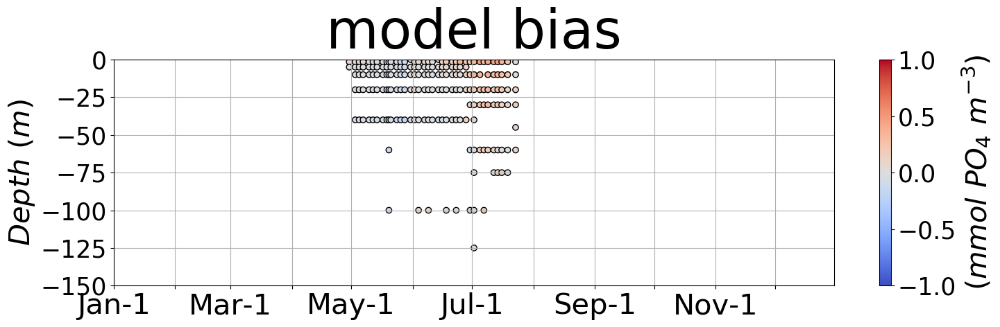

In [271]:
assert po4mod_df['doy'].equals(nutrients_df['doy']), \
"column doy in po4mod_df is different from column doy in nutrients_df"
assert po4mod_df['depth'].equals(nutrients_df['depth']), \
"column depth in po4mod_df is different from column depth in nutrients_df"
with plt.style.context('noice.mplstyle'):
    locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
    labels=('Jan-1','','Mar-1','','May-1','',
            'Jul-1','','Sep-1','','Nov-1','')

    plt.figure(figsize=(15,5))
    ax = plt.gca()
    hc=ax.scatter(po4mod_df['doy']-1,
                  po4mod_df['depth'],
                  c=po4mod_df['po4mod']-nutrients_df['po4'],
                  cmap='coolwarm',
                  vmin=-1,
                  vmax=1,
                  s=None,
                  edgecolor='k'
                 )
    ax.set_title('model bias')
    ax.set_xticklabels([])
    ax.set_ylabel('$Depth\ (m)$')
    ax.set_xlim(first_year[0],first_year[-1])
    ax.set_ylim(-150,0)
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    cbar=plt.colorbar(hc)
    cbar.set_label('$(mmol\ {PO}_4\ m^{-3})$')
    plt.tight_layout()
    plt.savefig('validation/GEic2016.bias.m3.PO4.png')

## Comparison between observations and model: mean phosphate (0-40m)

In [272]:
array1d_it_modmeanpo4full \
=vstats.mean(array2d_idepth_iT_tracer=array2d_idepth_iT_modpo4full,
             array1d_idepth_delR=drF,
             depth_end=-40
            )
array1d_iT_modmeanpo4=array1d_it_modmeanpo4full[array1d_iT1y_iT]

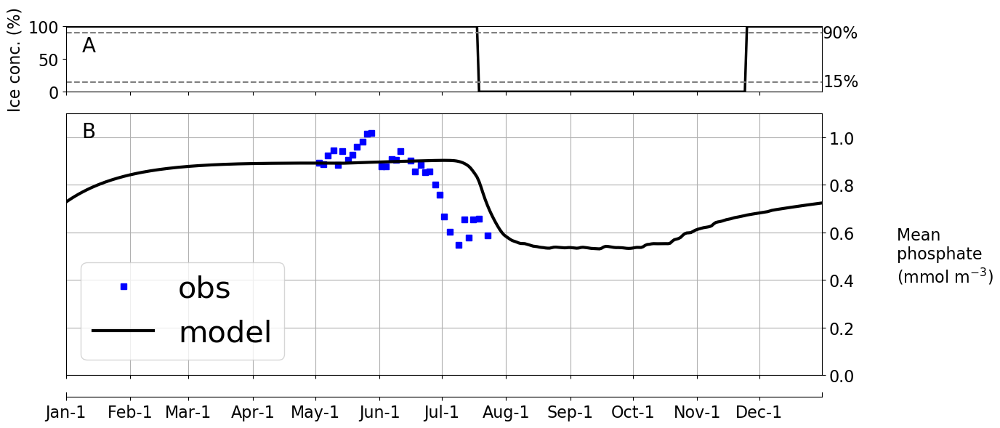

In [273]:
locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
        'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')

fig,axs=plt.subplots(3,1,sharex=False,figsize=(16, 6))

# --- ICE CONCENTRATIONS
ax=axs[0]
ax.plot(first_year,ice*100,'k-',lw=2.5)
ax.set_xlim(first_year[0],first_year[-1])
xlims=ax.get_xlim()
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Ice conc. (%)')
ax.set_ylim(0,100)
ax.plot(xlims,[15,15],'k--',color='gray')
ax.plot(xlims,[90,90],'k--',color='gray')
ax.text(xlims[1]+.5,15,'15%',verticalalignment='center')
ax.text(xlims[1]+.5,90,'90%',verticalalignment='center')
plt.text(0.03,0.7,'A',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# --- SILICIC ACID
ax=axs[1]
h1=ax.plot(first_year,
           array1d_iT_obsmeanpo4,
           's',
           color='blue',
           label='obs')
h2=ax.plot(first_year,
           array1d_iT_modmeanpo4,
           '-',
           lw=3,
           color='black',
           label='model')
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.yaxis.tick_right()
ax.set_ylim(0,1.1)
ax.legend(fontsize=30)
ax.grid()

ax.text(400,0.5,'Mean \nphosphate\n(mmol m$^{-3}$)',
        horizontalalignment = 'left',
        verticalalignment = 'center')
plt.text(0.03,0.93,'B',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# --- ADDITIONAL X-AXIS
ax=axs[2]
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels(labels)
ax.axes.get_yaxis().set_visible(False)
ax.spines['top'].set_visible(False)

# --- POSITION
axs[0].set_position( [0.12,0.80  ,0.65,.15])
axs[1].set_position( [0.12,0.15  ,0.65,.60])
axs[2].set_position( [0.12,0.10  ,0.65,.01])

# --- SAVE
plt.savefig('validation/GEic2016.comp.mean.PO4.png')

# $Si(OH)_4$ tendency

## Model: $Si(OH)_4$ tendency

$tendency=transport+diffusion+relaxation$

In this 1D configuration, the transport term equals $0$.

In [274]:
carfile='car.0000000000.t001.nc'
array2d_idepth_iT_sio2tfull=netcdf_tools.read_netcdf(carfile, 'gTr06').squeeze().transpose()

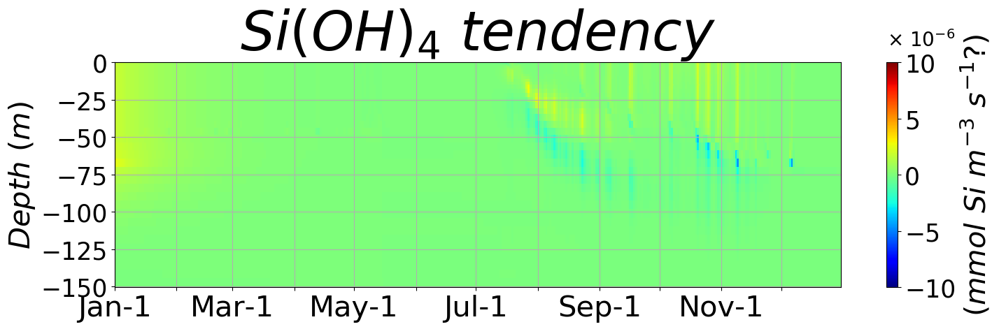

In [275]:
with plt.style.context('noice.mplstyle'):
    first_year366=np.arange(0,366) # first year for heatmaps
    locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
    labels=('Jan-1','','Mar-1','','May-1','',
            'Jul-1','','Sep-1','','Nov-1','')
    RF_above151=RF[RF>-151]

    plt.figure(figsize=(15,5))
    ax = plt.gca()
    h=ax.pcolormesh(first_year366,
                    RF_above151,
                    array2d_idepth_iT_sio2tfull[0:(RF_above151.size)-1,array1d_iT1y_iT]*1e6,
                    cmap='jet',
                    vmin=-10,
                    vmax=10
                  )
    ax.set_title('$Si{(OH)}_4\ tendency$')
    ax.set_xticklabels([])
    ax.set_ylabel('$Depth\ (m)$')
    ax.set_xlim(first_year366[0],first_year[-1])
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    cbar=plt.colorbar(h)
    cbar.set_label('$(mmol\ Si\ m^{-3}\ s^{-1}?)$')
    plt.text(1.11,1.1,'$\\times\ 10^{-6}$',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, fontsize=20)
    plt.tight_layout()
    plt.savefig('car.0000000000.t001.lastyear.si.SiOH4t.png')

# PAR (3m)

## Comparison between observations and model: PAR (3m)

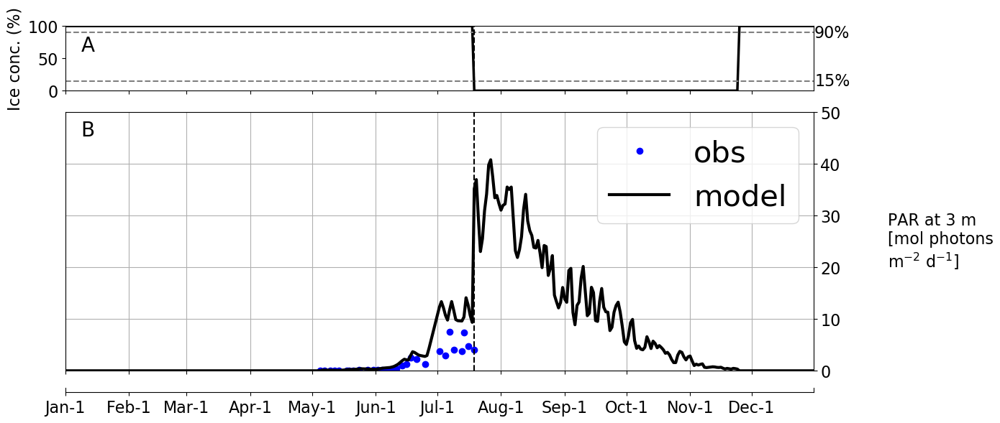

In [276]:
locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
        'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')

fig,axs=plt.subplots(3,1,sharex=False,figsize=(16, 6))

# --- ICE CONCENTRATIONS
ax=axs[0]
ax.plot(first_year,ice*100,'k-',lw=2.5)
ax.set_xlim(first_year[0],first_year[-1])
xlims=ax.get_xlim()
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Ice conc. (%)')
ax.set_ylim(0,100)
ax.plot(xlims,[15,15],'k--',color='gray')
ax.plot(xlims,[90,90],'k--',color='gray')
ax.text(xlims[1]+.5,15,'15%',verticalalignment='center')
ax.text(xlims[1]+.5,90,'90%',verticalalignment='center')
plt.text(0.03,0.7,'A',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# adding the vertical line at 15% of ice
ax.axvline(iT15_start_obs,color='k',linestyle='--')

# --- PAR (3m)
ax=axs[1]
h1=ax.plot(first_year,
           array1d_iT_obsPAR3m,
           'o',
           color='blue',
           label='obs')
h2=ax.plot(first_year,
           array1d_iT_modPAR3m,
           '-',
           lw=3,
           color='black',
           label='model')
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.yaxis.tick_right()
ax.set_ylim(0,50)
ax.legend(fontsize=30)
ax.grid()

ax.text(400,25,'PAR at 3 m\n[mol photons\nm$^{-2}$ d$^{-1}$]',
        horizontalalignment = 'left',
        verticalalignment = 'center')
plt.text(0.03,0.93,'B',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# adding the vertical line at 15% of ice
ax.axvline(iT15_start_obs,color='k',linestyle='--')

# --- ADDITIONAL X-AXIS
ax=axs[2]
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels(labels)
ax.axes.get_yaxis().set_visible(False)
ax.spines['top'].set_visible(False)

# --- POSITION
axs[0].set_position( [0.12,0.80  ,0.65,.15])
axs[1].set_position( [0.12,0.15  ,0.65,.60])
axs[2].set_position( [0.12,0.10  ,0.65,.01])

# --- SAVE
plt.savefig('validation/GEic2016.comp.par3m.png')

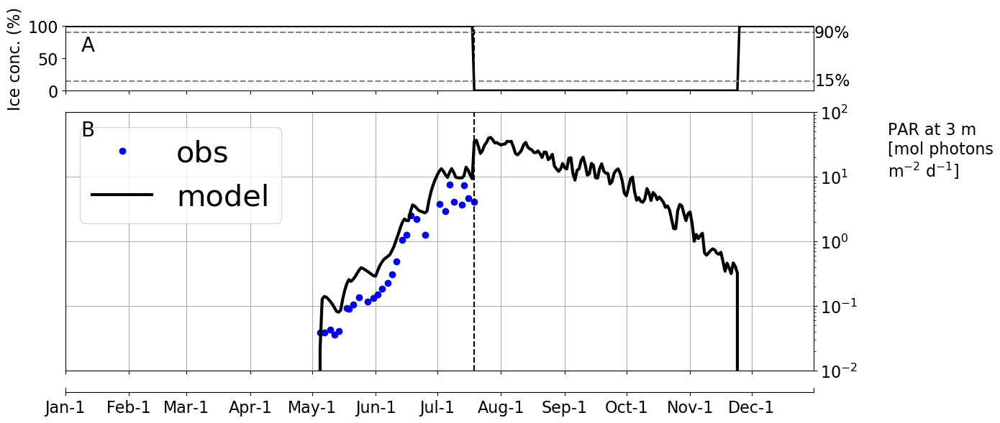

In [277]:
locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
        'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')

fig,axs=plt.subplots(3,1,sharex=False,figsize=(16, 6))

# --- ICE CONCENTRATIONS
ax=axs[0]
ax.plot(first_year,ice*100,'k-',lw=2.5)
ax.set_xlim(first_year[0],first_year[-1])
xlims=ax.get_xlim()
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Ice conc. (%)')
ax.set_ylim(0,100)
ax.plot(xlims,[15,15],'k--',color='gray')
ax.plot(xlims,[90,90],'k--',color='gray')
ax.text(xlims[1]+.5,15,'15%',verticalalignment='center')
ax.text(xlims[1]+.5,90,'90%',verticalalignment='center')
plt.text(0.03,0.7,'A',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# adding the vertical line at 15% of ice
ax.axvline(iT15_start_obs,color='k',linestyle='--')

# --- PAR (3m)
ax=axs[1]
h1=ax.plot(first_year,
           array1d_iT_obsPAR3m,
           'o',
           color='blue',
           label='obs')
ax.set_yscale('log')
h2=ax.plot(first_year,
           array1d_iT_modPAR3m,
           '-',
           lw=3,
           color='black',
           label='model')
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.yaxis.tick_right()
ax.set_ylim(0.01,100)
ax.legend(fontsize=30)
ax.grid()

ax.text(400,25,'PAR at 3 m\n[mol photons\nm$^{-2}$ d$^{-1}$]',
        horizontalalignment = 'left',
        verticalalignment = 'center')
plt.text(0.03,0.93,'B',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# adding the vertical line at 15% of ice
ax.axvline(iT15_start_obs,color='k',linestyle='--')

# --- ADDITIONAL X-AXIS
ax=axs[2]
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels(labels)
ax.axes.get_yaxis().set_visible(False)
ax.spines['top'].set_visible(False)

# --- POSITION
axs[0].set_position( [0.12,0.80  ,0.65,.15])
axs[1].set_position( [0.12,0.15  ,0.65,.60])
axs[2].set_position( [0.12,0.10  ,0.65,.01])

# --- SAVE
plt.savefig('validation/GEic2016.comp.logpar3m.png')

# Isolume

## Comparison between observations and model: Isolume

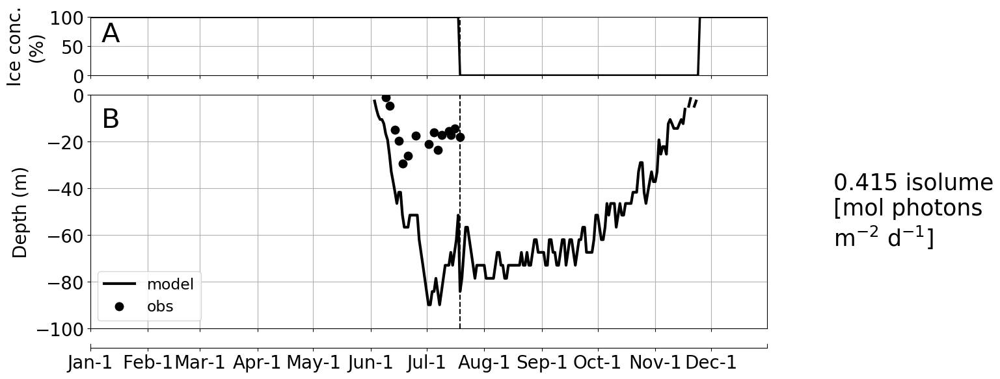

In [278]:
with plt.style.context('validation.mplstyle'):
    locs=np.array([0, 31, 59, 90, 120, 151,
                   181, 212, 243, 273, 304, 334])
    labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
            'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')
    fig,axs=plt.subplots(3,1,sharex=False,figsize=(16, 6))

    # --- ICE CONCENTRATIONS
    ax=axs[0]
    ax.plot(first_year,ice*100,'k-',lw=2.5)
    ax.set_xlim(first_year[0],first_year[-1])
    xlims=ax.get_xlim()
    ax.set_xticks(locs)
    ax.set_xticklabels([])
    ax.set_yticks([0,50,100])
    ax.set_ylabel('Ice conc.\n(%)')
    ax.set_ylim(0,100)
    ax.grid()
    plt.text(0.03,0.7,'A',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, fontsize=30)
    # adding the vertical line at 15% of ice
    ax.axvline(iT15_start_obs,color='k',linestyle='--')

    # --- ISOLUME
    ax=axs[1]
    h1=ax.plot(first_year,
               array1d_iT_modisolume,
               '-',
               lw=3,
               color='black',
               label='model')
    h2=ax.plot(first_year,
               array1d_iT_obsisolume,
               'o',
               color='black',
               label='obs')
    ax.set_xlim(xlims)
    ax.set_xticks(locs)
    ax.set_xticklabels([])
    ax.set_ylim(-100,0)
    ax.set_ylabel('Depth (m)')
    ax.legend(loc=3)
    ax.grid()
    ax.text(400,-50,'0.415 isolume\n[mol photons\nm$^{-2}$ d$^{-1}$]',
            fontsize=25,
            horizontalalignment = 'left',
            verticalalignment = 'center')
    plt.text(0.03,0.89,'B',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, fontsize=30)
    # adding the vertical line at 15% of ice
    ax.axvline(iT15_start_obs,color='k',linestyle='--')

    # --- ADDITIONAL X-AXIS
    ax=axs[2]
    ax.set_xlim(xlims)
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    ax.axes.get_yaxis().set_visible(False)
    ax.spines['top'].set_visible(False)

    # --- POSITION
    axs[0].set_position( [0.12,0.80  ,0.65,.15])
    axs[1].set_position( [0.12,0.15  ,0.65,.60])
    axs[2].set_position( [0.12,0.10  ,0.65,.01])

    # --- SAVE
    plt.savefig('validation/GEic2016.comp.isolume.png')

# Chlorophyll a

## Model chlorophyll a

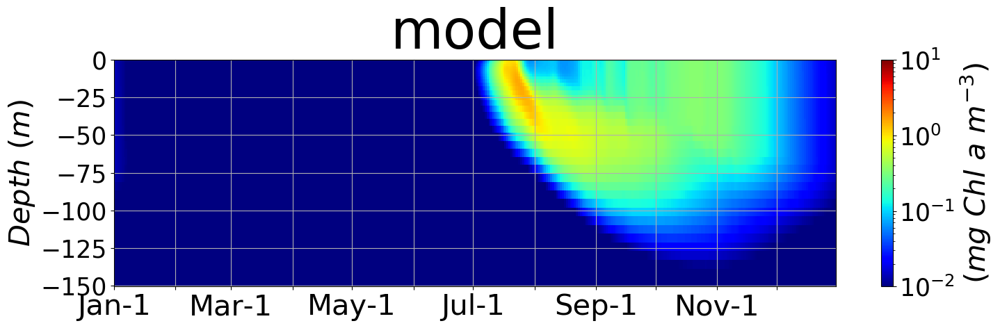

In [279]:
with plt.style.context('noice.mplstyle'):
    locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
    labels=('Jan-1','','Mar-1','','May-1','',
            'Jul-1','','Sep-1','','Nov-1','')

    RF_above151=RF[RF>-151]

    plt.figure(figsize=(15,5))
    ax = plt.gca()
    h=ax.pcolormesh(first_year366,
                    RF_above151,
                    array2d_idepth_iT_modchlfull[0:(RF_above151.size)-1,array1d_iT1y_iT],
                    cmap='jet',
                    norm=mpl.colors.LogNorm(vmin=1E-2,vmax=10)
                  )
    ax.set_title('model')
    ax.set_xticklabels([])
    ax.set_ylabel('$Depth\ (m)$')
    ax.set_xlim(first_year366[0],first_year[-1])
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    cbar=plt.colorbar(h)
    cbar.set_label('$(mg\ Chl\ a\ m^{-3})$')
    plt.tight_layout()
    plt.savefig('chl.0000000000.t001.lastyear.logchl.png')

## Model chlorophyll a: on grid for the observations by HPLC

The chlorophyll a values at -0.51 m on the model grid are extrapolated to -0.5 m. It is the only extrapolation.

In [280]:
array2d_iRC_iT_chlmod=array2d_idepth_iT_modchlfull[:,array1d_iT1y_iT]
array1d_iobs_chlmod=list()
for iobs,row in chlHPLC_df.iterrows():
    doy=row['doy']
    depthobs=row['depth']
    assert depthobs<0, \
    "depthobs is not negative: %r" %(depthobs)
    assert depthobs>RC[-1], \
    "depthobs %r is below maximal depth of model grid %r" %(depthobs,RC[-1])
    y_interp=scipy.interpolate.interp1d(
        RC,
        array2d_iRC_iT_chlmod[:,doy-1].flatten(),
        bounds_error=False,
        fill_value="extrapolate"
    )
    chlmod=y_interp(depthobs).item()
    array1d_iobs_chlmod.append(chlmod)
chlmod_df=pd.DataFrame({
    'depth':chlHPLC_df['depth'],
    'chlmod':array1d_iobs_chlmod,
    'doy':chlHPLC_df['doy']
})

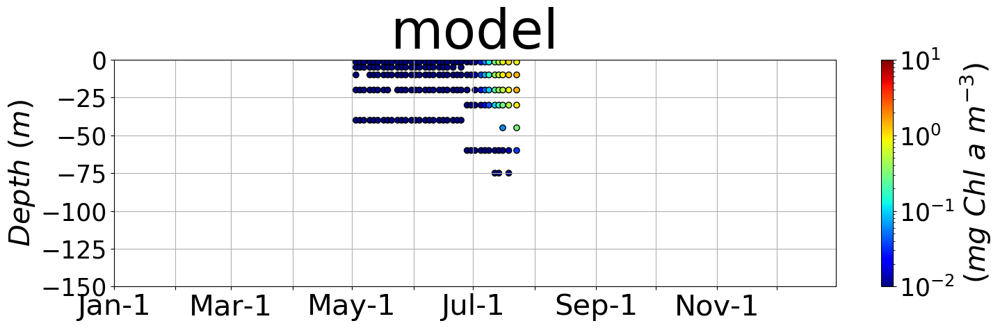

In [281]:
with plt.style.context('noice.mplstyle'):
    locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
    labels=('Jan-1','','Mar-1','','May-1','',
            'Jul-1','','Sep-1','','Nov-1','')

    plt.figure(figsize=(15,5))
    ax = plt.gca()
    hc=ax.scatter(chlmod_df['doy']-1,
                  chlmod_df['depth'],
                  c=chlmod_df['chlmod'],
                  cmap='jet',
                  norm=mpl.colors.LogNorm(vmin=1E-2,vmax=10),
                  s=None,
                  edgecolor='k'
                 )
    ax.set_title('model')
    ax.set_xticklabels([])
    ax.set_ylabel('$Depth\ (m)$')
    ax.set_xlim(first_year[0],first_year[-1])
    ax.set_ylim(-150,0)
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    cbar=plt.colorbar(hc)
    cbar.set_label('$(mg\ Chl\ a\ m^{-3})$')
    plt.tight_layout()
    plt.savefig('chl.0000000000.t001.lastyear.logchl.obsgrid.png')

## Comparison between observations and model: chlorophyll a

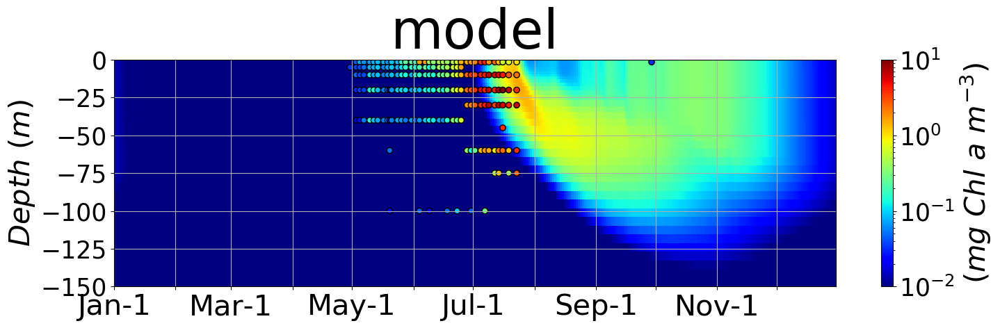

In [282]:
with plt.style.context('noice.mplstyle'):
    locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
    labels=('Jan-1','','Mar-1','','May-1','',
            'Jul-1','','Sep-1','','Nov-1','')

    RF_above151=RF[RF>-151]

    plt.figure(figsize=(15,5))
    ax = plt.gca()
    h=ax.pcolormesh(first_year366,
                    RF_above151,
                    array2d_idepth_iT_modchlfull[0:(RF_above151.size)-1,array1d_iT1y_iT],
                    cmap='jet',
                    norm=mpl.colors.LogNorm(vmin=1E-2, vmax=10)
                  )
    hc=ax.scatter(chlfluo_df['doy']-1,
                  chlfluo_df['depth'],
                  c=chlfluo_df['chlfluo'],
                  cmap='jet',
                  norm=mpl.colors.LogNorm(vmin=1E-2, vmax=10),
                  s=None,
                  edgecolor='k'
                 )
    ax.set_title('model')
    ax.set_xticklabels([])
    ax.set_ylabel('$Depth\ (m)$')
    ax.set_xlim(first_year366[0],first_year[-1])
    ax.set_ylim(-150,0)
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    cbar=plt.colorbar(h)
    cbar.set_label('$(mg\ Chl\ a\ m^{-3})$')
    plt.tight_layout()
    plt.savefig('validation/GEic2016.comp.m3.logchlfluo.png')

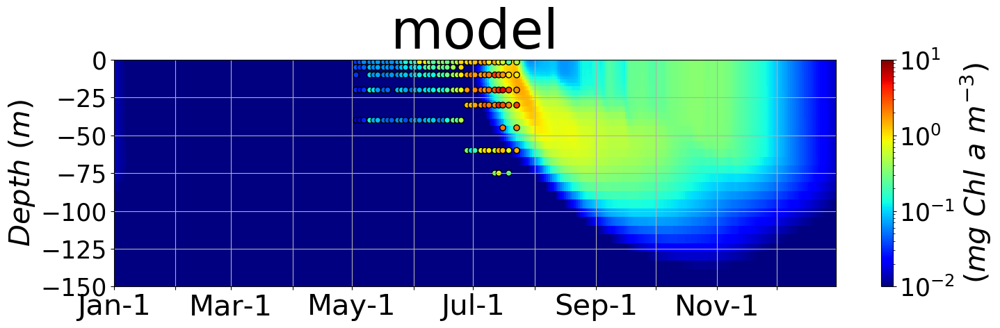

In [283]:
with plt.style.context('noice.mplstyle'):
    locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
    labels=('Jan-1','','Mar-1','','May-1','',
            'Jul-1','','Sep-1','','Nov-1','')

    RF_above151=RF[RF>-151]

    plt.figure(figsize=(15,5))
    ax = plt.gca()
    h=ax.pcolormesh(first_year366,
                    RF_above151,
                    array2d_idepth_iT_modchlfull[0:(RF_above151.size)-1,array1d_iT1y_iT],
                    cmap='jet',
                    norm=mpl.colors.LogNorm(vmin=1E-2, vmax=10)
                  )
    hc=ax.scatter(chlHPLC_df['doy']-1,
                  chlHPLC_df['depth'],
                  c=chlHPLC_df['chlHPLC'],
                  cmap='jet',
                  norm=mpl.colors.LogNorm(vmin=1E-2, vmax=10),
                  s=None,
                  edgecolor='k'
                 )
    ax.set_title('model')
    ax.set_xticklabels([])
    ax.set_ylabel('$Depth\ (m)$')
    ax.set_xlim(first_year366[0],first_year[-1])
    ax.set_ylim(-150,0)
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    cbar=plt.colorbar(h)
    cbar.set_label('$(mg\ Chl\ a\ m^{-3})$')
    plt.tight_layout()
    plt.savefig('validation/GEic2016.comp.m3.logchlHPLC.png')

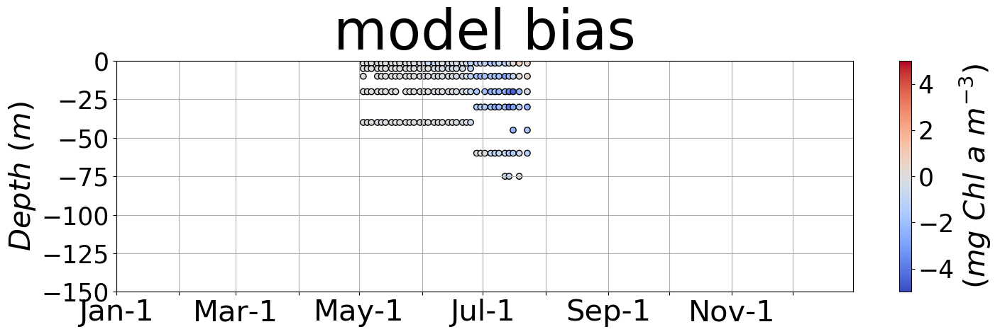

In [284]:
assert chlmod_df['doy'].equals(chlHPLC_df['doy']), \
"column doy in chlmod_df is different from column doy in chlHPLC_df"
assert chlmod_df['depth'].equals(chlHPLC_df['depth']), \
"column depth in chlmod_df is different from column depth in chlHPLC_df"
with plt.style.context('noice.mplstyle'):
    locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
    labels=('Jan-1','','Mar-1','','May-1','',
            'Jul-1','','Sep-1','','Nov-1','')

    plt.figure(figsize=(15,5))
    ax = plt.gca()
    hc=ax.scatter(chlmod_df['doy']-1,
                  chlmod_df['depth'],
                  c=chlmod_df['chlmod']-chlHPLC_df['chlHPLC'],
                  cmap='coolwarm',
                  vmin=-5,
                  vmax=5
                  ,
                  s=None,
                  edgecolor='k'
                 )
    ax.set_title('model bias')
    ax.set_xticklabels([])
    ax.set_ylabel('$Depth\ (m)$')
    ax.set_xlim(first_year[0],first_year[-1])
    ax.set_ylim(-150,0)
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    cbar=plt.colorbar(hc)
    cbar.set_label('$(mg\ Chl\ a\ m^{-3})$')
    plt.tight_layout()
    plt.savefig('validation/GEic2016.bias.m3.logchlHPLC.png')

## Comparison between observations and model: mean chlorophyll a (0-40m)

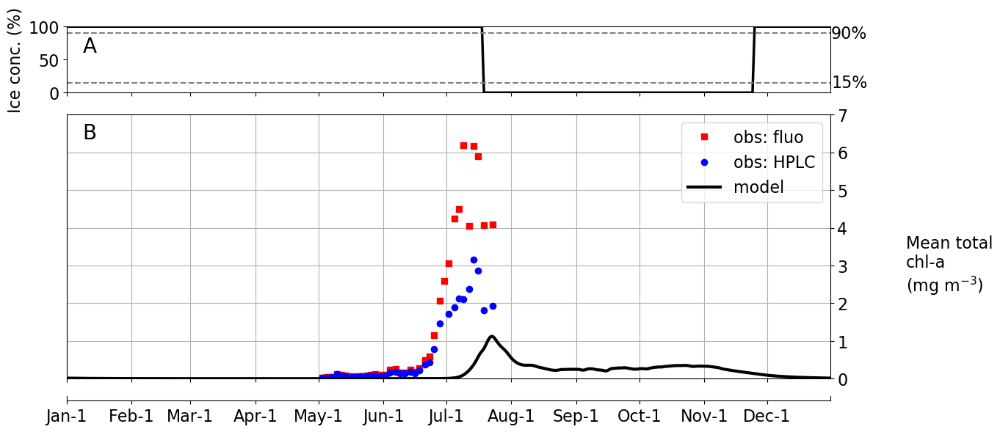

In [285]:
locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
        'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')

fig,axs=plt.subplots(3,1,sharex=False,figsize=(16, 6))

# --- ICE CONCENTRATIONS
ax=axs[0]
ax.plot(first_year,ice*100,'k-',lw=2.5)
ax.set_xlim(first_year[0],first_year[-1])
xlims=ax.get_xlim()
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Ice conc. (%)')
ax.set_ylim(0,100)
ax.plot(xlims,[15,15],'k--',color='gray')
ax.plot(xlims,[90,90],'k--',color='gray')
ax.text(xlims[1]+.5,15,'15%',verticalalignment='center')
ax.text(xlims[1]+.5,90,'90%',verticalalignment='center')
plt.text(0.03,0.7,'A',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# --- CHLOROPHYLL A
ax=axs[1]
h1=ax.plot(first_year,
           array1d_iT_obsmeanchlfluo,
           's',
           color='red',
           label='obs: fluo')
h2=ax.plot(first_year,
           array1d_iT_obsmeanchlHPLC,
           'o',
           color='blue',
           label='obs: HPLC')
h3=ax.plot(first_year,
           array1d_iT_modmeanchl,
           '-',
           lw=3,
           color='black',
           label='model')
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.yaxis.tick_right()
ax.set_ylim(0,7)
# ax.legend(fontsize=30)
ax.legend()
ax.grid()

ax.text(400,3,'Mean total\nchl-a\n(mg m$^{-3}$)',
        horizontalalignment = 'left',
        verticalalignment = 'center')
plt.text(0.03,0.93,'B',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# --- ADDITIONAL X-AXIS
ax=axs[2]
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels(labels)
ax.axes.get_yaxis().set_visible(False)
ax.spines['top'].set_visible(False)

# --- POSITION
axs[0].set_position( [0.12,0.80  ,0.65,.15])
axs[1].set_position( [0.12,0.15  ,0.65,.60])
axs[2].set_position( [0.12,0.10  ,0.65,.01])

# --- SAVE
plt.savefig('validation/GEic2016.comp.mean.chl.png')

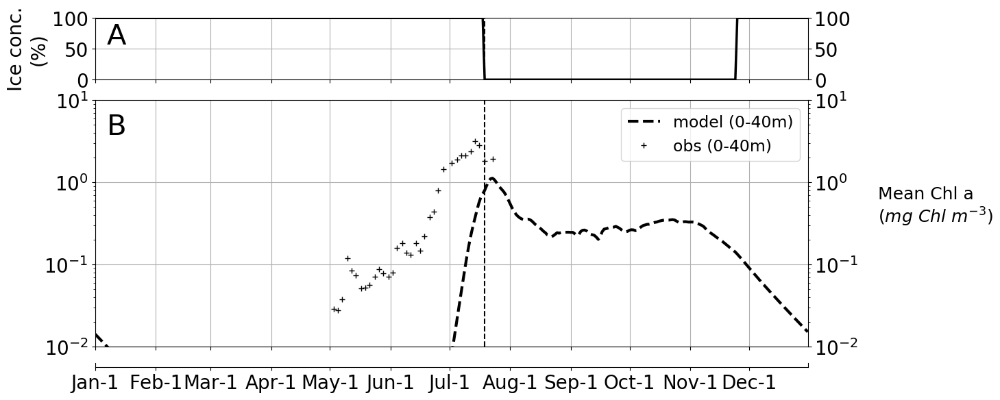

In [286]:
with plt.style.context('validation.mplstyle'):
    locs=np.array([0, 31, 59, 90, 120, 151,
                   181, 212, 243, 273, 304, 334])
    labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
            'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')
    fig,axs=plt.subplots(3,1,sharex=False,figsize=(16, 6))

    # --- ICE CONCENTRATIONS
    ax=axs[0]
    ax.plot(first_year,ice*100,'k-',lw=2.5)
    ax.set_xlim(first_year[0],first_year[-1])
    xlims=ax.get_xlim()
    ax.set_xticks(locs)
    ax.set_xticklabels([])
    ax.yaxis.tick_right()
    ax.yaxis.set_ticks_position('both')
    ax.tick_params(labelleft=True, labelright=True)
    ax.set_yticks([0,50,100])
    ax.set_ylabel('Ice conc.\n(%)')
    ax.set_ylim(0,100)
    ax.grid()
    plt.text(0.03,0.7,'A',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, fontsize=30)
    # adding the vertical line at 15% of observed ice
    ax.axvline(iT15_start_obs,color='k',linestyle='--')

    # --- CHLOROPHYLL A
    ax=axs[1]
    h1=ax.plot(first_year,array1d_iT_modmeanchl,
               '--',lw=3,color='black',label='model (0-40m)')
    ax.set_yscale('log')
    h2=ax.plot(first_year,array1d_iT_obsmeanchlHPLC,
               '+',markersize=6,color='black',label='obs (0-40m)')
    ax.set_xlim(xlims)
    ax.set_xticks(locs)
    ax.set_xticklabels([])
    ax.yaxis.tick_right()
    ax.yaxis.set_ticks_position('both')
    ax.tick_params(labelleft=True, labelright=True)
    ax.set_ylim(1E-2,1E1)
    ax.legend(loc='upper right')
    ax.grid()
    ax.text(400,0.5,'Mean Chl a\n($mg\ Chl\ m^{-3}$)',
            horizontalalignment = 'left',verticalalignment = 'center',
            fontsize=18)
    plt.text(0.03,0.89,'B',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, fontsize=30)
    # adding the vertical line at 15% of observed ice
    ax.axvline(iT15_start_obs,color='k',linestyle='--')

    # --- ADDITIONAL X-AXIS
    ax=axs[2]
    ax.set_xlim(xlims)
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    ax.axes.get_yaxis().set_visible(False)
    ax.spines['top'].set_visible(False)

    # --- POSITION
    axs[0].set_position( [0.12,0.80  ,0.65,.15])
    axs[1].set_position( [0.12,0.15  ,0.65,.60])
    axs[2].set_position( [0.12,0.10  ,0.65,.01])

    # --- SAVE
    plt.savefig('validation/GEic2016.comp.mean.logchl.png')

## Comparison between observations and model: vertical integration of chlorophyll $a$ (0-40m)

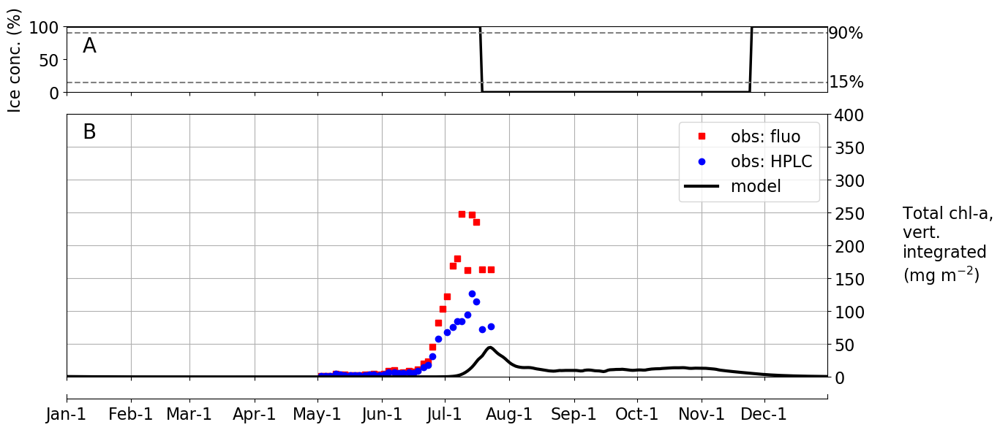

In [287]:
locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
        'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')

fig,axs=plt.subplots(3,1,sharex=False,figsize=(16, 6))

# --- ICE CONCENTRATIONS
ax=axs[0]
ax.plot(first_year,ice*100,'k-',lw=2.5)
ax.set_xlim(first_year[0],first_year[-1])
xlims=ax.get_xlim()
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Ice conc. (%)')
ax.set_ylim(0,100)
ax.plot(xlims,[15,15],'k--',color='gray')
ax.plot(xlims,[90,90],'k--',color='gray')
ax.text(xlims[1]+.5,15,'15%',verticalalignment='center')
ax.text(xlims[1]+.5,90,'90%',verticalalignment='center')
plt.text(0.03,0.7,'A',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# --- CHLOROPHYLL A
ax=axs[1]
h1=ax.plot(first_year,
           array1d_iT_obsvint40mchlfluo,
           's',
           color='red',
           label='obs: fluo')
h2=ax.plot(first_year,
           array1d_iT_obsvint40mchlHPLC,
           'o',
           color='blue',
           label='obs: HPLC')
h3=ax.plot(first_year,
           array1d_iT_modvint40mchl,
           '-',
           lw=3,
           color='black',
           label='model')
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.yaxis.tick_right()
ax.set_ylim(0,400)
ax.legend()
ax.grid()
ax.text(400,200,'Total chl-a,\nvert. \nintegrated\n(mg m$^{-2}$)',
        horizontalalignment = 'left',
        verticalalignment = 'center')
plt.text(0.03,0.93,'B',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# --- ADDITIONAL X-AXIS
ax=axs[2]
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels(labels)
ax.axes.get_yaxis().set_visible(False)
ax.spines['top'].set_visible(False)

# --- POSITION
axs[0].set_position( [0.12,0.80  ,0.65,.15])
axs[1].set_position( [0.12,0.15  ,0.65,.60])
axs[2].set_position( [0.12,0.10  ,0.65,.01])

# --- SAVE
plt.savefig('validation/GEic2016.comp.vint40m.chlfluoHPLC.png')

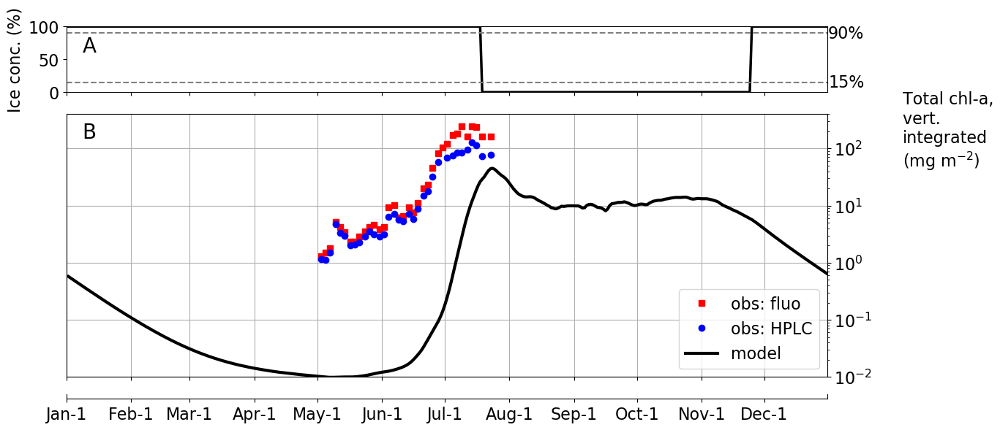

In [288]:
locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
        'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')

fig,axs=plt.subplots(3,1,sharex=False,figsize=(16, 6))

# --- ICE CONCENTRATIONS
ax=axs[0]
ax.plot(first_year,ice*100,'k-',lw=2.5)
ax.set_xlim(first_year[0],first_year[-1])
xlims=ax.get_xlim()
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Ice conc. (%)')
ax.set_ylim(0,100)
ax.plot(xlims,[15,15],'k--',color='gray')
ax.plot(xlims,[90,90],'k--',color='gray')
ax.text(xlims[1]+.5,15,'15%',verticalalignment='center')
ax.text(xlims[1]+.5,90,'90%',verticalalignment='center')
plt.text(0.03,0.7,'A',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# --- CHLOROPHYLL A
ax=axs[1]
h1=ax.plot(first_year,
           array1d_iT_obsvint40mchlfluo,
           's',
           color='red',
           label='obs: fluo')
ax.set_yscale('log')
h2=ax.plot(first_year,
           array1d_iT_obsvint40mchlHPLC,
           'o',
           color='blue',
           label='obs: HPLC')
h3=ax.plot(first_year+1,
           array1d_iT_modvint40mchl,
           '-',
           lw=3,
           color='black',
           label='model')
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.yaxis.tick_right()
ax.set_ylim(1E-2,400)
ax.legend(loc='lower right')
ax.grid()
ax.text(400,200,'Total chl-a,\nvert. \nintegrated\n(mg m$^{-2}$)',
        horizontalalignment = 'left',
        verticalalignment = 'center')
plt.text(0.03,0.93,'B',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# --- ADDITIONAL X-AXIS
ax=axs[2]
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels(labels)
ax.axes.get_yaxis().set_visible(False)
ax.spines['top'].set_visible(False)

# --- POSITION
axs[0].set_position( [0.12,0.80  ,0.65,.15])
axs[1].set_position( [0.12,0.15  ,0.65,.60])
axs[2].set_position( [0.12,0.10  ,0.65,.01])

# --- SAVE
plt.savefig('validation/GEic2016.comp.vint40m.logchlfluoHPLC.png')

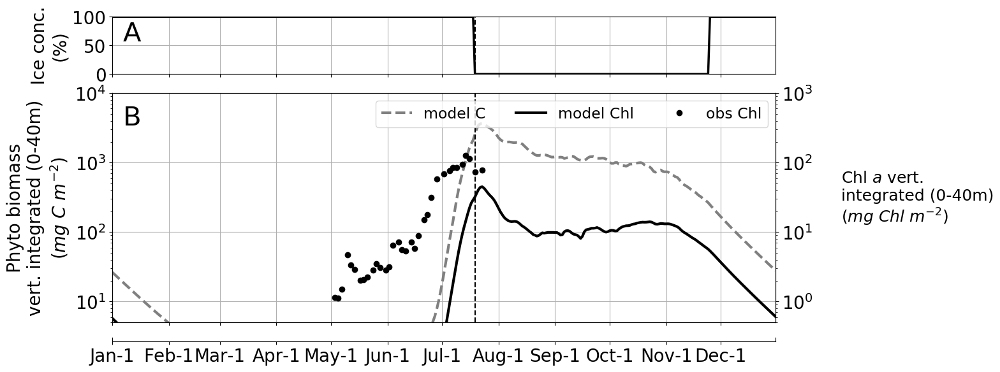

In [289]:
with plt.style.context('validation.mplstyle'):
    locs=np.array([0, 31, 59, 90, 120, 151,
                   181, 212, 243, 273, 304, 334])
    labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
            'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')
    fig,axs=plt.subplots(3,1,sharex=False,figsize=(16, 6))

    # --- ICE CONCENTRATIONS
    ax=axs[0]
    ax.plot(first_year,ice*100,'k-',lw=2.5)
    ax.set_xlim(first_year[0],first_year[-1])
    xlims=ax.get_xlim()
    ax.set_xticks(locs)
    ax.set_xticklabels([])
    ax.set_yticks([0,50,100])
    ax.set_ylabel('Ice conc.\n(%)')
    ax.set_ylim(0,100)
    ax.grid()
    plt.text(0.03,0.7,'A',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, fontsize=30)
    # adding the vertical line at 15% of observed ice
    ax.axvline(iT15_start_obs,color='k',linestyle='--')

    # --- CHLOROPHYLL A AND BIOMASS
    ax=axs[1]
    # g C m^-3 -> mg C m^-3
    h1=ax.plot(first_year,array1d_iT_mod40mphytobio*1E3,
               '--',color='grey',lw=3,label='model C')
    ax.set_yscale('log')
    ax.set_xlim(xlims)
    ax.set_xticks(locs)
    ax.set_xticklabels([])
    ax.set_ylim(5E0,1E4)
    ax.set_ylabel('Phyto biomass\nvert. integrated (0-40m)\n($mg\ C\ m^{-2}$)')
    ax.grid()
    axt = ax.twinx()
    h2=axt.plot(first_year,array1d_iT_modvint40mchl,
                '-',lw=3,color='black',label='model Chl')
    h3=axt.plot(first_year,array1d_iT_obsvint40mchlHPLC,
                'o',markersize=6,color='black',label='obs Chl')
    axt.set_yscale('log')
    axt.set_ylim(*[0.1*l for l in ax.get_ylim()])
    axt.text(400,30,'Chl $a$ vert.\nintegrated (0-40m)\n($mg\ Chl\ m^{-2}$)',
             horizontalalignment = 'left',verticalalignment = 'center',
             fontsize=18)
    # ref: https://stackoverflow.com/questions/5484922/secondary-axis-with-twinx-how-to-add-to-legend
    # answer by Paul
    lns=h1+h2+h3
    labs = [l.get_label() for l in lns]
    ax.legend(lns,labs,loc='upper right',ncol=3)
    plt.text(0.03,0.89,'B',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=30)
    # adding the vertical line at 15% of observed ice
    ax.axvline(iT15_start_obs,color='k',linestyle='--')

    # --- ADDITIONAL X-AXIS
    ax=axs[2]
    ax.set_xlim(xlims)
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    ax.axes.get_yaxis().set_visible(False)
    ax.spines['top'].set_visible(False)

    # --- POSITION
    axs[0].set_position( [0.12,0.80  ,0.65,.15])
    axs[1].set_position( [0.12,0.15  ,0.65,.60])
    axs[2].set_position( [0.12,0.10  ,0.65,.01])

    # --- SAVE
    plt.savefig('validation/GEic2016.comp.vint40m.logchl.logphytobio.png')

## Comparison between observations and model: vertical integration of chlorophyll $a$ (0-100m)

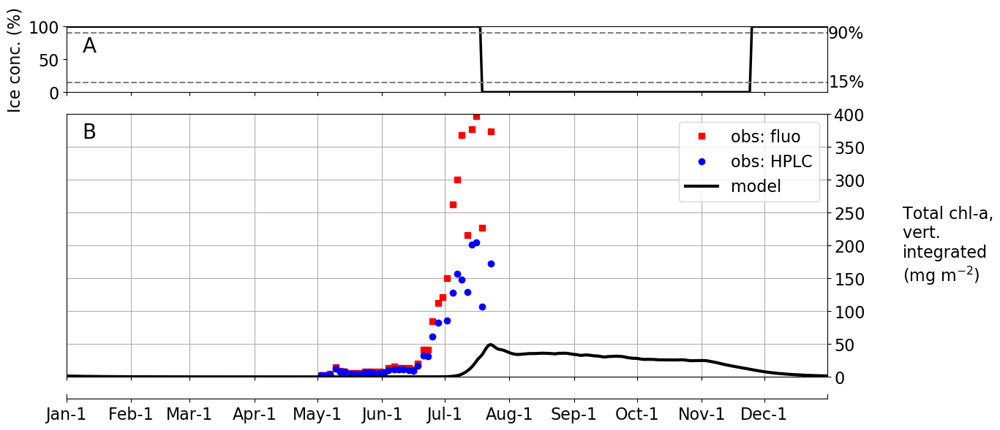

In [290]:
locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
        'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')

fig,axs=plt.subplots(3,1,sharex=False,figsize=(16, 6))

# --- ICE CONCENTRATIONS
ax=axs[0]
ax.plot(first_year,ice*100,'k-',lw=2.5)
ax.set_xlim(first_year[0],first_year[-1])
xlims=ax.get_xlim()
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Ice conc. (%)')
ax.set_ylim(0,100)
ax.plot(xlims,[15,15],'k--',color='gray')
ax.plot(xlims,[90,90],'k--',color='gray')
ax.text(xlims[1]+.5,15,'15%',verticalalignment='center')
ax.text(xlims[1]+.5,90,'90%',verticalalignment='center')
plt.text(0.03,0.7,'A',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# --- CHLOROPHYLL A
ax=axs[1]
h1=ax.plot(first_year,
           array1d_iT_obsvintchlfluo,
           's',
           color='red',
           label='obs: fluo')
h2=ax.plot(first_year,
           array1d_iT_obsvintchlHPLC,
           'o',
           color='blue',
           label='obs: HPLC')
h3=ax.plot(first_year,
           array1d_iT_modvintchl,
           '-',
           lw=3,
           color='black',
           label='model')
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.yaxis.tick_right()
ax.set_ylim(0,400)
ax.legend()
ax.grid()
ax.text(400,200,'Total chl-a,\nvert. \nintegrated\n(mg m$^{-2}$)',
        horizontalalignment = 'left',
        verticalalignment = 'center')
plt.text(0.03,0.93,'B',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# --- ADDITIONAL X-AXIS
ax=axs[2]
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels(labels)
ax.axes.get_yaxis().set_visible(False)
ax.spines['top'].set_visible(False)

# --- POSITION
axs[0].set_position( [0.12,0.80  ,0.65,.15])
axs[1].set_position( [0.12,0.15  ,0.65,.60])
axs[2].set_position( [0.12,0.10  ,0.65,.01])

# --- SAVE
plt.savefig('validation/GEic2016.comp.vint100m.chlfluoHPLC.png')

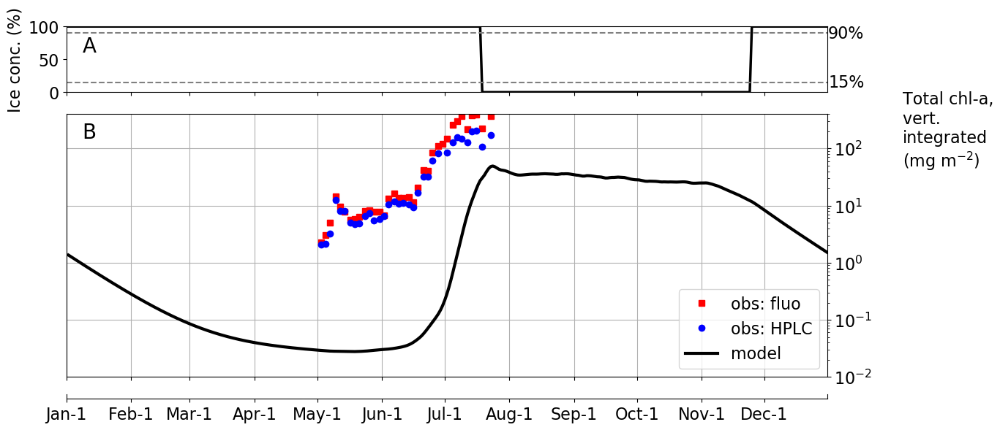

In [291]:
locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
        'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')

fig,axs=plt.subplots(3,1,sharex=False,figsize=(16, 6))

# --- ICE CONCENTRATIONS
ax=axs[0]
ax.plot(first_year,ice*100,'k-',lw=2.5)
ax.set_xlim(first_year[0],first_year[-1])
xlims=ax.get_xlim()
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Ice conc. (%)')
ax.set_ylim(0,100)
ax.plot(xlims,[15,15],'k--',color='gray')
ax.plot(xlims,[90,90],'k--',color='gray')
ax.text(xlims[1]+.5,15,'15%',verticalalignment='center')
ax.text(xlims[1]+.5,90,'90%',verticalalignment='center')
plt.text(0.03,0.7,'A',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# --- CHLOROPHYLL A
ax=axs[1]
h1=ax.plot(first_year,
           array1d_iT_obsvintchlfluo,
           's',
           color='red',
           label='obs: fluo')
ax.set_yscale('log')
h2=ax.plot(first_year,
           array1d_iT_obsvintchlHPLC,
           'o',
           color='blue',
           label='obs: HPLC')
h3=ax.plot(first_year+1,
           array1d_iT_modvintchl,
           '-',
           lw=3,
           color='black',
           label='model')
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.yaxis.tick_right()
ax.set_ylim(1E-2,400)
ax.legend(loc='lower right')
ax.grid()
ax.text(400,200,'Total chl-a,\nvert. \nintegrated\n(mg m$^{-2}$)',
        horizontalalignment = 'left',
        verticalalignment = 'center')
plt.text(0.03,0.93,'B',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)

# --- ADDITIONAL X-AXIS
ax=axs[2]
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels(labels)
ax.axes.get_yaxis().set_visible(False)
ax.spines['top'].set_visible(False)

# --- POSITION
axs[0].set_position( [0.12,0.80  ,0.65,.15])
axs[1].set_position( [0.12,0.15  ,0.65,.60])
axs[2].set_position( [0.12,0.10  ,0.65,.01])

# --- SAVE
plt.savefig('validation/GEic2016.comp.vint100m.logchlfluoHPLC.png')

In [292]:
date_initiation=dev

In [293]:
date_peak=first_local_maximum_date

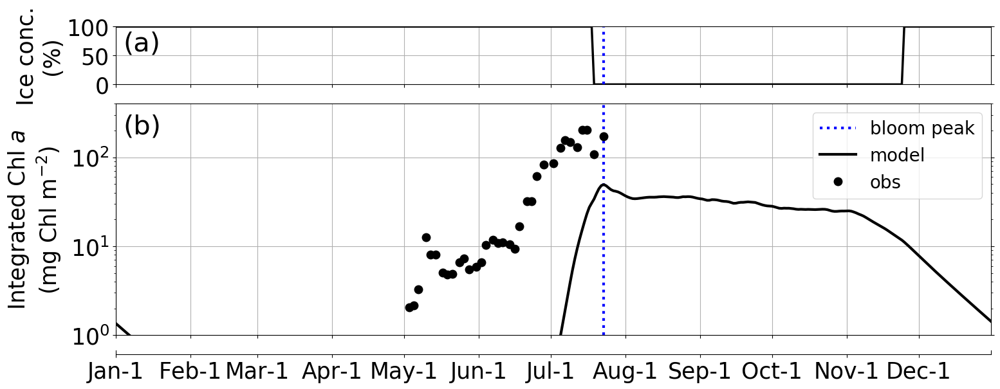

In [294]:
def make_plots(axs):
    box=dict(pad=5,alpha=0)
    locs=np.array([0, 31, 59, 90, 120, 151,
                   181, 212, 243, 273, 304, 334])
    labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
            'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')

    # --- ICE CONCENTRATIONS
    ax=axs[0]
    ax.plot(first_year,ice*100,'k-',lw=2.5)
    ax.set_xlim(first_year[0],first_year[-1])
    xlims=ax.get_xlim()
    ax.set_xticks(locs)
    ax.set_xticklabels([])
    ax.set_yticks([0,50,100])
    ax.yaxis.set_ticks_position('both')
    ax.set_ylabel('Ice conc.\n(%)',bbox=box)
    ax.set_ylim(0,100)
    ax.grid()
    plt.text(0.03,0.7,'(a)',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, fontsize=30)
    # adding a vertical line at the bloom peak
    ax.axvline(date_peak,color='b',linestyle=':',
               label='bloom peak')
    # adding the vertical line at 15% of observed ice
#     ax.axvline(iT15_start_obs,color='k',linestyle='--')

    # --- CHLOROPHYLL A
    ax=axs[1]
    # adding a vertical line at the bloom peak
    ax.axvline(date_peak,color='b',linestyle=':',label='bloom peak')
    # adding the vertical line at 15% of observed ice
#     ax.axvline(iT15_start_obs,color='k',linestyle='--')
    h1=ax.plot(first_year,array1d_iT_modvintchl,
           '-',lw=3,color='black',label='model')
    ax.set_yscale('log')
    ax.set_xlim(xlims)
    ax.set_xticks(locs)
    ax.set_xticklabels([])
    ax.set_ylabel('Integrated Chl $a$\n($\mathrm{ mg\ Chl\ m^{-2} }$)',
                 bbox=box)
    ax.yaxis.set_ticks_position('both')
    ax.set_ylim(1E0,400)
    ax.grid()
    h2=ax.plot(first_year,array1d_iT_obsvintchlHPLC,
               'o',color='black',label='obs')
    plt.text(0.03,0.90,'(b)',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, fontsize=30)
    ax.legend()

    # --- ADDITIONAL X-AXIS
    ax=axs[2]
    ax.set_xlim(xlims)
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    ax.axes.get_yaxis().set_visible(False)
    ax.spines['top'].set_visible(False)

    # --- POSITION
    axs[0].set_position( [0.12,0.80  ,0.85,0.15])
    axs[1].set_position( [0.12,0.15  ,0.85,0.60])
    axs[2].set_position( [0.12,0.10  ,0.85,0.01])
    
with plt.style.context('many_rows_one_col.mplstyle'):
    # Plot
    fig,axs=plt.subplots(3,1,sharex=False,figsize=(16, 6))
    make_plots(axs)
    fig.align_ylabels(axs[:])

    # --- SAVE
    plt.savefig('validation/GEic2016.comp.vint100m.logchl.png')

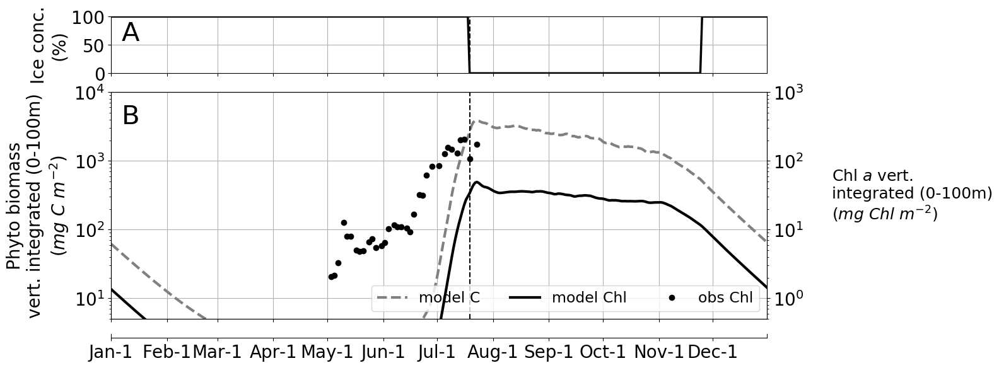

In [295]:
with plt.style.context('validation.mplstyle'):
    locs=np.array([0, 31, 59, 90, 120, 151,
                   181, 212, 243, 273, 304, 334])
    labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
            'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')
    fig,axs=plt.subplots(3,1,sharex=False,figsize=(16, 6))

    # --- ICE CONCENTRATIONS
    ax=axs[0]
    ax.plot(first_year,ice*100,'k-',lw=2.5)
    ax.set_xlim(first_year[0],first_year[-1])
    xlims=ax.get_xlim()
    ax.set_xticks(locs)
    ax.set_xticklabels([])
    ax.set_ylabel('Ice conc.\n(%)')
    ax.set_yticks([0,50,100])
    ax.set_ylim(0,100)
    ax.grid()
    plt.text(0.03,0.7,'A',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, fontsize=30)
    # adding the vertical line at 15% of observed ice
    ax.axvline(iT15_start_obs,color='k',linestyle='--')

    # --- CHLOROPHYLL A AND BIOMASS
    ax=axs[1]
    # g C m^-3 -> mg C m^-3
    h1=ax.plot(first_year,array1d_iT_modphytobio*1E3,
               '--',color='grey',lw=3,label='model C')
    ax.set_yscale('log')
    ax.set_xlim(xlims)
    ax.set_xticks(locs)
    ax.set_xticklabels([])
    ax.set_ylim(5E0,1E4)
    ax.set_ylabel('Phyto biomass\nvert. integrated (0-100m)\n($mg\ C\ m^{-2}$)')
    ax.grid()
    axt = ax.twinx()
    h2=axt.plot(first_year,array1d_iT_modvintchl,
                '-',lw=3,color='black',label='model Chl')
    h3=axt.plot(first_year,array1d_iT_obsvintchlHPLC,
                'o',markersize=6,color='black',label='obs Chl')
    axt.set_yscale('log')
    axt.set_ylim(*[0.1*l for l in ax.get_ylim()])
    axt.text(400,30,'Chl $a$ vert.\nintegrated (0-100m)\n($mg\ Chl\ m^{-2}$)',
             horizontalalignment = 'left',verticalalignment = 'center',
             fontsize=18)
    # ref: https://stackoverflow.com/questions/5484922/secondary-axis-with-twinx-how-to-add-to-legend
    # answer by Paul
    lns=h1+h2+h3
    labs = [l.get_label() for l in lns]
    ax.legend(lns,labs,loc='lower right',ncol=3)
    plt.text(0.03,0.89,'B',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, fontsize=30)
    # adding the vertical line at 15% of observed ice
    ax.axvline(iT15_start_obs,color='k',linestyle='--')

    # --- ADDITIONAL X-AXIS
    ax=axs[2]
    ax.set_xlim(xlims)
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    ax.axes.get_yaxis().set_visible(False)
    ax.spines['top'].set_visible(False)

    # --- POSITION
    axs[0].set_position( [0.12,0.80  ,0.65,.15])
    axs[1].set_position( [0.12,0.15  ,0.65,.60])
    axs[2].set_position( [0.12,0.10  ,0.65,.01])

    # --- SAVE
    plt.savefig('validation/GEic2016.comp.vint100m.logchl.logphytobio.png')

## Comparison between observations and model: vertical integration of chlorophyll $a$ (0-40m) and (0-100m)

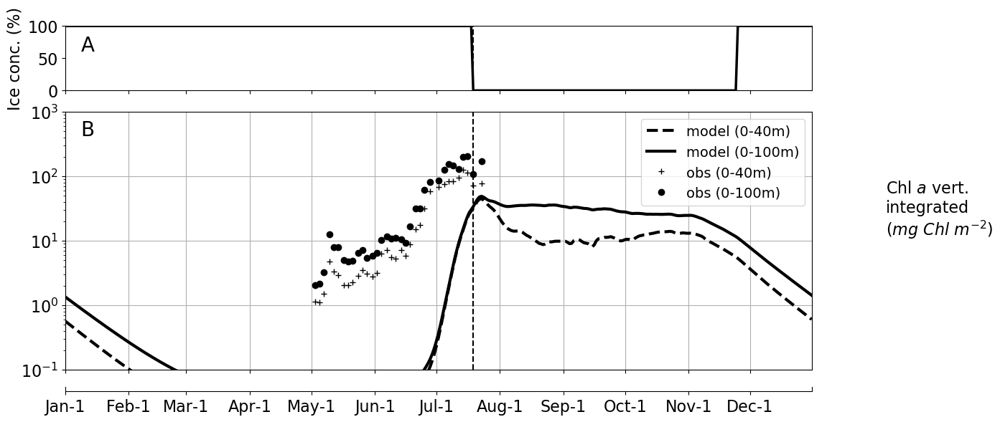

In [296]:
locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
        'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')

fig,axs=plt.subplots(3,1,sharex=False,figsize=(16, 6))

# --- ICE CONCENTRATIONS
ax=axs[0]
ax.plot(first_year,ice*100,'k-',lw=2.5)
ax.set_xlim(first_year[0],first_year[-1])
xlims=ax.get_xlim()
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylabel('Ice conc. (%)')
ax.set_ylim(0,100)
plt.text(0.03,0.7,'A',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)
# adding the vertical line at 15% of observed ice
ax.axvline(iT15_start_obs,color='k',linestyle='--')

# --- CHLOROPHYLL A AND BIOMASS
ax=axs[1]
h1=ax.plot(first_year,array1d_iT_modvint40mchl,
           '--',lw=3,color='black',label='model (0-40m)')
ax.set_yscale('log')
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels([])
ax.set_ylim(1E-1,1E3)
ax.grid()
h2=ax.plot(first_year,array1d_iT_modvintchl,
           '-',lw=3,color='black',label='model (0-100m)')
h3=ax.plot(first_year,array1d_iT_obsvint40mchlHPLC,
           '+',color='black',
#            markersize=10,
           label='obs (0-40m)')
h4=ax.plot(first_year,array1d_iT_obsvintchlHPLC,
           'o',color='black',
#            markersize=10,
           label='obs (0-100m)')
ax.text(400,30,'Chl $a$ vert.\nintegrated\n($mg\ Chl\ m^{-2}$)',
        horizontalalignment = 'left',
        verticalalignment = 'center')
# ref: https://stackoverflow.com/questions/5484922/secondary-axis-with-twinx-how-to-add-to-legend
# answer by Paul
lns=h1+h2+h3+h4
labs = [l.get_label() for l in lns]
ax.legend(lns,labs,loc='upper right',fontsize=14)
plt.text(0.03,0.93,'B',
         horizontalalignment = 'center',verticalalignment='center',
         transform=ax.transAxes, fontsize=20)
# adding the vertical line at 15% of observed ice
ax.axvline(iT15_start_obs,color='k',linestyle='--')

# --- ADDITIONAL X-AXIS
ax=axs[2]
ax.set_xlim(xlims)
ax.set_xticks(locs)
ax.set_xticklabels(labels)
ax.axes.get_yaxis().set_visible(False)
ax.spines['top'].set_visible(False)

# --- POSITION
axs[0].set_position( [0.12,0.80  ,0.65,.15])
axs[1].set_position( [0.12,0.15  ,0.65,.60])
axs[2].set_position( [0.12,0.10  ,0.65,.01])

# --- SAVE
plt.savefig('validation/GEic2016.comp.vint40m100m.logchl.png')

# Many variables

## Comparison between observations and model with plots: many variables

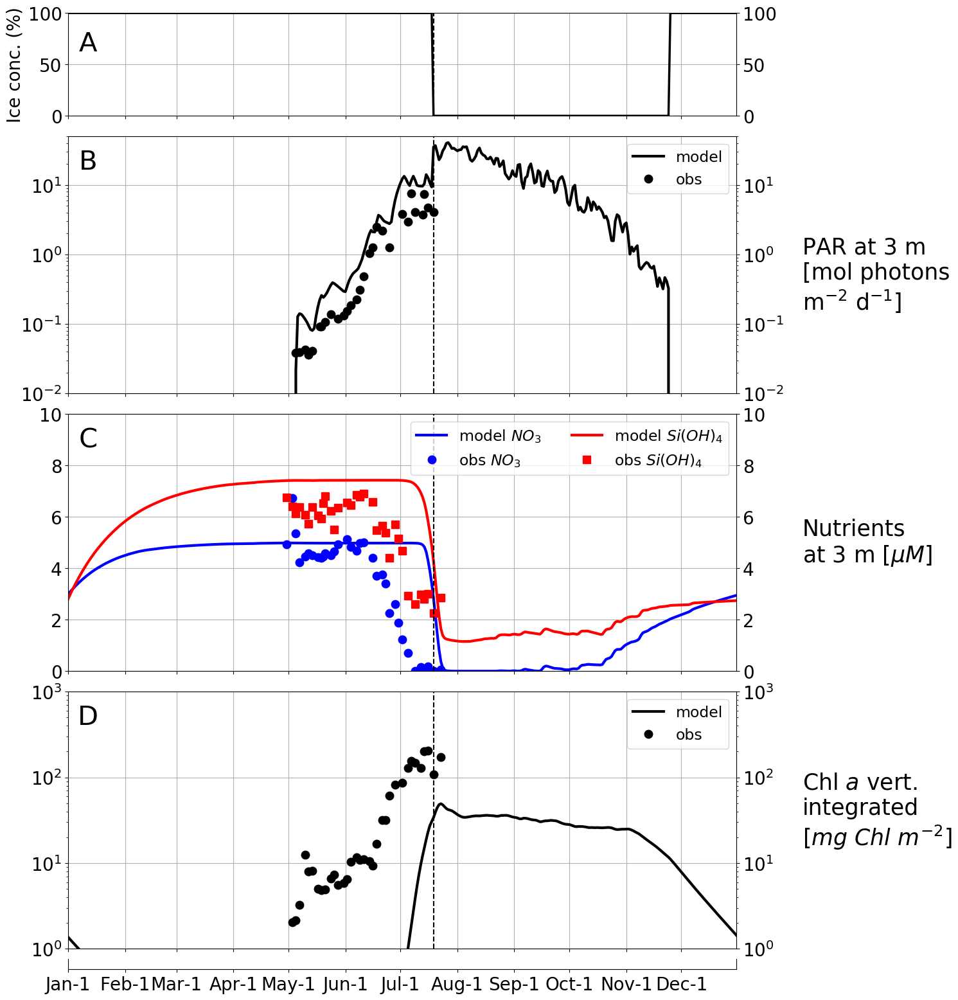

In [297]:
with plt.style.context('validation.mplstyle'):
    locs=np.array([0, 31, 59, 90, 120, 151,
                   181, 212, 243, 273, 304, 334])
    labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
            'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')

    fig,axs=plt.subplots(5,1,sharex=False,figsize=(16, 16))

    # --- ICE CONCENTRATIONS
    ax=axs[0]
    ax.plot(first_year,ice*100,'k-',lw=2.5)
    ax.set_xlim(first_year[0],first_year[-1])
    xlims=ax.get_xlim()
    ax.set_xticks(locs)
    ax.set_xticklabels([])
    ax.yaxis.tick_right()
    ax.yaxis.set_ticks_position('both')
    ax.set_ylabel('Ice conc. (%)')
    ax.tick_params(labelleft=True, labelright=True)
    ax.set_ylim(0,100)
    ax.grid()
    plt.text(0.03,0.7,'A',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, fontsize=30)
    # adding the vertical line at 15% of observed ice
    ax.axvline(iT15_start_obs,color='k',linestyle='--')

    # --- sfc PAR
    ax=axs[1]
    h1=ax.plot(first_year,array1d_iT_modPAR3m,'-',color='black',lw=3)
    ax.set_yscale('log')
    ax.set_xlim(xlims)
    ax.set_xticks(locs)
    ax.set_xticklabels([])
    ax.yaxis.tick_right()
    ax.yaxis.set_ticks_position('both')
    ax.tick_params(labelleft=True, labelright=True)
    ax.set_ylim(1E-2,50)
    ax.grid()
    ax.text(400,0.5,'PAR at 3 m\n[mol photons\nm$^{-2}$ d$^{-1}$]',
            horizontalalignment = 'left',
            verticalalignment = 'center',
            fontsize=25)
    plt.text(0.03,0.90,'B',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, fontsize=30)
    h2=ax.plot(first_year,array1d_iT_obsPAR3m,
               'o',color='black')
    ax.legend([h1[0],h2[0]],['model','obs'],loc=0, ncol=1)
    # adding the vertical line at 15% of observed ice
    ax.axvline(iT15_start_obs,color='k',linestyle='--')

    # --- sfc NO3 + sfc SiO2
    ax=axs[2]
    h1=ax.plot(first_year,array1d_iT_modnitrate3m,'-',color='blue',lw=3)
    ax.set_xlim(xlims)
    ax.set_xticks(locs)
    ax.set_xticklabels([])
    ax.yaxis.tick_right()
    ax.yaxis.set_ticks_position('both')
    ax.tick_params(labelleft=True, labelright=True)
    ax.set_ylim(0,10)
    ax.grid()
    ax.text(400,5,'Nutrients\nat 3 m [$\mu M$]',
            horizontalalignment = 'left',
            verticalalignment = 'center',
            fontsize=25)
    plt.text(0.03,0.90,'C',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, fontsize=30)
    h2=ax.plot(first_year,array1d_iT_silicicacid3m ,'-',color='red', lw=3)
    h3=ax.plot(first_year,array1d_iT_obsnitrate3m,
               'o',color='blue')
    h4=ax.plot(first_year,array1d_iT_obssilica3m ,
               's',color='red')
    ax.legend([h1[0],h3[0],
               h2[0],h4[0]],
              ['model $NO_3$','obs $NO_3$',
               'model $Si{(OH)}_4$','obs $Si{(OH)}_4$'],
              loc=1, ncol=2)
    # adding the vertical line at 15% of observed ice
    ax.axvline(iT15_start_obs,color='k',linestyle='--')

    # --- CHLOROPHYLL VINT (0-100m)
    ax=axs[3]
    h1=ax.plot(first_year,array1d_iT_modvintchl,'-',color='black',lw=3)
    ax.set_yscale('log')
    ax.set_xlim(xlims)
    ax.set_xticks(locs)
    ax.set_xticklabels([])
    ax.yaxis.tick_right()
    ax.yaxis.set_ticks_position('both')
    ax.tick_params(labelleft=True, labelright=True)
    ax.set_ylim(1E0,1E3)
    ax.grid()
    ax.text(400,40,'Chl $a$ vert.\nintegrated\n[$mg\ Chl\ m^{-2}$]',
            horizontalalignment = 'left',
            verticalalignment = 'center',
            fontsize=25)
    plt.text(0.03,0.90,'D',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, fontsize=30)
    h2=ax.plot(first_year,array1d_iT_obsvintchlHPLC,'o',color='black')
    ax.legend([h1[0],h2[0]],['model','obs'],loc=0, ncol=1)
    # adding the vertical line at 15% of observed ice
    ax.axvline(iT15_start_obs,color='k',linestyle='--')

    # --- ADDITIONAL X-AXIS
    ax=axs[4]
    ax.set_xlim(xlims)
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    ax.axes.get_yaxis().set_visible(False)
    ax.spines['top'].set_visible(False)

    # --- POSITION
    axs[0].set_position( [0.12,0.89  ,0.65,0.10])
    axs[1].set_position( [0.12,0.62  ,0.65,0.25])
    axs[2].set_position( [0.12,0.35  ,0.65,0.25])
    axs[3].set_position( [0.12,0.08  ,0.65,0.25])
    axs[4].set_position( [0.12,0.06  ,0.65,0.01])

    # --- SAVE
    plt.savefig('validation/GEic2016.one.year.PAR.nutrients.chl.png')

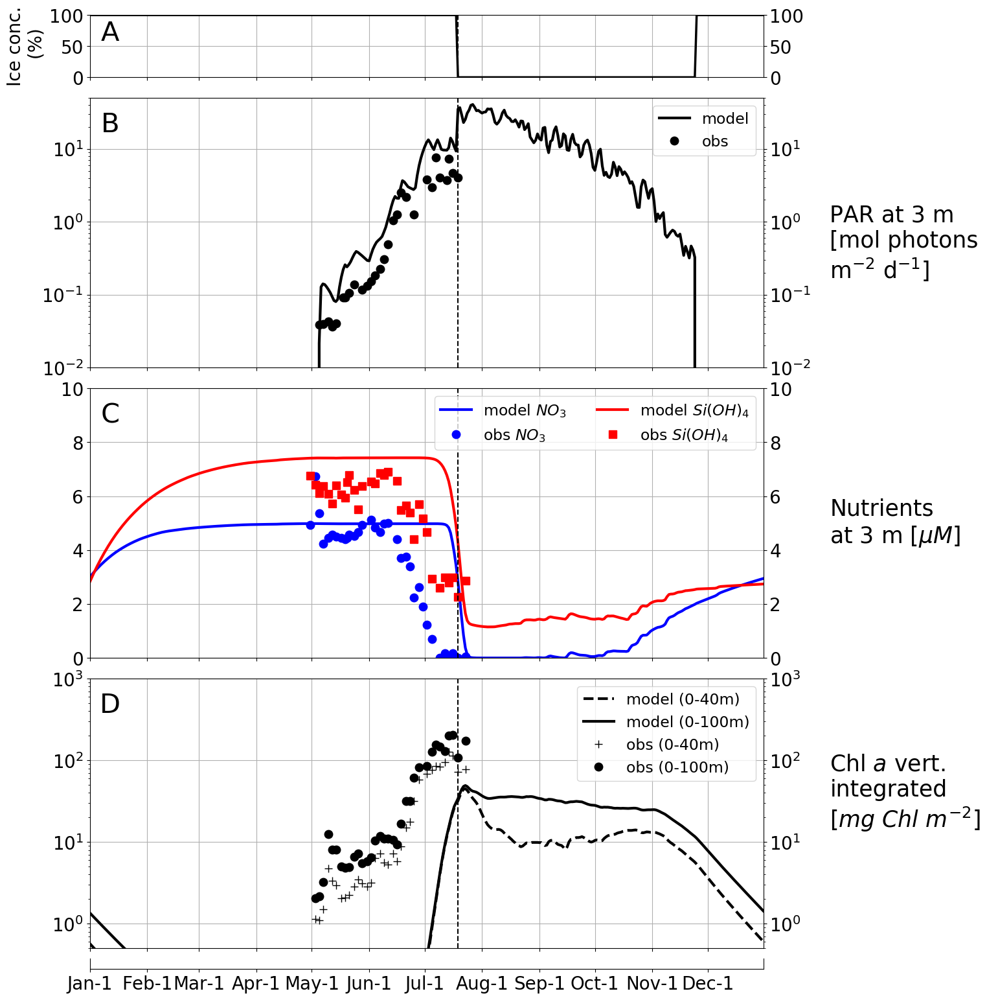

In [298]:
with plt.style.context('validation.mplstyle'):
    locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
    labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
            'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')
    fig,axs=plt.subplots(5,1,sharex=False,figsize=(16, 16))

    # --- ICE CONCENTRATIONS
    ax=axs[0]
    ax.plot(first_year,ice*100,'k-',lw=2.5)
    ax.set_xlim(first_year[0],first_year[-1])
    xlims=ax.get_xlim()
    ax.set_xticks(locs)
    ax.set_xticklabels([])
    ax.set_yticks([0,50,100])
    ax.yaxis.tick_right()
    ax.yaxis.set_ticks_position('both')
    ax.set_ylabel('Ice conc.\n (%)')
    ax.tick_params(labelleft=True, labelright=True)
    ax.set_ylim(0,100)
    ax.grid()
    plt.text(0.03,0.7,'A',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, fontsize=30)
    # adding the vertical line at 15% of observed ice
    ax.axvline(iT15_start_obs,color='k',linestyle='--')

    # --- sfc PAR
    ax=axs[1]
    h1=ax.plot(first_year,array1d_iT_modPAR3m,'-',color='black',lw=3)
    ax.set_yscale('log')
    ax.set_xlim(xlims)
    ax.set_xticks(locs)
    ax.set_xticklabels([])
    ax.yaxis.tick_right()
    ax.yaxis.set_ticks_position('both')
    ax.tick_params(labelleft=True, labelright=True)
    ax.set_ylim(1E-2,50)
    ax.grid()
    ax.text(400,0.5,'PAR at 3 m\n[mol photons\nm$^{-2}$ d$^{-1}$]',
            horizontalalignment = 'left',
            verticalalignment = 'center',
            fontsize=25)
    plt.text(0.03,0.90,'B',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, fontsize=30)
    h2=ax.plot(first_year,array1d_iT_obsPAR3m,
               'o',color='black')
    ax.legend([h1[0],h2[0]],['model','obs'],loc=0, ncol=1)
    # adding the vertical line at 15% of observed ice
    ax.axvline(iT15_start_obs,color='k',linestyle='--')

    # --- sfc NO3 + sfc SiO2
    ax=axs[2]
    h1=ax.plot(first_year,array1d_iT_modnitrate3m,'-',color='blue',lw=3)
    ax.set_xlim(xlims)
    ax.set_xticks(locs)
    ax.set_xticklabels([])
    ax.yaxis.tick_right()
    ax.yaxis.set_ticks_position('both')
    ax.tick_params(labelleft=True, labelright=True)
    ax.set_ylim(0,10)
    ax.grid()
    ax.text(400,5,'Nutrients\nat 3 m [$\mu M$]',
            horizontalalignment = 'left',
            verticalalignment = 'center',
            fontsize=25)
    plt.text(0.03,0.90,'C',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, fontsize=30)
    h2=ax.plot(first_year,array1d_iT_silicicacid3m ,'-',color='red', lw=3)
    h3=ax.plot(first_year,array1d_iT_obsnitrate3m,
               'o',color='blue')
    h4=ax.plot(first_year,array1d_iT_obssilica3m ,
               's',color='red')
    ax.legend([h1[0],h3[0],
               h2[0],h4[0]],
              ['model $NO_3$','obs $NO_3$',
               'model $Si{(OH)}_4$','obs $Si{(OH)}_4$'],
              loc=1, ncol=2)
    # adding the vertical line at 15% of observed ice
    ax.axvline(iT15_start_obs,color='k',linestyle='--')

    # --- CHLOROPHYLL VINT
    ax=axs[3]
    h1=ax.plot(first_year,array1d_iT_modvint40mchl,
               '--',lw=3,color='black',label='model (0-40m)')
    h2=ax.plot(first_year,array1d_iT_modvintchl,
               '-',color='black',lw=3,label='model (0-100m)')
    h3=ax.plot(first_year,array1d_iT_obsvint40mchlHPLC,
               '+',color='black',label='obs (0-40m)')
    h4=ax.plot(first_year,array1d_iT_obsvintchlHPLC,
               'o',color='black',label='obs (0-100m)')
    ax.set_yscale('log')
    ax.set_xlim(xlims)
    ax.set_xticks(locs)
    ax.set_xticklabels([])
    ax.yaxis.tick_right()
    ax.yaxis.set_ticks_position('both')
    ax.tick_params(labelleft=True, labelright=True)
    ax.set_ylim(0.5,1E3)
    ax.grid()
    ax.text(400,40,'Chl $a$ vert.\nintegrated\n[$mg\ Chl\ m^{-2}$]',
            horizontalalignment = 'left',
            verticalalignment = 'center',
            fontsize=25)
    plt.text(0.03,0.90,'D',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, fontsize=30)
    ax.legend()
    # adding the vertical line at 15% of observed ice
    ax.axvline(iT15_start_obs,color='k',linestyle='--')

    # --- ADDITIONAL X-AXIS
    ax=axs[4]
    ax.set_xlim(xlims)
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    ax.axes.get_yaxis().set_visible(False)
    ax.spines['top'].set_visible(False)

    # --- POSITION
    axs[0].set_position( [0.12,0.92  ,0.65,0.06])
    axs[1].set_position( [0.12,0.64  ,0.65,0.26])
    axs[2].set_position( [0.12,0.36  ,0.65,0.26])
    axs[3].set_position( [0.12,0.08  ,0.65,0.26])
    axs[4].set_position( [0.12,0.06  ,0.65,0.01])

    # --- SAVE
    plt.savefig('validation/GEic2016.one.year.PAR.nutrients.chl40m100m.png')

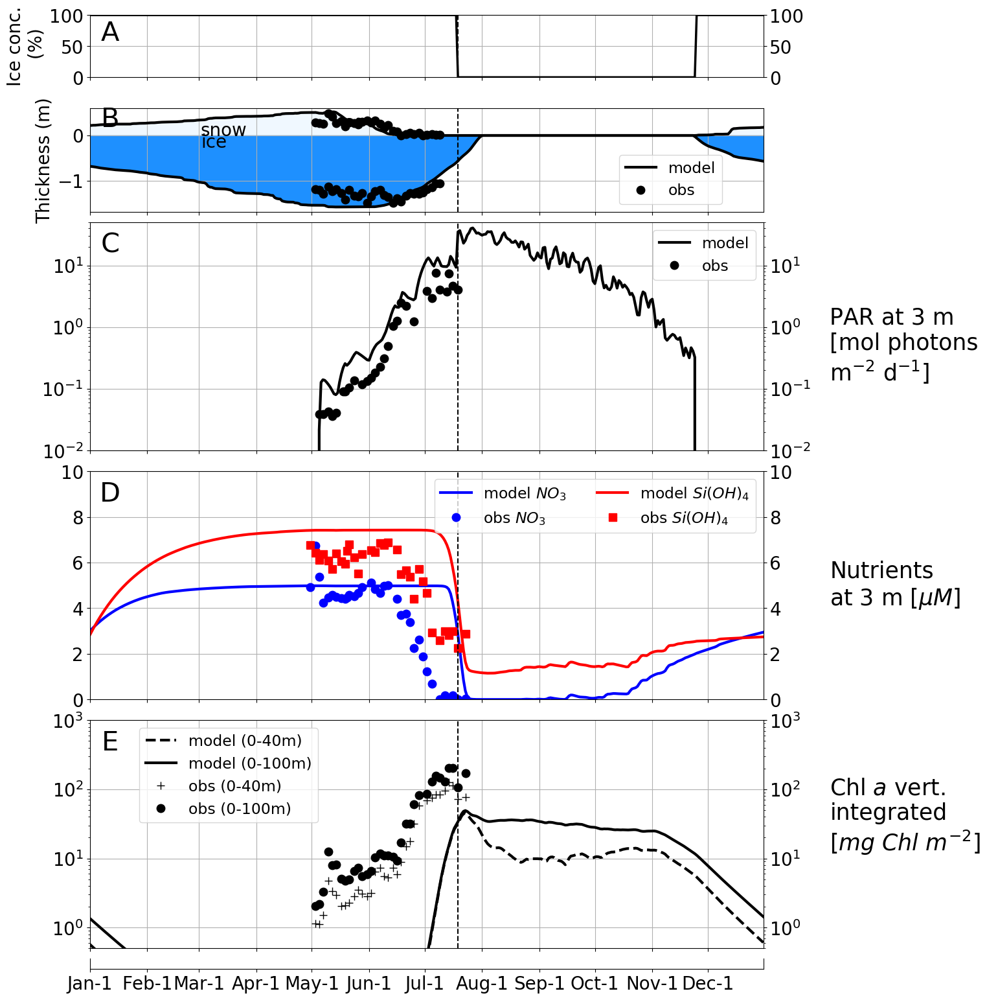

In [299]:
with plt.style.context('validation.mplstyle'):
    locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
    labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
            'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')
    fig,axs=plt.subplots(6,1,sharex=False,figsize=(16, 16))

    # --- ICE CONCENTRATIONS
    ax=axs[0]
    ax.plot(first_year,ice*100,'k-',lw=2.5)
    ax.set_xlim(first_year[0],first_year[-1])
    xlims=ax.get_xlim()
    ax.set_xticks(locs)
    ax.set_xticklabels([])
    ax.set_yticks([0,50,100])
    ax.yaxis.tick_right()
    ax.yaxis.set_ticks_position('both')
    ax.set_ylabel('Ice conc.\n (%)')
    ax.tick_params(labelleft=True, labelright=True)
    ax.set_ylim(0,100)
    ax.grid()
    plt.text(0.03,0.7,'A',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, fontsize=30)
    # adding the vertical line at 15% of observed ice
    ax.axvline(iT15_start_obs,color='k',linestyle='--')

    # --- SNOW AND ICE THICKNESS
    ax=axs[1]
    h1=ax.fill_between(first_year,array1d_iT_snow_volume,
                       linestyle='-',color='aliceblue',linewidth=1)
    h2=ax.plot(first_year,array1d_iT_snow_volume,
               linestyle='-',color='black',lw=3)
    h3=ax.plot((snow_thickness_df['doy']-1).to_numpy(),
              snow_thickness_df['sample_thickness_m_average'].to_numpy(),
              'o',color='black',markersize=9)
    ax.set_xlim(xlims)
    ax.set_xticks(locs)
    ax.set_xticklabels([])
    ax.set_ylabel('Thickness (m)')
    ax.set_ylim(-1.7,0.6)
    ax.grid()
    ax.text(60,0.1,'snow',
            horizontalalignment = 'left',verticalalignment = 'center',
            fontsize=20)
    h4=ax.fill_between(first_year,-array1d_iT_ice_volume,
                       linestyle='-',color='dodgerblue',linewidth=1)
    h5=ax.plot(first_year,-array1d_iT_ice_volume,
               linestyle='-',color='black',lw=3)
    h6=ax.plot((ice_thickness_df['doy']-1).to_numpy(),
              -ice_thickness_df['sample_thickness_m_average'].to_numpy(),
              'o',color='black',markersize=9)
    ax.text(60,-0.15,'ice',
            horizontalalignment = 'left',verticalalignment = 'center',
            fontsize=20)
    ax.legend([h2[0],h3[0]],['model','obs'],loc=4,
              bbox_to_anchor=(0.95,0.00))
    plt.text(0.03,0.89,'B',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, fontsize=30)
    # adding the vertical line at 15% of observed ice
    ax.axvline(iT15_start_obs,linestyle='--',color='black')

    # --- sfc PAR
    ax=axs[2]
    h1=ax.plot(first_year,array1d_iT_modPAR3m,'-',color='black',lw=3)
    ax.set_yscale('log')
    ax.set_xlim(xlims)
    ax.set_xticks(locs)
    ax.set_xticklabels([])
    ax.yaxis.tick_right()
    ax.yaxis.set_ticks_position('both')
    ax.tick_params(labelleft=True, labelright=True)
    ax.set_ylim(1E-2,50)
    ax.grid()
    ax.text(400,0.5,'PAR at 3 m\n[mol photons\nm$^{-2}$ d$^{-1}$]',
            horizontalalignment = 'left',
            verticalalignment = 'center',
            fontsize=25)
    plt.text(0.03,0.90,'C',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, fontsize=30)
    h2=ax.plot(first_year,array1d_iT_obsPAR3m,
               'o',color='black')
    ax.legend([h1[0],h2[0]],['model','obs'],loc=0, ncol=1)
    # adding the vertical line at 15% of observed ice
    ax.axvline(iT15_start_obs,color='k',linestyle='--')

    # --- sfc NO3 + sfc SiO2
    ax=axs[3]
    h1=ax.plot(first_year,array1d_iT_modnitrate3m,'-',color='blue',lw=3)
    ax.set_xlim(xlims)
    ax.set_xticks(locs)
    ax.set_xticklabels([])
    ax.yaxis.tick_right()
    ax.yaxis.set_ticks_position('both')
    ax.tick_params(labelleft=True, labelright=True)
    ax.set_ylim(0,10)
    ax.grid()
    ax.text(400,5,'Nutrients\nat 3 m [$\mu M$]',
            horizontalalignment = 'left',
            verticalalignment = 'center',
            fontsize=25)
    plt.text(0.03,0.90,'D',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, fontsize=30)
    h2=ax.plot(first_year,array1d_iT_silicicacid3m ,'-',color='red', lw=3)
    h3=ax.plot(first_year,array1d_iT_obsnitrate3m,
               'o',color='blue')
    h4=ax.plot(first_year,array1d_iT_obssilica3m ,
               's',color='red')
    ax.legend([h1[0],h3[0],
               h2[0],h4[0]],
              ['model $NO_3$','obs $NO_3$',
               'model $Si{(OH)}_4$','obs $Si{(OH)}_4$'],
              loc=1, ncol=2)
    # adding the vertical line at 15% of observed ice
    ax.axvline(iT15_start_obs,color='k',linestyle='--')

    # --- CHLOROPHYLL VINT
    ax=axs[4]
    h1=ax.plot(first_year,array1d_iT_modvint40mchl,
               '--',lw=3,color='black',label='model (0-40m)')
    h2=ax.plot(first_year,array1d_iT_modvintchl,
               '-',color='black',lw=3,label='model (0-100m)')
    h3=ax.plot(first_year,array1d_iT_obsvint40mchlHPLC,
               '+',color='black',label='obs (0-40m)')
    h4=ax.plot(first_year,array1d_iT_obsvintchlHPLC,
               'o',color='black',label='obs (0-100m)')
    ax.set_yscale('log')
    ax.set_xlim(xlims)
    ax.set_xticks(locs)
    ax.set_xticklabels([])
    ax.yaxis.tick_right()
    ax.yaxis.set_ticks_position('both')
    ax.tick_params(labelleft=True, labelright=True)
    ax.set_ylim(0.5,1E3)
    ax.grid()
    ax.text(400,40,'Chl $a$ vert.\nintegrated\n[$mg\ Chl\ m^{-2}$]',
            horizontalalignment = 'left',
            verticalalignment = 'center',
            fontsize=25)
    plt.text(0.03,0.90,'E',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, fontsize=30)
    ax.legend(bbox_to_anchor=(0.35,1.00))
    # adding the vertical line at 15% of observed ice
    ax.axvline(iT15_start_obs,color='k',linestyle='--')

    # --- ADDITIONAL X-AXIS
    ax=axs[5]
    ax.set_xlim(xlims)
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    ax.axes.get_yaxis().set_visible(False)
    ax.spines['top'].set_visible(False)

    # --- POSITION
    axs[0].set_position( [0.12,0.92  ,0.65,0.06])
    axs[1].set_position( [0.12,0.79  ,0.65,0.10])
    axs[2].set_position( [0.12,0.56  ,0.65,0.22])
    axs[3].set_position( [0.12,0.32  ,0.65,0.22])
    axs[4].set_position( [0.12,0.08  ,0.65,0.22])
    axs[5].set_position( [0.12,0.06  ,0.65,0.01])

    # --- SAVE
    plt.savefig('validation/GEic2016.one.year.sic.volume.PAR.nutrients.chl40m100m.png')

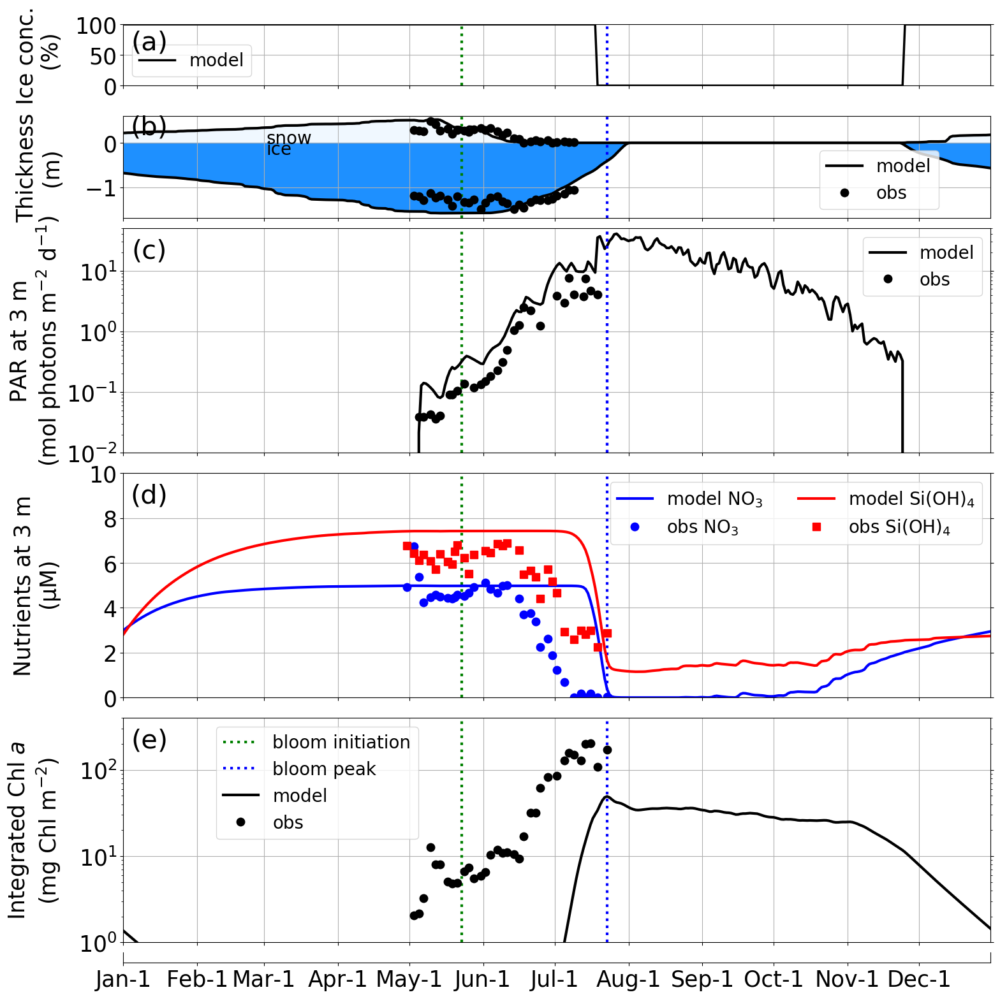

In [300]:
def make_plots(axs):
    box=dict(pad=5,alpha=0)
    locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
    labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
            'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')

    # --- ICE CONCENTRATIONS
    ax=axs[0]
    # adding the vertical line at start of bloom development
    ax.axvline(date_initiation,color='green',linestyle=':')
    # adding a vertical line at the bloom peak
    ax.axvline(date_peak,color='b',linestyle=':')
    # adding the vertical line at 15% of observed ice
#     ax.axvline(iT15_start_obs,color='k',linestyle='--')
    ax.plot(first_year,ice*100,'k-',lw=2.5,label='model')
    ax.set_xlim(first_year[0],first_year[-1])
    xlims=ax.get_xlim()
    ax.set_xticks(locs)
    ax.set_xticklabels([])
    ax.yaxis.set_ticks_position('both')
    ax.set_ylabel('Ice conc.\n (%)',bbox=box)
    ax.set_ylim(0,100)
    ax.grid()
    ax.legend(loc='lower left')
    plt.text(0.03,0.7,'(a)',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, fontsize=30)

    # --- SNOW AND ICE THICKNESS
    ax=axs[1]
    # adding the vertical line at start of bloom development
    ax.axvline(date_initiation,color='green',linestyle=':',
               label='bloom initiation')
    # adding a vertical line at the bloom peak
    ax.axvline(date_peak,color='b',linestyle=':',
               label='bloom peak')
    # adding the vertical line at 15% of observed ice
#     ax.axvline(iT15_start_obs,color='k',linestyle='--')
    h1=ax.fill_between(first_year,array1d_iT_snow_volume,
                       linestyle='-',color='aliceblue',linewidth=1)
    h2=ax.plot(first_year,array1d_iT_snow_volume,
               linestyle='-',color='black',lw=3)
    h3=ax.plot((snow_thickness_df['doy']-1).to_numpy(),
              snow_thickness_df['sample_thickness_m_average'].to_numpy(),
              'o',color='black',markersize=9)
    ax.set_xlim(xlims)
    ax.set_xticks(locs)
    ax.set_xticklabels([])
    ax.set_ylabel('Thickness\n(m)',bbox=box)
    ax.set_ylim(-1.7,0.6)
    ax.grid()
    ax.text(60,0.1,'snow',
            horizontalalignment = 'left',verticalalignment = 'center',
            fontsize=20)
    h4=ax.fill_between(first_year,-array1d_iT_ice_volume,
                       linestyle='-',color='dodgerblue',linewidth=1)
    h5=ax.plot(first_year,-array1d_iT_ice_volume,
               linestyle='-',color='black',lw=3)
    h6=ax.plot((ice_thickness_df['doy']-1).to_numpy(),
              -ice_thickness_df['sample_thickness_m_average'].to_numpy(),
              'o',color='black',markersize=9)
    ax.text(60,-0.15,'ice',
            horizontalalignment = 'left',verticalalignment = 'center',
            fontsize=20)
    ax.legend([h2[0],h3[0]],['model','obs'],loc=4,
              bbox_to_anchor=(0.95,0.00))
    plt.text(0.03,0.89,'(b)',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, fontsize=30)

    # --- sfc PAR
    ax=axs[2]
    # adding the vertical line at start of bloom development
    ax.axvline(date_initiation,color='green',linestyle=':',
               label='bloom initiation')
    # adding a vertical line at the bloom peak
    ax.axvline(date_peak,color='b',linestyle=':',
               label='bloom peak')
    # adding the vertical line at 15% of observed ice
#     ax.axvline(iT15_start_obs,color='k',linestyle='--')
    h1=ax.plot(first_year,array1d_iT_modPAR3m,'-',color='black',lw=3)
    ax.set_yscale('log')
    ax.set_xlim(xlims)
    ax.set_xticks(locs)
    ax.set_xticklabels([])
    ax.set_ylabel('PAR at 3 m\n(mol photons m$^{-2}$ d$^{-1}$)',bbox=box)
    ax.yaxis.set_ticks_position('both')
    ax.set_ylim(1E-2,50)
    ax.grid()
    plt.text(0.03,0.90,'(c)',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, fontsize=30)
    h2=ax.plot(first_year,array1d_iT_obsPAR3m,
               'o',color='black')
    ax.legend([h1[0],h2[0]],['model','obs'],loc=0, ncol=1)
    # adding a vertical line at the bloom peak
    ax.axvline(date_peak,color='b',linestyle=':',
               label='bloom peak')
    # adding the vertical line at 15% of observed ice
#     ax.axvline(iT15_start_obs,color='k',linestyle='--')

    # --- sfc NO3 + sfc SiO2
    ax=axs[3]
    # adding the vertical line at start of bloom development
    ax.axvline(date_initiation,color='green',linestyle=':',
               label='bloom initiation')
    # adding a vertical line at the bloom peak
    ax.axvline(date_peak,color='b',linestyle=':',
               label='bloom peak')
    # adding the vertical line at 15% of observed ice
#     ax.axvline(iT15_start_obs,color='k',linestyle='--')
    h1=ax.plot(first_year,array1d_iT_modnitrate3m,'-',color='blue',lw=3)
    ax.set_xlim(xlims)
    ax.set_xticks(locs)
    ax.set_xticklabels([])
    ax.set_ylabel('Nutrients at 3 m\n($\mathrm{ \mu M }$)',bbox=box)
    ax.yaxis.set_ticks_position('both')
    ax.set_ylim(0,10)
    ax.grid()
    plt.text(0.03,0.90,'(d)',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, fontsize=30)
    h2=ax.plot(first_year,array1d_iT_silicicacid3m ,'-',color='red', lw=3)
    h3=ax.plot(first_year,array1d_iT_obsnitrate3m,
               'o',color='blue')
    h4=ax.plot(first_year,array1d_iT_obssilica3m ,
               's',color='red')
    ax.legend([h1[0],h3[0],
               h2[0],h4[0]],
              ['model $\mathrm{ NO_3 }$','obs $\mathrm{ NO_3 }$',
               'model $\mathrm{ Si{(OH)}_4 }$','obs $\mathrm{ Si{(OH)}_4 }$'],
              loc=1, ncol=2)

    # --- CHLOROPHYLL VINT
    ax=axs[4]
    # adding the vertical line at start of bloom development
    ax.axvline(date_initiation,color='green',linestyle=':',
               label='bloom initiation')
    # adding a vertical line at the bloom peak
    ax.axvline(date_peak,color='b',linestyle=':',
               label='bloom peak')
    # adding the vertical line at 15% of observed ice
#     ax.axvline(iT15_start_obs,color='k',linestyle='--')
    h2=ax.plot(first_year,array1d_iT_modvintchl,
               '-',color='black',lw=3,label='model')
    h4=ax.plot(first_year,array1d_iT_obsvintchlHPLC,
               'o',color='black',label='obs')
    ax.set_yscale('log')
    ax.set_xlim(xlims)
    ax.set_xticks(locs)
    ax.set_xticklabels([])
    ax.set_ylabel('Integrated Chl $a$\n($\mathrm{ mg\ Chl\ m^{-2} }$)',
                  bbox=box)
    ax.yaxis.set_ticks_position('both')
    ax.set_ylim(1,4E2)
    ax.grid()
    plt.text(0.03,0.90,'(e)',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, fontsize=30)
    ax.legend(bbox_to_anchor=(0.35,1.00))

    # --- ADDITIONAL X-AXIS
    ax=axs[5]
    ax.set_xlim(xlims)
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    ax.axes.get_yaxis().set_visible(False)
    ax.spines['top'].set_visible(False)

    # --- POSITION
    axs[0].set_position( [0.12,0.92  ,0.85,0.06])
    axs[1].set_position( [0.12,0.79  ,0.85,0.10])
    axs[2].set_position( [0.12,0.56  ,0.85,0.22])
    axs[3].set_position( [0.12,0.32  ,0.85,0.22])
    axs[4].set_position( [0.12,0.08  ,0.85,0.22])
    axs[5].set_position( [0.12,0.06  ,0.85,0.01])

with plt.style.context('many_rows_one_col.mplstyle'):
    # Plot
    fig,axs=plt.subplots(6,1,sharex=False,figsize=(16,16))
    make_plots(axs)
    fig.align_ylabels(axs[:])

    # --- SAVE
    plt.savefig('validation/GEic2016.one.year.sic.volume.PAR.nutrients.chl100m.png')

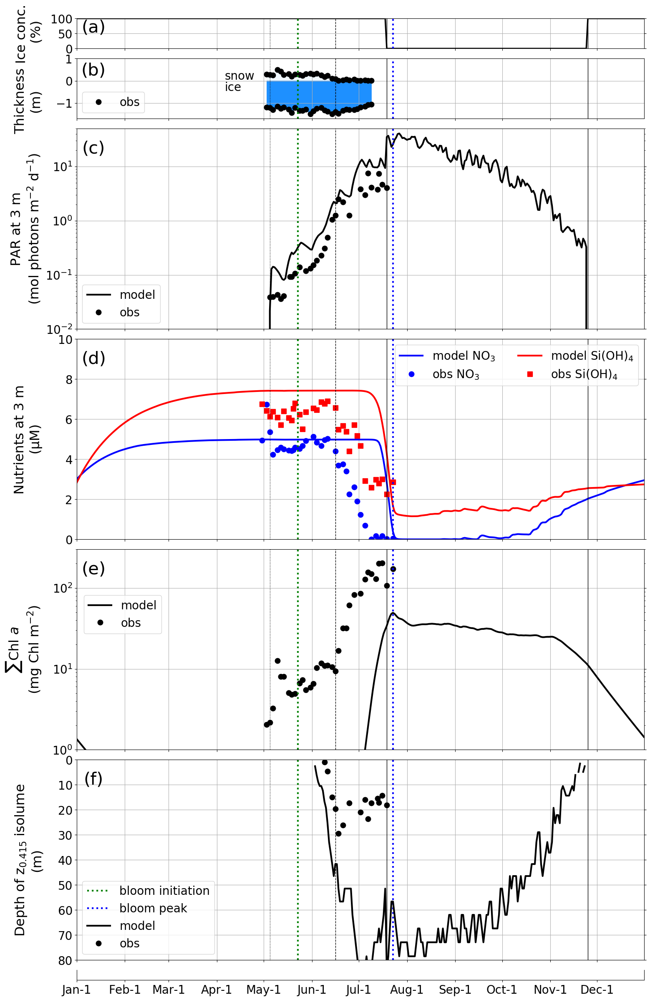

In [301]:
def make_plots(axs):
    box=dict(pad=5,alpha=0)
    locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
    labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
            'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')
    
    # --- ICE CONCENTRATIONS
    ax=axs[0]
    h1=ax.plot(first_year,ice*100,'k-',lw=2.5)
    ax.set_xlim(first_year[0],first_year[-1])
    xlims=ax.get_xlim()
    ax.set_xticks(locs)
    ax.set_xticklabels([])
    ax.set_yticks([0,50,100])
    ax.yaxis.set_ticks_position('both')
    ax.set_ylabel('Ice conc.\n (%)',bbox=box)
    ax.set_ylim(0,100)
    ax.grid()
    plt.text(0.03,0.7,'(a)',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, fontsize=30)
    ax.axvline(first_obs_PAR,color='black',linewidth=1,linestyle=':')
    ax.axvline(obs_nosnow,color='black',linewidth=1,linestyle='--')
    ax.axvline(obs_breakup,color='black',linewidth=1,linestyle='-')
    ax.axvline(sim_freezeup,color='black',linewidth=1,linestyle='-')
    ax.axvline(date_initiation,color='green',linestyle=':',
               label='bloom initiation')
    ax.axvline(date_peak,color='b',linestyle=':',
               label='bloom peak')

    # --- SNOW AND ICE THICKNESS
    ax=axs[1]
    xsnow=(snow_thickness_df['doy']-1).to_numpy()
    ysnow=snow_thickness_df['sample_thickness_m_average'].to_numpy()
    h1=ax.plot(xsnow,ysnow,
               'o',color='black',label='obs')
    xsnow_to_fill=np.arange(xsnow[0],xsnow[-1]+1)
    ysnow_to_fill=np.interp(xsnow_to_fill,xsnow,ysnow)
    h2=ax.fill_between(xsnow_to_fill,ysnow_to_fill,
                       linestyle='-',color='aliceblue')
    ax.set_xlim(xlims)
    ax.set_xticks(locs)
    ax.set_xticklabels([])
    ax.set_ylabel('Thickness\n(m)',bbox=box)
    mpl.axis.Axis.set_label_coords(ax.yaxis,-0.061,0.3)
    ax.set_ylim(-1.7,1.0)
    ax.grid()
    ax.text(95,0.2,'snow',
            horizontalalignment = 'left',verticalalignment = 'center',
            fontsize=20)
    xice=(ice_thickness_df['doy']-1).to_numpy()
    yice=-ice_thickness_df['sample_thickness_m_average'].to_numpy()
    h3=ax.plot(xice,yice,'o',color='black')
    xice_to_fill=np.arange(xice[0],xice[-1]+1)
    yice_to_fill=np.interp(xice_to_fill,xice,yice)
    h4=ax.fill_between(xice_to_fill,yice_to_fill,
                       linestyle='-',color='dodgerblue')
    ax.text(95,-0.30,'ice',
            horizontalalignment = 'left',verticalalignment = 'center',
            fontsize=20)
    ax.legend(loc='lower left')
    plt.text(0.03,0.80,'(b)',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, fontsize=30)
    ax.axvline(first_obs_PAR,color='black',linewidth=1,linestyle=':')
    ax.axvline(obs_nosnow,color='black',linewidth=1,linestyle='--')
    ax.axvline(obs_breakup,color='black',linewidth=1,linestyle='-')
    ax.axvline(sim_freezeup,color='black',linewidth=1,linestyle='-')
    ax.axvline(date_initiation,color='green',linestyle=':',
               label='bloom initiation')
    ax.axvline(date_peak,color='b',linestyle=':',
               label='bloom peak')

    # --- sfc PAR
    ax=axs[2]
    h1=ax.plot(first_year,array1d_iT_modPAR3m,
               '-',color='black',label='model')
    ax.set_yscale('log')
    ax.set_xlim(xlims)
    ax.set_xticks(locs)
    ax.set_xticklabels([])
    ax.set_ylabel('PAR at 3 m\n(mol photons m$^{-2}$ d$^{-1})$',bbox=box)
    ax.yaxis.set_ticks_position('both')
    ax.set_ylim(1E-2,50)
    ax.grid()
    plt.text(0.03,0.90,'(c)',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, fontsize=30)
    h2=ax.plot(first_year,array1d_iT_obsPAR3m,
               'o',color='black',label='obs')
    ax.legend(loc='lower left')
    ax.axvline(first_obs_PAR,color='black',linewidth=1,linestyle=':')
    ax.axvline(obs_nosnow,color='black',linewidth=1,linestyle='--')
    ax.axvline(obs_breakup,color='black',linewidth=1,linestyle='-')
    ax.axvline(sim_freezeup,color='black',linewidth=1,linestyle='-')
    ax.axvline(date_initiation,color='green',linestyle=':',
               label='bloom initiation')
    ax.axvline(date_peak,color='b',linestyle=':',
               label='bloom peak')

    # --- sfc NO3 + sfc SiO2
    ax=axs[3]
    h1=ax.plot(first_year,array1d_iT_modnitrate3m,'-',color='blue')
    ax.set_xlim(xlims)
    ax.set_xticks(locs)
    ax.set_xticklabels([])
    ax.set_ylabel('Nutrients at 3 m\n($\mathrm{ \mu M }$)',bbox=box)
    ax.yaxis.set_ticks_position('both')
    ax.set_ylim(0,10)
    ax.grid()
    plt.text(0.03,0.90,'(d)',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, fontsize=30)
    h2=ax.plot(first_year,array1d_iT_silicicacid3m ,'-',color='red')
    h3=ax.plot(first_year,array1d_iT_obsnitrate3m,
               'o',color='blue')
    h4=ax.plot(first_year,array1d_iT_obssilica3m ,
               's',color='red')
    ax.legend([h1[0],h3[0],
               h2[0],h4[0]],
              ['model $\mathrm{ NO_3 }$','obs $\mathrm{ NO_3 }$',
               'model $\mathrm{ Si{(OH)}_4 }$','obs $\mathrm{ Si{(OH)}_4 }$'],
              loc=1, ncol=2)
    ax.axvline(first_obs_PAR,color='black',linewidth=1,linestyle=':')
    ax.axvline(obs_nosnow,color='black',linewidth=1,linestyle='--')
    ax.axvline(obs_breakup,color='black',linewidth=1,linestyle='-')
    ax.axvline(sim_freezeup,color='black',linewidth=1,linestyle='-')
    ax.axvline(date_initiation,color='green',linestyle=':',
               label='bloom initiation')
    ax.axvline(date_peak,color='b',linestyle=':',
               label='bloom peak')

    # --- CHLOROPHYLL VINT
    ax=axs[4]
    h2=ax.plot(first_year,array1d_iT_modvintchl,
               '-',color='black',lw=3,label='model')
    h4=ax.plot(first_year,array1d_iT_obsvintchlHPLC,
               'o',color='black',label='obs')
    ax.set_yscale('log')
    ax.set_xlim(xlims)
    ax.set_xticks(locs)
    ax.set_xticklabels([])
    ax.set_ylabel('$\mathrm{ \sum{} Chl\ }a$\n'
                  '($\mathrm{ mg\ Chl\ m^{-2} }$)',
                  bbox=box)
    ax.yaxis.set_ticks_position('both')
    ax.set_ylim(1,300)
    ax.grid()
    plt.text(0.03,0.90,'(e)',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, fontsize=30)
    ax.legend(bbox_to_anchor=(0.16,0.80))
    ax.axvline(first_obs_PAR,color='black',linewidth=1,linestyle=':')
    ax.axvline(obs_nosnow,color='black',linewidth=1,linestyle='--')
    ax.axvline(obs_breakup,color='black',linewidth=1,linestyle='-')
    ax.axvline(sim_freezeup,color='black',linewidth=1,linestyle='-')
    ax.axvline(date_initiation,color='green',linestyle=':',
               label='bloom initiation')
    ax.axvline(date_peak,color='b',linestyle=':',
               label='bloom peak')
    
    # -- ISOLUME
    ax=axs[5]
    ax.axvline(date_initiation,color='green',linestyle=':',
               label='bloom initiation')
    ax.axvline(date_peak,color='b',linestyle=':',
               label='bloom peak')
    h1=ax.plot(first_year,
               -array1d_iT_modisolume,
               '-',
               color='black',
               label='model')
    h2=ax.plot(first_year,
               -array1d_iT_obsisolume,
               'o',
               color='black',
               label='obs')
    ax.set_xlim(xlims)
    ax.set_xticks(locs)
    ax.set_xticklabels([])
    ax.set_ylabel('Depth of $\mathrm{ z_{0.415}\ isolume }$\n(m)',
                  bbox=box)
    ax.yaxis.set_ticks_position('both')
    ax.set_ylim(0,80)
    ax.invert_yaxis()
    ax.grid()
    plt.text(0.03,0.90,'(f)',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, fontsize=30)
    ax.axvline(first_obs_PAR,color='black',linewidth=1,linestyle=':')
    ax.axvline(obs_nosnow,color='black',linewidth=1,linestyle='--')
    ax.axvline(obs_breakup,color='black',linewidth=1,linestyle='-')
    ax.axvline(sim_freezeup,color='black',linewidth=1,linestyle='-')
    ax.legend(loc=3)

    # --- ADDITIONAL X-AXIS
    ax=axs[6]
    ax.set_xlim(xlims)
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    ax.axes.get_yaxis().set_visible(False)
    ax.spines['top'].set_visible(False)

    # --- POSITION
    axs[0].set_position( [0.13,0.95  ,0.85,0.03])
    axs[1].set_position( [0.13,0.88  ,0.85,0.06])
    axs[2].set_position( [0.13,0.67  ,0.85,0.20])
    axs[3].set_position( [0.13,0.46  ,0.85,0.20])
    axs[4].set_position( [0.13,0.25  ,0.85,0.20])
    axs[5].set_position( [0.13,0.04  ,0.85,0.20])
    axs[6].set_position( [0.13,0.02  ,0.85,0.01])

with plt.style.context('GEic2016.sic.mplstyle'):    
    # Plot
    fig,axs=plt.subplots(7,1,sharex=False,figsize=(16, 24))
    make_plots(axs)
    fig.align_ylabels(axs[:])

    # --- SAVE
    plt.savefig('validation/GEic2016.sic.thickness.PAR.nutrients.chl100m.isolume.png')

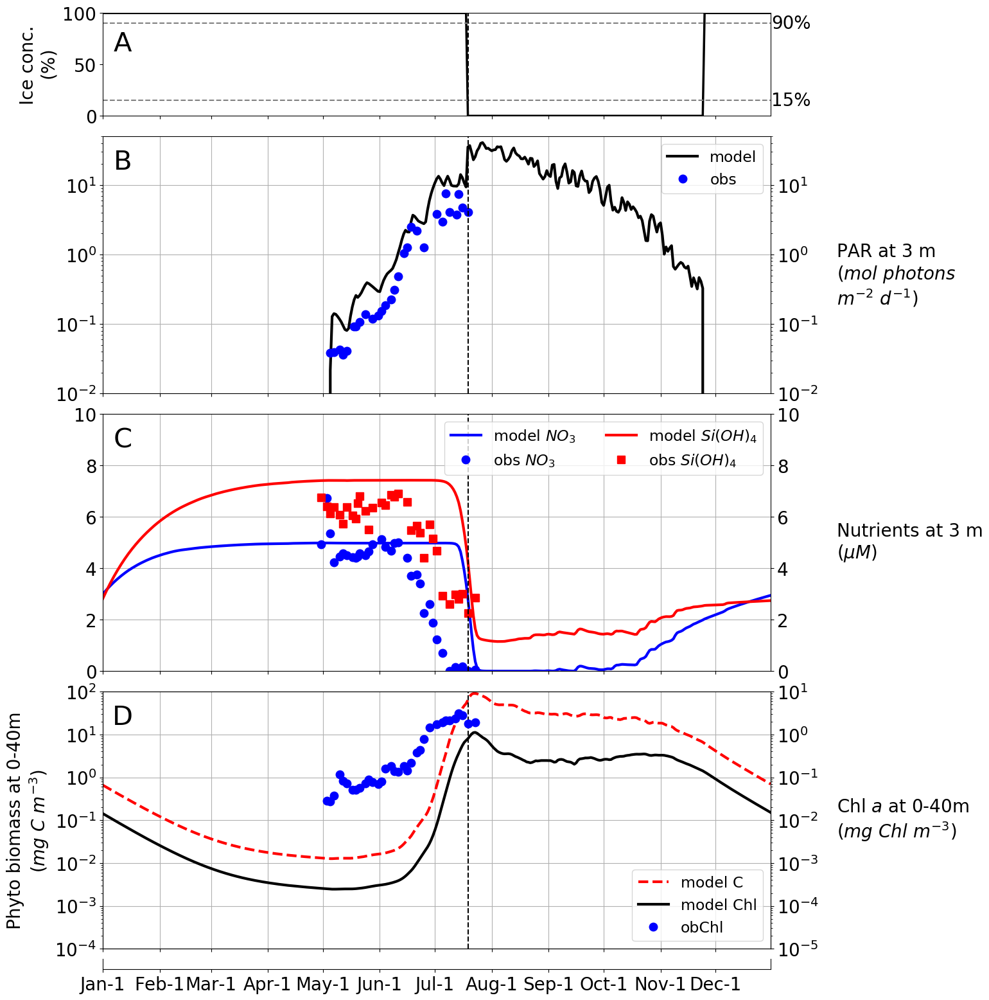

In [302]:
with plt.style.context('validation.mplstyle'):
    locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
    labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
            'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')

    fig,axs=plt.subplots(5,1,sharex=False,figsize=(16, 16))

    # --- ICE CONCENTRATIONS
    ax=axs[0]
    ax.plot(first_year,ice*100,'k-',lw=2.5)
    ax.set_xlim(first_year[0],first_year[-1])
    xlims=ax.get_xlim()
    ax.set_xticks(locs)
    ax.set_xticklabels([])
    ax.set_ylabel('Ice conc.\n($\%$)')
    ax.set_ylim(0,100)
    ax.plot(xlims,[15,15],'k--',color='gray')
    ax.plot(xlims,[90,90],'k--',color='gray')
    ax.text(xlims[1]+.5,15,'15%',
            verticalalignment='center',fontsize=20)
    ax.text(xlims[1]+.5,90,'90%',
            verticalalignment='center',fontsize=20)
    plt.text(0.03,0.7,'A',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, fontsize=30)
    # adding the vertical line at 15% of observed ice
    ax.axvline(iT15_start_obs,color='k',linestyle='--')

    # --- sfc PAR
    ax=axs[1]
    h1=ax.plot(first_year,array1d_iT_modPAR3m,'-',color='black',lw=3)
    ax.set_yscale('log')
    ax.set_xlim(xlims)
    ax.set_xticks(locs)
    ax.set_xticklabels([])
    ax.yaxis.tick_right()
    ax.yaxis.set_ticks_position('both')
    ax.tick_params(labelleft=True, labelright=True)
    ax.set_ylim(1E-2,50)
    ax.grid()
    ax.text(400,0.5,'PAR at 3 m\n($mol\ photons$\n$m^{-2}\ d^{-1}$)',
            horizontalalignment = 'left',
            verticalalignment = 'center',
            fontsize=20)
    plt.text(0.03,0.90,'B',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, fontsize=30)
    h2=ax.plot(first_year,array1d_iT_obsPAR3m,
               'o',color='blue')
    ax.legend([h1[0],h2[0]],['model','obs'],loc=0, ncol=1)
    # adding the vertical line at 15% of observed ice
    ax.axvline(iT15_start_obs,color='k',linestyle='--')

    # --- sfc NO3 + sfc SiO2
    ax=axs[2]
    h1=ax.plot(first_year,array1d_iT_modnitrate3m,'-',color='blue',lw=3)
    ax.set_xlim(xlims)
    ax.set_xticks(locs)
    ax.set_xticklabels([])
    ax.yaxis.tick_right()
    ax.yaxis.set_ticks_position('both')
    ax.tick_params(labelleft=True, labelright=True)
    ax.set_ylim(0,10)
    ax.grid()
    ax.text(400,5,'Nutrients at 3 m\n($\mu M$)',
            horizontalalignment = 'left',
            verticalalignment = 'center',
            fontsize=20)
    plt.text(0.03,0.90,'C',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, fontsize=30)
    h2=ax.plot(first_year,array1d_iT_silicicacid3m ,'-',color='red', lw=3)
    h3=ax.plot(first_year,array1d_iT_obsnitrate3m,
               'o',color='blue')
    h4=ax.plot(first_year,array1d_iT_obssilica3m ,
               's',color='red')
    ax.legend([h1[0],h3[0],
               h2[0],h4[0]],
              ['model $NO_3$','obs $NO_3$',
               'model $Si{(OH)}_4$','obs $Si{(OH)}_4$'],
              loc=1, ncol=2)
    # adding the vertical line at 15% of observed ice
    ax.axvline(iT15_start_obs,color='k',linestyle='--')

    # --- CHLOROPHYLL A AND BIOMASS
    ax=axs[3]
    # g C m^-3 -> mg C m^-3
    h1=ax.plot(first_year,array1d_iT_modmeanphytobio*1E3,
                '--',color='red',lw=3,label='model C')
    ax.set_yscale('log')
    ax.set_xlim(xlims)
    ax.set_xticks(locs)
    ax.set_xticklabels([])
    ax.set_ylim(1E-4,1E2)
    ax.set_ylabel('Phyto biomass at 0-40m\n($mg\ C\ m^{-3}$)')
    ax.grid()
    axt = ax.twinx()
    h2=axt.plot(first_year,array1d_iT_modmeanchl,
             '-',color='black',lw=3,label='model Chl')
    h3=axt.plot(first_year,array1d_iT_obsmeanchlHPLC,
             'o',color='blue',label='obChl')
    axt.set_yscale('log')
    axt.set_ylim(*[0.1*l for l in ax.get_ylim()])
    axt.set_yticks([1E-5,1E-4,1E-3,1E-2,1E-1,1E0,1E1])
    axt.text(400,1E-2,'Chl $a$ at 0-40m\n($mg\ Chl\ m^{-3}$)',
            horizontalalignment = 'left',
            verticalalignment = 'center',
            fontsize=20)
    # ref: https://stackoverflow.com/questions/5484922/secondary-axis-with-twinx-how-to-add-to-legend
    # answer by Paul
    lns=h1+h2+h3
    labs = [l.get_label() for l in lns]
    ax.legend(lns,labs,loc=4)
    
    plt.text(0.03,0.90,'D',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, fontsize=30)
    # adding the vertical line at 15% of observed ice
    ax.axvline(iT15_start_obs,color='k',linestyle='--')

    # --- ADDITIONAL X-AXIS
    ax=axs[4]
    ax.set_xlim(xlims)
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    ax.axes.get_yaxis().set_visible(False)
    ax.spines['top'].set_visible(False)

    # --- POSITION
    axs[0].set_position( [0.12,0.89  ,0.65,0.10])
    axs[1].set_position( [0.12,0.62  ,0.65,0.25])
    axs[2].set_position( [0.12,0.35  ,0.65,0.25])
    axs[3].set_position( [0.12,0.08  ,0.65,0.25])
    axs[4].set_position( [0.12,0.06  ,0.65,0.01])

    # --- SAVE
    plt.savefig('validation/GEic2016.one.year.PAR.nutrients.chlphytobio.png')

## Comparison between observations and model with heat maps: many variables

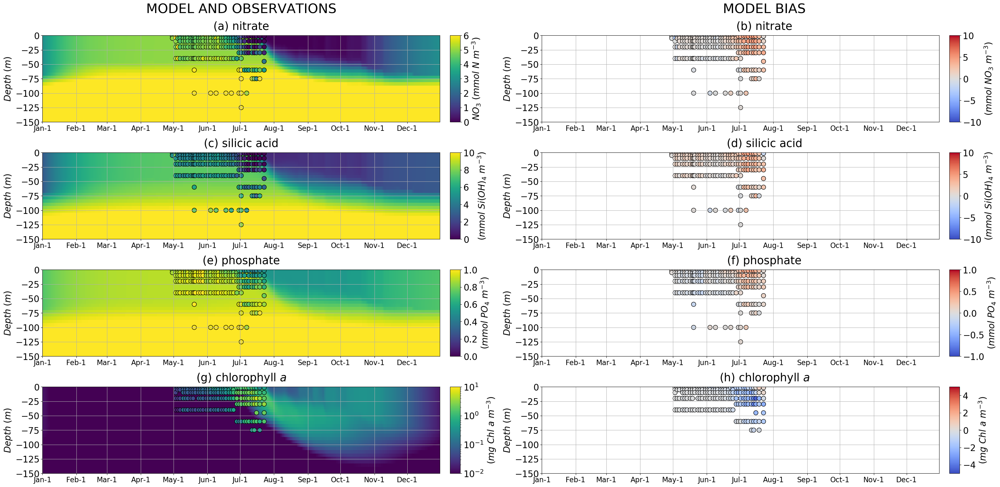

In [303]:
with plt.style.context('GEic2016.m3.mplstyle'):
    locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
    labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
            'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')

    fig,axs=plt.subplots(nrows=4,ncols=2,figsize=(32, 16))

    # --- NITRATE: MODEL AND OBSERVATIONS
    ax=axs[0,0]
    h=ax.pcolormesh(first_year366,
                    RF_above151,
                    array2d_idepth_iT_modno3full[0:(RF_above151.size)-1,array1d_iT1y_iT],
                    cmap='viridis',
                    vmin=0,
                    vmax=6
                   )
    ax.scatter(nutrients_df['doy']-1,
               nutrients_df['depth'],
               c=nutrients_df['no3'],
               cmap='viridis',
               vmin=0,
               vmax=6,
               s=100,
               edgecolor='k'
              )
    ax.set_xticklabels([])
    ax.set_ylabel('$Depth\ (m)$')
    ax.set_xlim(first_year366[0],first_year[-1])
    ax.set_ylim(-150,0)
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    cbaxes = fig.add_axes([0.45, 0.74, 0.01, 0.17])
    cbar=plt.colorbar(h,
                      cax = cbaxes)
    cbar.set_label('$NO_3\ (mmol\ N\ m^{-3})$')
    plt.text(0.50,1.10,'(a) nitrate',
             horizontalalignment = 'center', verticalalignment='center',
             transform=ax.transAxes, fontsize=25
            )
    plt.text(0.50,1.30,'MODEL AND OBSERVATIONS',
             horizontalalignment = 'center', verticalalignment='center',
             transform=ax.transAxes,
             fontsize=30
            )

    # --- NITRATE: MODEL BIAS
    ax=axs[0,1]
    h=ax.scatter(no3mod_df['doy']-1,
                  no3mod_df['depth'],
                  c=no3mod_df['no3mod']-nutrients_df['no3'],
                  cmap='coolwarm',
                  vmin=-10,
                  vmax=10,
                  s=100,
                  edgecolor='k'
                 )
    ax.set_xticklabels([])
    ax.set_ylabel('$Depth\ (m)$')
    ax.set_xlim(first_year[0],first_year[-1])
    ax.set_ylim(-150,0)
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    cbaxes = fig.add_axes([0.94, 0.74, 0.01, 0.17])
    cbar=plt.colorbar(h,
                      cax = cbaxes)
    cbar.set_label('$(mmol\ NO_3\ m^{-3})$')
    plt.text(0.56,1.10,'(b) nitrate',
             horizontalalignment = 'center', verticalalignment='center',
             transform=ax.transAxes, fontsize=25
            )
    plt.text(0.56,1.30,'MODEL BIAS',
             horizontalalignment = 'center', verticalalignment='center',
             transform=ax.transAxes,
             fontsize=30
            )

    # --- SILICIC ACID: MODEL AND OBSERVATIONS
    ax=axs[1,0]
    h=ax.pcolormesh(first_year366,
                    RF_above151,
                    array2d_idepth_iT_modsioh4full[0:(RF_above151.size)-1,array1d_iT1y_iT],
                    cmap='viridis',
                    vmin=0,
                    vmax=10
                   )
    ax.scatter(nutrients_df['doy']-1,
               nutrients_df['depth'],
               c=nutrients_df['no3'],
               cmap='viridis',
               vmin=0,
               vmax=10,
               s=100,
               edgecolor='k'
              )
    ax.set_xticklabels([])
    ax.set_ylabel('$Depth\ (m)$')
    ax.set_xlim(first_year366[0],first_year[-1])
    ax.set_ylim(-150,0)
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    cbaxes = fig.add_axes([0.45, 0.51, 0.01, 0.17])
    cbar=plt.colorbar(h,
                      cax = cbaxes)
    cbar.set_label('$(mmol\ Si{(OH)}_4\ m^{-3})$')
    plt.text(0.50,1.10,'(c) silicic acid',
             horizontalalignment = 'center', verticalalignment='center',
             transform=ax.transAxes, fontsize=25
            )

    # --- SILICIC ACID: MODEL BIAS
    ax=axs[1,1]
    h=ax.scatter(sioh4mod_df['doy']-1,
                 sioh4mod_df['depth'],
                 c=sioh4mod_df['sioh4mod']-nutrients_df['sioh4'],
                 cmap='coolwarm',
                 vmin=-10,
                 vmax=10,
                 s=100,
                 edgecolor='k'
                )
    ax.set_xticklabels([])
    ax.set_ylabel('$Depth\ (m)$')
    ax.set_xlim(first_year[0],first_year[-1])
    ax.set_ylim(-150,0)
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    cbaxes = fig.add_axes([0.94, 0.51, 0.01, 0.17])
    cbar=plt.colorbar(h,
                      cax = cbaxes)
    cbar.set_label('$(mmol\ Si{(OH)}_4\ m^{-3})$')
    plt.text(0.56,1.10,'(d) silicic acid',
             horizontalalignment = 'center', verticalalignment='center',
             transform=ax.transAxes, fontsize=25
            )

    # --- PHOSPHATE: MODEL AND OBSERVATIONS
    ax=axs[2,0]
    h=ax.pcolormesh(first_year366,
                    RF_above151,
                    array2d_idepth_iT_modpo4full[0:(RF_above151.size)-1,array1d_iT1y_iT],
                    cmap='viridis',
                    vmin=0,
                    vmax=1
                   )
    ax.scatter(nutrients_df['doy']-1,
               nutrients_df['depth'],
               c=nutrients_df['po4'],
               cmap='viridis',
               vmin=0,
               vmax=1,
               s=100,
               edgecolor='k'
              )
    ax.set_xticklabels([])
    ax.set_ylabel('$Depth\ (m)$')
    ax.set_xlim(first_year366[0],first_year[-1])
    ax.set_ylim(-150,0)
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    cbaxes = fig.add_axes([0.45, 0.28, 0.01, 0.17])
    cbar=plt.colorbar(h,
                      cax = cbaxes)
    cbar.set_label('$(mmol\ PO_4\ m^{-3})$')
    plt.text(0.50,1.10,'(e) phosphate',
             horizontalalignment = 'center', verticalalignment='center',
             transform=ax.transAxes, fontsize=25
            )

    # --- PHOSPHATE: MODEL BIAS
    ax=axs[2,1]
    h=ax.scatter(po4mod_df['doy']-1,
                 po4mod_df['depth'],
                 c=po4mod_df['po4mod']-nutrients_df['po4'],
                 cmap='coolwarm',
                 vmin=-1,
                 vmax=1,
                 s=100,
                 edgecolor='k'
                )
    ax.set_xticklabels([])
    ax.set_ylabel('$Depth\ (m)$')
    ax.set_xlim(first_year[0],first_year[-1])
    ax.set_ylim(-150,0)
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    cbaxes = fig.add_axes([0.94, 0.28, 0.01, 0.17])
    cbar=plt.colorbar(h,
                      cax = cbaxes)
    cbar.set_label('$(mmol\ {PO}_4\ m^{-3})$')
    plt.text(0.56,1.10,'(f) phosphate',
             horizontalalignment = 'center', verticalalignment='center',
             transform=ax.transAxes, fontsize=25
            )

    # --- CHLOROPHYLL A: MODEL AND OBSERVATIONS
    ax=axs[3,0]
    h=ax.pcolormesh(first_year366,
                    RF_above151,
                    array2d_idepth_iT_modchlfull[0:(RF_above151.size)-1,array1d_iT1y_iT],
                    cmap='viridis',
                    norm=mpl.colors.LogNorm(vmin=1E-2, vmax=10)
                   )
    ax.scatter(chlHPLC_df['doy']-1,
               chlHPLC_df['depth'],
               c=chlHPLC_df['chlHPLC'],
               cmap='viridis',
               norm=mpl.colors.LogNorm(vmin=1E-2, vmax=10),
               s=100,
               edgecolor='k'
              )
    ax.set_xticklabels([])
    ax.set_ylabel('$Depth\ (m)$')
    ax.set_xlim(first_year366[0],first_year[-1])
    ax.set_ylim(-150,0)
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    cbaxes = fig.add_axes([0.45, 0.05, 0.01, 0.17])
    cbar=plt.colorbar(h,
                      cax = cbaxes)
    cbar.set_label('$(mg\ Chl\ a\ m^{-3})$')
    plt.text(0.50,1.10,'(g) chlorophyll $a$',
             horizontalalignment = 'center', verticalalignment='center',
             transform=ax.transAxes, fontsize=25
            )

    # --- CHLOROPHYLL A: MODEL BIAS
    ax=axs[3,1]
    h=ax.scatter(chlmod_df['doy']-1,
                 chlmod_df['depth'],
                 c=chlmod_df['chlmod']-chlHPLC_df['chlHPLC'],
                 cmap='coolwarm',
                 vmin=-5,
                 vmax=5,
                 s=100,
                 edgecolor='k'
                )
    ax.set_xticklabels([])
    ax.set_ylabel('$Depth\ (m)$')
    ax.set_xlim(first_year[0],first_year[-1])
    ax.set_ylim(-150,0)
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    cbaxes = fig.add_axes([0.94, 0.05, 0.01, 0.17])
    cbar=plt.colorbar(h,
                      cax = cbaxes)
    cbar.set_label('$(mg\ Chl\ a\ m^{-3})$')
    plt.text(0.56,1.10,'(h) chlorophyll $a$',
             horizontalalignment = 'center', verticalalignment='center',
             transform=ax.transAxes, fontsize=25
            )
    

    # --- POSITION
    axs[0,0].set_position( [0.05,0.74  ,0.39,0.17])
    axs[0,1].set_position( [0.54,0.74  ,0.39,0.17])
    axs[1,0].set_position( [0.05,0.51  ,0.39,0.17])
    axs[1,1].set_position( [0.54,0.51  ,0.39,0.17])
    axs[2,0].set_position( [0.05,0.28  ,0.39,0.17])
    axs[2,1].set_position( [0.54,0.28  ,0.39,0.17])
    axs[3,0].set_position( [0.05,0.05  ,0.39,0.17])
    axs[3,1].set_position( [0.54,0.05  ,0.39,0.17])

    # --- SAVE
    plt.savefig('validation/GEic2016.bias.m3.png')

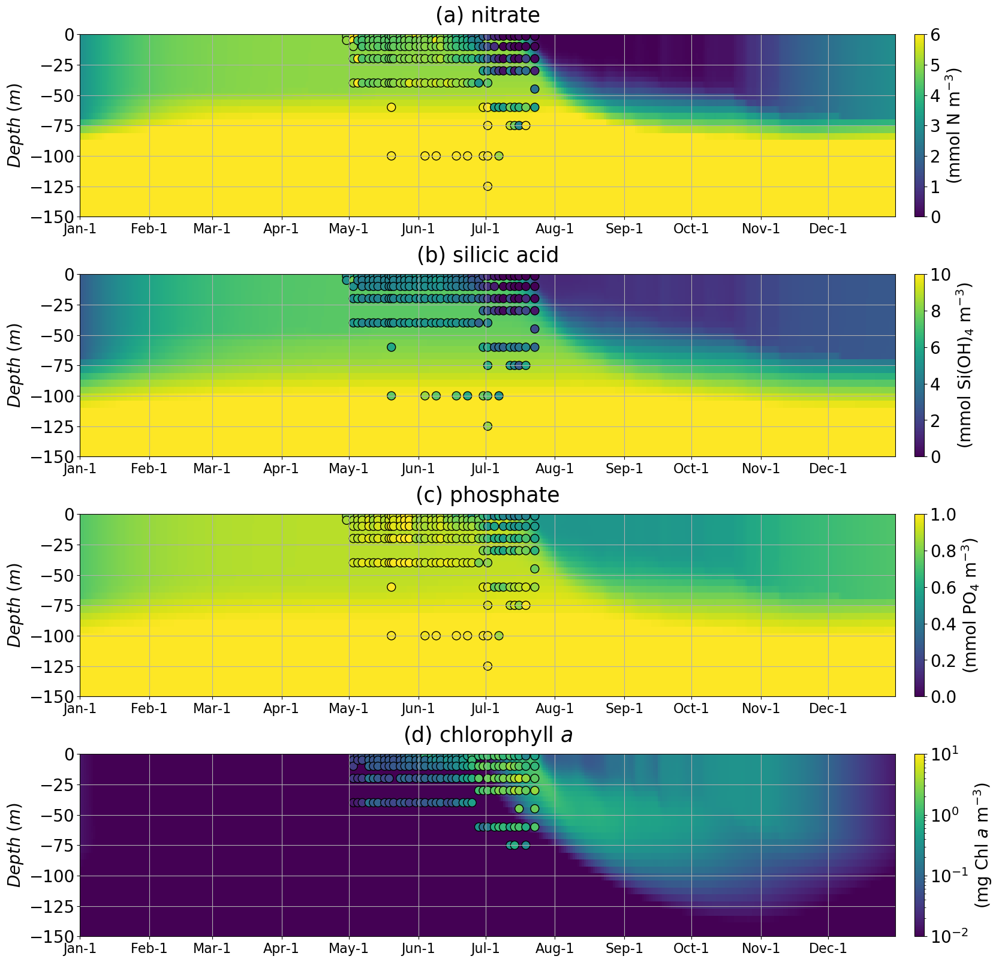

In [304]:
with plt.style.context('GEic2016.m3.mplstyle'):
    locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
    labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
            'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')

    fig,axs=plt.subplots(nrows=4,ncols=1,figsize=(16, 16))

    # --- NITRATE: MODEL AND OBSERVATIONS
    ax=axs[0]
    h=ax.pcolormesh(first_year366,
                    RF_above151,
                    array2d_idepth_iT_modno3full[0:(RF_above151.size)-1,array1d_iT1y_iT],
                    cmap='viridis',
                    vmin=0,
                    vmax=6
                   )
    ax.scatter(nutrients_df['doy']-1,
               nutrients_df['depth'],
               c=nutrients_df['no3'],
               cmap='viridis',
               vmin=0,
               vmax=6,
               s=100,
               edgecolor='k'
              )
    ax.set_xticklabels([])
    ax.set_ylabel('$Depth\ (m)$')
    ax.set_xlim(first_year366[0],first_year[-1])
    ax.set_ylim(-150,0)
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    cbaxes = fig.add_axes([0.92, 0.78, 0.01, 0.19])
    cbar=plt.colorbar(h,
                      cax = cbaxes)
    cbar.set_label('(mmol N $\mathrm{ m^{-3} }$)')
    plt.text(0.50,1.10,'(a) nitrate',
             horizontalalignment = 'center', verticalalignment='center',
             transform=ax.transAxes, fontsize=25
            )

    # --- SILICIC ACID: MODEL AND OBSERVATIONS
    ax=axs[1]
    h=ax.pcolormesh(first_year366,
                    RF_above151,
                    array2d_idepth_iT_modsioh4full[0:(RF_above151.size)-1,array1d_iT1y_iT],
                    cmap='viridis',
                    vmin=0,
                    vmax=10
                   )
    ax.scatter(nutrients_df['doy']-1,
               nutrients_df['depth'],
               c=nutrients_df['no3'],
               cmap='viridis',
               vmin=0,
               vmax=10,
               s=100,
               edgecolor='k'
              )
    ax.set_xticklabels([])
    ax.set_ylabel('$Depth\ (m)$')
    ax.set_xlim(first_year366[0],first_year[-1])
    ax.set_ylim(-150,0)
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    cbaxes = fig.add_axes([0.92, 0.53, 0.01, 0.19])
    cbar=plt.colorbar(h,
                      cax = cbaxes)
    cbar.set_label('(mmol Si$\mathrm{ {(OH)}_4 }$ $\mathrm{ m^{-3} }$)')
    plt.text(0.50,1.10,'(b) silicic acid',
             horizontalalignment = 'center', verticalalignment='center',
             transform=ax.transAxes, fontsize=25
            )

    # --- PHOSPHATE: MODEL AND OBSERVATIONS
    ax=axs[2]
    h=ax.pcolormesh(first_year366,
                    RF_above151,
                    array2d_idepth_iT_modpo4full[0:(RF_above151.size)-1,array1d_iT1y_iT],
                    cmap='viridis',
                    vmin=0,
                    vmax=1
                   )
    ax.scatter(nutrients_df['doy']-1,
               nutrients_df['depth'],
               c=nutrients_df['po4'],
               cmap='viridis',
               vmin=0,
               vmax=1,
               s=100,
               edgecolor='k'
              )
    ax.set_xticklabels([])
    ax.set_ylabel('$Depth\ (m)$')
    ax.set_xlim(first_year366[0],first_year[-1])
    ax.set_ylim(-150,0)
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    cbaxes = fig.add_axes([0.92, 0.28, 0.01, 0.19])
    cbar=plt.colorbar(h,
                      cax = cbaxes)
    cbar.set_label('(mmol $\mathrm{ PO_4 }$ $\mathrm{ m^{-3} }$)')
    plt.text(0.50,1.10,'(c) phosphate',
             horizontalalignment = 'center', verticalalignment='center',
             transform=ax.transAxes, fontsize=25
            )

    # --- CHLOROPHYLL A: MODEL AND OBSERVATIONS
    ax=axs[3]
    h=ax.pcolormesh(first_year366,
                    RF_above151,
                    array2d_idepth_iT_modchlfull[0:(RF_above151.size)-1,array1d_iT1y_iT],
                    cmap='viridis',
                    norm=mpl.colors.LogNorm(vmin=1E-2, vmax=10)
                   )
    ax.scatter(chlHPLC_df['doy']-1,
               chlHPLC_df['depth'],
               c=chlHPLC_df['chlHPLC'],
               cmap='viridis',
               norm=mpl.colors.LogNorm(vmin=1E-2, vmax=10),
               s=100,
               edgecolor='k'
              )
    ax.set_xticklabels([])
    ax.set_ylabel('$Depth\ (m)$')
    ax.set_xlim(first_year366[0],first_year[-1])
    ax.set_ylim(-150,0)
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    cbaxes = fig.add_axes([0.92, 0.03, 0.01, 0.19])
    cbar=plt.colorbar(h,
                      cax = cbaxes)
    cbar.set_label('(mg Chl $a$ $\mathrm{ m^{-3} }$)')
    plt.text(0.50,1.10,'(d) chlorophyll $a$',
             horizontalalignment = 'center', verticalalignment='center',
             transform=ax.transAxes, fontsize=25
            )
    

    # --- POSITION
    axs[0].set_position( [0.05,0.78  ,0.85,0.19])
    axs[1].set_position( [0.05,0.53  ,0.85,0.19])
    axs[2].set_position( [0.05,0.28  ,0.85,0.19])
    axs[3].set_position( [0.05,0.03  ,0.85,0.19])

    # --- SAVE
    plt.savefig('validation/GEic2016.m3.png')

# Many heat maps on the same figure

## Select year

In [305]:
array1d_iT1y_iTtempo=np.arange(365*(iyeartempo-1)+0,365*(iyeartempo-1)+365)
first_year366=np.arange(0,366) # first year for heatmaps

## Nutrients

In [306]:
carfile='car.0000000000.t001.nc'
RF_above151=RF[RF>-151]
array2d_idepth_iT_modalkfull=netcdf_tools.read_netcdf(carfile, 'TRAC18')\
.squeeze().transpose()
array2d_idepth_iT_moddicfull=netcdf_tools.read_netcdf(carfile, 'TRAC01')\
.squeeze().transpose()
array2d_idepth_iT_moddocfull=netcdf_tools.read_netcdf(carfile, 'TRAC08')\
.squeeze().transpose()
array2d_idepth_iT_moddofefull=netcdf_tools.read_netcdf(carfile, 'TRAC11')\
.squeeze().transpose()
array2d_idepth_iT_moddonfull=netcdf_tools.read_netcdf(carfile, 'TRAC09')\
.squeeze().transpose()
array2d_idepth_iT_moddopfull=netcdf_tools.read_netcdf(carfile, 'TRAC10')\
.squeeze().transpose()
array2d_idepth_iT_modfetfull=netcdf_tools.read_netcdf(carfile, 'TRAC07')\
.squeeze().transpose()
array2d_idepth_iT_modnh4full=netcdf_tools.read_netcdf(carfile, 'TRAC02')\
.squeeze().transpose()
array2d_idepth_iT_modno2full=netcdf_tools.read_netcdf(carfile, 'TRAC03')\
.squeeze().transpose()
array2d_idepth_iT_modno3full=netcdf_tools.read_netcdf(carfile, 'TRAC04')\
.squeeze().transpose()
array2d_idepth_iT_modo2full=netcdf_tools.read_netcdf(carfile, 'TRAC19')\
.squeeze().transpose()
array2d_idepth_iT_modpicfull=netcdf_tools.read_netcdf(carfile, 'TRAC17')\
.squeeze().transpose()
array2d_idepth_iT_modpo4full=netcdf_tools.read_netcdf(carfile, 'TRAC05')\
.squeeze().transpose()
array2d_idepth_iT_modpocfull=netcdf_tools.read_netcdf(carfile, 'TRAC12')\
.squeeze().transpose()
array2d_idepth_iT_modpofefull=netcdf_tools.read_netcdf(carfile, 'TRAC16')\
.squeeze().transpose()
array2d_idepth_iT_modponfull=netcdf_tools.read_netcdf(carfile, 'TRAC13')\
.squeeze().transpose()
array2d_idepth_iT_modpopfull=netcdf_tools.read_netcdf(carfile, 'TRAC14')\
.squeeze().transpose()
array2d_idepth_iT_modposifull=netcdf_tools.read_netcdf(carfile, 'TRAC15')\
.squeeze().transpose()
array2d_idepth_iT_modposioh4full=netcdf_tools.read_netcdf(carfile, 'TRAC06')\
.squeeze().transpose()

## Nutrients: one year

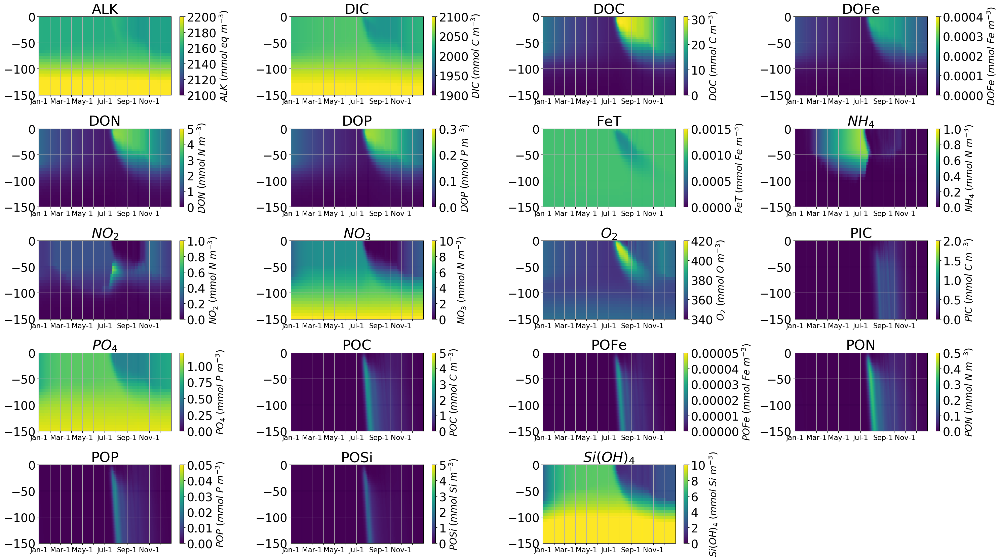

In [307]:
with plt.style.context('many_heat_maps.mplstyle'):
    locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
    labels=('Jan-1','','Mar-1','','May-1','',
            'Jul-1','','Sep-1','','Nov-1','')
    fig,axs=plt.subplots(5,4,figsize=(30, 17))
    
    # --- ALK
    ax=axs[0,0]
    im=ax.pcolormesh(first_year366,
                     RF_above151,
                     array2d_idepth_iT_modalkfull[0:(RF_above151.size)-1,
                                                  array1d_iT1y_iTtempo],
                     vmin=2100,
                     vmax=2200
                 )
    ax.set_title('ALK')
    ax.set_xticklabels([])
    ax.set_xlim(first_year366[0],first_year366[-1])
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    ax.set_yticks([0,-50,-100,-150])
    fig.colorbar(im, ax=ax, label='$ALK\ (mmol\ eq\ m^{-3})$')
    
    # --- DIC
    ax=axs[0,1]
    im=ax.pcolormesh(first_year366,
                     RF_above151,
                     array2d_idepth_iT_moddicfull[0:(RF_above151.size)-1,
                                                  array1d_iT1y_iTtempo],
                     vmin=1900,
                     vmax=2100
                 )
    ax.set_title('DIC')
    ax.set_xticklabels([])
    ax.set_xlim(first_year366[0],first_year366[-1])
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    ax.set_yticks([0,-50,-100,-150])
    fig.colorbar(im, ax=ax, label='$DIC\ (mmol\ C\ m^{-3})$')
    
    # --- DOC
    ax=axs[0,2]
    im=ax.pcolormesh(first_year366,
                     RF_above151,
                     array2d_idepth_iT_moddocfull[0:(RF_above151.size)-1,
                                                  array1d_iT1y_iTtempo],
                     vmin=0,
                     vmax=31
                 )
    ax.set_title('DOC')
    ax.set_xticklabels([])
    ax.set_xlim(first_year366[0],first_year366[-1])
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    ax.set_yticks([0,-50,-100,-150])
    fig.colorbar(im, ax=ax, label='$DOC\ (mmol\ C\ m^{-3})$')
    
    # --- DOFe
    ax=axs[0,3]
    im=ax.pcolormesh(first_year366,
                     RF_above151,
                     array2d_idepth_iT_moddofefull[0:(RF_above151.size)-1,
                                                  array1d_iT1y_iTtempo],
                     vmin=0,
                     vmax=4E-4
                 )
    ax.set_title('DOFe')
    ax.set_xticklabels([])
    ax.set_xlim(first_year366[0],first_year366[-1])
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    ax.set_yticks([0,-50,-100,-150])
    fig.colorbar(im, ax=ax, label='$DOFe\ (mmol\ Fe\ m^{-3})$')
    
    # --- DON
    ax=axs[1,0]
    im=ax.pcolormesh(first_year366,
                     RF_above151,
                     array2d_idepth_iT_moddonfull[0:(RF_above151.size)-1,
                                                  array1d_iT1y_iTtempo],
                     vmin=0,
                     vmax=5
                 )
    ax.set_title('DON')
    ax.set_xticklabels([])
    ax.set_xlim(first_year366[0],first_year366[-1])
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    ax.set_yticks([0,-50,-100,-150])
    fig.colorbar(im, ax=ax, label='$DON\ (mmol\ N\ m^{-3})$')
    
    # --- DOP
    ax=axs[1,1]
    im=ax.pcolormesh(first_year366,
                     RF_above151,
                     array2d_idepth_iT_moddopfull[0:(RF_above151.size)-1,
                                                  array1d_iT1y_iTtempo],
                     vmin=0,
                     vmax=0.3
                 )
    ax.set_title('DOP')
    ax.set_xticklabels([])
    ax.set_xlim(first_year366[0],first_year366[-1])
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    ax.set_yticks([0,-50,-100,-150])
    fig.colorbar(im, ax=ax, label='$DOP\ (mmol\ P\ m^{-3})$')
    
    # --- FeT
    ax=axs[1,2]
    im=ax.pcolormesh(first_year366,
                     RF_above151,
                     array2d_idepth_iT_modfetfull[0:(RF_above151.size)-1,
                                                  array1d_iT1y_iTtempo],
                     vmin=0,
                     vmax=1.5E-3
                 )
    ax.set_title('FeT')
    ax.set_xticklabels([])
    ax.set_xlim(first_year366[0],first_year366[-1])
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    ax.set_yticks([0,-50,-100,-150])
    fig.colorbar(im, ax=ax, label='$FeT\ (mmol\ Fe\ m^{-3})$')
    
    # --- NH4
    ax=axs[1,3]
    im=ax.pcolormesh(first_year366,
                     RF_above151,
                     array2d_idepth_iT_modnh4full[0:(RF_above151.size)-1,
                                                  array1d_iT1y_iTtempo],
                     vmin=0,
                     vmax=1
                 )
    ax.set_title('$NH_4$')
    ax.set_xticklabels([])
    ax.set_xlim(first_year366[0],first_year366[-1])
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    ax.set_yticks([0,-50,-100,-150])
    fig.colorbar(im, ax=ax, label='$NH_4\ (mmol\ N\ m^{-3})$')
    
    # --- NO2
    ax=axs[2,0]
    im=ax.pcolormesh(first_year366,
                     RF_above151,
                     array2d_idepth_iT_modno2full[0:(RF_above151.size)-1,
                                                  array1d_iT1y_iTtempo],
                     vmin=0,
                     vmax=1
                 )
    ax.set_title('$NO_2$')
    ax.set_xticklabels([])
    ax.set_xlim(first_year366[0],first_year366[-1])
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    ax.set_yticks([0,-50,-100,-150])
    fig.colorbar(im, ax=ax, label='$NO_2\ (mmol\ N\ m^{-3})$')
    
    # --- NO3
    ax=axs[2,1]
    im=ax.pcolormesh(first_year366,
                     RF_above151,
                     array2d_idepth_iT_modno3full[0:(RF_above151.size)-1,
                                                  array1d_iT1y_iTtempo],
                     vmin=0,
                     vmax=10
                 )
    ax.set_title('$NO_3$')
    ax.set_xticklabels([])
    ax.set_xlim(first_year366[0],first_year366[-1])
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    ax.set_yticks([0,-50,-100,-150])
    fig.colorbar(im, ax=ax, label='$NO_3\ (mmol\ N\ m^{-3})$')
    
    # --- O2
    ax=axs[2,2]
    im=ax.pcolormesh(first_year366,
                     RF_above151,
                     array2d_idepth_iT_modo2full[0:(RF_above151.size)-1,
                                                  array1d_iT1y_iTtempo],
                     vmin=340,
                     vmax=420
                 )
    ax.set_title('$O_2$')
    ax.set_xticklabels([])
    ax.set_xlim(first_year366[0],first_year366[-1])
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    ax.set_yticks([0,-50,-100,-150])
    fig.colorbar(im, ax=ax, label='$O_2\ (mmol\ O\ m^{-3})$')
    
    # --- PIC
    ax=axs[2,3]
    im=ax.pcolormesh(first_year366,
                     RF_above151,
                     array2d_idepth_iT_modpicfull[0:(RF_above151.size)-1,
                                                  array1d_iT1y_iTtempo],
                     vmin=0,
                     vmax=2
                 )
    ax.set_title('PIC')
    ax.set_xticklabels([])
    ax.set_xlim(first_year366[0],first_year366[-1])
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    ax.set_yticks([0,-50,-100,-150])
    fig.colorbar(im, ax=ax, label='$PIC\ (mmol\ C\ m^{-3})$')
    
    # --- PO4
    ax=axs[3,0]
    im=ax.pcolormesh(first_year366,
                     RF_above151,
                     array2d_idepth_iT_modpo4full[0:(RF_above151.size)-1,
                                                  array1d_iT1y_iTtempo],
                     vmin=0,
                     vmax=1.2
                 )
    ax.set_title('$PO_4$')
    ax.set_xticklabels([])
    ax.set_xlim(first_year366[0],first_year366[-1])
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    ax.set_yticks([0,-50,-100,-150])
    fig.colorbar(im, ax=ax, label='$PO_4\ (mmol\ P\ m^{-3})$')
    
    # --- POC
    ax=axs[3,1]
    im=ax.pcolormesh(first_year366,
                     RF_above151,
                     array2d_idepth_iT_modpocfull[0:(RF_above151.size)-1,
                                                  array1d_iT1y_iTtempo],
                     vmin=0,
                     vmax=5
                 )
    ax.set_title('POC')
    ax.set_xticklabels([])
    ax.set_xlim(first_year366[0],first_year366[-1])
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    ax.set_yticks([0,-50,-100,-150])
    fig.colorbar(im, ax=ax, label='$POC\ (mmol\ C\ m^{-3})$')
    
    # --- POFe
    ax=axs[3,2]
    im=ax.pcolormesh(first_year366,
                     RF_above151,
                     array2d_idepth_iT_modpofefull[0:(RF_above151.size)-1,
                                                  array1d_iT1y_iTtempo],
                     vmin=0,
                     vmax=5E-5
                 )
    ax.set_title('POFe')
    ax.set_xticklabels([])
    ax.set_xlim(first_year366[0],first_year366[-1])
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    ax.set_yticks([0,-50,-100,-150])
    fig.colorbar(im, ax=ax, label='$POFe\ (mmol\ Fe\ m^{-3})$')
    
    # --- PON
    ax=axs[3,3]
    im=ax.pcolormesh(first_year366,
                     RF_above151,
                     array2d_idepth_iT_modponfull[0:(RF_above151.size)-1,
                                                  array1d_iT1y_iTtempo],
                     vmin=0,
                     vmax=0.5
                 )
    ax.set_title('PON')
    ax.set_xticklabels([])
    ax.set_xlim(first_year366[0],first_year366[-1])
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    ax.set_yticks([0,-50,-100,-150])
    fig.colorbar(im, ax=ax, label='$PON\ (mmol\ N\ m^{-3})$')
    
    # --- POP
    ax=axs[4,0]
    im=ax.pcolormesh(first_year366,
                     RF_above151,
                     array2d_idepth_iT_modpopfull[0:(RF_above151.size)-1,
                                                  array1d_iT1y_iTtempo],
                     vmin=0,
                     vmax=0.05
                 )
    ax.set_title('POP')
    ax.set_xticklabels([])
    ax.set_xlim(first_year366[0],first_year366[-1])
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    ax.set_yticks([0,-50,-100,-150])
    fig.colorbar(im, ax=ax, label='$POP\ (mmol\ P\ m^{-3})$')
    
    # --- POSi
    ax=axs[4,1]
    im=ax.pcolormesh(first_year366,
                     RF_above151,
                     array2d_idepth_iT_modposifull[0:(RF_above151.size)-1,
                                                  array1d_iT1y_iTtempo],
                     vmin=0,
                     vmax=5
                 )
    ax.set_title('POSi')
    ax.set_xticklabels([])
    ax.set_xlim(first_year366[0],first_year366[-1])
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    ax.set_yticks([0,-50,-100,-150])
    fig.colorbar(im, ax=ax, label='$POSi\ (mmol\ Si\ m^{-3})$')
    
    # --- SiOH4
    ax=axs[4,2]
    im=ax.pcolormesh(first_year366,
                     RF_above151,
                     array2d_idepth_iT_modposioh4full[0:(RF_above151.size)-1,
                                                  array1d_iT1y_iTtempo],
                     vmin=0,
                     vmax=10
                 )
    ax.set_title('$Si(OH)_4$')
    ax.set_xticklabels([])
    ax.set_xlim(first_year366[0],first_year366[-1])
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    ax.set_yticks([0,-50,-100,-150])
    fig.colorbar(im, ax=ax, label='$Si(OH)_4\ (mmol\ Si\ m^{-3})$')
    
    # --- NOTHING
    ax=axs[4,3]
    ax.axis('off')
    
    fig.tight_layout()
    plt.savefig('car.0000000000.t001.year'\
                +str(iyeartempo)+'.nutrients.png')
    

## Comparions between observations and model with heat maps: total iron

In [308]:
fname='../../obs/colombo2020.csv'
fet_df=pd.read_csv(
    fname,
    dtype={
        'doy':np.int64,
        'depth':np.float32,
        'Fe_D_CONC_BOTTLE_nmol_kg':np.float32
    }
)

In [309]:
# fet_df

In [310]:
# nmol kg^-1 ===> mmol m^-3
fet_df['Fe_D_CONC_BOTTLE_nmol_kg']=fet_df['Fe_D_CONC_BOTTLE_nmol_kg']/1000
fet_df.rename({'Fe_D_CONC_BOTTLE_nmol_kg':'Fe_D_CONC_BOTTLE_mmol_m3'},
             axis='columns',
             inplace=True)

In [311]:
# fet_df

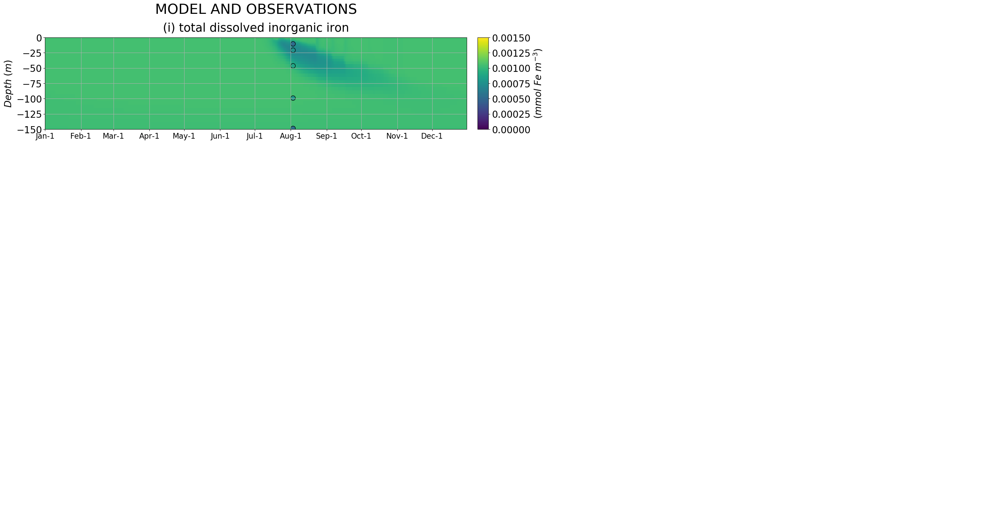

In [312]:
with plt.style.context('GEic2016.m3.mplstyle'):
    locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
    labels=('Jan-1','Feb-1','Mar-1','Apr-1','May-1','Jun-1',
            'Jul-1','Aug-1','Sep-1','Oct-1','Nov-1','Dec-1')

    fig,axs=plt.subplots(nrows=4,ncols=2,figsize=(32, 16))

    # --- NITRATE: MODEL AND OBSERVATIONS
    ax=axs[0,0]
    h=ax.pcolormesh(first_year366,
                    RF_above151,
                    array2d_idepth_iT_modfetfull[0:(RF_above151.size)-1,
                                                 array1d_iT1y_iT],
                    cmap='viridis',
                    vmin=0,
                    vmax=1.5E-3)
    ax.scatter(fet_df['doy']-1,
               fet_df['depth'],
               c=fet_df['Fe_D_CONC_BOTTLE_mmol_m3'],
               cmap='viridis',
               vmin=0,
               vmax=1.5E-3,
               s=100,
               edgecolor='k'
              )
    ax.set_xticklabels([])
    ax.set_ylabel('$Depth\ (m)$')
    ax.set_xlim(first_year366[0],first_year[-1])
    ax.set_ylim(-150,0)
    ax.grid()
    ax.set_xticks(locs)
    ax.set_xticklabels(labels)
    cbaxes = fig.add_axes([0.45, 0.74, 0.01, 0.17])
    cbar=plt.colorbar(h,
                      cax = cbaxes)
    cbar.set_label('$(mmol\ Fe\ m^{-3})$')
    plt.text(0.50,1.10,'(i) total dissolved inorganic iron',
             horizontalalignment = 'center', verticalalignment='center',
             transform=ax.transAxes, fontsize=25
            )
    plt.text(0.50,1.30,'MODEL AND OBSERVATIONS',
             horizontalalignment = 'center', verticalalignment='center',
             transform=ax.transAxes,
             fontsize=30
            )

    # --- NOTHING
    ax=axs[0,1]
    ax.axis('off')

    # --- NOTHING
    ax=axs[1,0]
    ax.axis('off')

    # --- NOTHING
    ax=axs[1,1]
    ax.axis('off')

    # --- NOTHING
    ax=axs[2,0]
    ax.axis('off')

    # --- NOTHING
    ax=axs[2,1]
    ax.axis('off')

    # --- NOTHING
    ax=axs[3,0]
    ax.axis('off')

    # --- NOTHING
    ax=axs[3,1]
    ax.axis('off')

    # --- POSITION
    axs[0,0].set_position( [0.05,0.74  ,0.39,0.17])
    axs[0,1].set_position( [0.54,0.74  ,0.39,0.17])
    axs[1,0].set_position( [0.05,0.51  ,0.39,0.17])
    axs[1,1].set_position( [0.54,0.51  ,0.39,0.17])
    axs[2,0].set_position( [0.05,0.28  ,0.39,0.17])
    axs[2,1].set_position( [0.54,0.28  ,0.39,0.17])
    axs[3,0].set_position( [0.05,0.05  ,0.39,0.17])
    axs[3,1].set_position( [0.54,0.05  ,0.39,0.17])

    # --- SAVE
    plt.savefig('validation/GEOTRACES.comp.FeT.png')

In [313]:
fet_obs_min=np.min(fet_df['Fe_D_CONC_BOTTLE_mmol_m3'])
fet_obs_max=np.max(fet_df['Fe_D_CONC_BOTTLE_mmol_m3'])

In [314]:
print('The range of dissolved iron in the observations was ' \
      + '{0:.6f} to {1:.6f} mmol Fe m^-3.' \
      .format(fet_obs_min,fet_obs_max))

The range of dissolved iron in the observations was 0.000527 to 0.000884 mmol Fe m^-3.


In [315]:
fet_sim_min=np.min(array2d_idepth_iT_modfetfull[0:(RF_above151.size)-1,
                                                array1d_iT1y_iT])
fet_sim_max=np.max(array2d_idepth_iT_modfetfull[0:(RF_above151.size)-1,
                                                array1d_iT1y_iT])

In [316]:
print('The range of total dissolved inorganic iron in the simulation was ' \
      + '{0:.6f} to {1:.6f} mmol Fe m^-3.' \
      .format(fet_sim_min,fet_sim_max))

The range of total dissolved inorganic iron in the simulation was 0.000693 to 0.001064 mmol Fe m^-3.


## Function to get the description of a variable

In [317]:
def get_longname(varname):
    if varname=='TRAC21':
        longname='$Prochlorococcus$ $1\ \mu m$'
    elif varname=='TRAC22':
        longname='$Synechococcus$ $1\ \mu m$'
    elif varname=='TRAC23':
        longname='Small Eukaryotes $1\ \mu m$'
    elif varname=='TRAC24':
        longname='Small Eukaryotes $2\ \mu m$'
    elif varname=='TRAC25':
        longname='Other Eukaryotes $3\ \mu m$'
    elif varname=='TRAC26':
        longname='Other Eukaryotes $4\ \mu m$'
    elif varname=='TRAC27':
        longname='Other Eukaryotes $7\ \mu m$'
    elif varname=='TRAC28':
        longname='Other Eukaryotes $10\ \mu m$'
    elif varname=='TRAC29':
        longname='Other Eukaryotes $15\ \mu m$'
    elif varname=='TRAC30':
        longname='Diazotrophs $3\ \mu m$'
    elif varname=='TRAC31':
        longname='Diazotrophs $4\ \mu m$'
    elif varname=='TRAC32':
        longname='Diazotrophs $7\ \mu m$'
    elif varname=='TRAC33':
        longname='Diazotrophs $10\ \mu m$'
    elif varname=='TRAC34':
        longname='$Trichodesmium$ $15\ \mu m$'
    elif varname=='TRAC35':
        longname='Diatoms $7\ \mu m$'
    elif varname=='TRAC36':
        longname='Diatoms $10\ \mu m$'
    elif varname=='TRAC37':
        longname='Diatoms $15\ \mu m$'
    elif varname=='TRAC38':
        longname='Diatoms $22\ \mu m$'
    elif varname=='TRAC39':
        longname='Diatoms $32\ \mu m$'
    elif varname=='TRAC40':
        longname='Diatoms $47\ \mu m$'
    elif varname=='TRAC41':
        longname='Diatoms $70\ \mu m$'
    elif varname=='TRAC42':
        longname='Diatoms $104\ \mu m$'
    elif varname=='TRAC43':
        longname='Diatoms $154\ \mu m$'
    elif varname=='TRAC44':
        longname='Dinoflagellates $7\ \mu m$'
    elif varname=='TRAC45':
        longname='Dinoflagellates $10\ \mu m$'
    elif varname=='TRAC46':
        longname='Dinoflagellates $15\ \mu m$'
    elif varname=='TRAC47':
        longname='Dinoflagellates $22\ \mu m$'
    elif varname=='TRAC48':
        longname='Dinoflagellates $32\ \mu m$'
    elif varname=='TRAC49':
        longname='Dinoflagellates $47\ \mu m$'
    elif varname=='TRAC50':
        longname='Dinoflagellates $70\ \mu m$'
    elif varname=='TRAC51':
        longname='Dinoflagellates $104\ \mu m$'
    elif varname=='TRAC52':
        longname='Dinoflagellates $154\ \mu m$'
    elif varname=='TRAC53':
        longname='Dinoflagellates $228\ \mu m$'
    elif varname=='TRAC54':
        longname='Zooplankton $7\ \mu m$'
    elif varname=='TRAC55':
        longname='Zooplankton $10\ \mu m$'
    elif varname=='TRAC56':
        longname='Zooplankton $15\ \mu m$'
    elif varname=='TRAC57':
        longname='Zooplankton $22\ \mu m$'
    elif varname=='TRAC58':
        longname='Zooplankton $32\ \mu m$'
    elif varname=='TRAC59':
        longname='Zooplankton $47\ \mu m$'
    elif varname=='TRAC60':
        longname='Zooplankton $70\ \mu m$'
    elif varname=='TRAC61':
        longname='Zooplankton $104\ \mu m$'
    elif varname=='TRAC62':
        longname='Zooplankton $154\ \mu m$'
    elif varname=='TRAC63':
        longname='Zooplankton $228\ \mu m$'
    elif varname=='TRAC64':
        longname='Zooplankton $339\ \mu m$'
    elif varname=='TRAC65':
        longname='Zooplankton $502\ \mu m$'
    elif varname=='TRAC66':
        longname='Zooplankton $744\ \mu m$'
    elif varname=='TRAC67':
        longname='Zooplankton $1103\ \mu m$'
    elif varname=='TRAC68':
        longname='Zooplankton $1636\ \mu m$'
    elif varname=='TRAC69':
        longname='Zooplankton $2425\ \mu m$'
        
    else:
        longname=''
    return longname

## Prokaryotes, small eukaryotes and other eukaryotes

### Prokaryotes, small eukaryotes and other eukaryotes: one year

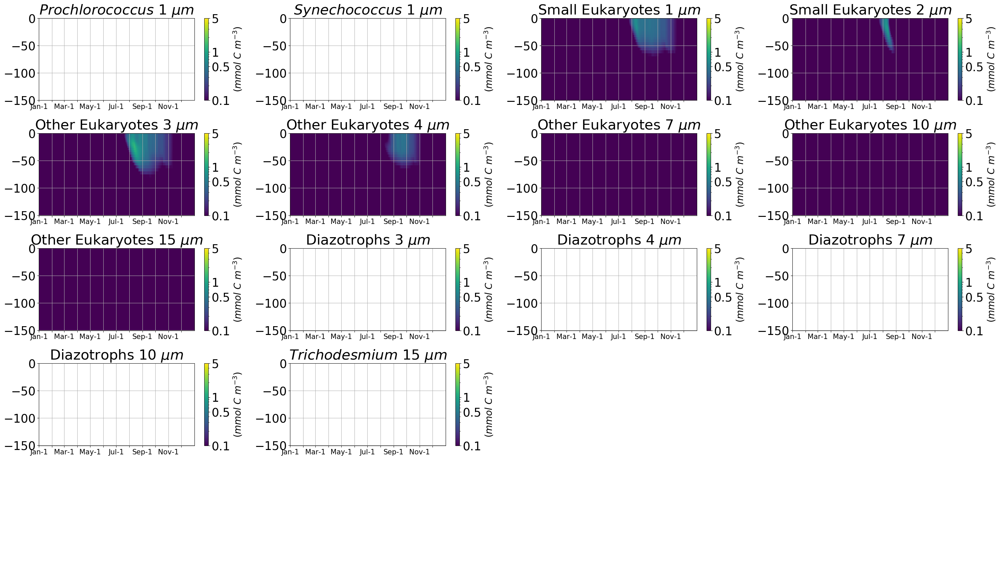

In [318]:
carfile='car.0000000000.t001.nc'
RF_above151=RF[RF>-151]
with plt.style.context('many_heat_maps.mplstyle'):
    locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
    labels=('Jan-1','','Mar-1','','May-1','',
            'Jul-1','','Sep-1','','Nov-1','')
    fig,axs=plt.subplots(5,4,figsize=(30, 17))
    
    for itracer in range(21,35):
        varname='TRAC'+str(itracer).zfill(2)
        array2d_idepth_iT_modtracerfull=netcdf_tools.read_netcdf(carfile, varname)\
.squeeze().transpose()
        ax=axs[(itracer-21)//4,(itracer-21)%4]
        im=ax.pcolormesh(first_year366,
                         RF_above151,
                         array2d_idepth_iT_modtracerfull[0:(RF_above151.size)-1,
                                                         array1d_iT1y_iTtempo],
                         norm=mpl.colors.LogNorm(vmin=0.1,vmax=5))
        longname=get_longname(varname)
        ax.set_title(longname)
        ax.set_xticklabels([])
        ax.set_xlim(first_year366[0],first_year366[-1])
        ax.grid()
        ax.set_xticks(locs)
        ax.set_xticklabels(labels)
        ax.set_yticks([0,-50,-100,-150])
        fig.colorbar(im,
                     ax=ax,
                     ticks=[0.1,0.5,1,5],
                     format='%.1g',
                     label='$(mmol\ C\ m^{-3})$')

    # --- NOTHING
    ax=axs[3,2]
    ax.axis('off')
    ax=axs[3,3]
    ax.axis('off')
    ax=axs[4,0]
    ax.axis('off')
    ax=axs[4,1]
    ax.axis('off')
    ax=axs[4,2]
    ax.axis('off')
    ax=axs[4,3]
    ax.axis('off')
    
    fig.tight_layout()
    plt.savefig('car.0000000000.t001.year'\
                +str(iyeartempo)+'.prok.small.other.png')

## Diatoms and mixotrophic dinoflagellates

### Diatoms and mixotrophic dinoflagellates: one year

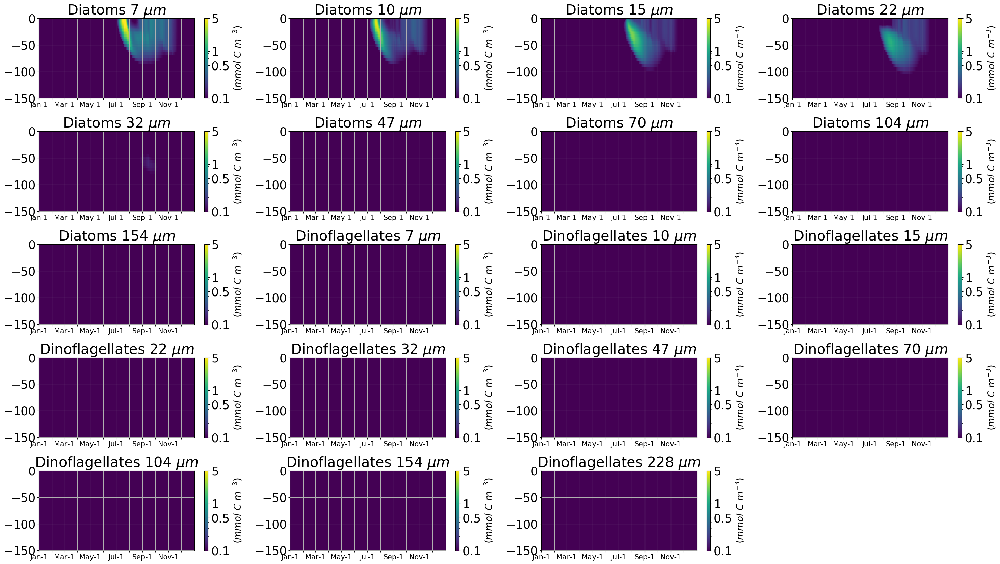

In [319]:
carfile='car.0000000000.t001.nc'
RF_above151=RF[RF>-151]
with plt.style.context('many_heat_maps.mplstyle'):
    locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
    labels=('Jan-1','','Mar-1','','May-1','',
            'Jul-1','','Sep-1','','Nov-1','')
    fig,axs=plt.subplots(5,4,figsize=(30, 17))
    
    for itracer in range(35,54):
        varname='TRAC'+str(itracer).zfill(2)
        array2d_idepth_iT_modtracerfull=netcdf_tools.read_netcdf(carfile, varname)\
.squeeze().transpose()
        ax=axs[(itracer-35)//4,(itracer-35)%4]
        im=ax.pcolormesh(first_year366,
                         RF_above151,
                         array2d_idepth_iT_modtracerfull[0:(RF_above151.size)-1,
                                                         array1d_iT1y_iTtempo],
                         norm=mpl.colors.LogNorm(vmin=0.1,vmax=5))
        longname=get_longname(varname)
        ax.set_title(longname)
        ax.set_xticklabels([])
        ax.set_xlim(first_year366[0],first_year366[-1])
        ax.grid()
        ax.set_xticks(locs)
        ax.set_xticklabels(labels)
        ax.set_yticks([0,-50,-100,-150])
        fig.colorbar(im,
                     ax=ax,
                     ticks=[0.1,0.5,1,5],
                     format='%.1g',
                     label='$(mmol\ C\ m^{-3})$')
        
    # --- NOTHING
    ax=axs[4,3]
    ax.axis('off')
    
    fig.tight_layout()
    plt.savefig('car.0000000000.t001.year'\
                +str(iyeartempo)+'.diatoms.dino.png')

## Zooplankton

### Zooplankton: one year

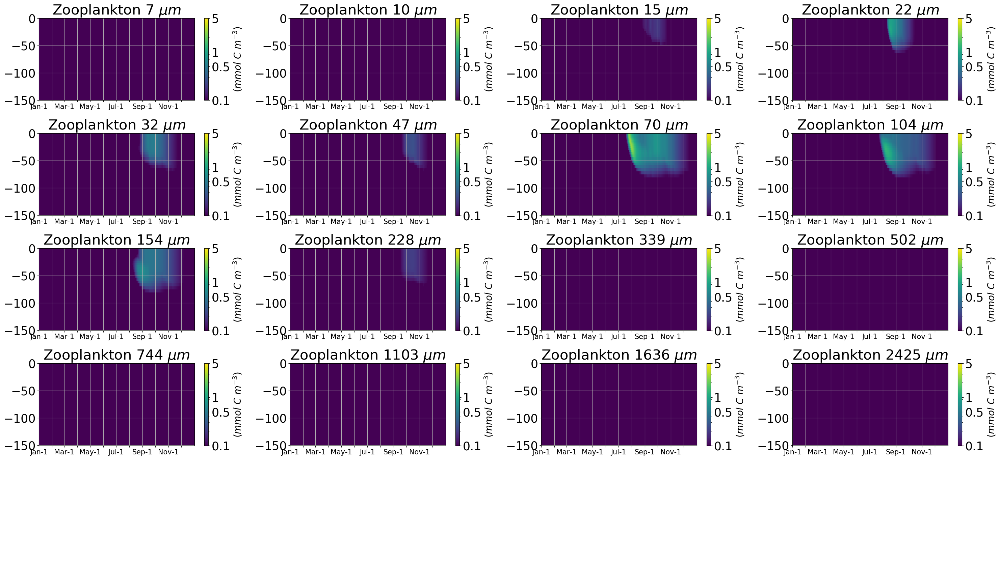

In [320]:
carfile='car.0000000000.t001.nc'
RF_above151=RF[RF>-151]
with plt.style.context('many_heat_maps.mplstyle'):
    locs=np.array([0, 31, 59, 90, 120, 151,
              181, 212, 243, 273, 304, 334])
    labels=('Jan-1','','Mar-1','','May-1','',
            'Jul-1','','Sep-1','','Nov-1','')
    fig,axs=plt.subplots(5,4,figsize=(30, 17))
    
    for itracer in range(54,70):
        varname='TRAC'+str(itracer).zfill(2)
        array2d_idepth_iT_modtracerfull=netcdf_tools.read_netcdf(carfile, varname)\
.squeeze().transpose()
        ax=axs[(itracer-54)//4,(itracer-54)%4]
        im=ax.pcolormesh(first_year366,
                         RF_above151,
                         array2d_idepth_iT_modtracerfull[0:(RF_above151.size)-1,
                                                         array1d_iT1y_iTtempo],
                         norm=mpl.colors.LogNorm(vmin=0.1,vmax=5))
        longname=get_longname(varname)
        ax.set_title(longname)
        ax.set_xticklabels([])
        ax.set_xlim(first_year366[0],first_year366[-1])
        ax.grid()
        ax.set_xticks(locs)
        ax.set_xticklabels(labels)
        ax.set_yticks([0,-50,-100,-150])
        fig.colorbar(im,
                     ax=ax,
                     ticks=[0.1,0.5,1,5],
                     format='%.1g',
                     label='$(mmol\ C\ m^{-3})$')
        
    # --- NOTHING
    ax=axs[4,0]
    ax.axis('off')
    ax=axs[4,1]
    ax.axis('off')
    ax=axs[4,2]
    ax.axis('off')
    ax=axs[4,3]
    ax.axis('off')
    
    fig.tight_layout()
    plt.savefig('car.0000000000.t001.year'\
                +str(iyeartempo)+'.zoo.png')

# Taylor diagrams

## Taylor diagram: all the observations

In [321]:
assert no3mod_df['doy'].equals(nutrients_df['doy']), \
"column doy in no3mod_df is different from column doy in nutrients_df"
assert no3mod_df['depth'].equals(nutrients_df['depth']), \
"column depth in no3mod_df is different from column depth in nutrients_df"
s=nutrients_df['no3'].copy()
s[s==0]=np.NaN
array1d_iobs_logno3obs=np.log10(s)
array1d_iobs_logno3mod =np.log10(no3mod_df['no3mod'])
refnstd=np.nanstd(array1d_iobs_logno3obs,ddof=1) \
/np.nanstd(array1d_iobs_logno3obs,ddof=1)
nstdlogno3=np.nanstd(array1d_iobs_logno3mod,ddof=1) \
/np.nanstd(array1d_iobs_logno3obs,ddof=1)
corrcoeflogno3=(pd.DataFrame(
    {'array1d_iobs_logno3obs':array1d_iobs_logno3obs,
    'array1d_iobs_logno3mod':array1d_iobs_logno3mod}) \
          .corr()).iloc[0,1]

In [322]:
assert sioh4mod_df['doy'].equals(nutrients_df['doy']), \
"column doy in sioh4mod_df is different from column doy in nutrients_df"
assert sioh4mod_df['depth'].equals(nutrients_df['depth']), \
"column depth in sioh4mod_df is different from column depth in nutrients_df"
s=nutrients_df['sioh4'].copy()
s[s==0]=np.NaN
array1d_iobs_logsioh4obs=np.log10(s)
array1d_iobs_logsioh4mod =np.log10(sioh4mod_df['sioh4mod'])
refnstd=np.nanstd(array1d_iobs_logsioh4obs,ddof=1) \
/np.nanstd(array1d_iobs_logsioh4obs,ddof=1)
nstdlogsioh4=np.nanstd(array1d_iobs_logsioh4mod,ddof=1) \
/np.nanstd(array1d_iobs_logsioh4obs,ddof=1)
corrcoeflogsioh4=(pd.DataFrame(
    {'array1d_iobs_logsioh4obs':array1d_iobs_logsioh4obs,
    'array1d_iobs_logsioh4mod':array1d_iobs_logsioh4mod}) \
          .corr()).iloc[0,1]

In [323]:
assert po4mod_df['doy'].equals(nutrients_df['doy']), \
"column doy in po4mod_df is different from column doy in nutrients_df"
assert po4mod_df['depth'].equals(nutrients_df['depth']), \
"column depth in po4mod_df is different from column depth in nutrients_df"
s=nutrients_df['po4'].copy()
s[s==0]=np.NaN
array1d_iobs_logpo4obs=np.log10(s)
array1d_iobs_logpo4mod =np.log10(po4mod_df['po4mod'])
refnstd=np.nanstd(array1d_iobs_logpo4obs,ddof=1) \
/np.nanstd(array1d_iobs_logpo4obs,ddof=1)
nstdlogpo4=np.nanstd(array1d_iobs_logpo4mod,ddof=1) \
/np.nanstd(array1d_iobs_logpo4obs,ddof=1)
corrcoeflogpo4=(pd.DataFrame(
    {'array1d_iobs_logpo4obs':array1d_iobs_logpo4obs,
    'array1d_iobs_logpo4mod':array1d_iobs_logpo4mod}) \
          .corr()).iloc[0,1]

In [324]:
array1d_iobs_logchlHPLC=np.log10(chlHPLC_df['chlHPLC'])
array1d_iobs_logchlmod =np.log10(chlmod_df['chlmod'])
refnstd=np.std(array1d_iobs_logchlHPLC,ddof=1) \
/np.std(array1d_iobs_logchlHPLC,ddof=1)
nstdlogchl=array1d_iobs_logchlmod.std(ddof=1) \
/array1d_iobs_logchlHPLC.std(ddof=1)
corrcoeflogchl=(pd.DataFrame(
    {'array1d_iobs_logchlHPLC':array1d_iobs_logchlHPLC,
    'array1d_iobs_logchlmod':array1d_iobs_logchlmod}) \
          .corr()).iloc[0,1]

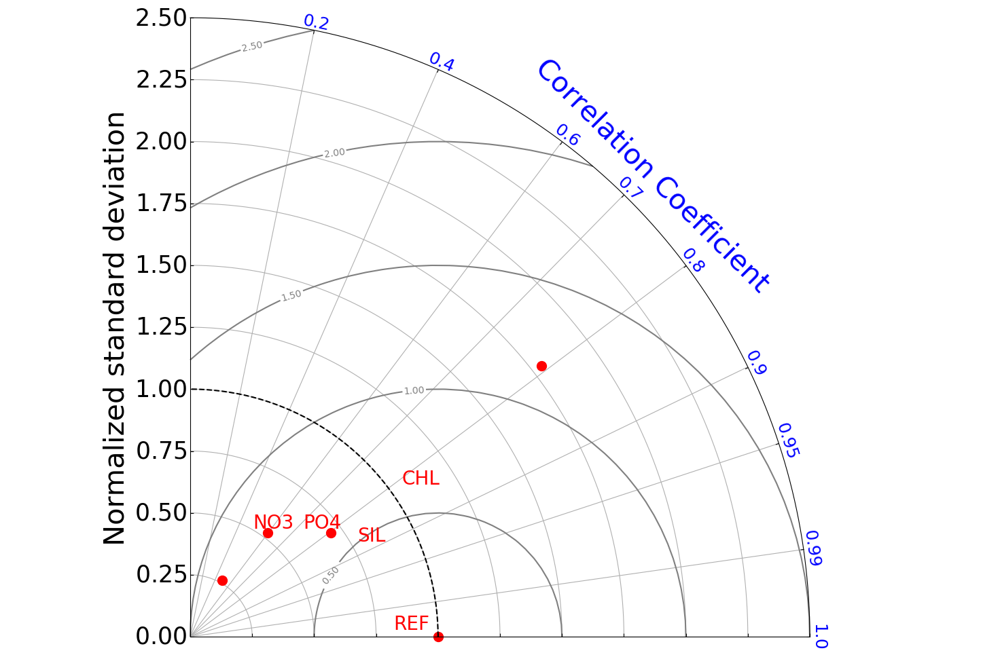

In [325]:
with plt.style.context('noice.mplstyle'):
    fig=plt.figure(figsize=(15,10))
    ax=plt.gca()
    plt.axis('off')
    dia=TaylorDiagramMBG.TaylorDiagram(refnstd,
                                    fig=fig,
                                    rect=111,
                                    label='Reference',
                                    srange=(0,2.5),
                                    extend=False)
    dia.add_sample(nstdlogchl,
                   corrcoeflogchl,
                   marker='o',
                   ms=10,
                   ls='',
                   mfc='red',
                   mec='red',
                   label='CHLp')
    dia.add_sample(nstdlogno3,
                   corrcoeflogno3,
                   marker='o',
                   ms=10,
                   ls='',
                   mfc='red',
                   mec='red',
                   label='NO3p')
    dia.add_sample(nstdlogsioh4,
                   corrcoeflogsioh4,
                   marker='o',
                   ms=10,
                   ls='',
                   mfc='red',
                   mec='red',
                   label='SILp')
    dia.add_sample(nstdlogpo4,
                   corrcoeflogpo4,
                   marker='o',
                   ms=10,
                   ls='',
                   mfc='red',
                   mec='red',
                   label='PO4p')
    dia.add_grid()
    contours=dia.add_contours(colors='0.5')
    plt.clabel(contours, inline=1, fontsize=10, fmt='%.2f')
    plt.text(0.42,0.26,'CHL',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, color='red', fontsize=20)
    plt.text(0.27,0.19,'NO3',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, color='red', fontsize=20)
    plt.text(0.37,0.17,'SIL',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, color='red', fontsize=20)
    plt.text(0.32,0.19,'PO4',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, color='red', fontsize=20)
    plt.text(0.41,0.03,'REF',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, color='red', fontsize=20)
    plt.tight_layout()
    plt.savefig('validation/GEic2016.taylor.m3.log.png')

In [326]:
array1d_iT_obslogmeanno3=np.log10(array1d_iT_obsmeanno3)
array1d_iT_modmeanno3nan=array1d_iT_modmeanno3.copy()
array1d_iT_modmeanno3nan[np.isnan(array1d_iT_obsmeanno3)]=np.NaN
array1d_iT_modlogmeanno3=np.log10(array1d_iT_modmeanno3nan)
refnstd=np.nanstd(array1d_iT_obslogmeanno3,ddof=1) \
/np.nanstd(array1d_iT_obslogmeanno3,ddof=1)
nstdmeanno3=np.nanstd(array1d_iT_modlogmeanno3,ddof=1) \
/np.nanstd(array1d_iT_obslogmeanno3,ddof=1)
corrcoefmeanno3=(pd.DataFrame(
    {'array1d_iT_obslogmeanno3':array1d_iT_obslogmeanno3,
    'array1d_iT_modlogmeanno3':array1d_iT_modlogmeanno3}) \
          .corr()).iloc[0,1]

In [327]:
nstdmeanno3

0.10138571003625578

In [328]:
corrcoefmeanno3

0.46975637835592676

In [329]:
array1d_iT_obslogmeansioh4=np.log10(array1d_iT_obsmeansioh4)
array1d_iT_modmeansioh4nan=array1d_iT_modmeansioh4.copy()
array1d_iT_modmeansioh4nan[np.isnan(array1d_iT_obsmeansioh4)]=np.NaN
array1d_iT_modlogmeansioh4=np.log10(array1d_iT_modmeansioh4nan)
refnstd=np.nanstd(array1d_iT_obslogmeansioh4,ddof=1) \
/np.nanstd(array1d_iT_obslogmeansioh4,ddof=1)
nstdmeansioh4=np.nanstd(array1d_iT_modlogmeansioh4,ddof=1) \
/np.nanstd(array1d_iT_obslogmeansioh4,ddof=1)
corrcoefmeansioh4=(pd.DataFrame(
    {'array1d_iT_obslogmeansioh4':array1d_iT_obslogmeansioh4,
    'array1d_iT_modlogmeansioh4':array1d_iT_modlogmeansioh4}) \
          .corr()).iloc[0,1]

In [330]:
nstdmeansioh4

0.36375957861183755

In [331]:
corrcoefmeansioh4

0.6747616708633443

In [332]:
array1d_iT_obslogmeanpo4=np.log10(array1d_iT_obsmeanpo4)
array1d_iT_modmeanpo4nan=array1d_iT_modmeanpo4.copy()
array1d_iT_modmeanpo4nan[np.isnan(array1d_iT_obsmeanpo4)]=np.NaN
array1d_iT_modlogmeanpo4=np.log10(array1d_iT_modmeanpo4nan)
refnstd=np.nanstd(array1d_iT_obslogmeanpo4,ddof=1) \
/np.nanstd(array1d_iT_obslogmeanpo4,ddof=1)
nstdmeanpo4=np.nanstd(array1d_iT_modlogmeanpo4,ddof=1) \
/np.nanstd(array1d_iT_obslogmeanpo4,ddof=1)
corrcoefmeanpo4=(pd.DataFrame(
    {'array1d_iT_obslogmeanpo4':array1d_iT_obslogmeanpo4,
    'array1d_iT_modlogmeanpo4':array1d_iT_modlogmeanpo4}) \
          .corr()).iloc[0,1]

In [333]:
nstdmeanpo4

0.24219437552131146

In [334]:
corrcoefmeanpo4

0.4342975875726481

In [335]:
array1d_iT_obslogmeanchlfluo=np.log10(array1d_iT_obsmeanchlfluo)
array1d_iT_obslogvintchlfluo=np.log10(array1d_iT_obsvintchlfluo)
array1d_iT_obslogmeanchlHPLC=np.log10(array1d_iT_obsmeanchlHPLC)
array1d_iT_obslogvintchlHPLC=np.log10(array1d_iT_obsvintchlHPLC)
array1d_iT_modmeanchlfnan=array1d_iT_modmeanchl.copy()
array1d_iT_modmeanchlfnan[np.isnan(array1d_iT_obsmeanchlfluo)]=np.NaN
array1d_iT_modlogmeanchlf=np.log10(array1d_iT_modmeanchlfnan)
array1d_iT_modvintchlfnan=array1d_iT_modvintchl.copy()
array1d_iT_modvintchlfnan[np.isnan(array1d_iT_obsvintchlfluo)]=np.NaN
array1d_iT_modlogvintchlf=np.log10(array1d_iT_modvintchlfnan)
array1d_iT_modmeanchlHnan=array1d_iT_modmeanchl.copy()
array1d_iT_modmeanchlHnan[np.isnan(array1d_iT_obsmeanchlHPLC)]=np.NaN
array1d_iT_modlogmeanchlH=np.log10(array1d_iT_modmeanchlHnan)
array1d_iT_modvintchlHnan=array1d_iT_modvintchl.copy()
array1d_iT_modvintchlHnan[np.isnan(array1d_iT_obsvintchlHPLC)]=np.NaN
array1d_iT_modlogvintchlH=np.log10(array1d_iT_modvintchlHnan)

refnstd=np.nanstd(array1d_iT_obslogmeanchlfluo,ddof=1)/np.nanstd(array1d_iT_obslogmeanchlfluo,ddof=1)
nstdmeanchlfluo=np.nanstd(array1d_iT_modlogmeanchlf,ddof=1)/np.nanstd(array1d_iT_obslogmeanchlfluo,ddof=1)
nstdvintchlfluo=np.nanstd(array1d_iT_modlogvintchlf,ddof=1)/np.nanstd(array1d_iT_obslogvintchlfluo,ddof=1)
nstdmeanchlHPLC=np.nanstd(array1d_iT_modlogmeanchlH,ddof=1)/np.nanstd(array1d_iT_obslogmeanchlHPLC,ddof=1)
nstdvintchlHPLC=np.nanstd(array1d_iT_modlogvintchlH,ddof=1)/np.nanstd(array1d_iT_obslogvintchlHPLC,ddof=1)

corrcoefmeanchlfluo=(pd.DataFrame(
    {'array1d_iT_obslogchl':array1d_iT_obslogmeanchlfluo,
    'array1d_iT_modlogchl':array1d_iT_modlogmeanchlf}) \
          .corr()).iloc[0,1]
corrcoefvintchlfluo=(pd.DataFrame(
    {'array1d_iT_obslogchl':array1d_iT_obslogvintchlfluo,
    'array1d_iT_modlogchl':array1d_iT_modlogvintchlf}) \
          .corr()).iloc[0,1]
corrcoefmeanchlHPLC=(pd.DataFrame(
    {'array1d_iT_obslogchl':array1d_iT_obslogmeanchlHPLC,
    'array1d_iT_modlogchl':array1d_iT_modlogmeanchlH}) \
          .corr()).iloc[0,1]
corrcoefvintchlHPLC=(pd.DataFrame(
    {'array1d_iT_obslogchl':array1d_iT_obslogvintchlHPLC,
    'array1d_iT_modlogchl':array1d_iT_modlogvintchlH}) \
          .corr()).iloc[0,1]

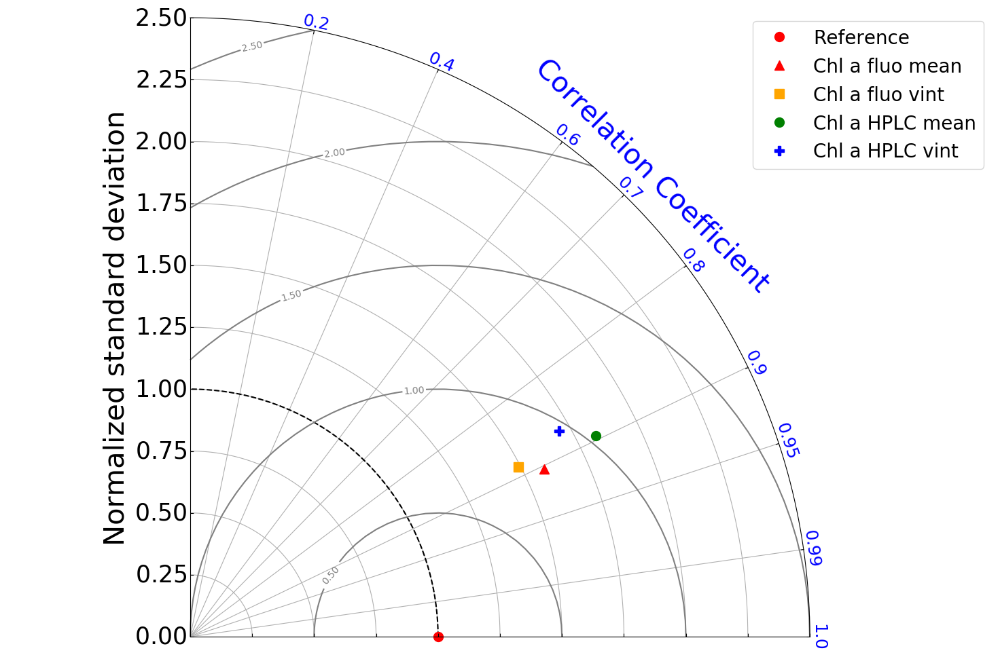

In [336]:
with plt.style.context('noice.mplstyle'):
    fig=plt.figure(figsize=(15,10))
    ax=plt.gca()
    plt.axis('off')
    dia=TaylorDiagramMBG.TaylorDiagram(refnstd,
                                    fig=fig,
                                    rect=111,
                                    label='Reference',
                                    srange=(0,2.5),
                                    extend=False)
    dia.add_sample(nstdmeanchlfluo,
                   corrcoefmeanchlfluo,
                   marker='^',
                   ms=10,
                   ls='',
                   mfc='red',
                   mec='red',
                   label='Chl a fluo mean')
    dia.add_sample(nstdvintchlfluo,
                   corrcoefvintchlfluo,
                   marker='s',
                   ms=10,
                   ls='',
                   mfc='orange',
                   mec='orange',
                   label='Chl a fluo vint')
    dia.add_sample(nstdmeanchlHPLC,
                   corrcoefmeanchlHPLC,
                   marker='o',
                   ms=10,
                   ls='',
                   mfc='green',
                   mec='green',
                   label='Chl a HPLC mean')
    dia.add_sample(nstdvintchlHPLC,
                   corrcoefvintchlHPLC,
                   marker='P',
                   ms=10,
                   ls='',
                   mfc='blue',
                   mec='blue',
                   label='Chl a HPLC vint')
    dia.add_grid()
    contours=dia.add_contours(colors='0.5')
    plt.clabel(contours, inline=1, fontsize=10, fmt='%.2f')
    ax.legend(dia.samplePoints,
              [ p.get_label() for p in dia.samplePoints],
              loc='upper right',
             fontsize=20)
    # plt.text(0.55,0.32,'label',
    #          horizontalalignment = 'center',verticalalignment='center',
    #          transform=ax.transAxes, color='red', fontsize=20)
    plt.tight_layout()
    plt.savefig('validation/GEic2016.taylor.mean.logchl.full.png')

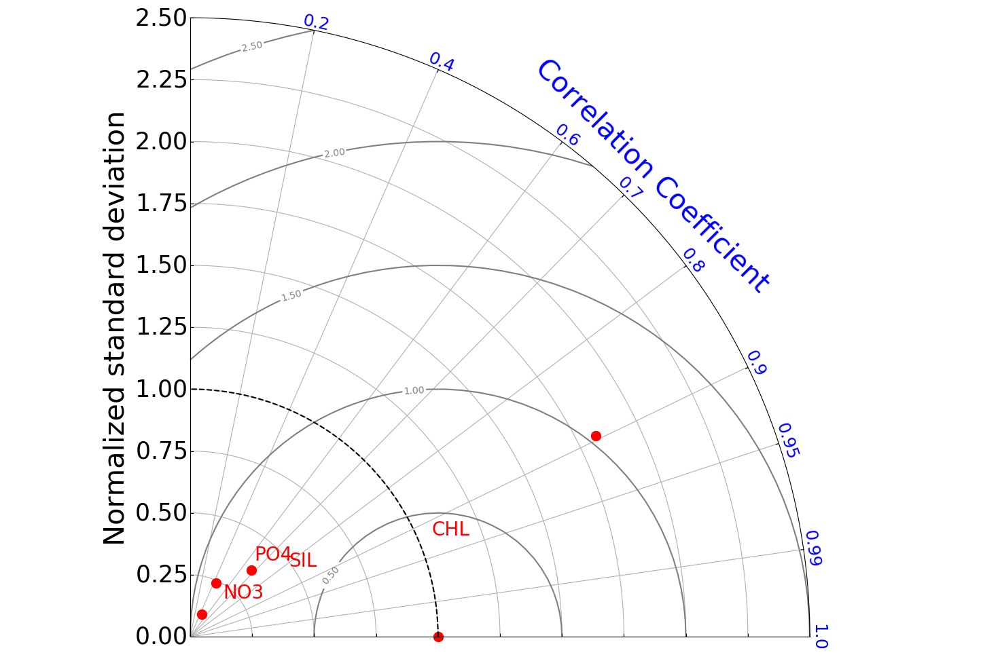

In [337]:
with plt.style.context('noice.mplstyle'):
    fig=plt.figure(figsize=(15,10))
    ax=plt.gca()
    plt.axis('off')
    dia=TaylorDiagramMBG.TaylorDiagram(refnstd,
                                    fig=fig,
                                    rect=111,
                                    label='Reference',
                                    srange=(0,2.5),
                                    extend=False)
    dia.add_sample(nstdmeanchlHPLC,
                   corrcoefmeanchlHPLC,
                   marker='o',
                   ms=10,
                   ls='',
                   mfc='red',
                   mec='red',
                   label='CHL')
    dia.add_sample(nstdmeanno3,
                   corrcoefmeanno3,
                   marker='o',
                   ms=10,
                   ls='',
                   mfc='red',
                   mec='red',
                   label='NO3')
    dia.add_sample(nstdmeansioh4,
                   corrcoefmeansioh4,
                   marker='o',
                   ms=10,
                   ls='',
                   mfc='red',
                   mec='red',
                   label='SIL')
    dia.add_sample(nstdmeanpo4,
                   corrcoefmeanpo4,
                   marker='o',
                   ms=10,
                   ls='',
                   mfc='red',
                   mec='red',
                   label='PO4')
    dia.add_grid()
    contours=dia.add_contours(colors='0.5')
    plt.clabel(contours, inline=1, fontsize=10, fmt='%.2f')
    # ax.legend(dia.samplePoints,
    #           [ p.get_label() for p in dia.samplePoints],
    #           loc='upper right',
    #          fontsize=20)
    plt.text(0.45,0.18,'CHL',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, color='red', fontsize=20)
    plt.text(0.24,0.08,'NO3',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, color='red', fontsize=20)
    plt.text(0.30,0.13,'SIL',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, color='red', fontsize=20)
    plt.text(0.27,0.14,'PO4',
             horizontalalignment = 'center',verticalalignment='center',
             transform=ax.transAxes, color='red', fontsize=20)
    plt.tight_layout()
    plt.savefig('validation/GEic2016.taylor.mean.log.png')

# Regression test

corrcoefmeanchlHPLC should be equal to 0.9287830594071884 (tenth year).

In [338]:
corrcoefmeanchlHPLC

0.8958463257543184